In [1]:
import torch
print(torch.cuda.get_device_properties(0).total_memory)

15640231936


In [1]:
import os
import cv2
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.model_selection import train_test_split
import time

import matplotlib.pyplot as plt


bucket_name = 'mountdata'
# Check if CUDA/GPU is available (optional but recommended for faster training)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


In [2]:
import tifffile
import glob
import pandas as pd

/home/angelats11/.local/lib/python3.9/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.0' or newer of 'numexpr' (version '2.7.3' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED
/home/angelats11/.local/lib/python3.9/site-packages/pandas/core/arrays/masked.py:62: UserWarning: Pandas requires version '1.3.4' or newer of 'bottleneck' (version '1.3.2' currently installed).
  from pandas.core import (


In [3]:
augment = False
filtered_columns = ['VH','VH_entropy', 'VH_stdDev','VV']
filtered_columns_coords = ['VH','VH_entropy', 'VH_stdDev','VV','latitude','longitude']


def preprocess_data_gcs_multi(bucket_name, prefix, region):
    # Initialize lists to store images and labels
    images = []
    labels = []
    paths = []
    imagesCHM = []
    s1 = []

    countries = os.listdir(os.path.join(bucket_name,prefix))
    # Iterate through the blobs

    if region == 'all':
        print('all countries included')
    elif region == 'east':
        print('manualEast')
        countries = ['manualEast']
    elif region == 'west':
        print('manualWest')
        if 'forest' in prefix:
            countries = ['manualWest']
        else:
            countries = ['manualWest']
    elif region == 'central':
        print('manualCentral')
        countries = ['manualCentral']

    elif region == 'val':
        print('sdptv2')
        if 'forest' in prefix:
            countries = []
        else:
            countries = ['sdptmanual-v2']
        #    countries = ['oil','coco']

    elif region == 'testoil': 
        print('Descals oil')
        countries = ['Descalsoil']
    elif region == 'testcoco': 
        print('Descals coco')
        countries = ['Descalscoco']


    elif region == 'mango':
        print('CIV')
        if 'forest' in prefix:
            countries = []
        else:
            countries = ['CIV']
    elif region == 'cashew':
        print('benin')
        if 'forest' in prefix:
            countries = ['benin']
        else:
            countries = ['benin']

    elif region == 'Fagan':
        print('fagan data 1 & 2')
        countries = ['Fagan', 'Fagan-Val']


    if 'orchard' in prefix:
        label = 1  # Assign class 0 if 'orchard' is in the filename
        prefixCHM = orchardpathCHM
        prefixcsv = orchardpathcsv
    else:
        label = 0  # Assign class 1 otherwise
        prefixCHM = forestpathCHM
        prefixcsv = forestpathcsv
    
    for country in countries:
        pattern = os.path.join(bucket_name,prefixcsv,country+'*.csv')
        #print(pattern)
        matching_files = glob.glob(pattern)
        dfs = []
        for fpcsv in matching_files:
            df = pd.read_csv(fpcsv)
            dfs.append(df[filtered_columns_coords])
        combined_df = pd.concat(dfs, ignore_index=True)
        combined_df['latitude'] = combined_df['latitude'].astype(str).str.slice(0,14)
        combined_df['longitude'] = combined_df['longitude'].astype(str).str.slice(0,14)
        
        for blob in os.listdir(os.path.join(bucket_name,prefix,country)):
            #print(blob)
            fp = os.path.join(bucket_name,prefixCHM,country,blob[:-12]+'.tif')
            if os.path.exists(fp):
                # Read and preprocess the image
                with open(os.path.join(bucket_name,prefix,country,blob), 'rb') as f:
                    # Get the byte data of the image
                    img = tifffile.imread(f)
                    img = img[:40,:40]
                    img = img.astype('float32')
                    #print(img.shape)
                    # Append the preprocessed image and label to the lists
                    if img.shape == (40,40,24):
                        images.append(img)
                        labels.append(label)
                        paths.append(os.path.join(bucket_name, prefix, country, blob[:-12]+'.tif'))
                        with open(fp, 'rb') as f2:
                            # Get the byte data of the image
                            img_bytes2 = f2.read()
                            img2 = cv2.imdecode(np.frombuffer(img_bytes2, np.uint8), cv2.IMREAD_GRAYSCALE)
                            img2 = img2[10:234, 10:234]  # Clip to central 40x40 pixels
                    
                            # Normalize pixel values to range [0, 1]
                            img2 = img2.astype('float32')# / 255.0
                    
                            # Append the preprocessed image and label to the lists
                            imagesCHM.append(img2)

                            latlon = blob[:-12].split('_')
                            lat = latlon[2][:14]
                            lon = latlon[4][:14]
                            #print(lat, lon)
                            matching_entry = combined_df[(combined_df['latitude'] == lat) & (combined_df['longitude'] == lon)][filtered_columns]
                            if matching_entry.empty:
                                s1.append(pd.DataFrame({'VH': [0.0], 'VH_entropy':[0.0], 'VH_stdDev':[0.0],'VV':[0.0]}))
                            else:
                                #print(matching_entry)
                                #print('iloc')
                                #print(matching_entry.iloc[0])
                                s1.append(matching_entry.iloc[0])#.values.flatten())
                                #print(s1)
                    else:
                        print('not 40x40',fp)


            else:
                print(fp)
    

    # Convert lists to numpy arrays
    images = np.array(images)
    imagesCHM = np.array(imagesCHM)
    labels = np.array(labels)

    return images, imagesCHM, s1, labels, paths


orchardpath = 's2NDVItsorchard-400m'
orchardpathCHM = 'chmorchard-224m'
orchardpathcsv = 's1orchard'
forestpath = 's2NDVItsforest-400m'
forestpathCHM = 'chmforest-224m'
forestpathcsv = 's1forest'


distshift = True

if not distshift:
    
    # Preprocess the data from GCS
    print('beginning the orchard data preprocessing')
    print(time.perf_counter())
    images, imagesCHM, imagesS1, labels, paths = preprocess_data_gcs_multi(bucket_name, orchardpath)
    
    print('finished the orchard data preprocessing')
    print(time.perf_counter())
    
    images2, imagesCHM2, imagesS12, labels2, paths2 = preprocess_data_gcs_multi(bucket_name, forestpath)
    
    print('finished the forest data preprocessing')
    print(time.perf_counter())


else:
    print('regional shifting')
    #for region in ['val', 'east', 'west', 'central']
    region = 'val'
    print('forest val processing ', region)
    print(time.perf_counter())
    images2, imagesCHM2, imagesS12, labels2, paths2 = preprocess_data_gcs_multi(bucket_name, forestpath, region)

    print('beginning the orchard data preprocessing ', region)
    print(time.perf_counter())
    images, imagesCHM, imagesS1, labels, paths = preprocess_data_gcs_multi(bucket_name, orchardpath, region)
    print('finished the orchard data preprocessing')
    print(time.perf_counter())

    region = 'east'
    imagese, imagesCHMe, imagesS1e, labelse, pathse = preprocess_data_gcs_multi(bucket_name, orchardpath, region)
    images2e, imagesCHM2e, imagesS12e, labels2e, paths2e = preprocess_data_gcs_multi(bucket_name, forestpath, region)

    region = 'west'
    imagesw, imagesCHMw, imagesS1w, labelsw, pathsw = preprocess_data_gcs_multi(bucket_name, orchardpath, region)
    images2w, imagesCHM2w, imagesS12w, labels2w, paths2w = preprocess_data_gcs_multi(bucket_name, forestpath, region)

    region = 'central'
    images_c, imagesCHM_c, imagesS1c, labels_c, paths_c = preprocess_data_gcs_multi(bucket_name, orchardpath, region)
    images2_c, imagesCHM2_c, imagesS12c, labels2_c, paths2_c = preprocess_data_gcs_multi(bucket_name, forestpath, region)

    print('finished all processing')
    print(time.perf_counter())


regional shifting
forest val processing  val
1700.9734769
sdptv2
beginning the orchard data preprocessing  val
1701.116873486
sdptv2
mountdata/chmorchard-224m/sdptmanual-v2/Image_Lat_1.0758119278020262_Lon_23.552842271234095.tif
mountdata/chmorchard-224m/sdptmanual-v2/Image_Lat_1.1207039806450367_Lon_23.467591026193634.tif
finished the orchard data preprocessing
1928.336663576
manualEast
manualEast
manualWest
manualWest
not 40x40 mountdata/chmforest-224m/manualWest/Image_Lat_13.001994050645857_Lon_-9.368638095981254.tif
manualCentral
manualCentral
finished all processing
3569.015478193


In [15]:
'''
print('EAST plt / forest')
print(len(imagese))
print(len(images2e))
print('WEST plt / forest')
print(len(imagesw))
print(len(images2w))
print('CENTRAL plt / forest')
print(len(images_c))
print(len(images2_c))
print('SDPT plt count')
print(len(images))
EAST plt / forest
528
1021
WEST plt / forest
13473
9745
CENTRAL plt / forest
458
1001
SDPT plt count
899
'''

"\nprint('EAST plt / forest')\nprint(len(imagese))\nprint(len(images2e))\nprint('WEST plt / forest')\nprint(len(imagesw))\nprint(len(images2w))\nprint('CENTRAL plt / forest')\nprint(len(images_c))\nprint(len(images2_c))\nprint('SDPT plt count')\nprint(len(images))\nEAST plt / forest\n528\n1021\nWEST plt / forest\n13473\n9745\nCENTRAL plt / forest\n458\n1001\nSDPT plt count\n899\n"

In [16]:
#7666 points unaugmented points total from Oil Palm, Coconut Palm, Releaf sampling, and SDPT Manual
#4056
#3610

#11494 points unaugmented points total from oil palm, coco, releaf, sdpt, benin, and ghana manual
#7817
#3677

In [4]:
import torchvision.models as models
from torch.utils.data import Dataset
from torchvision import transforms

augmentation_transforms = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ToTensor(),  # Ensure your images are converted to tensors
    # Add any other transformations as needed
])


class PairedImageDataset(Dataset):
    def __init__(self, grayscale_images, band24_images, s1_tabular, labels,paths,transform=transforms.ToTensor()):#augmentation_transforms):
        self.grayscale_images = grayscale_images
        self.band24_images = band24_images
        self.s1_tabular = s1_tabular
        self.labels = labels
        self.paths = paths
        self.transform = transform

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        grayscale_image = self.grayscale_images[idx]
        band24_image = self.band24_images[idx]
        tabular_features = self.s1_tabular[idx]
        label = self.labels[idx]
        path = self.paths[idx]

        # Convert images to PIL format if needed
        if isinstance(grayscale_image, torch.Tensor):
            grayscale_image = transforms.ToPILImage()(grayscale_image)
        if isinstance(band24_image, torch.Tensor):
            band24_image = transforms.ToPILImage()(band24_image)

        # Apply transformations if defined
        if self.transform:
            grayscale_image = self.transform(grayscale_image)
            band24_image = self.transform(band24_image)

        return grayscale_image, band24_image, tabular_features, label, path

    def concatenate(self, datasets):
        """
        Concatenates multiple PairedImageDatasets into a longer dataset.
        
        Args:
            datasets (list): List of PairedImageDataset instances to concatenate.
            
        Returns:
            PairedImageDataset: Concatenated dataset.
        """
        # Initialize concatenated data with the current dataset
        grayscale_images_concat = self.grayscale_images
        band24_images_concat = self.band24_images
        tabular_concat = self.s1_tabular
        labels_concat = self.labels
        paths_concat = self.paths

        # Iterate over each additional dataset and concatenate their data
        for dataset in datasets:
            grayscale_images_concat = torch.cat((grayscale_images_concat, dataset.grayscale_images), dim=0)
            band24_images_concat = torch.cat((band24_images_concat, dataset.band24_images), dim=0)
            tabular_concat = torch.cat((tabular_concat, dataset.s1_tabular), dim=0)
            labels_concat = np.concatenate((labels_concat, dataset.labels), axis=0)
            paths_concat = np.concatenate((paths_concat, dataset.paths), axis=0)

        # Create and return a new concatenated PairedImageDataset
        concatenated_dataset = PairedImageDataset(grayscale_images_concat, band24_images_concat, tabular_concat, labels_concat, paths_concat)

        return concatenated_dataset


In [8]:
values = [df.values.flatten() for df in imagesS1e]
imgsS1e = np.array(values)
values = [df.values.flatten() for df in imagesS12e]
imgsS12e = np.array(values)
values = [df.values.flatten() for df in imagesS1w]
imgsS1w = np.array(values)
values = [df.values.flatten()[:4] for df in imagesS12w]
imgsS12w = np.array(values)
values = [df.values.flatten() for df in imagesS1c]
imgsS1c = np.array(values)
values = [df.values.flatten() for df in imagesS12c]
imgsS12c = np.array(values)
values = [df.values.flatten() for df in imagesS1]
imgsS1 = np.array(values)

In [ ]:
'''
del train_datasete, train_datasetw, train_datasetc, full_val_ds, full_trn_ds, cocotrain_dataset, cashtrain_dataset, civtrain_dataset, oiltrain_dataset, ftrain_dataset
del train_loadere, train_loaderw, train_loaderc, full_val_loader,  
del cocoval_dataset, cashval_dataset, civval_dataset, oilval_dataset, fval_dataset
'''

In [9]:

if distshift:
    imgse = np.concatenate((imagese,images2e))
    imgsCHMe = np.concatenate((imagesCHMe,imagesCHM2e))
    imgsS1e = np.concatenate((imgsS1e,imgsS12e))
    labse = np.concatenate((labelse,labels2e))
    pthse = np.concatenate((pathse,paths2e))
    train_imagese, val_imagese, train_imagesCHMe, val_imagesCHMe, train_imagesS1e, val_imagesS1e,  train_labelse, val_labelse, train_pathse, val_pathse = train_test_split(imgse, imgsCHMe, imgsS1e, labse, pthse, test_size=0.2, random_state=42)

    imgsw = np.concatenate((imagesw,images2w))
    imgsCHMw = np.concatenate((imagesCHMw,imagesCHM2w))
    imgsS1w = np.concatenate((imgsS1w,imgsS12w))
    labsw = np.concatenate((labelsw,labels2w))
    pthsw = np.concatenate((pathsw,paths2w))
    train_imagesw, val_imagesw, train_imagesCHMw, val_imagesCHMw, train_imagesS1w, val_imagesS1w, train_labelsw, val_labelsw, train_pathsw, val_pathsw = train_test_split(imgsw, imgsCHMw, imgsS1w, labsw, pthsw, test_size=0.2, random_state=42)

    imgsc = np.concatenate((images_c,images2_c))
    imgsCHMc = np.concatenate((imagesCHM_c,imagesCHM2_c))
    imgsS1c = np.concatenate((imgsS1c,imgsS12c))
    labsc = np.concatenate((labels_c,labels2_c))
    pthsc = np.concatenate((paths_c,paths2_c))
    train_imagesc, val_imagesc, train_imagesCHMc, val_imagesCHMc, train_imagesS1c, val_imagesS1c, train_labelsc, val_labelsc, train_pathsc, val_pathsc = train_test_split(imgsc, imgsCHMc, imgsS1c, labsc, pthsc, test_size=0.2, random_state=42)

    sdptimgs = images
    sdptimgsCHM = imagesCHM
    sdptimgsS1 = imgsS1
    sdptlabs = labels

    train_images_tensore = torch.tensor(train_imagese.astype('float32')).permute(0, 3, 1, 2)
    train_images_tensorw = torch.tensor(train_imagesw.astype('float32')).permute(0, 3, 1, 2)
    train_images_tensorc = torch.tensor(train_imagesc.astype('float32')).permute(0, 3, 1, 2)
    sdpt_images_tensor = torch.tensor(sdptimgs.astype('float32')).permute(0, 3, 1, 2)

    channel_indices = [5, 11, 17, 23]
    train_images_tensore = train_images_tensore[:, channel_indices, :, :]
    train_images_tensorw = train_images_tensorw[:, channel_indices, :, :]
    train_images_tensorc = train_images_tensorc[:, channel_indices, :, :]
    sdpt_images_tensor = sdpt_images_tensor[:, channel_indices, :, :]

    train_labels_tensore = torch.tensor(train_labelse)
    train_labels_tensorw = torch.tensor(train_labelsw)
    train_labels_tensorc = torch.tensor(train_labelsc)
    sdpt_labels_tensor = torch.tensor(sdptlabs)

    val_images_tensore = torch.tensor(val_imagese).permute(0, 3, 1, 2) #.unsqueeze(1)  # Add a channel dimension
    val_images_tensore = val_images_tensore[:, channel_indices, :, :]
    val_images_tensorw = torch.tensor(val_imagesw).permute(0, 3, 1, 2) #.unsqueeze(1)  # Add a channel dimension
    val_images_tensorw = val_images_tensorw[:, channel_indices, :, :]
    val_images_tensorc = torch.tensor(val_imagesc).permute(0, 3, 1, 2) #.unsqueeze(1)  # Add a channel dimension
    val_images_tensorc = val_images_tensorc[:, channel_indices, :, :]
    val_labels_tensore = torch.tensor(val_labelse)
    val_labels_tensorw = torch.tensor(val_labelsw)
    val_labels_tensorc = torch.tensor(val_labelsc)

    '''
    train_pathse = torch.tensor(train_pathse)
    train_pathsw = torch.tensor(train_pathsw)
    train_pathsc = torch.tensor(train_pathsc)

    val_pathse = torch.tensor(val_pathse)
    val_pathsw = torch.tensor(val_pathsw)
    val_pathsc = torch.tensor(val_pathsc)
    '''

    train_imagesCHM_tensore = torch.tensor(train_imagesCHMe,dtype=torch.float32).unsqueeze(1).float()#.permute(2, 0, 1)#.unsqueeze(1)  # Add a channel dimension
    val_imagesCHM_tensore = torch.tensor(val_imagesCHMe,dtype=torch.float32).unsqueeze(1).float()#.permute(2, 0, 1)#.unsqueeze(1)  # Add a channel dimension
    train_imagesCHM_tensorw = torch.tensor(train_imagesCHMw,dtype=torch.float32).unsqueeze(1).float()#.permute(2, 0, 1)#.unsqueeze(1)  # Add a channel dimension
    val_imagesCHM_tensorw = torch.tensor(val_imagesCHMw,dtype=torch.float32).unsqueeze(1).float()#.permute(2, 0, 1)#.unsqueeze(1)  # Add a channel dimension
    train_imagesCHM_tensorc = torch.tensor(train_imagesCHMc,dtype=torch.float32).unsqueeze(1).float()#.permute(2, 0, 1)#.unsqueeze(1)  # Add a channel dimension
    val_imagesCHM_tensorc = torch.tensor(val_imagesCHMc,dtype=torch.float32).unsqueeze(1).float()#.permute(2, 0, 1)#.unsqueeze(1)  # Add a channel dimension
    sdpt_imagesCHM_tensor = torch.tensor(sdptimgsCHM,dtype=torch.float32).unsqueeze(1).float()#.permute(2, 0, 1)#.unsqueeze(1)  # Add a channel dimension

    normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])

    train_imagesS1_tensore = torch.tensor(train_imagesS1e)
    train_imagesS1_tensorw = torch.tensor(train_imagesS1w)
    train_imagesS1_tensorc = torch.tensor(train_imagesS1c)
    #sdpt_imagesS1_tensor = torch.tensor(sdptimgsS1)
    val_imagesS1_tensore = torch.tensor(val_imagesS1e)
    val_imagesS1_tensorw = torch.tensor(val_imagesS1w)
    val_imagesS1_tensorc = torch.tensor(val_imagesS1c)
    sdpt_imagesS1_tensor = torch.tensor(sdptimgsS1)
    
            
    # Use the custom dataset class
    train_datasete = PairedImageDataset(train_images_tensore, train_imagesCHM_tensore, train_imagesS1_tensore, train_labelse, train_pathse)
    val_datasete = PairedImageDataset(val_images_tensore, val_imagesCHM_tensore, val_imagesS1_tensore, val_labelse, val_pathse)
    train_loadere = DataLoader(train_datasete, batch_size=32, shuffle=True)
    val_loadere = DataLoader(val_datasete, batch_size=32)

#    etestw_loader = DataLoader(PairedImageDataset(torch.cat((train_images_tensorw,val_images_tensorw)), torch.cat((train_labelsw,val_labelsw)) ), batch_size=32)    
#    etestc_loader = DataLoader(PairedImageDataset(torch.cat((train_images_tensorc,val_images_tensorc)), torch.cat((train_labelsc,val_labelsc)) ), batch_size=32)    

    train_datasetw = PairedImageDataset(train_images_tensorw, train_imagesCHM_tensorw, train_imagesS1_tensorw, train_labelsw, train_pathsw)
    val_datasetw = PairedImageDataset(val_images_tensorw, val_imagesCHM_tensorw,val_imagesS1_tensorw,val_labelsw, val_pathsw)
    train_loaderw = DataLoader(train_datasetw, batch_size=32, shuffle=True)
    val_loaderw = DataLoader(val_datasetw, batch_size=32)
    
    train_datasetc = PairedImageDataset(train_images_tensorc, train_imagesCHM_tensorc, train_imagesS1_tensorc,train_labelsc, train_pathsc)
    val_datasetc = PairedImageDataset(val_images_tensorc, val_imagesCHM_tensorc,val_imagesS1_tensorc, val_labelsc, val_pathsc)
    train_loaderc = DataLoader(train_datasetc, batch_size=32, shuffle=True)
    val_loaderc = DataLoader(val_datasetc, batch_size=32)

    sdpt_dataset = PairedImageDataset(sdpt_images_tensor, sdpt_imagesCHM_tensor, sdpt_imagesS1_tensor, sdptlabs, paths)
    sdpt_loader = DataLoader(sdpt_dataset, batch_size=32, shuffle=True)

    #full_val_ds = sdpt_dataset.concatenate([val_datasete,val_datasetw,val_datasetc])
    #(torch.cat(sdpt_images_tensor, val_images_tensore, val_images_tensorw, val_images_tensorc), 
    #                                 torch.cat(sdpt_imagesCHM_tensor, val_imagesCHM_tensore, val_imagesCHM_tensorw, val_imagesCHM_tensorc), 
    #                                 torch.cat(sdpt_labels, val_labelse, val_labelsw, val_labelsc))
    #full_val_loader = DataLoader(full_val_ds,batch_size=32,shuffle=True)


In [10]:
print('starting up some new tif reading for mango, cashew')
print(time.perf_counter())
region = 'mango'
civimages, civimagesCHM, civS1, civlabels ,civpaths = preprocess_data_gcs_multi(bucket_name, orchardpath,region)
region = 'cashew'
cashimages, cashimagesCHM, cashS1, cashlabels, cashpaths = preprocess_data_gcs_multi(bucket_name, orchardpath, region)
cashimages2, cashimagesCHM2, cashS12, cashlabels2, cashpaths2 = preprocess_data_gcs_multi(bucket_name, forestpath, region)
print(time.perf_counter())


starting up some new tif reading for mango, cashew
5111.063502822
CIV
benin
not 40x40 mountdata/chmorchard-224m/benin/Image_Lat_9.001862521060138_Lon_2.4133059647365647.tif
benin
not 40x40 mountdata/chmforest-224m/benin/Image_Lat_9.001854806976363_Lon_2.5024834288973117.tif
not 40x40 mountdata/chmforest-224m/benin/Image_Lat_9.001926761650227_Lon_2.441314813659174.tif
not 40x40 mountdata/chmforest-224m/benin/Image_Lat_9.001930816980428_Lon_2.5533627172326505.tif
9605.856230123


In [ ]:
print(len(cashimages), len(cashimages2), len(cashS1),len(cashS12))

In [11]:
channel_indices = [5, 11, 17, 23]

values = [df.values.flatten() for df in cashS1]
cashimgsS1 = np.array(values)

values = [df.values.flatten() for df in cashS12]
cashimgsS12 = np.array(values)

cashimgs = np.concatenate((cashimages,cashimages2))
cashimgsCHM = np.concatenate((cashimagesCHM,cashimagesCHM2))
cashimgsS1 = np.concatenate((cashimgsS1,cashimgsS12))
print(cashimgsS1)
cashlabs = np.concatenate((cashlabels,cashlabels2))
cashpths = np.concatenate((cashpaths,cashpaths2))
#cashpths = np.ones_like(cashlabs)

cashtrain_images, cashval_images, cashtrain_imagesCHM, cashval_imagesCHM, cashtrain_imagesS1, cashval_imagesS1, cashtrain_labels, cashval_labels, cashtrain_paths, cashval_paths = train_test_split(cashimgs, cashimgsCHM, cashimgsS1, cashlabs, cashpths, test_size=0.2, random_state=42)

"""
#keep in case you want to load ALL cashew as train
cashtrainimages_tensor = torch.tensor(cashimgs.astype('float32')).permute(0, 3, 1, 2)
cashtrainimages_tensor = cashtrainimages_tensor[:, channel_indices, :, :]
cashtrainimagesCHM_tensor = torch.tensor(cashimgsCHM, dtype=torch.float32).unsqueeze(1).float() #.permute(2, 0, 1)#.unsqueeze(1)  # Add a channel dimension
cashtrainS1_tensor = torch.tensor(cashimgsS1)
cashtrain_dataset = PairedImageDataset(cashtrainimages_tensor, cashtrainimagesCHM_tensor, cashtrainS1_tensor, cashlabs, cashpaths)
cashtrain_loader = DataLoader(cashtrain_dataset, batch_size=32, shuffle=True)
"""
cashtrainimages_tensor = torch.tensor(cashtrain_images.astype('float32')).permute(0, 3, 1, 2)
cashtrainimages_tensor = cashtrainimages_tensor[:, channel_indices, :, :]
cashtrainimagesCHM_tensor = torch.tensor(cashtrain_imagesCHM, dtype=torch.float32).unsqueeze(1).float() #.permute(2, 0, 1)#.unsqueeze(1)  # Add a channel dimension
cashtrainS1_tensor = torch.tensor(cashtrain_imagesS1)
cashtrain_dataset = PairedImageDataset(cashtrainimages_tensor, cashtrainimagesCHM_tensor, cashtrainS1_tensor, cashtrain_labels, cashtrain_paths)
cashtrain_loader = DataLoader(cashtrain_dataset, batch_size=32, shuffle=True)

cashvalimages_tensor = torch.tensor(cashval_images.astype('float32')).permute(0, 3, 1, 2)
cashvalimages_tensor = cashvalimages_tensor[:, channel_indices, :, :]
cashvalimagesCHM_tensor = torch.tensor(cashval_imagesCHM, dtype=torch.float32).unsqueeze(1).float()  # Add a channel dimension
cashvalS1_tensor = torch.tensor(cashval_imagesS1)
cashval_dataset = PairedImageDataset(cashvalimages_tensor, cashvalimagesCHM_tensor, cashvalS1_tensor, cashval_labels, cashval_paths)
cashval_loader = DataLoader(cashval_dataset, batch_size=32, shuffle=True)


'''
values = [df.values.flatten() for df in civS1]
civimgsS1 = np.array(values)
civtrainimages_tensor = torch.tensor(civimages.astype('float32')).permute(0, 3, 1, 2)
civtrainimages_tensor = civtrainimages_tensor[:, channel_indices, :, :]
civtrainlabels_tensor = torch.tensor(civlabels)
civtrainimagesCHM_tensor = torch.tensor(civimagesCHM, dtype=torch.float32).unsqueeze(1).float() #.permute(2, 0, 1)#.unsqueeze(1)  # Add a channel dimension
civtrainimagesS1_tensor = torch.tensor(civimgsS1)
civtrain_dataset = PairedImageDataset(civtrainimages_tensor, civtrainimagesCHM_tensor, civtrainimagesS1_tensor,civlabels, civpaths)
civtrain_loader = DataLoader(civtrain_dataset, batch_size=32, shuffle=True)
'''
#values = [df.values.flatten() for df in cashS1[:-1]]
#civS1 = np.array(values)
'''
civtrain_images, civval_images, civtrain_imagesCHM, civval_imagesCHM, civtrain_imagesS1, civval_imagesS1, civtrain_labels, civval_labels, civtrain_paths, civval_paths = train_test_split(civimages, civimagesCHM, civS1, civlabels, civpaths, test_size=0.2, random_state=42)

civtrainimages_tensor = torch.tensor(civtrain_images.astype('float32')).permute(0, 3, 1, 2)
civtrainimages_tensor = civtrainimages_tensor[:, channel_indices, :, :]
civtrainimagesCHM_tensor = torch.tensor(civtrain_imagesCHM, dtype=torch.float32).unsqueeze(1).float()  # Add a channel dimension
civtrainS1_tensor = torch.tensor(civtrain_imagesS1)
civtrain_dataset = PairedImageDataset(civtrainimages_tensor, civtrainimagesCHM_tensor, civtrainS1_tensor, civtrain_labels, civtrain_paths)
civtrain_loader = DataLoader(civtrain_dataset, batch_size=32, shuffle=True)

civvalimages_tensor = torch.tensor(civval_images.astype('float32')).permute(0, 3, 1, 2)
civvalimages_tensor = civvalimages_tensor[:, channel_indices, :, :]
civvalimagesCHM_tensor = torch.tensor(civval_imagesCHM, dtype=torch.float32).unsqueeze(1).float()  # Add a channel dimension
civvalS1_tensor = torch.tensor(civval_imagesS1)
civval_dataset = PairedImageDataset(civvalimages_tensor, civvalimagesCHM_tensor, civvalS1_tensor, civval_labels, civval_paths)
civval_loader = DataLoader(civval_dataset, batch_size=32, shuffle=True)


print('all loaded and done')
'''

[[-15.55652687   0.8598649    2.14018719  -8.92065235]
 [-16.46941513   1.17326498   2.62630709  -9.87472166]
 [-16.29568257   1.03854804   2.16850355  -9.5425593 ]
 ...
 [-14.70807815   1.28057339   2.37426506  -7.92568106]
 [-14.22367751   1.34499543   2.05255355  -7.83777399]
 [-14.65289028   1.32527072   2.20719005  -8.18174096]]


"\ncivtrain_images, civval_images, civtrain_imagesCHM, civval_imagesCHM, civtrain_imagesS1, civval_imagesS1, civtrain_labels, civval_labels, civtrain_paths, civval_paths = train_test_split(civimages, civimagesCHM, civS1, civlabels, civpaths, test_size=0.2, random_state=42)\n\ncivtrainimages_tensor = torch.tensor(civtrain_images.astype('float32')).permute(0, 3, 1, 2)\ncivtrainimages_tensor = civtrainimages_tensor[:, channel_indices, :, :]\ncivtrainimagesCHM_tensor = torch.tensor(civtrain_imagesCHM, dtype=torch.float32).unsqueeze(1).float()  # Add a channel dimension\ncivtrainS1_tensor = torch.tensor(civtrain_imagesS1)\ncivtrain_dataset = PairedImageDataset(civtrainimages_tensor, civtrainimagesCHM_tensor, civtrainS1_tensor, civtrain_labels, civtrain_paths)\ncivtrain_loader = DataLoader(civtrain_dataset, batch_size=32, shuffle=True)\n\ncivvalimages_tensor = torch.tensor(civval_images.astype('float32')).permute(0, 3, 1, 2)\ncivvalimages_tensor = civvalimages_tensor[:, channel_indices, :, :

In [12]:
civimgs = np.concatenate((civimages,cashimages2))
civimgsCHM = np.concatenate((civimagesCHM,cashimagesCHM2))
#civS1 = np.concatenate((civS1,cashimgsS12))
#print(cashimgsS1)
civlabs = np.concatenate((civlabels,cashlabels2))
civpths = np.concatenate((civpaths,cashpaths2))

civimgs = civimages
civimgsCHM = civimagesCHM
civlabs = civlabels
civpths = civpaths

values = [df.values.flatten() for df in civS1]
#vals = values #+ [df.values.flatten() for df in cashS12]
civimgsS1 = np.array(values)
civtrainimages_tensor = torch.tensor(civimgs.astype('float32')).permute(0, 3, 1, 2)
civtrainimages_tensor = civtrainimages_tensor[:, channel_indices, :, :]
civtrainlabels_tensor = torch.tensor(civlabs)
civtrainimagesCHM_tensor = torch.tensor(civimgsCHM, dtype=torch.float32).unsqueeze(1).float() #.permute(2, 0, 1)#.unsqueeze(1)  # Add a channel dimension
civtrainimagesS1_tensor = torch.tensor(civimgsS1)
civtrain_dataset = PairedImageDataset(civtrainimages_tensor, civtrainimagesCHM_tensor, civtrainimagesS1_tensor,civlabs, civpths)
civtrain_loader = DataLoader(civtrain_dataset, batch_size=32, shuffle=True)

#print(civ
civtrain_images, civval_images, civtrain_imagesCHM, civval_imagesCHM, civtrain_imagesS1, civval_imagesS1, civtrain_labels, civval_labels, civtrain_paths, civval_paths = train_test_split(civimages, civimagesCHM, civimgsS1, civlabels, civpaths, test_size=0.2, random_state=42)

civtrainimages_tensor = torch.tensor(civtrain_images.astype('float32')).permute(0, 3, 1, 2)
civtrainimages_tensor = civtrainimages_tensor[:, channel_indices, :, :]
civtrainimagesCHM_tensor = torch.tensor(civtrain_imagesCHM, dtype=torch.float32).unsqueeze(1).float()  # Add a channel dimension
civtrainS1_tensor = torch.tensor(civtrain_imagesS1)
civtrain_dataset = PairedImageDataset(civtrainimages_tensor, civtrainimagesCHM_tensor, civtrainS1_tensor, civtrain_labels, civtrain_paths)
civtrain_loader = DataLoader(civtrain_dataset, batch_size=32, shuffle=True)

civvalimages_tensor = torch.tensor(civval_images.astype('float32')).permute(0, 3, 1, 2)
civvalimages_tensor = civvalimages_tensor[:, channel_indices, :, :]
civvalimagesCHM_tensor = torch.tensor(civval_imagesCHM, dtype=torch.float32).unsqueeze(1).float()  # Add a channel dimension
civvalS1_tensor = torch.tensor(civval_imagesS1)
civval_dataset = PairedImageDataset(civvalimages_tensor, civvalimagesCHM_tensor, civvalS1_tensor, civval_labels, civval_paths)
civval_loader = DataLoader(civval_dataset, batch_size=32, shuffle=True)


print('all loaded and done')


all loaded and done


In [13]:
print('beginning coco')
region = 'testcoco'
cocoimages, cocoimagesCHM, cocoimgsS1, cocolabels, cocopaths = preprocess_data_gcs_multi(bucket_name, orchardpath,region)
print('finished coco orchards')
cocoimages2, cocoimagesCHM2, cocoimgsS12, cocolabels2, cocopaths2 = preprocess_data_gcs_multi(bucket_name, forestpath,region)
print('finished the oil and coco')

cocoimgs = np.concatenate((cocoimages, cocoimages2))
cocoimgsCHM = np.concatenate((cocoimagesCHM, cocoimagesCHM2))
cocoimgsS1 = np.concatenate((cocoimgsS1,cocoimgsS12))
cocolabs = np.concatenate((cocolabels, cocolabels2))
cocopths = np.concatenate((cocopaths, cocopaths2))
cocotrainimages, cocovalimages, cocotrainimagesCHM, cocovalimagesCHM, cocotrainimagesS1, cocovalimagesS1, cocotrainlabels, cocovallabels, cocotrainpaths, cocovalpaths = train_test_split(cocoimgs, cocoimgsCHM, cocoimgsS1, cocolabs, cocopths, test_size=0.2, random_state=42)



beginning coco
Descals coco
mountdata/chmorchard-224m/Descalscoco/Image_Lat_10.837501759619093_Lon_-13.445835084428044.tif
mountdata/chmorchard-224m/Descalscoco/Image_Lat_4.187501667381544_Lon_9.412497917767288.tif
mountdata/chmorchard-224m/Descalscoco/Image_Lat_4.9958341290470525_Lon_7.379165673800177.tif
finished coco orchards
Descals coco
mountdata/chmforest-224m/Descalscoco/Image_Lat_-0.6791656814503417_Lon_9.129166636831334.tif
mountdata/chmforest-224m/Descalscoco/Image_Lat_-0.6958338011881224_Lon_9.945833158365735.tif
mountdata/chmforest-224m/Descalscoco/Image_Lat_-0.9625014214873463_Lon_40.84583385517486.tif
mountdata/chmforest-224m/Descalscoco/Image_Lat_-0.9708354813562368_Lon_40.020833273771565.tif
mountdata/chmforest-224m/Descalscoco/Image_Lat_-1.254166762292188_Lon_39.96249931379039.tif
mountdata/chmforest-224m/Descalscoco/Image_Lat_-1.4874981431158505_Lon_9.879165138515665.tif
mountdata/chmforest-224m/Descalscoco/Image_Lat_-10.087498798833712_Lon_14.662500806860752.tif
moun

In [14]:

cocotrainimages_tensor = torch.tensor(cocotrainimages.astype('float32')).permute(0, 3, 1, 2)
cocotrainimages_tensor = cocotrainimages_tensor[:, channel_indices, :, :]
cocotrainlabels_tensor = torch.tensor(cocotrainlabels)
cocovalimages_tensor = torch.tensor(cocovalimages).permute(0, 3, 1, 2) #.unsqueeze(1)  # Add a channel dimension
cocovalimages_tensor = cocovalimages_tensor[:, channel_indices, :, :]
cocovallabels_tensor = torch.tensor(cocovallabels)
cocotrainimagesCHM_tensor = torch.tensor(cocotrainimagesCHM, dtype=torch.float32).unsqueeze(1).float() #.permute(2, 0, 1)#.unsqueeze(1)  # Add a channel dimension
cocovalimagesCHM_tensor = torch.tensor(cocovalimagesCHM, dtype=torch.float32).unsqueeze(1).float() #.permute(2, 0, 1)#.unsqueeze(1)  # Add a channel dimension
cocotrainimagesS1_tensor = torch.tensor(cocotrainimagesS1)
cocovalimagesS1_tensor = torch.tensor(cocovalimagesS1)

cocotrain_dataset = PairedImageDataset(cocotrainimages_tensor, cocotrainimagesCHM_tensor, cocotrainimagesS1_tensor, cocotrainlabels, cocotrainpaths)
cocoval_dataset = PairedImageDataset(cocovalimages_tensor, cocovalimagesCHM_tensor, cocovalimagesS1_tensor, cocovallabels, cocovalpaths)
cocotrain_loader = DataLoader(cocotrain_dataset, batch_size=32, shuffle=True)
cocoval_loader = DataLoader(cocoval_dataset, batch_size=32)




In [15]:
print('beginning oil')
region = 'testoil'
oilimages, oilimagesCHM, oilimgsS1, oillabels, oilpaths = preprocess_data_gcs_multi(bucket_name, orchardpath, region)
print('finished oil orchards')
oilimages2, oilimagesCHM2, oilimgsS12, oillabels2, oilpaths2 = preprocess_data_gcs_multi(bucket_name, forestpath, region)
print('finished the oil and oil')




beginning oil
Descals oil
mountdata/chmorchard-224m/Descalsoil/Image_Lat_-0.0027378880468157695_Lon_10.201134530079727.tif
mountdata/chmorchard-224m/Descalsoil/Image_Lat_-0.02789167708930397_Lon_10.186401660199138.tif
mountdata/chmorchard-224m/Descalsoil/Image_Lat_1.1072170870758788_Lon_19.79028865428138.tif
mountdata/chmorchard-224m/Descalsoil/Image_Lat_2.2643404331419243_Lon_22.87124209974506.tif
mountdata/chmorchard-224m/Descalsoil/Image_Lat_2.283920345867605_Lon_22.877979801436812.tif
mountdata/chmorchard-224m/Descalsoil/Image_Lat_2.347703327336095_Lon_20.50292434823888.tif
mountdata/chmorchard-224m/Descalsoil/Image_Lat_3.5566548049463416_Lon_10.09037045991213.tif
mountdata/chmorchard-224m/Descalsoil/Image_Lat_3.6078006940293657_Lon_10.093291171102138.tif
mountdata/chmorchard-224m/Descalsoil/Image_Lat_3.6279825853972616_Lon_10.080221545914489.tif
mountdata/chmorchard-224m/Descalsoil/Image_Lat_3.6775677891115794_Lon_9.902802833199983.tif
mountdata/chmorchard-224m/Descalsoil/Image_La

In [16]:
values = [df.values.flatten() for df in oilimgsS1]
oilS1 = np.array(values)

values = [df.values.flatten() for df in oilimgsS12]
oilS12 = np.array(values)

oilimgs = np.concatenate((oilimages, oilimages2))
oilimgsCHM = np.concatenate((oilimagesCHM, oilimagesCHM2))
oilimagesS1 = np.concatenate((oilS1, oilS12))
oillabs = np.concatenate((oillabels, oillabels2))
oilpaths = np.concatenate((oilpaths, oilpaths2))
oiltrainimages, oilvalimages, oiltrainimagesCHM, oilvalimagesCHM, oiltrainimagesS1, oilvalimagesS1, oiltrainlabels, oilvallabels, oiltrainpaths, oilvalpaths = train_test_split(oilimgs, oilimgsCHM, oilimagesS1, oillabs, oilpaths, test_size=0.2, random_state=42)



oiltrainimages_tensor = torch.tensor(oiltrainimages.astype('float32')).permute(0, 3, 1, 2)
oiltrainimages_tensor = oiltrainimages_tensor[:, channel_indices, :, :]
oiltrainlabels_tensor = torch.tensor(oiltrainlabels)
oilvalimages_tensor = torch.tensor(oilvalimages).permute(0, 3, 1, 2) #.unsqueeze(1)  # Add a channel dimension
oilvalimages_tensor = oilvalimages_tensor[:, channel_indices, :, :]
oilvallabels_tensor = torch.tensor(oilvallabels)
oiltrainimagesCHM_tensor = torch.tensor(oiltrainimagesCHM, dtype=torch.float32).unsqueeze(1).float() #.permute(2, 0, 1)#.unsqueeze(1)  # Add a channel dimension
oilvalimagesCHM_tensor = torch.tensor(oilvalimagesCHM, dtype=torch.float32).unsqueeze(1).float() #.permute(2, 0, 1)#.unsqueeze(1)  # Add a channel dimension
oiltrainimagesS1_tensor = torch.tensor(oiltrainimagesS1)
oilvalimagesS1_tensor = torch.tensor(oilvalimagesS1)

oiltrain_dataset = PairedImageDataset(oiltrainimages_tensor, oiltrainimagesCHM_tensor, oiltrainimagesS1_tensor, oiltrainlabels, oiltrainpaths)
oilval_dataset = PairedImageDataset(oilvalimages_tensor, oilvalimagesCHM_tensor, oilvalimagesS1_tensor, oilvallabels, oilvalpaths)
oiltrain_loader = DataLoader(oiltrain_dataset, batch_size=32, shuffle=True)
oilval_loader = DataLoader(oilval_dataset, batch_size=32)

In [17]:
del oilimgs, oilimgsCHM, oilimagesS1, oiltrainimages_tensor, oilvalimages_tensor, oiltrainimagesCHM_tensor, oilvalimagesCHM_tensor, oiltrainimagesS1_tensor, oilvalimagesS1_tensor
del cocoimgs, cocoimgsCHM, cocoimgsS1, cocotrainimages_tensor, cocovalimages_tensor, cocotrainimagesCHM_tensor, cocovalimagesCHM_tensor, cocotrainimagesS1_tensor, cocovalimagesS1_tensor
del cashimgs, cashimgsCHM, cashimgsS1, cashtrainimages_tensor, cashvalimages_tensor, cashtrainimagesCHM_tensor, cashvalimagesCHM_tensor, cashtrainS1_tensor, cashvalS1_tensor
del civimgs, civimgsCHM, civimgsS1, civtrainimages_tensor, civvalimages_tensor, civtrainimagesCHM_tensor, civvalimagesCHM_tensor, civtrainS1_tensor, civvalS1_tensor


In [18]:
print('beginning Fagan')
region = 'Fagan'
fimages, fimagesCHM, fimgsS1, flabels, fpaths = preprocess_data_gcs_multi(bucket_name, orchardpath, region)
print('finished Fagan orchards')
fimages2, fimagesCHM2, fimgsS12, flabels2, fpaths2 = preprocess_data_gcs_multi(bucket_name, forestpath, region)
print('finished Fagan')




beginning Fagan
fagan data 1 & 2
finished Fagan orchards
fagan data 1 & 2
finished Fagan


In [19]:
values = [df.values.flatten() for df in fimgsS1]
fS1 = np.array(values)

values = [df.values.flatten() for df in fimgsS12]
fS12 = np.array(values)

fimgs = np.concatenate((fimages, fimages2))
fimgsCHM = np.concatenate((fimagesCHM, fimagesCHM2))
fimagesS1 = np.concatenate((fS1, fS12))
flabs = np.concatenate((flabels, flabels2))
fpaths = np.concatenate((fpaths, fpaths2))
ftrainimages, fvalimages, ftrainimagesCHM, fvalimagesCHM, ftrainimagesS1, fvalimagesS1, ftrainlabels, fvallabels, ftrainpaths, fvalpaths = train_test_split(fimgs, fimgsCHM, fimagesS1, flabs, fpaths, test_size=0.2, random_state=42)

ftrainimages_tensor = torch.tensor(ftrainimages.astype('float32')).permute(0, 3, 1, 2)
ftrainimages_tensor = ftrainimages_tensor[:, channel_indices, :, :]
ftrainlabels_tensor = torch.tensor(ftrainlabels)
fvalimages_tensor = torch.tensor(fvalimages).permute(0, 3, 1, 2) #.unsqueeze(1)  # Add a channel dimension
fvalimages_tensor = fvalimages_tensor[:, channel_indices, :, :]
fvallabels_tensor = torch.tensor(fvallabels)
ftrainimagesCHM_tensor = torch.tensor(ftrainimagesCHM, dtype=torch.float32).unsqueeze(1).float() #.permute(2, 0, 1)#.unsqueeze(1)  # Add a channel dimension
fvalimagesCHM_tensor = torch.tensor(fvalimagesCHM, dtype=torch.float32).unsqueeze(1).float() #.permute(2, 0, 1)#.unsqueeze(1)  # Add a channel dimension
ftrainimagesS1_tensor = torch.tensor(ftrainimagesS1)
fvalimagesS1_tensor = torch.tensor(fvalimagesS1)

ftrain_dataset = PairedImageDataset(ftrainimages_tensor, ftrainimagesCHM_tensor, ftrainimagesS1_tensor, ftrainlabels, ftrainpaths)
fval_dataset = PairedImageDataset(fvalimages_tensor, fvalimagesCHM_tensor, fvalimagesS1_tensor, fvallabels, fvalpaths)
ftrain_loader = DataLoader(ftrain_dataset, batch_size=32, shuffle=True)
fval_loader = DataLoader(fval_dataset, batch_size=32)


In [20]:
del fimgs, fimgsCHM, fimagesS1, ftrainimages_tensor, fvalimages_tensor, ftrainimagesCHM_tensor,fvalimagesCHM_tensor, ftrainimagesS1_tensor, fvalimagesS1_tensor

del train_imagese, val_imagese, train_imagesCHMe, val_imagesCHMe, train_imagesS1e, val_imagesS1e,  train_labelse, val_labelse, train_pathse, val_pathse 
del train_imagesw, val_imagesw, train_imagesCHMw, val_imagesCHMw, train_imagesS1w, val_imagesS1w, train_labelsw, val_labelsw, train_pathsw, val_pathsw 
del train_imagesc, val_imagesc, train_imagesCHMc, val_imagesCHMc, train_imagesS1c, val_imagesS1c, train_labelsc, val_labelsc, train_pathsc, val_pathsc 
del imgse, imgsCHMe, imgsS1e, labse, pthse

del train_imagesS1_tensore, train_imagesS1_tensorw, train_imagesS1_tensorc, val_imagesS1_tensore, val_imagesS1_tensorw, val_imagesS1_tensorc, sdpt_imagesS1_tensor
    
#gc.collect()



In [21]:
full_trn_ds = train_datasete.concatenate([train_datasetw,train_datasetc])
#(torch.cat(sdpt_images_tensor, val_images_tensore, val_images_tensorw, val_images_tensorc), 
#                                 torch.cat(sdpt_imagesCHM_tensor, val_imagesCHM_tensore, val_imagesCHM_tensorw, val_imagesCHM_tensorc), 
#                                 torch.cat(sdpt_labels, val_labelse, val_labelsw, val_labelsc))
full_trn_loader = DataLoader(full_trn_ds,batch_size=32,shuffle=True, drop_last=True)

val_nosdpt_ds = val_datasete.concatenate([val_datasetw,val_datasetc])
val_nosdpt_loader = DataLoader(val_nosdpt_ds,batch_size=32,shuffle=True,drop_last=True)


In [ ]:
'''
everything_trn_ds = full_trn_ds.concatenate([cocotrain_dataset, cashtrain_dataset, civtrain_dataset, oiltrain_dataset, ftrain_dataset])
#(torch.cat(sdpt_images_tensor, val_images_tensore, val_images_tensorw, val_images_tensorc), 
#                                 torch.cat(sdpt_imagesCHM_tensor, val_imagesCHM_tensore, val_imagesCHM_tensorw, val_imagesCHM_tensorc), 
#                                 torch.cat(sdpt_labels, val_labelse, val_labelsw, val_labelsc))
everything_trn_loader = DataLoader(everything_trn_ds,batch_size=32,shuffle=True, drop_last=True)

everyval_nosdpt_ds = full_val_ds.concatenate([cocoval_dataset, cashval_dataset, civval_dataset, oilval_dataset, fval_dataset])
everyval_nosdpt_loader = DataLoader(everyval_nosdpt_ds,batch_size=32,shuffle=True,drop_last=True)

del full_trn_ds, val_nosdpt_ds, everything_trn_ds, everyval_nosdpt_ds
'''

In [22]:
print('finished triple stream loader')

finished triple stream loader


In [23]:
print(len(imagese))
print(len(images2e))
print(len(images_c))
print(len(images2_c))
print(len(imagesw))
print(len(images2w))

print(len(cocoimages))
print(len(cocoimages2))
print(len(oilimages))
print(len(oilimages2))

print(len(cashimages))
print(len(cashimages2))
print(len(civimages))



#oilimages, oilimages2


528
1021
458
1001
1582
2440
69
1572
685
2579
7283
7305
4608


528
1021
458
1001
1582
2440
69
1572
685
2579
7283
7305
4608

In [51]:
import torch.nn.init as init
class MultiResNet(nn.Module):
    def __init__(self):
        super(MultiResNet, self).__init__()
        
        # First ResNet for grayscale images
        self.resnet_gray = models.resnet18(pretrained=True)
        self.resnet_gray.conv1 = nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3, bias=False)
        
        # Second ResNet for 24-band images
        self.resnet_24band = models.resnet18(pretrained=True)
        self.resnet_24band.conv1 = nn.Conv2d(4, 64, kernel_size=7, stride=2, padding=3, bias=False)
        
        # Get the number of features in the final layer
        num_features = self.resnet_gray.fc.in_features
        num_features24 = self.resnet_24band.fc.in_features

        # Fully connected layers for tabular data
        self.fc_tabular = nn.Linear(4, 32)  # 4 tabular features
        
        
        # Concatenate the features from both streams
        self.fc = nn.Linear(num_features + num_features24+32,1)# + 32, 1)  # Adjust the output size as needed
        self.sigmoid = nn.Sigmoid()  # Sigmoid activation function for binary classification

        #self._initialize_weights()


    def _initialize_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
            elif isinstance(m, nn.BatchNorm2d):
                init.constant_(m.weight, 1)
                init.constant_(m.bias, 0)
            elif isinstance(m, nn.Linear):
                init.normal_(m.weight, 0, 0.01)
                init.constant_(m.bias, 0)
        
    def forward(self, x_gray, x_24band, tabular_features):

        
        # Forward pass through the grayscale ResNet
        x_gray = self.resnet_gray.conv1(x_gray)
        x_gray = self.resnet_gray.bn1(x_gray)
        x_gray = self.resnet_gray.relu(x_gray)
        x_gray = self.resnet_gray.maxpool(x_gray)
        #print('x_gray after maxpool')
        #print(x_gray)
        x_gray = self.resnet_gray.layer1(x_gray)
        x_gray = self.resnet_gray.layer2(x_gray)
        x_gray = self.resnet_gray.layer3(x_gray)
        x_gray = self.resnet_gray.layer4(x_gray)
        #print('x_gray after layers')
        #print(x_gray)
        x_gray = self.resnet_gray.avgpool(x_gray)
        x_gray = torch.flatten(x_gray, 1)
        #print('grayscale CHM at flatten')
        #print(x_gray)

        #print('before forward pass: ')
        #print(x_24band)
        # Forward pass through the 24-band ResNet
        x_24band = self.resnet_24band.conv1(x_24band)
        #print('after conv1 forward pass: ')
        #print(x_24band[0])
        x_24band = self.resnet_24band.bn1(x_24band)
        #print('after bn')
        #print(x_24band[0])
        x_24band = self.resnet_24band.relu(x_24band)
        #print('after relu')
        #print(x_24band[0])
        x_24band = self.resnet_24band.maxpool(x_24band)
        #print('x_24 after maxpool')
        #print(x_24band[0])
        x_24band = self.resnet_24band.layer1(x_24band)
        x_24band = self.resnet_24band.layer2(x_24band)
        x_24band = self.resnet_24band.layer3(x_24band)
        x_24band = self.resnet_24band.layer4(x_24band)
        #print('x_24 after layers')
        #print(x_24band[0])
        x_24band = self.resnet_24band.avgpool(x_24band)
        x_24band = torch.flatten(x_24band, 1)
        #print('sentinel2 at flatten')
        #print(x_24band[0])

        
        x3 = self.fc_tabular(tabular_features)
        x3 = x3[:x_gray.size(0)]
        
        #print(f"x_gray shape: {x_gray.shape}")
        #print(f"x_24band shape: {x_24band.shape}")
        #print(f"x3 shape: {x3.shape}")
        
        # Concatenate the features from both streams
        x = torch.cat((x_gray, x_24band,x3),dim=1)#, x3), dim=1)
        #print('x before clf')
        #print(x)
        # Classification head
        x = self.fc(x)
        #print('x after fc')
        #print(x)
        
        x = self.sigmoid(x)
        #print('x after clf head: ')
        #print(x)
        #print('after forward pass: ')
        #print(model.parameters())        
        return x

# Example usage
model = MultiResNet()
model.to(device)
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)

/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
import torch.nn.init as init
class MultiResNet(nn.Module):
    def __init__(self):
        super(MultiResNet, self).__init__()
        
        # First ResNet for grayscale images
        self.resnet_gray = models.vgg16(pretrained=True)
        self.resnet_gray.conv1 = nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3, bias=False)
        
        # Second ResNet for 24-band images
        self.resnet_24band = models.resnet18(pretrained=True)
        self.resnet_24band.conv1 = nn.Conv2d(4, 64, kernel_size=7, stride=2, padding=3, bias=False)
        
        # Get the number of features in the final layer
        num_features = self.resnet_gray.fc.in_features
        num_features24 = self.resnet_24band.fc.in_features

        # Fully connected layers for tabular data
        self.fc_tabular = nn.Linear(4, 32)  # 4 tabular features
        
        
        # Concatenate the features from both streams
        self.fc = nn.Linear(num_features + num_features24+32,1)# + 32, 1)  # Adjust the output size as needed
        self.sigmoid = nn.Sigmoid()  # Sigmoid activation function for binary classification

        #self._initialize_weights()


    def _initialize_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
            elif isinstance(m, nn.BatchNorm2d):
                init.constant_(m.weight, 1)
                init.constant_(m.bias, 0)
            elif isinstance(m, nn.Linear):
                init.normal_(m.weight, 0, 0.01)
                init.constant_(m.bias, 0)
        
    def forward(self, x_gray, x_24band, tabular_features):

        
        # Forward pass through the grayscale ResNet
        x_gray = self.resnet_gray.conv1(x_gray)
        x_gray = self.resnet_gray.bn1(x_gray)
        x_gray = self.resnet_gray.relu(x_gray)
        x_gray = self.resnet_gray.maxpool(x_gray)
        #print('x_gray after maxpool')
        #print(x_gray)
        x_gray = self.resnet_gray.layer1(x_gray)
        x_gray = self.resnet_gray.layer2(x_gray)
        x_gray = self.resnet_gray.layer3(x_gray)
        x_gray = self.resnet_gray.layer4(x_gray)
        #print('x_gray after layers')
        #print(x_gray)
        x_gray = self.resnet_gray.avgpool(x_gray)
        x_gray = torch.flatten(x_gray, 1)
        #print('grayscale CHM at flatten')
        #print(x_gray)

        #print('before forward pass: ')
        #print(x_24band)
        # Forward pass through the 24-band ResNet
        x_24band = self.resnet_24band.conv1(x_24band)
        #print('after conv1 forward pass: ')
        #print(x_24band[0])
        x_24band = self.resnet_24band.bn1(x_24band)
        #print('after bn')
        #print(x_24band[0])
        x_24band = self.resnet_24band.relu(x_24band)
        #print('after relu')
        #print(x_24band[0])
        x_24band = self.resnet_24band.maxpool(x_24band)
        #print('x_24 after maxpool')
        #print(x_24band[0])
        x_24band = self.resnet_24band.layer1(x_24band)
        x_24band = self.resnet_24band.layer2(x_24band)
        x_24band = self.resnet_24band.layer3(x_24band)
        x_24band = self.resnet_24band.layer4(x_24band)
        #print('x_24 after layers')
        #print(x_24band[0])
        x_24band = self.resnet_24band.avgpool(x_24band)
        x_24band = torch.flatten(x_24band, 1)
        #print('sentinel2 at flatten')
        #print(x_24band[0])

        
        x3 = self.fc_tabular(tabular_features)
        x3 = x3[:x_gray.size(0)]
        
        #print(f"x_gray shape: {x_gray.shape}")
        #print(f"x_24band shape: {x_24band.shape}")
        #print(f"x3 shape: {x3.shape}")
        
        # Concatenate the features from both streams
        x = torch.cat((x_gray, x_24band,x3),dim=1)#, x3), dim=1)
        #print('x before clf')
        #print(x)
        # Classification head
        x = self.fc(x)
        #print('x after fc')
        #print(x)
        
        x = self.sigmoid(x)
        #print('x after clf head: ')
        #print(x)
        #print('after forward pass: ')
        #print(model.parameters())        
        return x

# Example usage
model = MultiResNet()
model.to(device)
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)

In [52]:
from sklearn.metrics import confusion_matrix
def plot_res(trn_acc_list,val_acc_list,trn_loss_list,val_loss_list,all_labels,all_predictions, correct, total):
    
    # Extract the training and validation accuracy from the model history
    train_accuracy = trn_acc_list
    val_accuracy = val_acc_list
    
    # Get the number of epochs
    epochs = range(len(train_accuracy))
    
    # Create the plot
    plt.plot(epochs, train_accuracy, label='Training accuracy')
    plt.plot(epochs, val_accuracy, label='Validation accuracy')
    plt.title('Training and validation accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    
    plt.show()
    
    # Extract the training and validation accuracy from the model history
    train_losses = trn_loss_list
    val_losses = val_loss_list
    
    # Get the number of epochs
    epochs = range(len(train_accuracy))
    
    # Create the plot
    plt.plot(epochs, train_losses, label='Training loss')
    plt.plot(epochs, val_losses, label='Validation loss')
    plt.title('Training and validation loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    
    plt.show()
    
    print('acc %')
    print(correct/total * 100)
    print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
    print(total-correct, total, correct)
#    print('val loss')
#    print(val_loss / len(val_loader.dataset))
        
    print_cm(all_predictions,all_labels)

def print_cm(all_predictions,all_labels):
    
    # Calculate confusion matrix
    cm = confusion_matrix(all_labels, all_predictions)
    
    # Extract true positives, negatives, false positives, and negatives
    tn, fp, fn, tp = cm.ravel()
    
    # Calculate Precision, Recall
    precision = tp / (tp + fp)
    recall = tp / (tp + fn)
    
    # Print results (you can modify this for your needs)
    print(f"Confusion Matrix:\n {cm}")
    print(f"True Positives: {tp}")
    print(f"False Positives: {fp}")
    print(f"True Negatives: {tn}")
    print(f"False Negatives: {fn}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")

    #previously: leak-free resulted in overfitting by epoch 3 with a peak val acc ~80%. 


In [53]:
def trainNew(train_loader,val_loader, modelpath, test_loaders=[]):
    #############
    #### TRIMODAL
    ##############
    model = MultiResNet()
    model.to(device)
    criterion = nn.BCEWithLogitsLoss()
    optimizer = optim.Adam(model.parameters(), lr=0.0001)
    model.train()

    print('training start')
    trn_acc_list = []
    val_acc_list = []
    trn_loss_list = []
    val_loss_list = []
    all_predictions = []
    all_labels = []
    
    # Train the model
    '''
    # Validate the model
    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    with torch.no_grad():
        for inputs, inputsCHM, s1, labs, paths in val_loader:
    
            inputs= inputs.to("cuda")
            inputsCHM = inputsCHM.to("cuda")
            labs = torch.Tensor(labs).unsqueeze(1).to("cuda")
            s1 = s1.to(device).float()            #normalized_inputs = normalizer(inputs)
    
            has_nan = torch.isnan(inputs).any(dim=1)  # Check along batch dimension (assuming dim=0 is batch)
            # Filter inputs to exclude those with NaNs
            has_nan_anywhere = torch.any(torch.any(has_nan, dim=1), dim=1)
    
            inputs = inputs[~has_nan_anywhere]
            inputsCHM = inputsCHM[~has_nan_anywhere]
            labs = labs[~has_nan_anywhere]
            
            outputs = model(inputsCHM, inputs, s1)
            loss = criterion(outputs, labs.float())
            val_loss += loss.item() * inputs.size(0)
            predicted = (outputs > 0.5).float()
            total += labs.size(0)
            correct += (predicted == labs).sum().item()
            all_predictions.extend(predicted.cpu().numpy())
            all_labels.extend(labs.cpu().numpy())
        #val_acc_list.append(correct/total * 100)
        #val_loss_list.append(val_loss / len(val_loadere.dataset))
        print('Epoch 0, '
              #f'Train Loss: {train_loss/len(train_loadere.dataset):.4f}, '
              #f'Train Acc: {trn_acc_list[-1]:.4f}, '
              #f'Train Acc: {trn_acc_list[-1])*100:.4f}, '
              f'Val Loss: {val_loss/len(val_loader.dataset):.4f}, '
              f'Val Acc: {(correct/total)*100:.2f}' )
    
    '''
    num_epochs = 20
    for epoch in range(num_epochs):
    
        model.train()
        correct = 0
        total = 0
        train_loss = 0.0
    
        for inputs, inputsCHM, s1, labs, paths in train_loader:

            inputs = inputs.to("cuda")
            inputsCHM = inputsCHM.to("cuda")
            labs = torch.Tensor(labs).unsqueeze(1).to("cuda")
            s1 = s1.to(device).float()
            
            #if torch.isnan(inputs).any() or torch.isnan(inputsCHM).any() or torch.isnan(s1).any() or torch.isnan(labs).any():
            nan_indices = torch.isnan(s1)
            if nan_indices.any():
            #if torch.isnan(s1).any():
                print("Skipping batch due to NaNs.")
                continue
            '''
            has_nan = torch.isnan(inputs).any(dim=1)  # Check along batch dimension (assuming dim=0 is batch)
            # Filter inputs to exclude those with NaNs
            has_nan_anywhere = torch.any(torch.any(has_nan, dim=1), dim=1)
    
            inputs = inputs[~has_nan_anywhere]
            inputsCHM = inputsCHM[~has_nan_anywhere]
            s1 = s1[~has_nan_anywhere]
            labs = labs[~has_nan_anywhere]
            '''

                    
            for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
                channel_data = inputs[:, c, :, :]
                mask = torch.isnan(channel_data)
                mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
                
                channel_data[mask] = mean_val.expand_as(channel_data)[mask]
                inputs[:, c, :, :] = channel_data
            if torch.isnan(inputs).any():
                raise ValueError("NaNs found in inputs after interpolation")
        
            # Check for NaNs in inputsCHM and labs
            if torch.isnan(inputsCHM).any():
                raise ValueError("NaNs found in inputsCHM")

            if torch.isnan(s1).any():
                print(torch.isnan(s1))
                print("NaNs found in S1!")
        
            if torch.isnan(labs).any():
                raise ValueError("NaNs found in labs")
            
            optimizer.zero_grad()
            outputs = model(inputsCHM,inputs,s1)
            if torch.isnan(outputs).any():
                print(f"Inputs: {inputs[0][0]}")
                print(f"Model outputs: {outputs}")
                raise ValueError("NaNs found in model outputs")
    
            loss = criterion(outputs, labs.float())
            if torch.isnan(loss).any():
                raise ValueError("NaNs found in loss")
    
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
    
            optimizer.step()
            train_loss += loss.item() * inputs.size(0)
            predicted = (outputs > 0.5).float()
            total += labs.size(0)
            correct += (predicted == labs).sum().item()
        trn_acc_list.append(correct/total * 100)
        trn_loss_list.append(train_loss/len(train_loader.dataset))
    
        #if epoch == 19: 
        #    torch.save(model.state_dict(), modelpath)
    
    
        # Validate the model
        model.eval()
        val_loss = 0.0
        correct = 0
        total = 0
        
        with torch.no_grad():
            
            for inputs, inputsCHM, s1, labs, paths in val_loader:
    
                inputs= inputs.to("cuda")
                
                inputsCHM = inputsCHM.to("cuda")
                labs = torch.Tensor(labs).unsqueeze(1).to("cuda")
                s1 = s1.to(device).float()            #normalized_inputs = normalizer(inputs)

                has_nan = torch.isnan(inputs).any(dim=1)  # Check along batch dimension (assuming dim=0 is batch)
                # Filter inputs to exclude those with NaNs
                has_nan_anywhere = torch.any(torch.any(has_nan, dim=1), dim=1)
        
                inputs = inputs[~has_nan_anywhere]
                inputsCHM = inputsCHM[~has_nan_anywhere]
                labs = labs[~has_nan_anywhere]
                
                outputs = model(inputsCHM, inputs, s1)
                loss = criterion(outputs, labs.float())
                val_loss += loss.item() * inputs.size(0)
                predicted = (outputs > 0.5).float()
                total += labs.size(0)
                correct += (predicted == labs).sum().item()
                all_predictions.extend(predicted.cpu().numpy())
                all_labels.extend(labs.cpu().numpy())
            val_acc_list.append(correct/total * 100)
            val_loss_list.append(val_loss / len(val_loader.dataset))
    
        print(f'Epoch {epoch+1}/{num_epochs}, '
              f'Train Loss: {train_loss/len(train_loader.dataset):.4f}, '
              f'Train Acc: {trn_acc_list[-1]:.4f}, '
              #f'Train Acc: {trn_acc_list[-1])*100:.4f}, '
              f'Val Loss: {val_loss/len(val_loader.dataset):.4f}, '
              f'Val Acc: {(correct/total)*100:.2f}' )
    
    plot_res(trn_acc_list,val_acc_list,trn_loss_list,val_loss_list,all_labels,all_predictions, correct, total)

    for tl in test_loaders:
        print(tl)
         # Validate the model
        model.eval()
        val_loss = 0.0
        correct = 0
        total = 0
        all_predictions = []
        all_labels = []
        with torch.no_grad():
            
            for inputs, inputsCHM, s1, labs, paths in tl:
    
                inputs= inputs.to("cuda")
                
                inputsCHM = inputsCHM.to("cuda")
                labs = torch.Tensor(labs).unsqueeze(1).to("cuda")
                s1 = s1.to(device).float()            #normalized_inputs = normalizer(inputs)

                has_nan = torch.isnan(inputs).any(dim=1)  # Check along batch dimension (assuming dim=0 is batch)
                # Filter inputs to exclude those with NaNs
                has_nan_anywhere = torch.any(torch.any(has_nan, dim=1), dim=1)
        
                inputs = inputs[~has_nan_anywhere]
                inputsCHM = inputsCHM[~has_nan_anywhere]
                labs = labs[~has_nan_anywhere]
                
                outputs = model(inputsCHM, inputs, s1)
                loss = criterion(outputs, labs.float())
                val_loss += loss.item() * inputs.size(0)
                predicted = (outputs > 0.5).float()
                total += labs.size(0)
                correct += (predicted == labs).sum().item()
                all_predictions.extend(predicted.cpu().numpy())
                all_labels.extend(labs.cpu().numpy())
    
        print(f'Epoch {epoch+1}/{num_epochs}, '
              f'Val Loss: {val_loss/len(tl.dataset):.4f}, '
              f'Val Acc: {(correct/total)*100:.2f}' )
        print_cm(all_labels,all_predictions)
    return model#, all_labels, all_predictions



# Initial Trimodal

training start
Epoch 1/20, Train Loss: 0.3993, Train Acc: 87.6524, Val Loss: 0.3006, Val Acc: 96.03
Epoch 2/20, Train Loss: 0.3546, Train Acc: 96.0366, Val Loss: 0.2984, Val Acc: 96.03
Epoch 3/20, Train Loss: 0.3464, Train Acc: 97.4085, Val Loss: 0.2993, Val Acc: 95.31
Epoch 4/20, Train Loss: 0.3414, Train Acc: 98.2470, Val Loss: 0.3031, Val Acc: 94.22
Epoch 5/20, Train Loss: 0.3349, Train Acc: 99.3902, Val Loss: 0.3053, Val Acc: 93.50
Epoch 6/20, Train Loss: 0.3349, Train Acc: 99.3902, Val Loss: 0.3113, Val Acc: 92.06
Epoch 7/20, Train Loss: 0.3333, Train Acc: 99.5427, Val Loss: 0.2992, Val Acc: 95.67
Epoch 8/20, Train Loss: 0.3321, Train Acc: 99.6189, Val Loss: 0.3017, Val Acc: 94.58
Epoch 9/20, Train Loss: 0.3314, Train Acc: 99.7713, Val Loss: 0.2997, Val Acc: 95.67
Epoch 10/20, Train Loss: 0.3308, Train Acc: 99.8476, Val Loss: 0.2986, Val Acc: 95.67
Epoch 11/20, Train Loss: 0.3309, Train Acc: 99.7713, Val Loss: 0.3023, Val Acc: 94.95
Epoch 12/20, Train Loss: 0.3307, Train Acc: 99.8

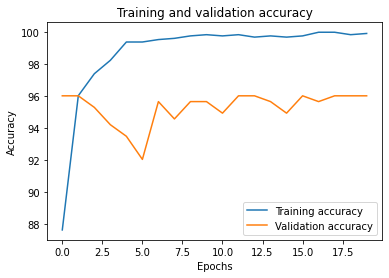

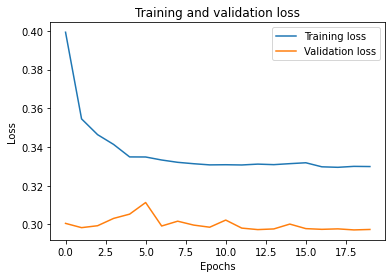

acc %
96.028880866426
total INCORRECT total examples in val number of correct examples in val
11 277 266
Confusion Matrix:
 [[   8  212]
 [  48 5272]]
True Positives: 5272
False Positives: 212
True Negatives: 8
False Negatives: 48
Precision: 0.9613
Recall: 0.9910


In [19]:
trainNew(cocotrain_loader,cocoval_loader, 'coco-iid-trimodal.pt')

/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


training start
Epoch 1/20, Train Loss: 0.4663, Train Acc: 85.0632, Val Loss: 0.2828, Val Acc: 88.30
Epoch 2/20, Train Loss: 0.4344, Train Acc: 90.7315, Val Loss: 0.2794, Val Acc: 85.75
Epoch 3/20, Train Loss: 0.4237, Train Acc: 93.5657, Val Loss: 0.2918, Val Acc: 87.02
Epoch 4/20, Train Loss: 0.4154, Train Acc: 94.9062, Val Loss: 0.2842, Val Acc: 84.48
Epoch 5/20, Train Loss: 0.4133, Train Acc: 95.1743, Val Loss: 0.2732, Val Acc: 90.33
Epoch 6/20, Train Loss: 0.4103, Train Acc: 95.9020, Val Loss: 0.2887, Val Acc: 84.99
Epoch 7/20, Train Loss: 0.4080, Train Acc: 96.2466, Val Loss: 0.2851, Val Acc: 87.28
Epoch 8/20, Train Loss: 0.4036, Train Acc: 97.3573, Val Loss: 0.2715, Val Acc: 91.09
Epoch 9/20, Train Loss: 0.4003, Train Acc: 97.8552, Val Loss: 0.2802, Val Acc: 87.28
Epoch 10/20, Train Loss: 0.3982, Train Acc: 98.2765, Val Loss: 0.2878, Val Acc: 86.01
Epoch 11/20, Train Loss: 0.3961, Train Acc: 98.7361, Val Loss: 0.2828, Val Acc: 89.06
Epoch 12/20, Train Loss: 0.3967, Train Acc: 98.5

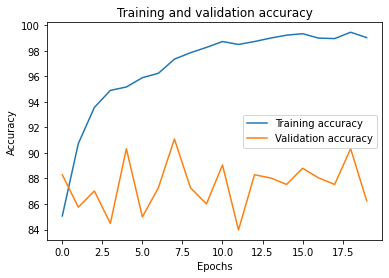

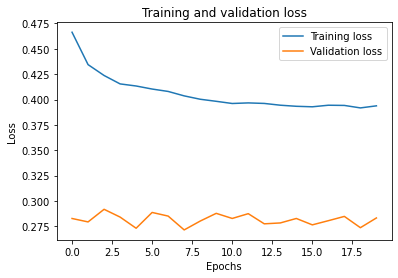

acc %
86.25954198473282
total INCORRECT total examples in val number of correct examples in val
54 393 339
Confusion Matrix:
 [[1391  509]
 [ 472 5488]]
True Positives: 5488
False Positives: 509
True Negatives: 1391
False Negatives: 472
Precision: 0.9151
Recall: 0.9208


In [20]:
trainNew(oiltrain_loader,oilval_loader, 'oil-iid-trimodal.pt')

/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


training start
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipp

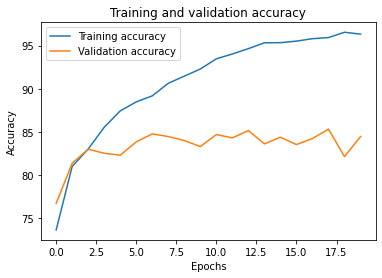

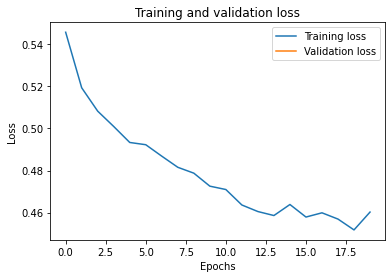

acc %
84.45475638051045
total INCORRECT total examples in val number of correct examples in val
201 1293 1092
Confusion Matrix:
 [[11462  1798]
 [ 2495 10105]]
True Positives: 10105
False Positives: 1798
True Negatives: 11462
False Negatives: 2495
Precision: 0.8489
Recall: 0.8020


In [21]:
### trainNew(cashtrain_loader,cashval_loader, 'cash-iid-trimodal.pt')

/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


training start
Epoch 1/20, Train Loss: 0.7185, Train Acc: 98.6978, Val Loss: 0.6733, Val Acc: 100.00
Epoch 2/20, Train Loss: 0.6934, Train Acc: 100.0000, Val Loss: 0.6731, Val Acc: 100.00
Epoch 3/20, Train Loss: 0.6933, Train Acc: 100.0000, Val Loss: 0.6730, Val Acc: 100.00
Epoch 4/20, Train Loss: 0.6932, Train Acc: 100.0000, Val Loss: 0.6729, Val Acc: 100.00
Epoch 5/20, Train Loss: 0.6932, Train Acc: 100.0000, Val Loss: 0.6729, Val Acc: 100.00
Epoch 6/20, Train Loss: 0.6932, Train Acc: 100.0000, Val Loss: 0.6729, Val Acc: 100.00
Epoch 7/20, Train Loss: 0.6932, Train Acc: 100.0000, Val Loss: 0.6729, Val Acc: 100.00
Epoch 8/20, Train Loss: 0.6932, Train Acc: 100.0000, Val Loss: 0.6729, Val Acc: 100.00
Epoch 9/20, Train Loss: 0.6932, Train Acc: 100.0000, Val Loss: 0.6729, Val Acc: 100.00
Epoch 10/20, Train Loss: 0.6932, Train Acc: 100.0000, Val Loss: 0.6729, Val Acc: 100.00
Epoch 11/20, Train Loss: 0.6932, Train Acc: 100.0000, Val Loss: 0.6729, Val Acc: 100.00
Epoch 12/20, Train Loss: 0.

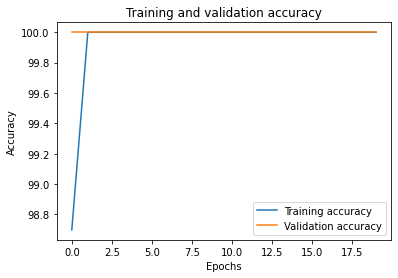

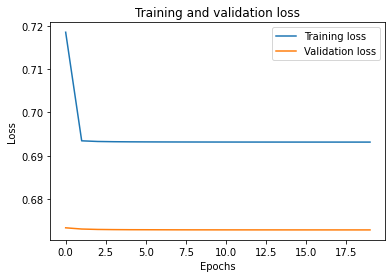

acc %
100.0
total INCORRECT total examples in val number of correct examples in val
0 895 895


ValueError: not enough values to unpack (expected 4, got 1)

In [22]:
trainNew(civtrain_loader,civval_loader, 'civ-iid-trimodal.pt')

/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


training start
Skipping batch due to NaNs.
Epoch 1/20, Train Loss: 0.4092, Train Acc: 87.9559, Val Loss: 0.3841, Val Acc: 85.41
Skipping batch due to NaNs.
Epoch 2/20, Train Loss: 0.3714, Train Acc: 94.2324, Val Loss: 0.3583, Val Acc: 92.17
Skipping batch due to NaNs.
Epoch 3/20, Train Loss: 0.3685, Train Acc: 94.4869, Val Loss: 0.3597, Val Acc: 91.10
Skipping batch due to NaNs.
Epoch 4/20, Train Loss: 0.3631, Train Acc: 94.9109, Val Loss: 0.3578, Val Acc: 92.88
Skipping batch due to NaNs.
Epoch 5/20, Train Loss: 0.3557, Train Acc: 96.6073, Val Loss: 0.3522, Val Acc: 94.66
Skipping batch due to NaNs.
Epoch 6/20, Train Loss: 0.3527, Train Acc: 97.6251, Val Loss: 0.3571, Val Acc: 93.24
Skipping batch due to NaNs.
Epoch 7/20, Train Loss: 0.3524, Train Acc: 97.7196, Val Loss: 0.3518, Val Acc: 93.95
Skipping batch due to NaNs.
Epoch 8/20, Train Loss: 0.3480, Train Acc: 98.2188, Val Loss: 0.3507, Val Acc: 94.31
Skipping batch due to NaNs.
Epoch 9/20, Train Loss: 0.3463, Train Acc: 98.6429, V

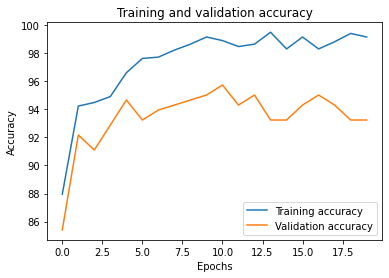

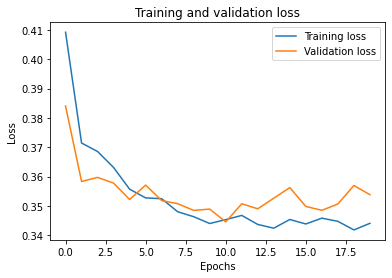

acc %
93.23843416370107
total INCORRECT total examples in val number of correct examples in val
19 281 262
Confusion Matrix:
 [[ 217  263]
 [ 105 5035]]
True Positives: 5035
False Positives: 263
True Negatives: 217
False Negatives: 105
Precision: 0.9504
Recall: 0.9796


In [24]:
trainNew(ftrain_loader, fval_loader, 'fagan-iid-trimodal.pt')

training start
Epoch 1/20, Train Loss: 0.5390, Train Acc: 81.5357, Val Loss: 0.4593, Val Acc: 84.43
Epoch 2/20, Train Loss: 0.5063, Train Acc: 88.4643, Val Loss: 0.4429, Val Acc: 87.61
Epoch 3/20, Train Loss: 0.4942, Train Acc: 90.7321, Val Loss: 0.4502, Val Acc: 88.00
Epoch 4/20, Train Loss: 0.4833, Train Acc: 92.9286, Val Loss: 0.4424, Val Acc: 88.69
Epoch 5/20, Train Loss: 0.4807, Train Acc: 93.5179, Val Loss: 0.4525, Val Acc: 88.84
Epoch 6/20, Train Loss: 0.4733, Train Acc: 95.1607, Val Loss: 0.4349, Val Acc: 88.58
Epoch 7/20, Train Loss: 0.4705, Train Acc: 95.8750, Val Loss: 0.4389, Val Acc: 90.10
Epoch 8/20, Train Loss: 0.4656, Train Acc: 96.7321, Val Loss: 0.4360, Val Acc: 89.42
Epoch 9/20, Train Loss: 0.4628, Train Acc: 97.3036, Val Loss: 0.4377, Val Acc: 88.86
Epoch 10/20, Train Loss: 0.4620, Train Acc: 97.3036, Val Loss: 0.4339, Val Acc: 89.76
Epoch 11/20, Train Loss: 0.4599, Train Acc: 97.8929, Val Loss: 0.4370, Val Acc: 90.65
Epoch 12/20, Train Loss: 0.4573, Train Acc: 98.2

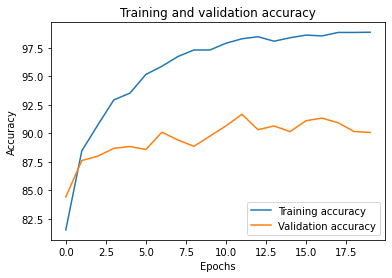

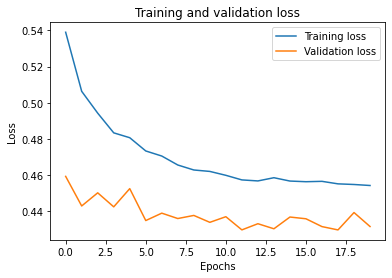

acc %
90.07506255212677
total INCORRECT total examples in val number of correct examples in val
119 1199 1080
Confusion Matrix:
 [[ 7943  1360]
 [ 1145 13558]]
True Positives: 13558
False Positives: 1360
True Negatives: 7943
False Negatives: 1145
Precision: 0.9088
Recall: 0.9221


In [29]:
trainNew(full_trn_loader,val_nosdpt_loader,'manual-iid-trimodal.pt')

training start
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipp

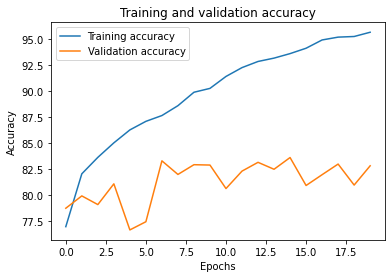

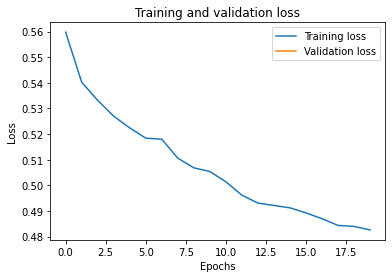

acc %
82.84313725490196
total INCORRECT total examples in val number of correct examples in val
840 4896 4056
Confusion Matrix:
 [[41595 12336]
 [ 5961 38057]]
True Positives: 38057
False Positives: 12336
True Negatives: 41595
False Negatives: 5961
Precision: 0.7552
Recall: 0.8646


In [28]:
trainNew(everything_trn_loader,everyval_nosdpt_loader,'manual-iid-trimodal.pt')

# Bimodal S2 & CHM

In [ ]:
import torch.nn.init as init
class MultiResNet(nn.Module):
    def __init__(self):
        super(MultiResNet, self).__init__()
        
        # First ResNet for grayscale images
        self.resnet_gray = models.resnet18(pretrained=True)
        self.resnet_gray.conv1 = nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3, bias=False)
        
        # Second ResNet for 24-band images
        self.resnet_24band = models.resnet18(pretrained=True)
        self.resnet_24band.conv1 = nn.Conv2d(4, 64, kernel_size=7, stride=2, padding=3, bias=False)
        
        # Get the number of features in the final layer
        num_features = self.resnet_gray.fc.in_features
        num_features24 = self.resnet_24band.fc.in_features
        
        # Concatenate the features from both streams
        self.fc = nn.Linear(num_features + num_features24, 1)  # Adjust the output size as needed
        self.sigmoid = nn.Sigmoid()  # Sigmoid activation function for binary classification

        #self._initialize_weights()


    def _initialize_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
            elif isinstance(m, nn.BatchNorm2d):
                init.constant_(m.weight, 1)
                init.constant_(m.bias, 0)
            elif isinstance(m, nn.Linear):
                init.normal_(m.weight, 0, 0.01)
                init.constant_(m.bias, 0)
        
    def forward(self, x_gray, x_24band,_):
        
        # Forward pass through the grayscale ResNet
        x_gray = self.resnet_gray.conv1(x_gray)
        x_gray = self.resnet_gray.bn1(x_gray)
        x_gray = self.resnet_gray.relu(x_gray)
        x_gray = self.resnet_gray.maxpool(x_gray)
        #print('x_gray after maxpool')
        #print(x_gray)
        x_gray = self.resnet_gray.layer1(x_gray)
        x_gray = self.resnet_gray.layer2(x_gray)
        x_gray = self.resnet_gray.layer3(x_gray)
        x_gray = self.resnet_gray.layer4(x_gray)
        #print('x_gray after layers')
        #print(x_gray)
        x_gray = self.resnet_gray.avgpool(x_gray)
        x_gray = torch.flatten(x_gray, 1)
        #print('grayscale CHM at flatten')
        #print(x_gray)

        #print('before forward pass: ')
        #print(x_24band)
        # Forward pass through the 24-band ResNet
        x_24band = self.resnet_24band.conv1(x_24band)
        #print('after conv1 forward pass: ')
        #print(x_24band[0])
        x_24band = self.resnet_24band.bn1(x_24band)
        #print('after bn')
        #print(x_24band[0])
        x_24band = self.resnet_24band.relu(x_24band)
        #print('after relu')
        #print(x_24band[0])
        x_24band = self.resnet_24band.maxpool(x_24band)
        #print('x_24 after maxpool')
        #print(x_24band[0])
        x_24band = self.resnet_24band.layer1(x_24band)
        x_24band = self.resnet_24band.layer2(x_24band)
        x_24band = self.resnet_24band.layer3(x_24band)
        x_24band = self.resnet_24band.layer4(x_24band)
        #print('x_24 after layers')
        #print(x_24band[0])
        x_24band = self.resnet_24band.avgpool(x_24band)
        x_24band = torch.flatten(x_24band, 1)
        #print('sentinel2 at flatten')
        #print(x_24band[0])
        
        # Concatenate the features from both streams
        x = torch.cat((x_gray, x_24band), dim=1)
        #print('x before clf')
        #print(x)
        # Classification head
        x = self.fc(x)
        #print('x after fc')
        #print(x)
        
        x = self.sigmoid(x)
        #print('x after clf head: ')
        #print(x)
        #print('after forward pass: ')
        #print(model.parameters())        
        return x

# Example usage
model = MultiResNet()
model.to(device)
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)

training start
Epoch 1/20, Train Loss: 0.3774, Train Acc: 95.1982, Val Loss: 0.2996, Val Acc: 96.03
Epoch 2/20, Train Loss: 0.3515, Train Acc: 96.7226, Val Loss: 0.2984, Val Acc: 96.03
Epoch 3/20, Train Loss: 0.3462, Train Acc: 97.5610, Val Loss: 0.2980, Val Acc: 96.03
Epoch 4/20, Train Loss: 0.3430, Train Acc: 97.7896, Val Loss: 0.2989, Val Acc: 95.67
Epoch 5/20, Train Loss: 0.3395, Train Acc: 98.5518, Val Loss: 0.3010, Val Acc: 95.31
Epoch 6/20, Train Loss: 0.3375, Train Acc: 98.8567, Val Loss: 0.2976, Val Acc: 96.03
Epoch 7/20, Train Loss: 0.3374, Train Acc: 98.7043, Val Loss: 0.2993, Val Acc: 95.31
Epoch 8/20, Train Loss: 0.3345, Train Acc: 99.3140, Val Loss: 0.2971, Val Acc: 96.03
Epoch 9/20, Train Loss: 0.3334, Train Acc: 99.3140, Val Loss: 0.2974, Val Acc: 96.03
Epoch 10/20, Train Loss: 0.3336, Train Acc: 99.3902, Val Loss: 0.2973, Val Acc: 96.03
Epoch 11/20, Train Loss: 0.3326, Train Acc: 99.5427, Val Loss: 0.2963, Val Acc: 96.39
Epoch 12/20, Train Loss: 0.3334, Train Acc: 99.3

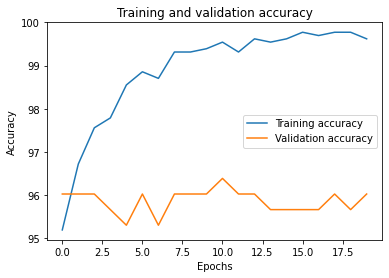

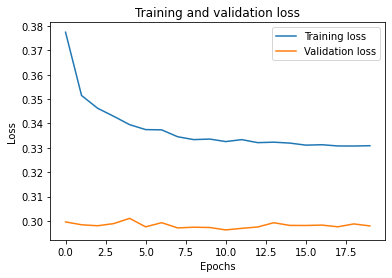

acc %
96.028880866426
total INCORRECT total examples in val number of correct examples in val
11 277 266
Confusion Matrix:
 [[   3  217]
 [  12 5308]]
True Positives: 5308
False Positives: 217
True Negatives: 3
False Negatives: 12
Precision: 0.9607
Recall: 0.9977


/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


training start
Epoch 1/20, Train Loss: 0.4745, Train Acc: 81.5396, Val Loss: 0.2871, Val Acc: 84.22
Epoch 2/20, Train Loss: 0.4404, Train Acc: 89.8123, Val Loss: 0.2770, Val Acc: 90.33
Epoch 3/20, Train Loss: 0.4327, Train Acc: 91.1528, Val Loss: 0.2772, Val Acc: 89.06
Epoch 4/20, Train Loss: 0.4229, Train Acc: 93.0295, Val Loss: 0.2758, Val Acc: 87.79
Epoch 5/20, Train Loss: 0.4179, Train Acc: 94.4849, Val Loss: 0.2825, Val Acc: 85.24
Epoch 6/20, Train Loss: 0.4157, Train Acc: 95.1360, Val Loss: 0.2829, Val Acc: 87.53
Epoch 7/20, Train Loss: 0.4109, Train Acc: 95.8637, Val Loss: 0.2809, Val Acc: 88.80
Epoch 8/20, Train Loss: 0.4095, Train Acc: 95.8637, Val Loss: 0.2858, Val Acc: 82.44
Epoch 9/20, Train Loss: 0.4029, Train Acc: 97.0509, Val Loss: 0.2718, Val Acc: 90.59
Epoch 10/20, Train Loss: 0.4049, Train Acc: 97.0126, Val Loss: 0.2856, Val Acc: 85.50
Epoch 11/20, Train Loss: 0.4048, Train Acc: 96.8594, Val Loss: 0.2749, Val Acc: 90.33
Epoch 12/20, Train Loss: 0.3987, Train Acc: 98.0

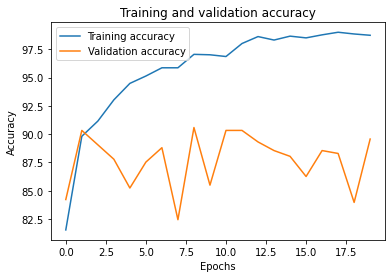

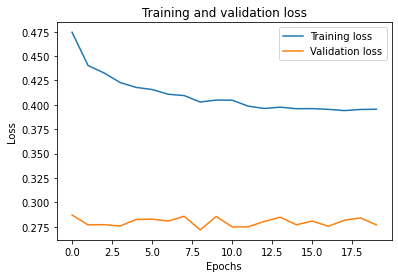

acc %
89.56743002544529
total INCORRECT total examples in val number of correct examples in val
41 393 352
Confusion Matrix:
 [[1444  456]
 [ 508 5452]]
True Positives: 5452
False Positives: 456
True Negatives: 1444
False Negatives: 508
Precision: 0.9228
Recall: 0.9148


NameError: name 'cashewtrain_loader' is not defined

In [30]:
trainNew(cocotrain_loader,cocoval_loader, 'coco-iid-bimodal.pt')
trainNew(oiltrain_loader,oilval_loader, 'oil-iid-bimodal.pt')

/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


training start
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipp

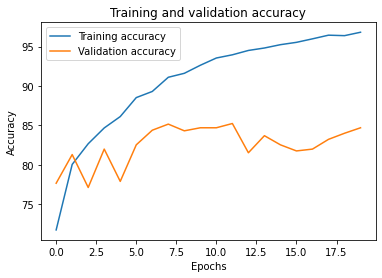

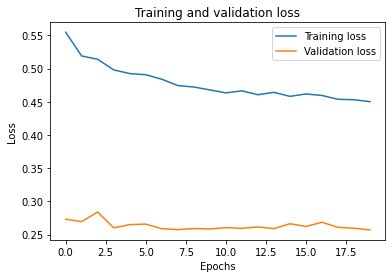

acc %
84.68677494199535
total INCORRECT total examples in val number of correct examples in val
198 1293 1095
Confusion Matrix:
 [[11043  2217]
 [ 2306 10294]]
True Positives: 10294
False Positives: 2217
True Negatives: 11043
False Negatives: 2306
Precision: 0.8228
Recall: 0.8170


/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


training start
Epoch 1/20, Train Loss: 0.7438, Train Acc: 92.9192, Val Loss: 0.6744, Val Acc: 100.00
Epoch 2/20, Train Loss: 0.6940, Train Acc: 100.0000, Val Loss: 0.6732, Val Acc: 100.00
Epoch 3/20, Train Loss: 0.6934, Train Acc: 100.0000, Val Loss: 0.6730, Val Acc: 100.00
Epoch 4/20, Train Loss: 0.6933, Train Acc: 100.0000, Val Loss: 0.6730, Val Acc: 100.00
Epoch 5/20, Train Loss: 0.6933, Train Acc: 100.0000, Val Loss: 0.6729, Val Acc: 100.00
Epoch 6/20, Train Loss: 0.6932, Train Acc: 100.0000, Val Loss: 0.6729, Val Acc: 100.00
Epoch 7/20, Train Loss: 0.6932, Train Acc: 100.0000, Val Loss: 0.6729, Val Acc: 100.00
Epoch 8/20, Train Loss: 0.6932, Train Acc: 100.0000, Val Loss: 0.6729, Val Acc: 100.00
Epoch 9/20, Train Loss: 0.6932, Train Acc: 100.0000, Val Loss: 0.6729, Val Acc: 100.00
Epoch 10/20, Train Loss: 0.6932, Train Acc: 100.0000, Val Loss: 0.6729, Val Acc: 100.00
Epoch 11/20, Train Loss: 0.6932, Train Acc: 100.0000, Val Loss: 0.6729, Val Acc: 100.00
Epoch 12/20, Train Loss: 0.

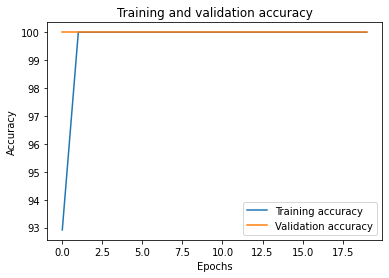

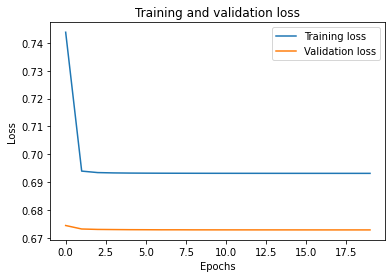

acc %
100.0
total INCORRECT total examples in val number of correct examples in val
0 895 895


ValueError: not enough values to unpack (expected 4, got 1)

In [31]:
trainNew(cashtrain_loader,cashval_loader, 'cashew-iid-bimodal.pt')
trainNew(civtrain_loader,civval_loader, 'civ-iid-bimodal.pt')
trainNew(ftrain_loader,fval_loader, 'Fagan-iid-bimodal.pt')
trainNew(everything_trn_loader,everything_nosdpt_loader,'manual-iid-trimodal.pt')

/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


training start
Skipping batch due to NaNs.
Epoch 1/20, Train Loss: 0.4226, Train Acc: 81.0008, Val Loss: 0.3798, Val Acc: 87.54
Skipping batch due to NaNs.
Epoch 2/20, Train Loss: 0.3870, Train Acc: 90.1612, Val Loss: 0.3724, Val Acc: 88.97
Skipping batch due to NaNs.
Epoch 3/20, Train Loss: 0.3800, Train Acc: 91.8575, Val Loss: 0.3625, Val Acc: 91.81
Skipping batch due to NaNs.
Epoch 4/20, Train Loss: 0.3725, Train Acc: 93.6387, Val Loss: 0.3589, Val Acc: 92.88
Skipping batch due to NaNs.
Epoch 5/20, Train Loss: 0.3723, Train Acc: 93.4690, Val Loss: 0.4064, Val Acc: 77.22
Skipping batch due to NaNs.
Epoch 6/20, Train Loss: 0.3666, Train Acc: 94.5717, Val Loss: 0.3644, Val Acc: 90.04
Skipping batch due to NaNs.
Epoch 7/20, Train Loss: 0.3604, Train Acc: 95.8439, Val Loss: 0.3514, Val Acc: 94.31
Skipping batch due to NaNs.
Epoch 8/20, Train Loss: 0.3584, Train Acc: 95.6743, Val Loss: 0.3582, Val Acc: 92.88
Skipping batch due to NaNs.
Epoch 9/20, Train Loss: 0.3560, Train Acc: 96.8617, V

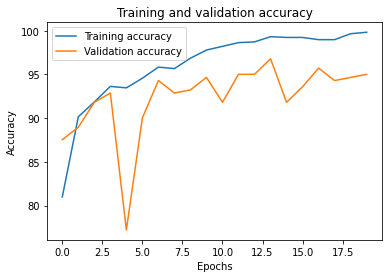

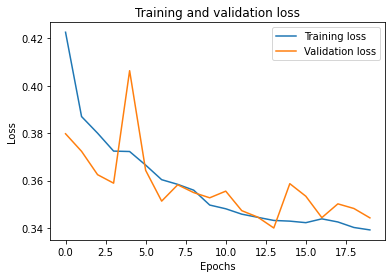

acc %
95.01779359430606
total INCORRECT total examples in val number of correct examples in val
14 281 267
Confusion Matrix:
 [[ 250  230]
 [ 199 4941]]
True Positives: 4941
False Positives: 230
True Negatives: 250
False Negatives: 199
Precision: 0.9555
Recall: 0.9613


NameError: name 'everything_nosdpt_loader' is not defined

In [32]:
trainNew(ftrain_loader,fval_loader, 'Fagan-iid-bimodal.pt')

In [ ]:
trainNew(full_trn_loader,full_nosdpt_loader,'manual-iid-bimodal.pt')

/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


training start
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipp

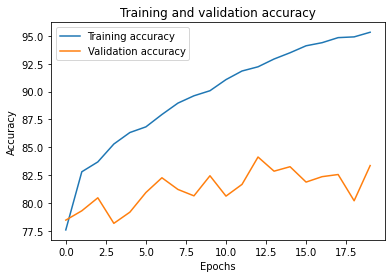

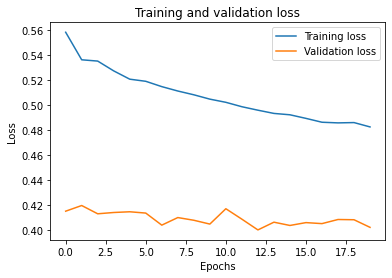

acc %
83.35715744333265
total INCORRECT total examples in val number of correct examples in val
815 4897 4082
Confusion Matrix:
 [[42379 11560]
 [ 6761 37245]]
True Positives: 37245
False Positives: 11560
True Negatives: 42379
False Negatives: 6761
Precision: 0.7631
Recall: 0.8464


In [33]:
trainNew(everything_trn_loader,everyval_nosdpt_loader,'manual-iid-bimodal.pt')

# CHM only

In [36]:
import torch.nn.init as init
class MultiResNet(nn.Module):
    def __init__(self):
        super(MultiResNet, self).__init__()
        
        # First ResNet for grayscale images
        self.resnet_gray = models.resnet18(pretrained=True)
        self.resnet_gray.conv1 = nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3, bias=False)

        # Get the number of features in the final layer
        num_features = self.resnet_gray.fc.in_features

        # Concatenate the features from both streams
        self.fc = nn.Linear(num_features, 1)  # Adjust the output size as needed
        self.sigmoid = nn.Sigmoid()  # Sigmoid activation function for binary classification

        #self._initialize_weights()


    def _initialize_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
            elif isinstance(m, nn.BatchNorm2d):
                init.constant_(m.weight, 1)
                init.constant_(m.bias, 0)
            elif isinstance(m, nn.Linear):
                init.normal_(m.weight, 0, 0.01)
                init.constant_(m.bias, 0)
        
    def forward(self, x_gray, x_24band,_):
        
        # Forward pass through the grayscale ResNet
        x_gray = self.resnet_gray.conv1(x_gray)
        x_gray = self.resnet_gray.bn1(x_gray)
        x_gray = self.resnet_gray.relu(x_gray)
        x_gray = self.resnet_gray.maxpool(x_gray)
        #print('x_gray after maxpool')
        #print(x_gray)
        x_gray = self.resnet_gray.layer1(x_gray)
        x_gray = self.resnet_gray.layer2(x_gray)
        x_gray = self.resnet_gray.layer3(x_gray)
        x_gray = self.resnet_gray.layer4(x_gray)
        #print('x_gray after layers')
        #print(x_gray)
        x_gray = self.resnet_gray.avgpool(x_gray)
        x_gray = torch.flatten(x_gray, 1)
        
        # Classification head
        x = self.fc(x_gray)
        
        x = self.sigmoid(x)
        return x

# Example usage
model = MultiResNet()
model.to(device)
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)

training start
Epoch 1/20, Train Loss: 0.3966, Train Acc: 94.1311, Val Loss: 0.3059, Val Acc: 96.03
Epoch 2/20, Train Loss: 0.3588, Train Acc: 95.8079, Val Loss: 0.2999, Val Acc: 96.03
Epoch 3/20, Train Loss: 0.3535, Train Acc: 96.5701, Val Loss: 0.2989, Val Acc: 96.03
Epoch 4/20, Train Loss: 0.3477, Train Acc: 97.4848, Val Loss: 0.3019, Val Acc: 95.67
Epoch 5/20, Train Loss: 0.3432, Train Acc: 98.3232, Val Loss: 0.3022, Val Acc: 95.67
Epoch 6/20, Train Loss: 0.3391, Train Acc: 98.6280, Val Loss: 0.3003, Val Acc: 95.67
Epoch 7/20, Train Loss: 0.3388, Train Acc: 98.7043, Val Loss: 0.3005, Val Acc: 95.67
Epoch 8/20, Train Loss: 0.3383, Train Acc: 98.8567, Val Loss: 0.3014, Val Acc: 95.31
Epoch 9/20, Train Loss: 0.3369, Train Acc: 99.0091, Val Loss: 0.3020, Val Acc: 95.31
Epoch 10/20, Train Loss: 0.3364, Train Acc: 99.0091, Val Loss: 0.2982, Val Acc: 96.03
Epoch 11/20, Train Loss: 0.3361, Train Acc: 99.1616, Val Loss: 0.2998, Val Acc: 95.31
Epoch 12/20, Train Loss: 0.3363, Train Acc: 98.9

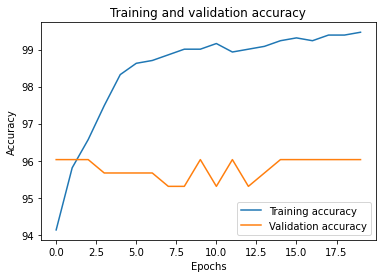

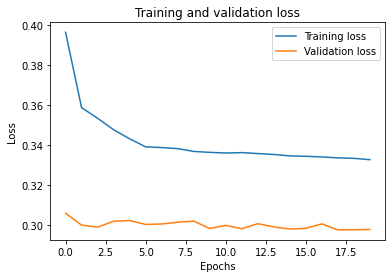

acc %
96.028880866426
total INCORRECT total examples in val number of correct examples in val
11 277 266
Confusion Matrix:
 [[   1  219]
 [  14 5306]]
True Positives: 5306
False Positives: 219
True Negatives: 1
False Negatives: 14
Precision: 0.9604
Recall: 0.9974


/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


training start
Epoch 1/20, Train Loss: 0.4919, Train Acc: 75.7947, Val Loss: 0.2913, Val Acc: 84.48
Epoch 2/20, Train Loss: 0.4541, Train Acc: 87.1697, Val Loss: 0.2950, Val Acc: 83.21
Epoch 3/20, Train Loss: 0.4439, Train Acc: 89.3910, Val Loss: 0.2855, Val Acc: 87.02
Epoch 4/20, Train Loss: 0.4406, Train Acc: 90.3102, Val Loss: 0.2858, Val Acc: 86.51
Epoch 5/20, Train Loss: 0.4417, Train Acc: 89.3527, Val Loss: 0.2863, Val Acc: 87.28
Epoch 6/20, Train Loss: 0.4329, Train Acc: 91.2677, Val Loss: 0.2850, Val Acc: 87.02
Epoch 7/20, Train Loss: 0.4269, Train Acc: 92.5699, Val Loss: 0.2834, Val Acc: 87.28
Epoch 8/20, Train Loss: 0.4310, Train Acc: 91.5741, Val Loss: 0.2850, Val Acc: 86.51
Epoch 9/20, Train Loss: 0.4157, Train Acc: 94.8296, Val Loss: 0.2900, Val Acc: 82.70
Epoch 10/20, Train Loss: 0.4140, Train Acc: 95.1360, Val Loss: 0.2871, Val Acc: 86.51
Epoch 11/20, Train Loss: 0.4105, Train Acc: 95.7871, Val Loss: 0.2882, Val Acc: 85.75
Epoch 12/20, Train Loss: 0.4078, Train Acc: 96.6

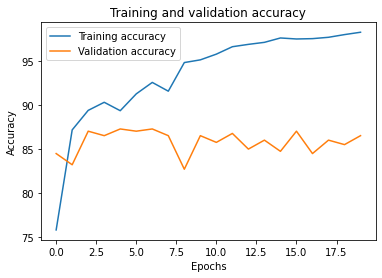

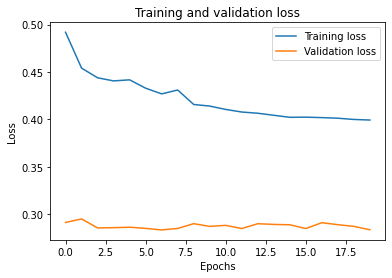

acc %
86.51399491094148
total INCORRECT total examples in val number of correct examples in val
53 393 340
Confusion Matrix:
 [[1274  626]
 [ 489 5471]]
True Positives: 5471
False Positives: 626
True Negatives: 1274
False Negatives: 489
Precision: 0.8973
Recall: 0.9180


/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


training start
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipp

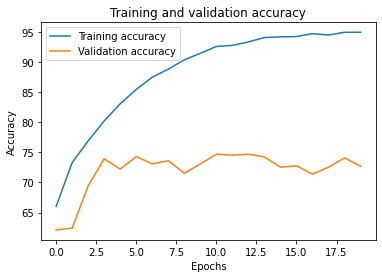

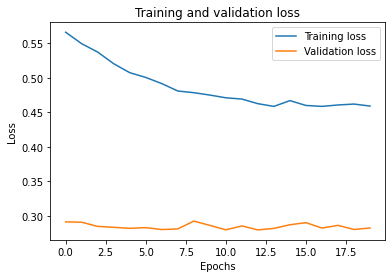

acc %
72.69914926527456
total INCORRECT total examples in val number of correct examples in val
353 1293 940
Confusion Matrix:
 [[10166  3094]
 [ 4146  8454]]
True Positives: 8454
False Positives: 3094
True Negatives: 10166
False Negatives: 4146
Precision: 0.7321
Recall: 0.6710


/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


training start
Epoch 1/20, Train Loss: 0.7487, Train Acc: 93.7330, Val Loss: 0.6749, Val Acc: 100.00
Epoch 2/20, Train Loss: 0.6947, Train Acc: 100.0000, Val Loss: 0.6737, Val Acc: 100.00
Epoch 3/20, Train Loss: 0.6940, Train Acc: 100.0000, Val Loss: 0.6734, Val Acc: 100.00
Epoch 4/20, Train Loss: 0.6936, Train Acc: 100.0000, Val Loss: 0.6733, Val Acc: 100.00
Epoch 5/20, Train Loss: 0.6935, Train Acc: 100.0000, Val Loss: 0.6732, Val Acc: 100.00
Epoch 6/20, Train Loss: 0.6934, Train Acc: 100.0000, Val Loss: 0.6731, Val Acc: 100.00
Epoch 7/20, Train Loss: 0.6934, Train Acc: 100.0000, Val Loss: 0.6731, Val Acc: 100.00
Epoch 8/20, Train Loss: 0.6933, Train Acc: 100.0000, Val Loss: 0.6730, Val Acc: 100.00
Epoch 9/20, Train Loss: 0.6933, Train Acc: 100.0000, Val Loss: 0.6730, Val Acc: 100.00
Epoch 10/20, Train Loss: 0.6933, Train Acc: 100.0000, Val Loss: 0.6730, Val Acc: 100.00
Epoch 11/20, Train Loss: 0.6933, Train Acc: 100.0000, Val Loss: 0.6730, Val Acc: 100.00
Epoch 12/20, Train Loss: 0.

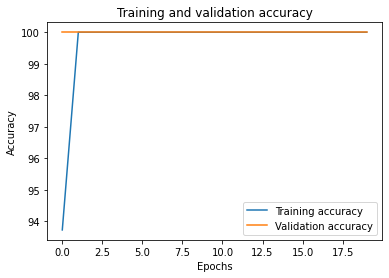

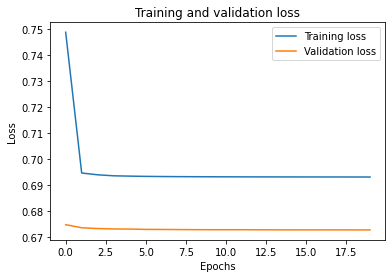

acc %
100.0
total INCORRECT total examples in val number of correct examples in val
0 895 895


ValueError: not enough values to unpack (expected 4, got 1)

In [37]:
trainNew(cocotrain_loader,cocoval_loader, 'coco-iid-chm.pt')
trainNew(oiltrain_loader,oilval_loader, 'oil-iid-chm.pt')
trainNew(cashtrain_loader,cashval_loader, 'cashew-iid-chm.pt')


/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


training start
Skipping batch due to NaNs.
Epoch 1/20, Train Loss: 0.4215, Train Acc: 82.5276, Val Loss: 0.3610, Val Acc: 92.88
Skipping batch due to NaNs.
Epoch 2/20, Train Loss: 0.3825, Train Acc: 91.1790, Val Loss: 0.3776, Val Acc: 86.83
Skipping batch due to NaNs.
Epoch 3/20, Train Loss: 0.3873, Train Acc: 89.6522, Val Loss: 0.3640, Val Acc: 91.46
Skipping batch due to NaNs.
Epoch 4/20, Train Loss: 0.3751, Train Acc: 92.3664, Val Loss: 0.3571, Val Acc: 93.59
Skipping batch due to NaNs.
Epoch 5/20, Train Loss: 0.3710, Train Acc: 93.5539, Val Loss: 0.3711, Val Acc: 87.19
Skipping batch due to NaNs.
Epoch 6/20, Train Loss: 0.3687, Train Acc: 94.2324, Val Loss: 0.3601, Val Acc: 92.17
Skipping batch due to NaNs.
Epoch 7/20, Train Loss: 0.3733, Train Acc: 92.9601, Val Loss: 0.3751, Val Acc: 86.48
Skipping batch due to NaNs.
Epoch 8/20, Train Loss: 0.3674, Train Acc: 93.8931, Val Loss: 0.3606, Val Acc: 92.53
Skipping batch due to NaNs.
Epoch 9/20, Train Loss: 0.3612, Train Acc: 95.4198, V

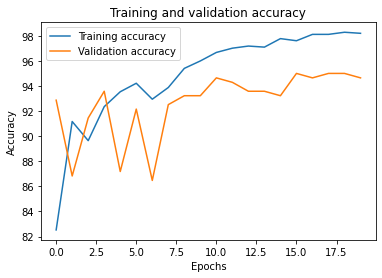

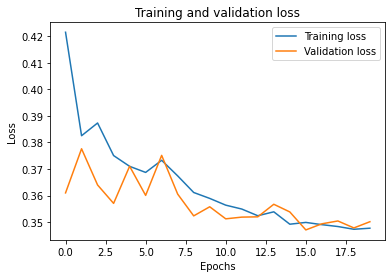

acc %
94.66192170818505
total INCORRECT total examples in val number of correct examples in val
15 281 266
Confusion Matrix:
 [[ 214  266]
 [ 146 4994]]
True Positives: 4994
False Positives: 266
True Negatives: 214
False Negatives: 146
Precision: 0.9494
Recall: 0.9716


NameError: name 'full_nosdpt_loader' is not defined

In [38]:

trainNew(ftrain_loader,fval_loader, 'Fagan-iid-chm.pt')


training start
Epoch 1/20, Train Loss: 0.5536, Train Acc: 77.5000, Val Loss: 0.4705, Val Acc: 80.48
Epoch 2/20, Train Loss: 0.5216, Train Acc: 85.5536, Val Loss: 0.4684, Val Acc: 80.48
Epoch 3/20, Train Loss: 0.5110, Train Acc: 87.6964, Val Loss: 0.4596, Val Acc: 83.69
Epoch 4/20, Train Loss: 0.4987, Train Acc: 90.1429, Val Loss: 0.4704, Val Acc: 83.58
Epoch 5/20, Train Loss: 0.4886, Train Acc: 92.3929, Val Loss: 0.4502, Val Acc: 86.69
Epoch 6/20, Train Loss: 0.4865, Train Acc: 92.4286, Val Loss: 0.4547, Val Acc: 85.63
Epoch 7/20, Train Loss: 0.4762, Train Acc: 94.6607, Val Loss: 0.4496, Val Acc: 86.84
Epoch 8/20, Train Loss: 0.4743, Train Acc: 95.0536, Val Loss: 0.4498, Val Acc: 87.80
Epoch 9/20, Train Loss: 0.4695, Train Acc: 96.0179, Val Loss: 0.4479, Val Acc: 87.75
Epoch 10/20, Train Loss: 0.4685, Train Acc: 96.1071, Val Loss: 0.4444, Val Acc: 88.25
Epoch 11/20, Train Loss: 0.4664, Train Acc: 96.5893, Val Loss: 0.4581, Val Acc: 86.37
Epoch 12/20, Train Loss: 0.4636, Train Acc: 97.0

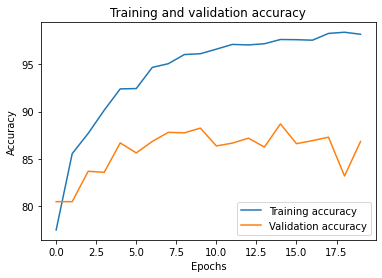

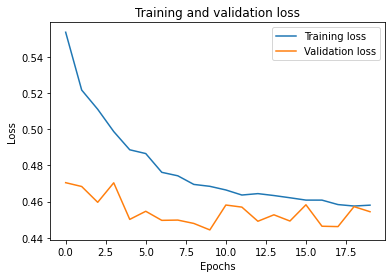

acc %
86.83333333333333
total INCORRECT total examples in val number of correct examples in val
158 1200 1042
Confusion Matrix:
 [[ 7360  1938]
 [ 1457 13256]]
True Positives: 13256
False Positives: 1938
True Negatives: 7360
False Negatives: 1457
Precision: 0.8724
Recall: 0.9010


NameError: name 'everything_nosdpt_loader' is not defined

In [40]:
trainNew(full_trn_loader,val_nosdpt_loader,'manual-iid-chm.pt')

#trainNew(civtrain_loader,civval_loader, 'civ-iid-chm.pt')

In [ ]:
trainNew(everything_trn_loader,everyval_nosdpt_loader,'all-iid-chm.pt')

training start
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipp

# S2 Only

In [28]:
import torch.nn.init as init
class MultiResNet(nn.Module):
    def __init__(self):
        super(MultiResNet, self).__init__()

        # Second ResNet for 24-band images
        self.resnet_24band = models.resnet18(pretrained=True)
        self.resnet_24band.conv1 = nn.Conv2d(4, 64, kernel_size=7, stride=2, padding=3, bias=False)
        
        num_features24 = self.resnet_24band.fc.in_features
        
        # Concatenate the features from both streams
        self.fc = nn.Linear(num_features24, 1)  # Adjust the output size as needed
        self.sigmoid = nn.Sigmoid()  # Sigmoid activation function for binary classification

    def _initialize_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
            elif isinstance(m, nn.BatchNorm2d):
                init.constant_(m.weight, 1)
                init.constant_(m.bias, 0)
            elif isinstance(m, nn.Linear):
                init.normal_(m.weight, 0, 0.01)
                init.constant_(m.bias, 0)
        
    def forward(self, x_gray, x_24band,_):
        
        # Forward pass through the 24-band ResNet
        x_24band = self.resnet_24band.conv1(x_24band)
        #print('after conv1 forward pass: ')
        #print(x_24band[0])
        x_24band = self.resnet_24band.bn1(x_24band)
        #print('after bn')
        #print(x_24band[0])
        x_24band = self.resnet_24band.relu(x_24band)
        x_24band = self.resnet_24band.maxpool(x_24band)
        x_24band = self.resnet_24band.layer1(x_24band)
        x_24band = self.resnet_24band.layer2(x_24band)
        x_24band = self.resnet_24band.layer3(x_24band)
        x_24band = self.resnet_24band.layer4(x_24band)
        x_24band = self.resnet_24band.avgpool(x_24band)
        x_24band = torch.flatten(x_24band, 1)

        # Concatenate the features from both streams
        # Classification head
        x = self.fc(x_24band)
        
        x = self.sigmoid(x)
        return x

# Example usage
model = MultiResNet()
model.to(device)
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)

training start
Epoch 1/20, Train Loss: 0.4152, Train Acc: 79.9543, Val Loss: 0.3010, Val Acc: 96.03
Epoch 2/20, Train Loss: 0.3787, Train Acc: 89.7866, Val Loss: 0.2995, Val Acc: 96.03
Epoch 3/20, Train Loss: 0.3747, Train Acc: 90.9299, Val Loss: 0.3003, Val Acc: 95.67
Epoch 4/20, Train Loss: 0.3763, Train Acc: 90.3963, Val Loss: 0.3035, Val Acc: 94.58
Epoch 5/20, Train Loss: 0.3696, Train Acc: 91.8445, Val Loss: 0.3039, Val Acc: 94.95
Epoch 6/20, Train Loss: 0.3664, Train Acc: 92.6829, Val Loss: 0.3017, Val Acc: 95.31
Epoch 7/20, Train Loss: 0.3633, Train Acc: 93.5976, Val Loss: 0.2994, Val Acc: 95.67
Epoch 8/20, Train Loss: 0.3631, Train Acc: 93.2927, Val Loss: 0.3032, Val Acc: 94.22
Epoch 9/20, Train Loss: 0.3595, Train Acc: 93.8262, Val Loss: 0.3067, Val Acc: 93.14
Epoch 10/20, Train Loss: 0.3634, Train Acc: 92.9116, Val Loss: 0.3094, Val Acc: 92.06
Epoch 11/20, Train Loss: 0.3548, Train Acc: 96.1128, Val Loss: 0.2985, Val Acc: 96.03
Epoch 12/20, Train Loss: 0.3484, Train Acc: 96.9

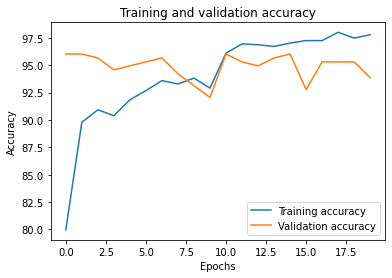

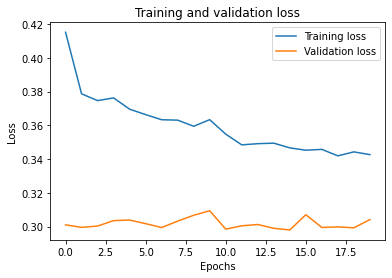

acc %
93.86281588447653
total INCORRECT total examples in val number of correct examples in val
17 277 260
Confusion Matrix:
 [[   2  218]
 [  64 5256]]
True Positives: 5256
False Positives: 218
True Negatives: 2
False Negatives: 64
Precision: 0.9602
Recall: 0.9880


/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


training start
Epoch 1/20, Train Loss: 0.5231, Train Acc: 70.0498, Val Loss: 0.3261, Val Acc: 69.21
Epoch 2/20, Train Loss: 0.4836, Train Acc: 81.5013, Val Loss: 0.3257, Val Acc: 76.34
Epoch 3/20, Train Loss: 0.4740, Train Acc: 83.2631, Val Loss: 0.3286, Val Acc: 76.59
Epoch 4/20, Train Loss: 0.4651, Train Acc: 85.2164, Val Loss: 0.3147, Val Acc: 73.03
Epoch 5/20, Train Loss: 0.4637, Train Acc: 85.1398, Val Loss: 0.2972, Val Acc: 82.95
Epoch 6/20, Train Loss: 0.4580, Train Acc: 86.6718, Val Loss: 0.3682, Val Acc: 46.56
Epoch 7/20, Train Loss: 0.4478, Train Acc: 88.2804, Val Loss: 0.3043, Val Acc: 75.83
Epoch 8/20, Train Loss: 0.4452, Train Acc: 89.0846, Val Loss: 0.3085, Val Acc: 81.42
Epoch 9/20, Train Loss: 0.4434, Train Acc: 89.6208, Val Loss: 0.3192, Val Acc: 79.64
Epoch 10/20, Train Loss: 0.4441, Train Acc: 89.3910, Val Loss: 0.3215, Val Acc: 78.63
Epoch 11/20, Train Loss: 0.4425, Train Acc: 89.4676, Val Loss: 0.3205, Val Acc: 79.39
Epoch 12/20, Train Loss: 0.4315, Train Acc: 91.8

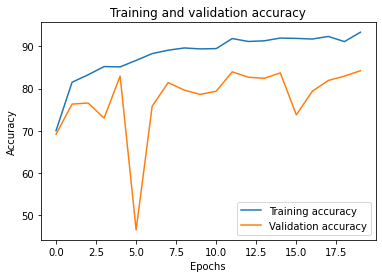

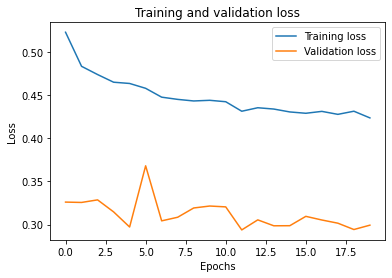

acc %
84.22391857506362
total INCORRECT total examples in val number of correct examples in val
62 393 331
Confusion Matrix:
 [[ 919  981]
 [ 769 5191]]
True Positives: 5191
False Positives: 981
True Negatives: 919
False Negatives: 769
Precision: 0.8411
Recall: 0.8710


/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


training start
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipp

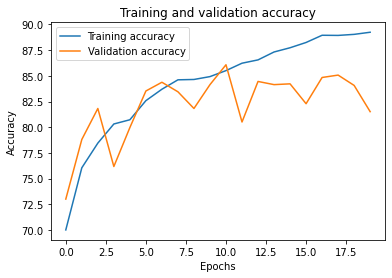

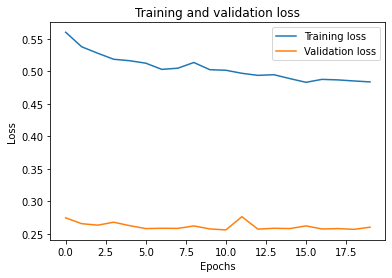

acc %
81.51585460170146
total INCORRECT total examples in val number of correct examples in val
239 1293 1054
Confusion Matrix:
 [[11695  1565]
 [ 3034  9566]]
True Positives: 9566
False Positives: 1565
True Negatives: 11695
False Negatives: 3034
Precision: 0.8594
Recall: 0.7592


/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


training start
Skipping batch due to NaNs.
Epoch 1/20, Train Loss: 0.4391, Train Acc: 80.4919, Val Loss: 0.3851, Val Acc: 91.81
Skipping batch due to NaNs.
Epoch 2/20, Train Loss: 0.3939, Train Acc: 89.3978, Val Loss: 0.3663, Val Acc: 92.17
Skipping batch due to NaNs.
Epoch 3/20, Train Loss: 0.3895, Train Acc: 90.7095, Val Loss: 0.3687, Val Acc: 90.04
Skipping batch due to NaNs.
Epoch 4/20, Train Loss: 0.3822, Train Acc: 91.6031, Val Loss: 0.3662, Val Acc: 91.10
Skipping batch due to NaNs.
Epoch 5/20, Train Loss: 0.3912, Train Acc: 90.0763, Val Loss: 0.3799, Val Acc: 87.19
Skipping batch due to NaNs.
Epoch 6/20, Train Loss: 0.3821, Train Acc: 91.3486, Val Loss: 0.3636, Val Acc: 90.39
Skipping batch due to NaNs.
Epoch 7/20, Train Loss: 0.3875, Train Acc: 89.8219, Val Loss: 0.3790, Val Acc: 88.61
Skipping batch due to NaNs.
Epoch 8/20, Train Loss: 0.3798, Train Acc: 91.6879, Val Loss: 0.3646, Val Acc: 91.81
Skipping batch due to NaNs.
Epoch 9/20, Train Loss: 0.3778, Train Acc: 92.6209, V

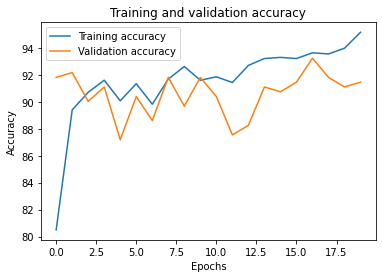

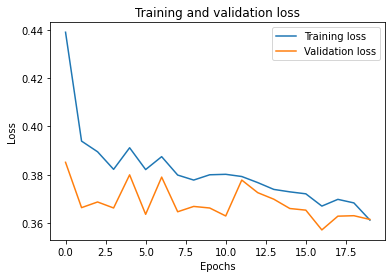

acc %
91.45907473309609
total INCORRECT total examples in val number of correct examples in val
24 281 257
Confusion Matrix:
 [[ 149  331]
 [ 198 4942]]
True Positives: 4942
False Positives: 331
True Negatives: 149
False Negatives: 198
Precision: 0.9372
Recall: 0.9615


/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


training start
Epoch 1/20, Train Loss: 0.5909, Train Acc: 68.8750, Val Loss: 0.5202, Val Acc: 72.58
Epoch 2/20, Train Loss: 0.5772, Train Acc: 73.0357, Val Loss: 0.4910, Val Acc: 74.90
Epoch 3/20, Train Loss: 0.5677, Train Acc: 75.7321, Val Loss: 0.4898, Val Acc: 77.73
Epoch 4/20, Train Loss: 0.5646, Train Acc: 75.0357, Val Loss: 0.4890, Val Acc: 76.27
Epoch 5/20, Train Loss: 0.5522, Train Acc: 78.8571, Val Loss: 0.4888, Val Acc: 75.35
Epoch 6/20, Train Loss: 0.5486, Train Acc: 80.1071, Val Loss: 0.4916, Val Acc: 77.54
Epoch 7/20, Train Loss: 0.5418, Train Acc: 80.5536, Val Loss: 0.5060, Val Acc: 76.19
Epoch 8/20, Train Loss: 0.5397, Train Acc: 81.0536, Val Loss: 0.4969, Val Acc: 76.09
Epoch 9/20, Train Loss: 0.5359, Train Acc: 82.4107, Val Loss: 0.4973, Val Acc: 75.08
Epoch 10/20, Train Loss: 0.5393, Train Acc: 80.8750, Val Loss: 0.4743, Val Acc: 79.75
Epoch 11/20, Train Loss: 0.5301, Train Acc: 83.3393, Val Loss: 0.4919, Val Acc: 78.90
Epoch 12/20, Train Loss: 0.5251, Train Acc: 84.3

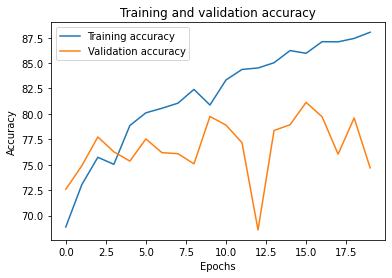

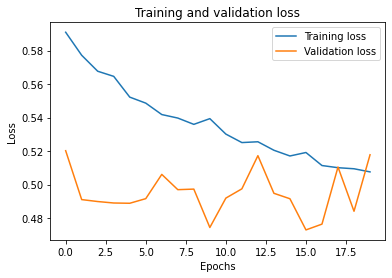

acc %
74.68776019983348
total INCORRECT total examples in val number of correct examples in val
304 1201 897
Confusion Matrix:
 [[ 6063  3246]
 [ 2339 12353]]
True Positives: 12353
False Positives: 3246
True Negatives: 6063
False Negatives: 2339
Precision: 0.7919
Recall: 0.8408


/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


training start
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipp

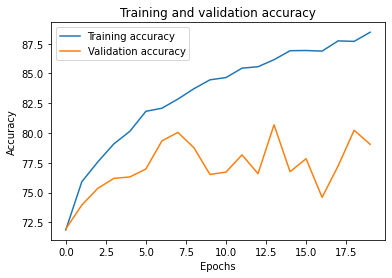

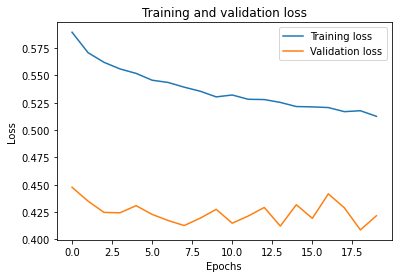

acc %
79.05267456104532
total INCORRECT total examples in val number of correct examples in val
1026 4898 3872
Confusion Matrix:
 [[38951 14972]
 [ 7394 36631]]
True Positives: 36631
False Positives: 14972
True Negatives: 38951
False Negatives: 7394
Precision: 0.7099
Recall: 0.8320


In [29]:
trainNew(cocotrain_loader,cocoval_loader, 'coco-iid-s2.pt')
trainNew(oiltrain_loader,oilval_loader, 'oil-iid-s2.pt')
trainNew(cashtrain_loader,cashval_loader, 'cashew-iid-s2.pt')
trainNew(ftrain_loader,fval_loader, 'Fagan-iid-s2.pt')
trainNew(full_trn_loader,val_nosdpt_loader,'manual-iid-s2.pt')
trainNew(everything_trn_loader,everyval_nosdpt_loader,'all-iid-s2.pt')

In [ ]:
#trainNew(civtrain_loader,civval_loader, 'civ-iid-s2.pt')

# Trimodal from scratch

In [30]:
import torch.nn.init as init
class MultiResNet(nn.Module):
    def __init__(self):
        super(MultiResNet, self).__init__()
        
        # First ResNet for grayscale images
        self.resnet_gray = models.resnet18(pretrained=False)
        self.resnet_gray.conv1 = nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3, bias=False)
        
        # Second ResNet for 24-band images
        self.resnet_24band = models.resnet18(pretrained=False)
        self.resnet_24band.conv1 = nn.Conv2d(4, 64, kernel_size=7, stride=2, padding=3, bias=False)
        
        # Get the number of features in the final layer
        num_features = self.resnet_gray.fc.in_features
        num_features24 = self.resnet_24band.fc.in_features

        # Fully connected layers for tabular data
        self.fc_tabular = nn.Linear(4, 32)  # 4 tabular features
        
        
        # Concatenate the features from both streams
        self.fc = nn.Linear(num_features + num_features24+32,1)# + 32, 1)  # Adjust the output size as needed
        self.sigmoid = nn.Sigmoid()  # Sigmoid activation function for binary classification

        #self._initialize_weights()


    def _initialize_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
            elif isinstance(m, nn.BatchNorm2d):
                init.constant_(m.weight, 1)
                init.constant_(m.bias, 0)
            elif isinstance(m, nn.Linear):
                init.normal_(m.weight, 0, 0.01)
                init.constant_(m.bias, 0)
        
    def forward(self, x_gray, x_24band, tabular_features):

        
        # Forward pass through the grayscale ResNet
        x_gray = self.resnet_gray.conv1(x_gray)
        x_gray = self.resnet_gray.bn1(x_gray)
        x_gray = self.resnet_gray.relu(x_gray)
        x_gray = self.resnet_gray.maxpool(x_gray)
        #print('x_gray after maxpool')
        #print(x_gray)
        x_gray = self.resnet_gray.layer1(x_gray)
        x_gray = self.resnet_gray.layer2(x_gray)
        x_gray = self.resnet_gray.layer3(x_gray)
        x_gray = self.resnet_gray.layer4(x_gray)
        #print('x_gray after layers')
        #print(x_gray)
        x_gray = self.resnet_gray.avgpool(x_gray)
        x_gray = torch.flatten(x_gray, 1)

        
        # Forward pass through the 24-band ResNet
        x_24band = self.resnet_24band.conv1(x_24band)
        x_24band = self.resnet_24band.bn1(x_24band)
        x_24band = self.resnet_24band.relu(x_24band)
        x_24band = self.resnet_24band.maxpool(x_24band)
        #print('x_24 after maxpool')
        #print(x_24band[0])
        x_24band = self.resnet_24band.layer1(x_24band)
        x_24band = self.resnet_24band.layer2(x_24band)
        x_24band = self.resnet_24band.layer3(x_24band)
        x_24band = self.resnet_24band.layer4(x_24band)
        x_24band = self.resnet_24band.avgpool(x_24band)
        x_24band = torch.flatten(x_24band, 1)
        
        x3 = self.fc_tabular(tabular_features)
        x3 = x3[:x_gray.size(0)]
            
        # Concatenate the features from both streams
        x = torch.cat((x_gray, x_24band,x3),dim=1)#, x3), dim=1)
        x = self.fc(x)       
        x = self.sigmoid(x)
        return x

# Example usage
model = MultiResNet()
model.to(device)
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)

/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


training start
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipp

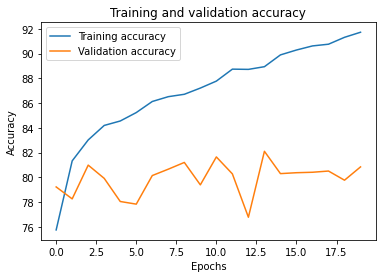

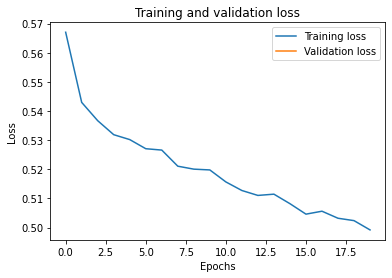

acc %
80.84932625561454
total INCORRECT total examples in val number of correct examples in val
938 4898 3960
Confusion Matrix:
 [[39540 14384]
 [ 5263 38758]]
True Positives: 38758
False Positives: 14384
True Negatives: 39540
False Negatives: 5263
Precision: 0.7293
Recall: 0.8804


/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


training start
Epoch 1/20, Train Loss: 0.3891, Train Acc: 86.3567, Val Loss: 0.2981, Val Acc: 96.03
Epoch 2/20, Train Loss: 0.3556, Train Acc: 95.8079, Val Loss: 0.2975, Val Acc: 96.03
Epoch 3/20, Train Loss: 0.3554, Train Acc: 95.8079, Val Loss: 0.2974, Val Acc: 96.03
Epoch 4/20, Train Loss: 0.3553, Train Acc: 95.8079, Val Loss: 0.2973, Val Acc: 96.03
Epoch 5/20, Train Loss: 0.3553, Train Acc: 95.8079, Val Loss: 0.2973, Val Acc: 96.03
Epoch 6/20, Train Loss: 0.3547, Train Acc: 95.9604, Val Loss: 0.2982, Val Acc: 95.67
Epoch 7/20, Train Loss: 0.3554, Train Acc: 95.6555, Val Loss: 0.3260, Val Acc: 85.92
Epoch 8/20, Train Loss: 0.3553, Train Acc: 95.8079, Val Loss: 0.2973, Val Acc: 96.03
Epoch 9/20, Train Loss: 0.3552, Train Acc: 95.8079, Val Loss: 0.2973, Val Acc: 96.03
Epoch 10/20, Train Loss: 0.3543, Train Acc: 95.8841, Val Loss: 0.2975, Val Acc: 96.03
Epoch 11/20, Train Loss: 0.3520, Train Acc: 96.1890, Val Loss: 0.2998, Val Acc: 94.95
Epoch 12/20, Train Loss: 0.3514, Train Acc: 96.3

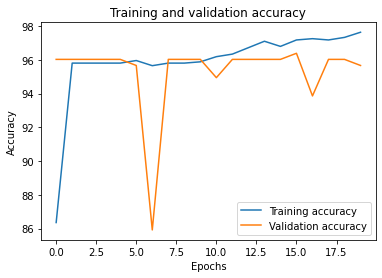

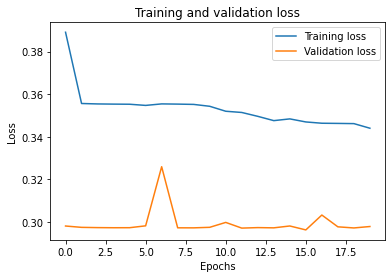

acc %
95.66787003610109
total INCORRECT total examples in val number of correct examples in val
12 277 265
Confusion Matrix:
 [[   5  215]
 [  43 5277]]
True Positives: 5277
False Positives: 215
True Negatives: 5
False Negatives: 43
Precision: 0.9609
Recall: 0.9919


/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


training start
Epoch 1/20, Train Loss: 0.4855, Train Acc: 81.6162, Val Loss: 0.3162, Val Acc: 79.13
Epoch 2/20, Train Loss: 0.4577, Train Acc: 85.7909, Val Loss: 0.2925, Val Acc: 83.72
Epoch 3/20, Train Loss: 0.4398, Train Acc: 90.0038, Val Loss: 0.2930, Val Acc: 85.24
Epoch 4/20, Train Loss: 0.4275, Train Acc: 92.5316, Val Loss: 0.2897, Val Acc: 86.01
Epoch 5/20, Train Loss: 0.4236, Train Acc: 93.6040, Val Loss: 0.2827, Val Acc: 85.50
Epoch 6/20, Train Loss: 0.4181, Train Acc: 94.5232, Val Loss: 0.2794, Val Acc: 87.02
Epoch 7/20, Train Loss: 0.4145, Train Acc: 95.4424, Val Loss: 0.2827, Val Acc: 87.53
Epoch 8/20, Train Loss: 0.4130, Train Acc: 95.7871, Val Loss: 0.3094, Val Acc: 81.68
Epoch 9/20, Train Loss: 0.4047, Train Acc: 97.2807, Val Loss: 0.2826, Val Acc: 86.26
Epoch 10/20, Train Loss: 0.4047, Train Acc: 97.2424, Val Loss: 0.2914, Val Acc: 84.99
Epoch 11/20, Train Loss: 0.4003, Train Acc: 98.0084, Val Loss: 0.2871, Val Acc: 85.24
Epoch 12/20, Train Loss: 0.3978, Train Acc: 98.4

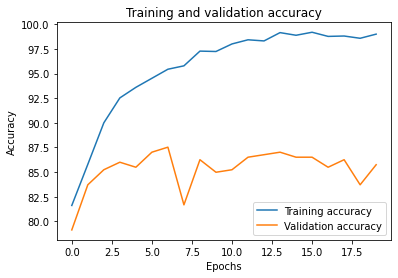

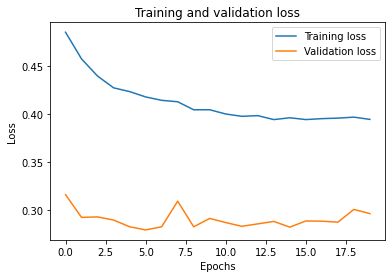

acc %
85.75063613231552
total INCORRECT total examples in val number of correct examples in val
56 393 337
Confusion Matrix:
 [[1165  735]
 [ 417 5543]]
True Positives: 5543
False Positives: 735
True Negatives: 1165
False Negatives: 417
Precision: 0.8829
Recall: 0.9300


/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


training start
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipp

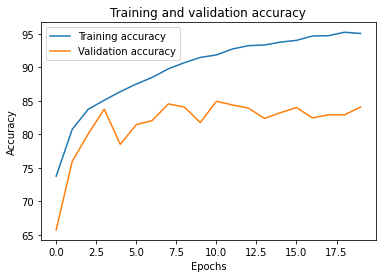

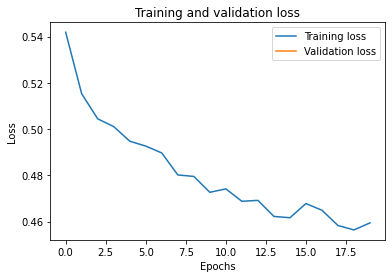

acc %
84.06805877803558
total INCORRECT total examples in val number of correct examples in val
206 1293 1087
Confusion Matrix:
 [[10857  2403]
 [ 2343 10257]]
True Positives: 10257
False Positives: 2403
True Negatives: 10857
False Negatives: 2343
Precision: 0.8102
Recall: 0.8140


/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


training start
Skipping batch due to NaNs.
Epoch 1/20, Train Loss: 0.3963, Train Acc: 91.0093, Val Loss: 0.3701, Val Acc: 91.46
Skipping batch due to NaNs.
Epoch 2/20, Train Loss: 0.3904, Train Acc: 90.6701, Val Loss: 0.3616, Val Acc: 92.17
Skipping batch due to NaNs.
Epoch 3/20, Train Loss: 0.3862, Train Acc: 91.3486, Val Loss: 0.3599, Val Acc: 93.24
Skipping batch due to NaNs.
Epoch 4/20, Train Loss: 0.3802, Train Acc: 92.4512, Val Loss: 0.3605, Val Acc: 91.81
Skipping batch due to NaNs.
Epoch 5/20, Train Loss: 0.3856, Train Acc: 91.6385, Val Loss: 0.3636, Val Acc: 91.81
Skipping batch due to NaNs.
Epoch 6/20, Train Loss: 0.3734, Train Acc: 93.3842, Val Loss: 0.3632, Val Acc: 92.17
Skipping batch due to NaNs.
Epoch 7/20, Train Loss: 0.3742, Train Acc: 93.3842, Val Loss: 0.3645, Val Acc: 91.81
Skipping batch due to NaNs.
Epoch 8/20, Train Loss: 0.3735, Train Acc: 93.8931, Val Loss: 0.3690, Val Acc: 88.61
Skipping batch due to NaNs.
Epoch 9/20, Train Loss: 0.3706, Train Acc: 93.8931, V

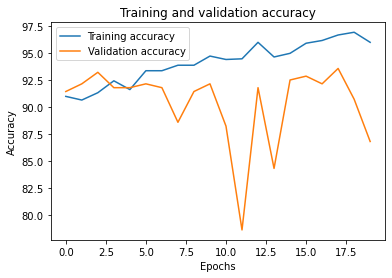

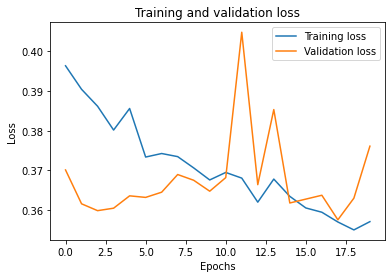

acc %
86.83274021352312
total INCORRECT total examples in val number of correct examples in val
37 281 244
Confusion Matrix:
 [[ 121  359]
 [ 179 4961]]
True Positives: 4961
False Positives: 359
True Negatives: 121
False Negatives: 179
Precision: 0.9325
Recall: 0.9652


/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


training start
Epoch 1/20, Train Loss: 0.5515, Train Acc: 77.5893, Val Loss: 0.4678, Val Acc: 80.42
Epoch 2/20, Train Loss: 0.5245, Train Acc: 83.2321, Val Loss: 0.4533, Val Acc: 86.20
Epoch 3/20, Train Loss: 0.5162, Train Acc: 85.3750, Val Loss: 0.4515, Val Acc: 84.67
Epoch 4/20, Train Loss: 0.5065, Train Acc: 87.4286, Val Loss: 0.4507, Val Acc: 85.83
Epoch 5/20, Train Loss: 0.5028, Train Acc: 88.4643, Val Loss: 0.4443, Val Acc: 88.15
Epoch 6/20, Train Loss: 0.4950, Train Acc: 90.2857, Val Loss: 0.4444, Val Acc: 87.10
Epoch 7/20, Train Loss: 0.4895, Train Acc: 91.5714, Val Loss: 0.4523, Val Acc: 86.34
Epoch 8/20, Train Loss: 0.4873, Train Acc: 91.9464, Val Loss: 0.4434, Val Acc: 88.07
Epoch 9/20, Train Loss: 0.4838, Train Acc: 92.8214, Val Loss: 0.4431, Val Acc: 88.31
Epoch 10/20, Train Loss: 0.4797, Train Acc: 93.6786, Val Loss: 0.4489, Val Acc: 84.42
Epoch 11/20, Train Loss: 0.4782, Train Acc: 94.0893, Val Loss: 0.4673, Val Acc: 84.47
Epoch 12/20, Train Loss: 0.4744, Train Acc: 94.9

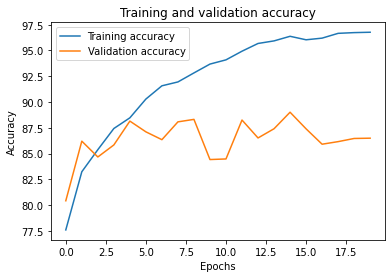

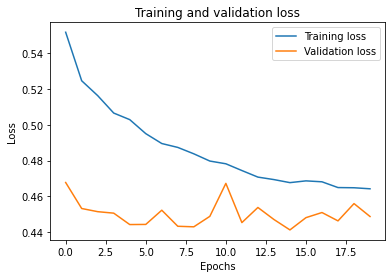

acc %
86.48874061718098
total INCORRECT total examples in val number of correct examples in val
162 1199 1037
Confusion Matrix:
 [[ 7668  1622]
 [ 1648 13069]]
True Positives: 13069
False Positives: 1622
True Negatives: 7668
False Negatives: 1648
Precision: 0.8896
Recall: 0.8880


In [31]:


epochs = 30
trainNew(everything_trn_loader,everyval_nosdpt_loader,'all-iid-scratch.pt')
epochs = 20
trainNew(cocotrain_loader,cocoval_loader, 'coco-iid-scratch.pt')
trainNew(oiltrain_loader,oilval_loader, 'oil-iid-scratch.pt')
trainNew(cashtrain_loader,cashval_loader, 'cashew-iid-scratch.pt')
trainNew(ftrain_loader,fval_loader, 'Fagan-iid-scratch.pt')
trainNew(full_trn_loader,val_nosdpt_loader,'manual-iid-scratch.pt')


# S1 Only

# AUGMENTED

In [28]:
class FocalLoss(nn.Module):
    def __init__(self, gamma=2.0, alpha=None, logits=True, num_classes=3):
        super(FocalLoss, self).__init__()
        self.gamma = gamma
        self.alpha = alpha
        self.logits = logits
        self.num_classes = num_classes

    def forward(self, inputs, targets):
        if self.logits:
            BCE_loss = nn.CrossEntropyLoss(reduction='none')(inputs, targets)
        else:
            BCE_loss = nn.BCELoss(reduction='none')(inputs, targets)

        pt = torch.exp(-BCE_loss)  # Probability of the true class

        # Ensure alpha is a tensor and has the correct shape
        if self.alpha is not None:
            # If alpha is a list or numpy array, convert it to a tensor
            if isinstance(self.alpha, (list, np.ndarray)):
                self.alpha = torch.tensor(self.alpha).to(inputs.device)

            # Gather alpha based on the target classes
            alpha_t = self.alpha[targets]  # Shape will be [batch_size]
            F_loss = alpha_t * (1 - pt) ** self.gamma * BCE_loss
        else:
            F_loss = (1 - pt) ** self.gamma * BCE_loss

        return torch.mean(F_loss)


import torch.nn.init as init
class MultiResNet(nn.Module):
    def __init__(self):
        super(MultiResNet, self).__init__()
        
        # First ResNet for grayscale images
        self.resnet_gray = models.resnet18(pretrained=True)
        self.resnet_gray.conv1 = nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3, bias=False)
        
        # Second ResNet for 24-band images
        self.resnet_24band = models.resnet18(pretrained=True)
        self.resnet_24band.conv1 = nn.Conv2d(4, 64, kernel_size=7, stride=2, padding=3, bias=False)
        
        # Get the number of features in the final layer
        num_features = self.resnet_gray.fc.in_features
        num_features24 = self.resnet_24band.fc.in_features

        # Fully connected layers for tabular data
        self.fc_tabular = nn.Linear(4, 32)  # 4 tabular features
        
        
        # Concatenate the features from both streams
        self.fc = nn.Linear(num_features + num_features24+32,1)# + 32, 1)  # Adjust the output size as needed
        self.sigmoid = nn.Sigmoid()  # Sigmoid activation function for binary classification

        #self._initialize_weights()


    def _initialize_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
            elif isinstance(m, nn.BatchNorm2d):
                init.constant_(m.weight, 1)
                init.constant_(m.bias, 0)
            elif isinstance(m, nn.Linear):
                init.normal_(m.weight, 0, 0.01)
                init.constant_(m.bias, 0)
        
    def forward(self, x_gray, x_24band, tabular_features):

        
        # Forward pass through the grayscale ResNet
        x_gray = self.resnet_gray.conv1(x_gray)
        x_gray = self.resnet_gray.bn1(x_gray)
        x_gray = self.resnet_gray.relu(x_gray)
        x_gray = self.resnet_gray.maxpool(x_gray)
        #print('x_gray after maxpool')
        #print(x_gray)
        x_gray = self.resnet_gray.layer1(x_gray)
        x_gray = self.resnet_gray.layer2(x_gray)
        x_gray = self.resnet_gray.layer3(x_gray)
        x_gray = self.resnet_gray.layer4(x_gray)
        #print('x_gray after layers')
        #print(x_gray)
        x_gray = self.resnet_gray.avgpool(x_gray)
        x_gray = torch.flatten(x_gray, 1)

        
        # Forward pass through the 24-band ResNet
        x_24band = self.resnet_24band.conv1(x_24band)
        x_24band = self.resnet_24band.bn1(x_24band)
        x_24band = self.resnet_24band.relu(x_24band)
        x_24band = self.resnet_24band.maxpool(x_24band)
        #print('x_24 after maxpool')
        #print(x_24band[0])
        x_24band = self.resnet_24band.layer1(x_24band)
        x_24band = self.resnet_24band.layer2(x_24band)
        x_24band = self.resnet_24band.layer3(x_24band)
        x_24band = self.resnet_24band.layer4(x_24band)
        x_24band = self.resnet_24band.avgpool(x_24band)
        x_24band = torch.flatten(x_24band, 1)
        
        x3 = self.fc_tabular(tabular_features)
        x3 = x3[:x_gray.size(0)]
            
        # Concatenate the features from both streams
        x = torch.cat((x_gray, x_24band,x3),dim=1)#, x3), dim=1)
        x = self.fc(x)       
        x = self.sigmoid(x)
        return x

# Example usage
model = MultiResNet()
model.to(device)
criterion = FocalLoss(alpha=[1.5,1])
optimizer = optim.Adam(model.parameters(), lr=0.0001)

In [29]:
def trainNew(train_loader,val_loader, modelpath, model, criterion,num_epochs):
    #############
    #### TRIMODAL
    ##############
    model = model
    model.to(device)
    criterion = criterion
    optimizer = optim.Adam(model.parameters(), lr=0.0001)
    model.train()

    print('training start')
    trn_acc_list = []
    val_acc_list = []
    trn_loss_list = []
    val_loss_list = []
    all_predictions = []
    all_labels = []
    
    for epoch in range(num_epochs):
    
        model.train()
        correct = 0
        total = 0
        train_loss = 0.0
    
        for inputs, inputsCHM, s1, labs, paths in train_loader:

            inputs = inputs.to("cuda")
            inputsCHM = inputsCHM.to("cuda")
            labs = torch.Tensor(labs).unsqueeze(1).to("cuda")
            s1 = s1.to(device).float()
            
            #if torch.isnan(inputs).any() or torch.isnan(inputsCHM).any() or torch.isnan(s1).any() or torch.isnan(labs).any():
            nan_indices = torch.isnan(s1)
            if nan_indices.any():
            #if torch.isnan(s1).any():
                print("Skipping batch due to NaNs.")
                continue

                    
            for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
                channel_data = inputs[:, c, :, :]
                mask = torch.isnan(channel_data)
                mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
                
                channel_data[mask] = mean_val.expand_as(channel_data)[mask]
                inputs[:, c, :, :] = channel_data
            if torch.isnan(inputs).any():
                raise ValueError("NaNs found in inputs after interpolation")
        
            # Check for NaNs in inputsCHM and labs
            if torch.isnan(inputsCHM).any():
                raise ValueError("NaNs found in inputsCHM")

            if torch.isnan(s1).any():
                print(torch.isnan(s1))
                print("NaNs found in S1!")
        
            if torch.isnan(labs).any():
                raise ValueError("NaNs found in labs")
            
            optimizer.zero_grad()
            outputs = model(inputsCHM,inputs,s1)
            if torch.isnan(outputs).any():
                print(f"Inputs: {inputs[0][0]}")
                print(f"Model outputs: {outputs}")
                raise ValueError("NaNs found in model outputs")
    
            loss = criterion(outputs, labs.float())
            if torch.isnan(loss).any():
                raise ValueError("NaNs found in loss")
    
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)

            
            optimizer.step()
            train_loss += loss.item() * inputs.size(0)
            predicted = (outputs > 0.5).float()
            total += labs.size(0)
            correct += (predicted == labs).sum().item()
        trn_acc_list.append(correct/total * 100)
        trn_loss_list.append(train_loss/len(train_loader.dataset))
    
        #if epoch == 19: 
        #    torch.save(model.state_dict(), modelpath)
    
    
        # Validate the model
        model.eval()
        val_loss = 0.0
        correct = 0
        total = 0
        with torch.no_grad():
            
            for inputs, inputsCHM, s1, labs, paths in val_loader:
    
                inputs= inputs.to("cuda")
                
                inputsCHM = inputsCHM.to("cuda")
                labs = torch.Tensor(labs).unsqueeze(1).to("cuda")
                s1 = s1.to(device).float()            #normalized_inputs = normalizer(inputs)

                has_nan = torch.isnan(inputs).any(dim=1)  # Check along batch dimension (assuming dim=0 is batch)
                # Filter inputs to exclude those with NaNs
                has_nan_anywhere = torch.any(torch.any(has_nan, dim=1), dim=1)
        
                inputs = inputs[~has_nan_anywhere]
                inputsCHM = inputsCHM[~has_nan_anywhere]
                labs = labs[~has_nan_anywhere]
                
                outputs = model(inputsCHM, inputs, s1)
                loss = criterion(outputs, labs.float())
                val_loss += loss.item() * inputs.size(0)
                predicted = (outputs > 0.5).float()
                total += labs.size(0)
                correct += (predicted == labs).sum().item()
                all_predictions.extend(predicted.cpu().numpy())
                all_labels.extend(labs.cpu().numpy())
            val_acc_list.append(correct/total * 100)
            val_loss_list.append(val_loss / len(val_loader.dataset))
    
        print(f'Epoch {epoch+1}/{num_epochs}, '
              f'Train Loss: {train_loss/len(train_loader.dataset):.4f}, '
              f'Train Acc: {trn_acc_list[-1]:.4f}, '
              #f'Train Acc: {trn_acc_list[-1])*100:.4f}, '
              f'Val Loss: {val_loss/len(val_loader.dataset):.4f}, '
              f'Val Acc: {(correct/total)*100:.2f}' )
    
    plot_res(trn_acc_list,val_acc_list,trn_loss_list,val_loss_list,all_labels,all_predictions, correct, total)
    
    return



In [30]:
model = MultiResNet()
model.to(device)
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)

training start
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipp

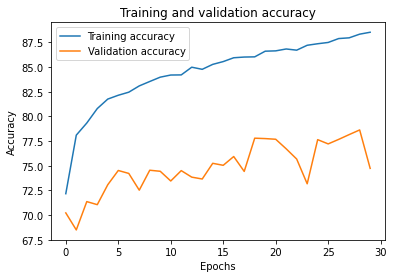

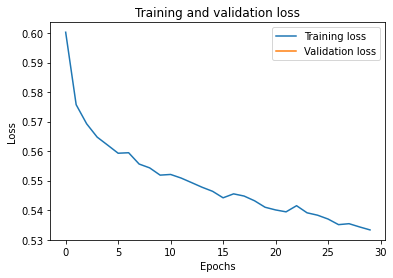

acc %
74.73060344827587
total INCORRECT total examples in val number of correct examples in val
1876 7424 5548
Confusion Matrix:
 [[93565  8249]
 [47928 72978]]
True Positives: 72978
False Positives: 8249
True Negatives: 93565
False Negatives: 47928
Precision: 0.8984
Recall: 0.6036
training start
Epoch 1/20, Train Loss: 0.7880, Train Acc: 80.7927, Val Loss: 0.7767, Val Acc: 82.37
Epoch 2/20, Train Loss: 0.7524, Train Acc: 86.5091, Val Loss: 0.7321, Val Acc: 89.67
Epoch 3/20, Train Loss: 0.7347, Train Acc: 89.4817, Val Loss: 0.7353, Val Acc: 89.06
Epoch 4/20, Train Loss: 0.7265, Train Acc: 90.9299, Val Loss: 0.7412, Val Acc: 88.15
Epoch 5/20, Train Loss: 0.7287, Train Acc: 90.3963, Val Loss: 0.7358, Val Acc: 88.45
Epoch 6/20, Train Loss: 0.7227, Train Acc: 91.6159, Val Loss: 0.7316, Val Acc: 90.27
Epoch 7/20, Train Loss: 0.7187, Train Acc: 92.0732, Val Loss: 0.7216, Val Acc: 91.49
Epoch 8/20, Train Loss: 0.7183, Train Acc: 92.2256, Val Loss: 0.7265, Val Acc: 90.58
Epoch 9/20, Train Loss

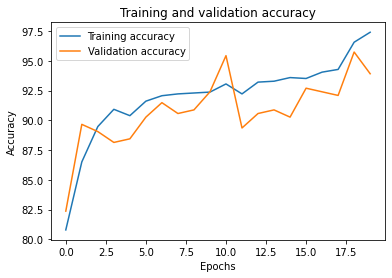

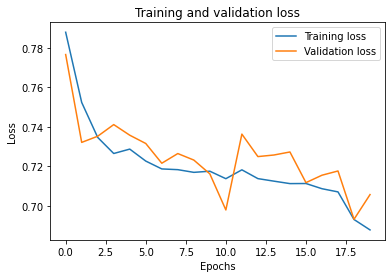

acc %
93.9209726443769
total INCORRECT total examples in val number of correct examples in val
20 329 309
Confusion Matrix:
 [[5953  347]
 [ 256   24]]
True Positives: 24
False Positives: 347
True Negatives: 5953
False Negatives: 256
Precision: 0.0647
Recall: 0.0857
training start
Epoch 1/20, Train Loss: 0.6648, Train Acc: 88.1272, Val Loss: 0.6441, Val Acc: 88.36
Epoch 2/20, Train Loss: 0.6510, Train Acc: 91.9188, Val Loss: 0.6356, Val Acc: 90.20
Epoch 3/20, Train Loss: 0.6470, Train Acc: 93.0295, Val Loss: 0.6324, Val Acc: 91.12
Epoch 4/20, Train Loss: 0.6453, Train Acc: 93.3359, Val Loss: 0.6317, Val Acc: 91.58
Epoch 5/20, Train Loss: 0.6425, Train Acc: 93.9487, Val Loss: 0.6298, Val Acc: 92.04
Epoch 6/20, Train Loss: 0.6416, Train Acc: 94.2934, Val Loss: 0.6299, Val Acc: 92.19
Epoch 7/20, Train Loss: 0.6405, Train Acc: 94.5998, Val Loss: 0.6317, Val Acc: 91.58
Epoch 8/20, Train Loss: 0.6421, Train Acc: 94.1019, Val Loss: 0.6311, Val Acc: 91.42
Epoch 9/20, Train Loss: 0.6398, Train 

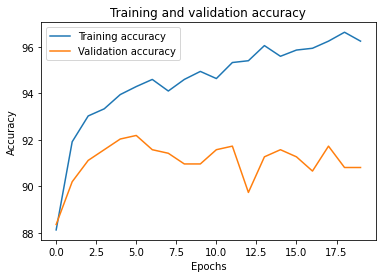

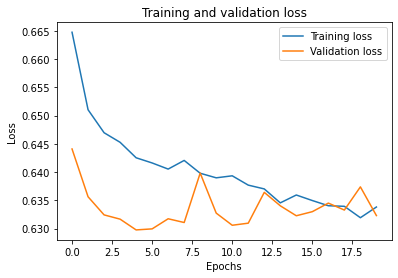

acc %
90.81163859111791
total INCORRECT total examples in val number of correct examples in val
60 653 593
Confusion Matrix:
 [[9607  113]
 [1052 2288]]
True Positives: 2288
False Positives: 113
True Negatives: 9607
False Negatives: 1052
Precision: 0.9529
Recall: 0.6850
training start
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch

In [ ]:
epochs = 30
trainNew(everything_trn_loader,everyval_nosdpt_loader,'all-iid-aug.pt',model,criterion, epochs)
epochs = 20
trainNew(cocotrain_loader,cocoval_loader, 'coco-iid-aug.pt',model,criterion, epochs)
trainNew(oiltrain_loader,oilval_loader, 'oil-iid-aug.pt',model,criterion, epochs)
trainNew(cashtrain_loader,cashval_loader, 'cashew-iid-aug.pt',model,criterion, epochs)
trainNew(ftrain_loader,fval_loader, 'Fagan-iid-aug.pt',model,criterion, epochs)
trainNew(full_trn_loader,val_nosdpt_loader,'manual-iid-aug.pt',model,criterion, epochs)

# SatMAE ++ 

# LOO Dist Shifts

Training perturbation with features:
[<__main__.PairedImageDataset object at 0x7fb638065670>, <__main__.PairedImageDataset object at 0x7fb821ce82b0>, <__main__.PairedImageDataset object at 0x7fb63e033940>, <__main__.PairedImageDataset object at 0x7fb63d2c4f10>, <__main__.PairedImageDataset object at 0x7fb7cc1004f0>]
training start
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to N

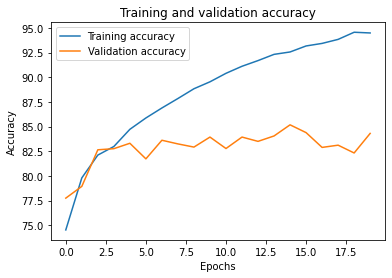

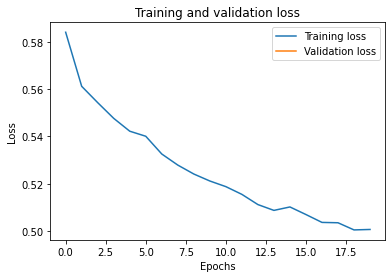

acc %
84.31056701030928
total INCORRECT total examples in val number of correct examples in val
974 6208 5234
Confusion Matrix:
 [[54242  7977]
 [13292 48649]]
True Positives: 48649
False Positives: 7977
True Negatives: 54242
False Negatives: 13292
Precision: 0.8591
Recall: 0.7854
Training perturbation with features:
[<__main__.PairedImageDataset object at 0x7fb638065670>, <__main__.PairedImageDataset object at 0x7fb821ce82b0>, <__main__.PairedImageDataset object at 0x7fb63e033940>, <__main__.PairedImageDataset object at 0x7fb63d2c4f10>, <__main__.PairedImageDataset object at 0x7fb639490d00>]


/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


training start
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipp

KeyboardInterrupt: 

In [24]:
subs = [ 
    [full_trn_ds, cocotrain_dataset, cashtrain_dataset, civtrain_dataset, oiltrain_dataset],
    [full_trn_ds, cocotrain_dataset, cashtrain_dataset, civtrain_dataset, ftrain_dataset],
    [full_trn_ds, cocotrain_dataset, cashtrain_dataset, oiltrain_dataset, ftrain_dataset], 
    [full_trn_ds, cocotrain_dataset, civtrain_dataset, oiltrain_dataset, ftrain_dataset],
    [full_trn_ds, cashtrain_dataset, civtrain_dataset, oiltrain_dataset, ftrain_dataset],
    [cocotrain_dataset, cashtrain_dataset, civtrain_dataset, oiltrain_dataset, ftrain_dataset]
]
subsv = [
    [val_nosdpt_ds, cocoval_dataset, cashval_dataset, civval_dataset, oilval_dataset],
    [val_nosdpt_ds, cocoval_dataset, cashval_dataset, civval_dataset, fval_dataset],
    [val_nosdpt_ds, cocoval_dataset, cashval_dataset, oilval_dataset, fval_dataset], 
    [val_nosdpt_ds, cashval_dataset, cashval_dataset, civval_dataset, fval_dataset],
    [cocoval_dataset, cashval_dataset, civval_dataset, oilval_dataset, fval_dataset]
]
        
for i in range(len(subs)):
    sub = subs[i]
    subv = subsv[i]
    everything_trn_ds = sub[0].concatenate(sub[1:])
    everything_trn_loader = DataLoader(everything_trn_ds,batch_size=32,shuffle=True, drop_last=True)
    
    everyval_nosdpt_ds = subv[0].concatenate(subv[1:])
    everyval_nosdpt_loader = DataLoader(everyval_nosdpt_ds,batch_size=32,shuffle=True,drop_last=True)
    print('Training perturbation with features:')
    print(sub)
    trainNew(everything_trn_loader, everyval_nosdpt_loader,'loo.pt')
    
    del everything_trn_ds, everyval_nosdpt_ds, everything_trn_loader, everyval_nosdpt_loader

Training perturbation with features:
training start
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to Na

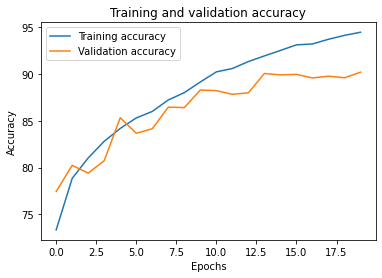

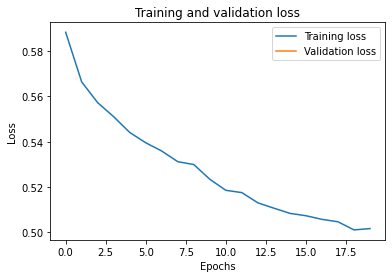

acc %
90.17723880597015
total INCORRECT total examples in val number of correct examples in val
1053 10720 9667
Confusion Matrix:
 [[113265   8910]
 [ 20571  71654]]
True Positives: 71654
False Positives: 8910
True Negatives: 113265
False Negatives: 20571
Precision: 0.8894
Recall: 0.7769
Epoch 20/20, Val Loss: nan, Val Acc: 90.20
Confusion Matrix:
 [[5698  638]
 [ 413 3971]]
True Positives: 3971
False Positives: 638
True Negatives: 5698
False Negatives: 413
Precision: 0.8616
Recall: 0.9058
Epoch 20/20, Val Loss: 0.6005, Val Acc: 85.54
Confusion Matrix:
 [[773 129]
 [ 70 404]]
True Positives: 404
False Positives: 129
True Negatives: 773
False Negatives: 70
Precision: 0.7580
Recall: 0.8523
Epoch 20/20, Val Loss: 0.7541, Val Acc: 86.32
Confusion Matrix:
 [[279   9]
 [ 36   5]]
True Positives: 5
False Positives: 9
True Negatives: 279
False Negatives: 36
Precision: 0.3571
Recall: 0.1220
Epoch 20/20, Val Loss: nan, Val Acc: 82.52
Confusion Matrix:
 [[1196  253]
 [ 257 1212]]
True Positives: 

/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


training start
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipp

KeyboardInterrupt: 

In [27]:
subs = [ 
    [full_trn_ds, cocotrain_dataset, cashtrain_dataset, civtrain_dataset, oiltrain_dataset],
    [full_trn_ds, cocotrain_dataset, cashtrain_dataset, civtrain_dataset, ftrain_dataset],
    [full_trn_ds, cocotrain_dataset, cashtrain_dataset, oiltrain_dataset, ftrain_dataset], 
    [full_trn_ds, cocotrain_dataset, civtrain_dataset, oiltrain_dataset, ftrain_dataset],
    [full_trn_ds, cashtrain_dataset, civtrain_dataset, oiltrain_dataset, ftrain_dataset],
    [cocotrain_dataset, cashtrain_dataset, civtrain_dataset, oiltrain_dataset, ftrain_dataset]
]

        
for i in range(len(subs)):
    sub = subs[i]
    subv = subsv[i]
    everything_trn_ds = sub[0].concatenate(sub[1:])
    everything_trn_loader = DataLoader(everything_trn_ds,batch_size=32,shuffle=True, drop_last=True)
    
    everyval_nosdpt_ds = subv[0].concatenate(subv[1:])
    everyval_nosdpt_loader = DataLoader(everyval_nosdpt_ds,batch_size=32,shuffle=True,drop_last=True)
    print('Training perturbation with features:')

    del everyval_nosdpt_ds,everyval_nosdpt_loader
    #print(sub)
    everyval_nosdpt_ds = full_trn_ds.concatenate([cocoval_dataset, cashval_dataset, civval_dataset, oilval_dataset, fval_dataset])
    everyval_nosdpt_loader = DataLoader(everyval_nosdpt_ds,batch_size=32,shuffle=True,drop_last=True)
    trainNew(everything_trn_loader, everyval_nosdpt_loader,'loo.pt', [everyval_nosdpt_loader, val_nosdpt_loader, cocoval_loader, cashval_loader, civval_loader, oilval_loader, fval_loader])
    
    del everything_trn_ds, everyval_nosdpt_ds, everything_trn_loader, everyval_nosdpt_loader

In [ ]:
subs = [ 
    [full_trn_ds, cocotrain_dataset, cashtrain_dataset, civtrain_dataset, oiltrain_dataset],
    [full_trn_ds, cocotrain_dataset, cashtrain_dataset, civtrain_dataset, ftrain_dataset],
    [full_trn_ds, cocotrain_dataset, cashtrain_dataset, oiltrain_dataset, ftrain_dataset], 
    [full_trn_ds, cocotrain_dataset, civtrain_dataset, oiltrain_dataset, ftrain_dataset],
    [full_trn_ds, cashtrain_dataset, civtrain_dataset, oiltrain_dataset, ftrain_dataset],
    [cocotrain_dataset, cashtrain_dataset, civtrain_dataset, oiltrain_dataset, ftrain_dataset]
]

        
for i in range(len(subs)):
    sub = subs[i]
    subv = subsv[i]
    everything_trn_ds = sub[0].concatenate(sub[1:])
    everything_trn_loader = DataLoader(everything_trn_ds,batch_size=32,shuffle=True, drop_last=True)
    
    everyval_nosdpt_ds = subv[0].concatenate(subv[1:])
    everyval_nosdpt_loader = DataLoader(everyval_nosdpt_ds,batch_size=32,shuffle=True,drop_last=True)
    print('Training perturbation with features:')

    del everyval_nosdpt_loader
    #print(sub)
    everyval_nosdpt_ds = full_trn_ds.concatenate([cocoval_dataset, cashval_dataset, civval_dataset, oilval_dataset, fval_dataset])
    everyval_loader = DataLoader(everyval_nosdpt_ds,batch_size=32,shuffle=True,drop_last=True)
    del everyval_nosdpt_ds
    trainNew(everything_trn_loader, everyval_loader,'loo.pt', [everyval_nosdpt_loader, val_nosdpt_loader, cocoval_loader, cashval_loader, civval_loader, oilval_loader, fval_loader])
    
    del everything_trn_ds, everyval_nosdpt_ds, everything_trn_loader, everyval_nosdpt_loader, everyval_loader

Training perturbation with features:
[<__main__.PairedImageDataset object at 0x7faa1491b670>, <__main__.PairedImageDataset object at 0x7faa19d00430>, <__main__.PairedImageDataset object at 0x7faba89b3790>, <__main__.PairedImageDataset object at 0x7faa19b70b50>, <__main__.PairedImageDataset object at 0x7faa14d497c0>]
training start
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to N

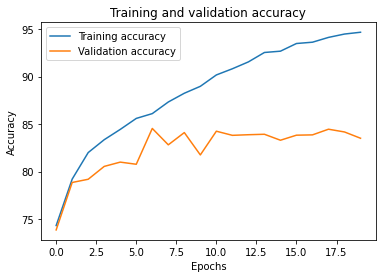

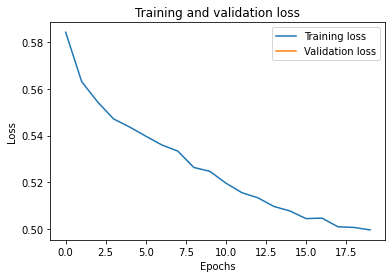

acc %
83.50515463917526
total INCORRECT total examples in val number of correct examples in val
1024 6208 5184
Confusion Matrix:
 [[56087  6127]
 [15827 46119]]
True Positives: 46119
False Positives: 6127
True Negatives: 56087
False Negatives: 15827
Precision: 0.8827
Recall: 0.7445


NameError: name 'epoch' is not defined

In [25]:
subs = [ 
    [full_trn_ds, cocotrain_dataset, cashtrain_dataset, civtrain_dataset, oiltrain_dataset],
    [full_trn_ds, cocotrain_dataset, cashtrain_dataset, civtrain_dataset, ftrain_dataset],
    [full_trn_ds, cocotrain_dataset, cashtrain_dataset, oiltrain_dataset, ftrain_dataset], 
    [full_trn_ds, cocotrain_dataset, civtrain_dataset, oiltrain_dataset, ftrain_dataset],
    [full_trn_ds, cashtrain_dataset, civtrain_dataset, oiltrain_dataset, ftrain_dataset],
    [cocotrain_dataset, cashtrain_dataset, civtrain_dataset, oiltrain_dataset, ftrain_dataset]
]
subsv = [
    [val_nosdpt_ds, cocoval_dataset, cashval_dataset, civval_dataset, oilval_dataset],
    [val_nosdpt_ds, cocoval_dataset, cashval_dataset, civval_dataset, fval_dataset],
    [val_nosdpt_ds, cocoval_dataset, cashval_dataset, oilval_dataset, fval_dataset], 
    [val_nosdpt_ds, cashval_dataset, cashval_dataset, civval_dataset, fval_dataset],
    [cocoval_dataset, cashval_dataset, civval_dataset, oilval_dataset, fval_dataset]
]
        
for i in range(len(subs)):
    sub = subs[i]
    subv = subsv[i]
    everything_trn_ds = sub[0].concatenate(sub[1:])
    everything_trn_loader = DataLoader(everything_trn_ds,batch_size=32,shuffle=True, drop_last=True)
    
    everyval_nosdpt_ds = subv[0].concatenate(subv[1:])
    everyval_nosdpt_loader = DataLoader(everyval_nosdpt_ds,batch_size=32,shuffle=True,drop_last=True)
    print('Training perturbation with features:')
    print(sub)
    model, all_predictions, all_labels = trainNew(everything_trn_loader, everyval_nosdpt_loader,'loo.pt')
    
    del everything_trn_ds, everyval_nosdpt_ds, everything_trn_loader, everyval_nosdpt_loader

    everyval_nosdpt_ds = full_trn_ds.concatenate([cocoval_dataset, cashval_dataset, civval_dataset, oilval_dataset, fval_dataset])
    everyval_loader = DataLoader(everyval_nosdpt_ds,batch_size=32,shuffle=True,drop_last=True)
    del everyval_nosdpt_ds
    test_loaders = [everyval_loader, val_nosdpt_loader, cocoval_loader, cashval_loader, civval_loader, oilval_loader, fval_loader]
    
    
    for tl in test_loaders:
        print(tl)
         # Validate the model
        model.eval()
        val_loss = 0.0
        correct = 0
        total = 0

        with torch.no_grad():
            
            for inputs, inputsCHM, s1, labs, paths in tl:
    
                inputs= inputs.to("cuda")
                
                inputsCHM = inputsCHM.to("cuda")
                labs = torch.Tensor(labs).unsqueeze(1).to("cuda")
                s1 = s1.to(device).float()            #normalized_inputs = normalizer(inputs)

                has_nan = torch.isnan(inputs).any(dim=1)  # Check along batch dimension (assuming dim=0 is batch)
                # Filter inputs to exclude those with NaNs
                has_nan_anywhere = torch.any(torch.any(has_nan, dim=1), dim=1)
        
                inputs = inputs[~has_nan_anywhere]
                inputsCHM = inputsCHM[~has_nan_anywhere]
                labs = labs[~has_nan_anywhere]
                
                outputs = model(inputsCHM, inputs, s1)
                loss = criterion(outputs, labs.float())
                val_loss += loss.item() * inputs.size(0)
                predicted = (outputs > 0.5).float()
                total += labs.size(0)
                correct += (predicted == labs).sum().item()
                all_predictions.extend(predicted.cpu().numpy())
                all_labels.extend(labs.cpu().numpy())
    
        print(f'Val Loss: {val_loss/len(tl.dataset):.4f}, '
              f'Val Acc: {(correct/total)*100:.2f}' )
        print_cm(all_labels,all_predictions)
    del everyval_loader

In [26]:

    for tl in test_loaders:
        print(tl)
         # Validate the model
        model.eval()
        val_loss = 0.0
        correct = 0
        total = 0

        with torch.no_grad():
            
            for inputs, inputsCHM, s1, labs, paths in tl:
    
                inputs= inputs.to("cuda")
                
                inputsCHM = inputsCHM.to("cuda")
                labs = torch.Tensor(labs).unsqueeze(1).to("cuda")
                s1 = s1.to(device).float()            #normalized_inputs = normalizer(inputs)

                has_nan = torch.isnan(inputs).any(dim=1)  # Check along batch dimension (assuming dim=0 is batch)
                # Filter inputs to exclude those with NaNs
                has_nan_anywhere = torch.any(torch.any(has_nan, dim=1), dim=1)
        
                inputs = inputs[~has_nan_anywhere]
                inputsCHM = inputsCHM[~has_nan_anywhere]
                labs = labs[~has_nan_anywhere]
                
                outputs = model(inputsCHM, inputs, s1)
                loss = criterion(outputs, labs.float())
                val_loss += loss.item() * inputs.size(0)
                predicted = (outputs > 0.5).float()
                total += labs.size(0)
                correct += (predicted == labs).sum().item()
                all_predictions.extend(predicted.cpu().numpy())
                all_labels.extend(labs.cpu().numpy())
    
        print(f'Val Loss: {val_loss/len(tl.dataset):.4f}, '
              f'Val Acc: {(correct/total)*100:.2f}' )
        print_cm(all_labels,all_predictions)
    del everyval_loader

Val Loss: nan, Val Acc: 89.79
Confusion Matrix:
 [[67638  7648]
 [16494 53820]]
True Positives: 53820
False Positives: 7648
True Negatives: 67638
False Negatives: 16494
Precision: 0.8756
Recall: 0.7654
Val Loss: 0.6085, Val Acc: 83.43
Confusion Matrix:
 [[68416  7805]
 [16565 54190]]
True Positives: 54190
False Positives: 7805
True Negatives: 68416
False Negatives: 16565
Precision: 0.8741
Recall: 0.7659
Val Loss: 0.7285, Val Acc: 90.27
Confusion Matrix:
 [[68709  7815]
 [16587 54194]]
True Positives: 54194
False Positives: 7815
True Negatives: 68709
False Negatives: 16587
Precision: 0.8740
Recall: 0.7657
Val Loss: nan, Val Acc: 81.87
Confusion Matrix:
 [[69936  8118]
 [16813 55356]]
True Positives: 55356
False Positives: 8118
True Negatives: 69936
False Negatives: 16813
Precision: 0.8721
Recall: 0.7670
Val Loss: 0.3527, Val Acc: 89.15
Confusion Matrix:
 [[69936  8218]
 [16813 56178]]
True Positives: 56178
False Positives: 8218
True Negatives: 69936
False Negatives: 16813
Precision: 0.8

Training perturbation with features:
[<__main__.PairedImageDataset object at 0x7fdf3eb7e970>, <__main__.PairedImageDataset object at 0x7fdf5ee14520>, <__main__.PairedImageDataset object at 0x7fdfe57a2f70>, <__main__.PairedImageDataset object at 0x7fe0f879cd30>, <__main__.PairedImageDataset object at 0x7fdfe8409b20>]
training start
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to N

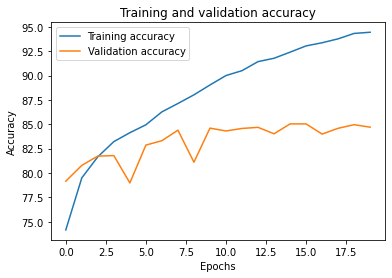

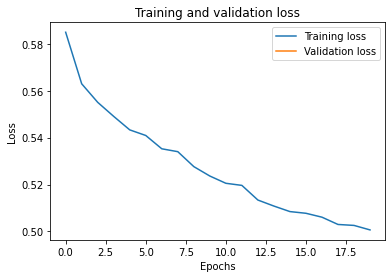

acc %
84.6971649484536
total INCORRECT total examples in val number of correct examples in val
950 6208 5258
Confusion Matrix:
 [[54995  7211]
 [13612 48342]]
True Positives: 48342
False Positives: 7211
True Negatives: 54995
False Negatives: 13612
Precision: 0.8702
Recall: 0.7803
Val Loss: nan, Val Acc: 90.38
Confusion Matrix:
 [[5730  651]
 [ 380 3959]]
True Positives: 3959
False Positives: 651
True Negatives: 5730
False Negatives: 380
Precision: 0.8588
Recall: 0.9124
Val Loss: 0.5995, Val Acc: 84.96
Confusion Matrix:
 [[781 145]
 [ 62 388]]
True Positives: 388
False Positives: 145
True Negatives: 781
False Negatives: 62
Precision: 0.7280
Recall: 0.8622
Val Loss: 0.7256, Val Acc: 90.88
Confusion Matrix:
 [[295  10]
 [ 20   4]]
True Positives: 4
False Positives: 10
True Negatives: 295
False Negatives: 20
Precision: 0.2857
Recall: 0.1667
Val Loss: nan, Val Acc: 82.86
Confusion Matrix:
 [[1172  219]
 [ 281 1246]]
True Positives: 1246
False Positives: 219
True Negatives: 1172
False Negati

/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


training start
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipp

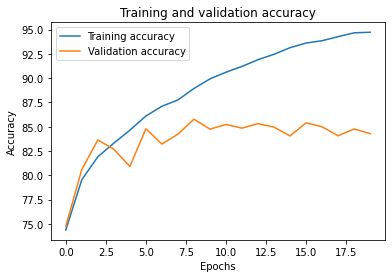

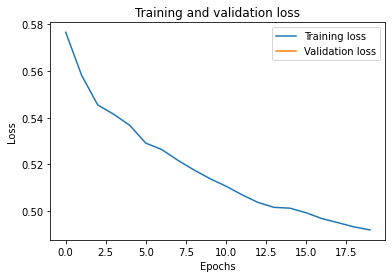

acc %
84.2896174863388
total INCORRECT total examples in val number of correct examples in val
920 5856 4936
Confusion Matrix:
 [[51922  6056]
 [13077 46065]]
True Positives: 46065
False Positives: 6056
True Negatives: 51922
False Negatives: 13077
Precision: 0.8838
Recall: 0.7789
Val Loss: nan, Val Acc: 89.51
Confusion Matrix:
 [[5836  845]
 [ 279 3760]]
True Positives: 3760
False Positives: 845
True Negatives: 5836
False Negatives: 279
Precision: 0.8165
Recall: 0.9309
Val Loss: 0.6001, Val Acc: 84.38
Confusion Matrix:
 [[807 172]
 [ 43 354]]
True Positives: 354
False Positives: 172
True Negatives: 807
False Negatives: 43
Precision: 0.6730
Recall: 0.8917
Val Loss: 0.7163, Val Acc: 92.40
Confusion Matrix:
 [[301  11]
 [ 14   3]]
True Positives: 3
False Positives: 11
True Negatives: 301
False Negatives: 14
Precision: 0.2143
Recall: 0.1765
Val Loss: nan, Val Acc: 81.01
Confusion Matrix:
 [[1255  356]
 [ 198 1109]]
True Positives: 1109
False Positives: 356
True Negatives: 1255
False Negati

/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


training start
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipp

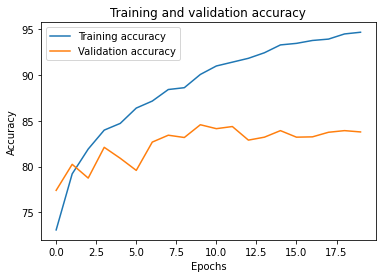

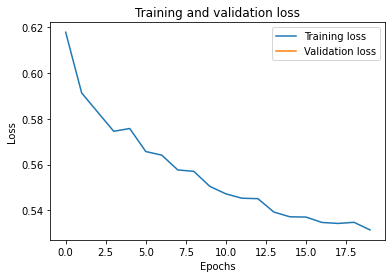

acc %
83.78571428571429
total INCORRECT total examples in val number of correct examples in val
908 5600 4692
Confusion Matrix:
 [[62296  5517]
 [14119 30068]]
True Positives: 30068
False Positives: 5517
True Negatives: 62296
False Negatives: 14119
Precision: 0.8450
Recall: 0.6805
Val Loss: nan, Val Acc: 88.06
Confusion Matrix:
 [[5845 1020]
 [ 260 3595]]
True Positives: 3595
False Positives: 1020
True Negatives: 5845
False Negatives: 260
Precision: 0.7790
Recall: 0.9326
Val Loss: 0.6051, Val Acc: 83.21
Confusion Matrix:
 [[796 178]
 [ 53 349]]
True Positives: 349
False Positives: 178
True Negatives: 796
False Negatives: 53
Precision: 0.6622
Recall: 0.8682
Val Loss: 0.7290, Val Acc: 89.97
Confusion Matrix:
 [[295  13]
 [ 20   1]]
True Positives: 1
False Positives: 13
True Negatives: 295
False Negatives: 20
Precision: 0.0714
Recall: 0.0476
Val Loss: nan, Val Acc: 82.80
Confusion Matrix:
 [[1244  293]
 [ 209 1172]]
True Positives: 1172
False Positives: 293
True Negatives: 1244
False Nega

/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


training start
Skipping batch due to NaNs.
Epoch 1/20, Train Loss: 0.6046, Train Acc: 81.5972, Val Loss: nan, Val Acc: 62.81
Skipping batch due to NaNs.
Epoch 2/20, Train Loss: 0.5911, Train Acc: 84.4236, Val Loss: nan, Val Acc: 65.25
Skipping batch due to NaNs.
Epoch 3/20, Train Loss: 0.5831, Train Acc: 86.3681, Val Loss: nan, Val Acc: 66.48
Skipping batch due to NaNs.
Epoch 4/20, Train Loss: 0.5767, Train Acc: 87.6250, Val Loss: nan, Val Acc: 67.60
Skipping batch due to NaNs.
Epoch 5/20, Train Loss: 0.5734, Train Acc: 88.4306, Val Loss: nan, Val Acc: 68.47
Skipping batch due to NaNs.
Epoch 6/20, Train Loss: 0.5686, Train Acc: 89.6181, Val Loss: nan, Val Acc: 66.71
Skipping batch due to NaNs.
Epoch 7/20, Train Loss: 0.5647, Train Acc: 90.7014, Val Loss: nan, Val Acc: 70.16
Skipping batch due to NaNs.
Epoch 8/20, Train Loss: 0.5623, Train Acc: 91.1181, Val Loss: nan, Val Acc: 69.89
Skipping batch due to NaNs.
Epoch 9/20, Train Loss: 0.5593, Train Acc: 91.7639, Val Loss: nan, Val Acc: 6

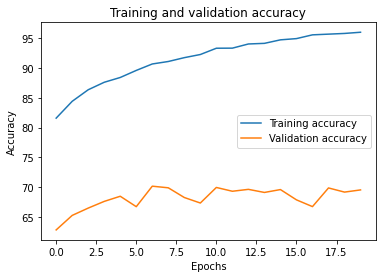

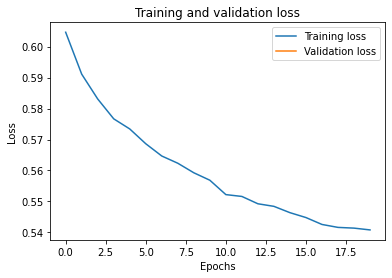

acc %
69.53125
total INCORRECT total examples in val number of correct examples in val
2574 8448 5874
Confusion Matrix:
 [[60780 20006]
 [33752 54422]]
True Positives: 54422
False Positives: 20006
True Negatives: 60780
False Negatives: 33752
Precision: 0.7312
Recall: 0.6172
Val Loss: nan, Val Acc: 85.46
Confusion Matrix:
 [[5448  899]
 [ 660 3713]]
True Positives: 3713
False Positives: 899
True Negatives: 5448
False Negatives: 660
Precision: 0.8051
Recall: 0.8491
Val Loss: 0.6087, Val Acc: 83.72
Confusion Matrix:
 [[787 155]
 [ 69 365]]
True Positives: 365
False Positives: 155
True Negatives: 787
False Negatives: 69
Precision: 0.7019
Recall: 0.8410
Val Loss: 0.7139, Val Acc: 93.01
Confusion Matrix:
 [[302  10]
 [ 13   4]]
True Positives: 4
False Positives: 10
True Negatives: 302
False Negatives: 13
Precision: 0.2857
Recall: 0.2353
Val Loss: nan, Val Acc: 60.76
Confusion Matrix:
 [[904 596]
 [549 869]]
True Positives: 869
False Positives: 596
True Negatives: 904
False Negatives: 549
Pre

/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


training start
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipp

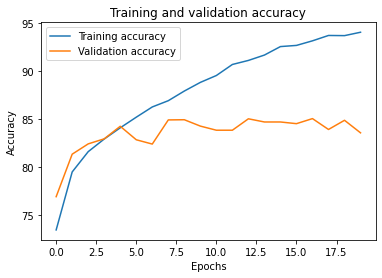

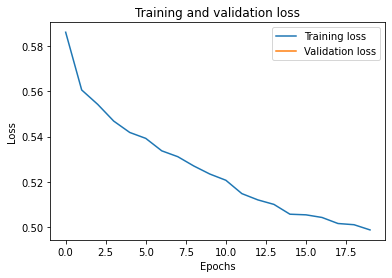

acc %
83.57421875
total INCORRECT total examples in val number of correct examples in val
841 5120 4279
Confusion Matrix:
 [[44356  6188]
 [10636 41220]]
True Positives: 41220
False Positives: 6188
True Negatives: 44356
False Negatives: 10636
Precision: 0.8695
Recall: 0.7949
Val Loss: nan, Val Acc: 89.97
Confusion Matrix:
 [[5794  759]
 [ 316 3851]]
True Positives: 3851
False Positives: 759
True Negatives: 5794
False Negatives: 316
Precision: 0.8354
Recall: 0.9242
Val Loss: 0.6089, Val Acc: 83.65
Confusion Matrix:
 [[769 144]
 [ 81 382]]
True Positives: 382
False Positives: 144
True Negatives: 769
False Negatives: 81
Precision: 0.7262
Recall: 0.8251
Val Loss: 0.7429, Val Acc: 88.45
Confusion Matrix:
 [[287  10]
 [ 28   4]]
True Positives: 4
False Positives: 10
True Negatives: 287
False Negatives: 28
Precision: 0.2857
Recall: 0.1250
Val Loss: nan, Val Acc: 80.91
Confusion Matrix:
 [[1245  349]
 [ 208 1116]]
True Positives: 1116
False Positives: 349
True Negatives: 1245
False Negatives: 

IndexError: list index out of range

In [54]:
subs = [ 
    [full_trn_ds, cocotrain_dataset, cashtrain_dataset, civtrain_dataset, oiltrain_dataset],
    [full_trn_ds, cocotrain_dataset, cashtrain_dataset, civtrain_dataset, ftrain_dataset],
    [full_trn_ds, cocotrain_dataset, cashtrain_dataset, oiltrain_dataset, ftrain_dataset], 
    [full_trn_ds, cocotrain_dataset, civtrain_dataset, oiltrain_dataset, ftrain_dataset],
    [full_trn_ds, cashtrain_dataset, civtrain_dataset, oiltrain_dataset, ftrain_dataset],
    [cocotrain_dataset, cashtrain_dataset, civtrain_dataset, oiltrain_dataset, ftrain_dataset]
]
subsv = [
    [val_nosdpt_ds, cocoval_dataset, cashval_dataset, civval_dataset, oilval_dataset],
    [val_nosdpt_ds, cocoval_dataset, cashval_dataset, civval_dataset, fval_dataset],
    [val_nosdpt_ds, cocoval_dataset, cashval_dataset, oilval_dataset, fval_dataset], 
    [val_nosdpt_ds, cashval_dataset, cashval_dataset, civval_dataset, fval_dataset],
    [cocoval_dataset, cashval_dataset, civval_dataset, oilval_dataset, fval_dataset]
]
        
for i in range(len(subs)):
    sub = subs[i]
    subv = subsv[i]
    everything_trn_ds = sub[0].concatenate(sub[1:])
    everything_trn_loader = DataLoader(everything_trn_ds,batch_size=32,shuffle=True, drop_last=True)
    
    everyval_nosdpt_ds = subv[0].concatenate(subv[1:])
    everyval_nosdpt_loader = DataLoader(everyval_nosdpt_ds,batch_size=32,shuffle=True,drop_last=True)
    print('Training perturbation with features:')
    print(sub)
    model = trainNew(everything_trn_loader, everyval_nosdpt_loader,'loo.pt')
    
    del everything_trn_ds, everyval_nosdpt_ds, everything_trn_loader, everyval_nosdpt_loader

    everyval_nosdpt_ds = full_trn_ds.concatenate([cocoval_dataset, cashval_dataset, civval_dataset, oilval_dataset, fval_dataset])
    everyval_loader = DataLoader(everyval_nosdpt_ds,batch_size=32,shuffle=True,drop_last=True)
    del everyval_nosdpt_ds
    test_loaders = [everyval_loader, val_nosdpt_loader, cocoval_loader, cashval_loader, civval_loader, oilval_loader, fval_loader]
    
    
    for tl in test_loaders:
        print(tl)
         # Validate the model
        model.eval()
        val_loss = 0.0
        correct = 0
        total = 0
        all_predictions = []
        all_labels = []

        with torch.no_grad():
            
            for inputs, inputsCHM, s1, labs, paths in tl:
    
                inputs= inputs.to("cuda")
                
                inputsCHM = inputsCHM.to("cuda")
                labs = torch.Tensor(labs).unsqueeze(1).to("cuda")
                s1 = s1.to(device).float()            #normalized_inputs = normalizer(inputs)

                has_nan = torch.isnan(inputs).any(dim=1)  # Check along batch dimension (assuming dim=0 is batch)
                # Filter inputs to exclude those with NaNs
                has_nan_anywhere = torch.any(torch.any(has_nan, dim=1), dim=1)
        
                inputs = inputs[~has_nan_anywhere]
                inputsCHM = inputsCHM[~has_nan_anywhere]
                labs = labs[~has_nan_anywhere]
                
                outputs = model(inputsCHM, inputs, s1)
                loss = criterion(outputs, labs.float())
                val_loss += loss.item() * inputs.size(0)
                predicted = (outputs > 0.5).float()
                total += labs.size(0)
                correct += (predicted == labs).sum().item()
                all_predictions.extend(predicted.cpu().numpy())
                all_labels.extend(labs.cpu().numpy())
    
        print(f'Val Loss: {val_loss/len(tl.dataset):.4f}, '
              f'Val Acc: {(correct/total)*100:.2f}' )
        print_cm(all_labels,all_predictions)
    del everyval_loader

Training perturbation with features:
[<__main__.PairedImageDataset object at 0x7fdf3eb7e970>, <__main__.PairedImageDataset object at 0x7fdf5ee14520>, <__main__.PairedImageDataset object at 0x7fe0f879cd30>, <__main__.PairedImageDataset object at 0x7fdfe8409b20>, <__main__.PairedImageDataset object at 0x7fdfbddb33a0>]


/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


training start
Skipping batch due to NaNs.
Epoch 1/20, Train Loss: 0.6064, Train Acc: 80.8958, Val Loss: 0.5835, Val Acc: 83.31
Skipping batch due to NaNs.
Epoch 2/20, Train Loss: 0.5903, Train Acc: 84.5208, Val Loss: 0.5782, Val Acc: 83.79
Skipping batch due to NaNs.
Epoch 3/20, Train Loss: 0.5820, Train Acc: 86.4722, Val Loss: 0.5812, Val Acc: 83.37
Skipping batch due to NaNs.
Epoch 4/20, Train Loss: 0.5783, Train Acc: 87.4583, Val Loss: 0.5752, Val Acc: 84.77
Skipping batch due to NaNs.
Epoch 5/20, Train Loss: 0.5729, Train Acc: 88.5486, Val Loss: 0.5724, Val Acc: 86.24
Skipping batch due to NaNs.
Epoch 6/20, Train Loss: 0.5704, Train Acc: 89.1597, Val Loss: 0.5692, Val Acc: 86.47
Skipping batch due to NaNs.
Epoch 7/20, Train Loss: 0.5669, Train Acc: 89.9306, Val Loss: 0.5719, Val Acc: 84.65
Skipping batch due to NaNs.
Epoch 8/20, Train Loss: 0.5627, Train Acc: 90.8542, Val Loss: 0.5705, Val Acc: 86.08
Skipping batch due to NaNs.
Epoch 9/20, Train Loss: 0.5603, Train Acc: 91.5486, V

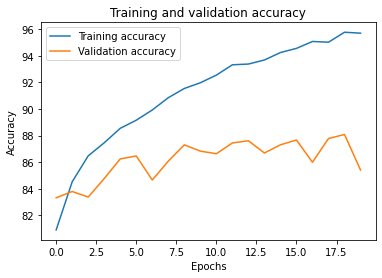

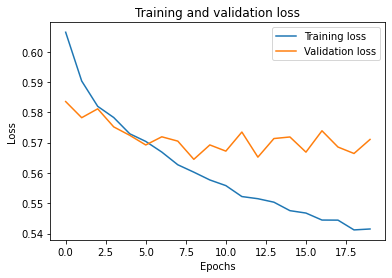

acc %
85.40736607142857
total INCORRECT total examples in val number of correct examples in val
523 3584 3061
Confusion Matrix:
 [[36464  2092]
 [ 7820 25304]]
True Positives: 25304
False Positives: 2092
True Negatives: 36464
False Negatives: 7820
Precision: 0.9236
Recall: 0.7639
Val Loss: nan, Val Acc: 82.60
Confusion Matrix:
 [[5785 1540]
 [ 325 3070]]
True Positives: 3070
False Positives: 1540
True Negatives: 5785
False Negatives: 325
Precision: 0.6659
Recall: 0.9043
Val Loss: 0.6011, Val Acc: 83.28
Confusion Matrix:
 [[816 200]
 [ 30 330]]
True Positives: 330
False Positives: 200
True Negatives: 816
False Negatives: 30
Precision: 0.6226
Recall: 0.9167
Val Loss: 0.7087, Val Acc: 93.01
Confusion Matrix:
 [[305  13]
 [ 10   1]]
True Positives: 1
False Positives: 13
True Negatives: 305
False Negatives: 10
Precision: 0.0714
Recall: 0.0909
Val Loss: nan, Val Acc: 54.69
Confusion Matrix:
 [[1173 1042]
 [ 280  423]]
True Positives: 423
False Positives: 1042
True Negatives: 1173
False Negat

/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


training start
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipp

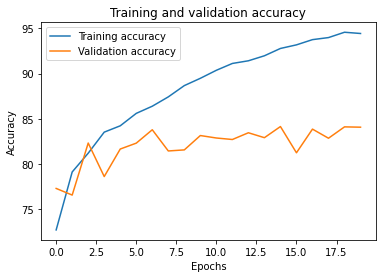

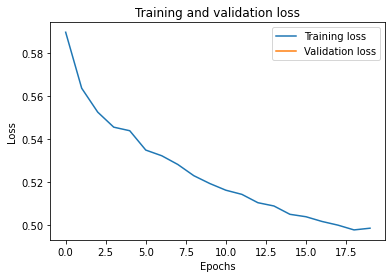

acc %
84.06723484848484
total INCORRECT total examples in val number of correct examples in val
1346 8448 7102
Confusion Matrix:
 [[70094 10679]
 [19662 68525]]
True Positives: 68525
False Positives: 10679
True Negatives: 70094
False Negatives: 19662
Precision: 0.8652
Recall: 0.7770
Val Loss: nan, Val Acc: 90.22
Confusion Matrix:
 [[5746  683]
 [ 365 3926]]
True Positives: 3926
False Positives: 683
True Negatives: 5746
False Negatives: 365
Precision: 0.8518
Recall: 0.9149
Val Loss: 0.6086, Val Acc: 82.70
Confusion Matrix:
 [[792 185]
 [ 53 346]]
True Positives: 346
False Positives: 185
True Negatives: 792
False Negatives: 53
Precision: 0.6516
Recall: 0.8672
Val Loss: 0.7247, Val Acc: 90.58
Confusion Matrix:
 [[295  11]
 [ 20   3]]
True Positives: 3
False Positives: 11
True Negatives: 295
False Negatives: 20
Precision: 0.2143
Recall: 0.1304
Val Loss: nan, Val Acc: 82.83
Confusion Matrix:
 [[1170  218]
 [ 283 1247]]
True Positives: 1247
False Positives: 218
True Negatives: 1170
False Neg

/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


training start
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipping batch due to NaNs.
Skipp

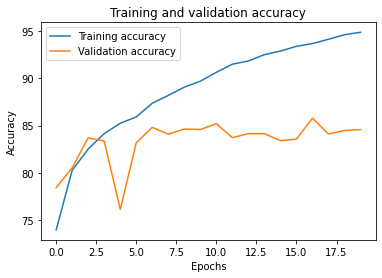

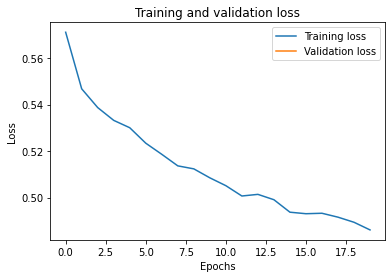

acc %
84.5703125
total INCORRECT total examples in val number of correct examples in val
790 5120 4330
Confusion Matrix:
 [[43987  6568]
 [10510 41335]]
True Positives: 41335
False Positives: 6568
True Negatives: 43987
False Negatives: 10510
Precision: 0.8629
Recall: 0.7973
Val Loss: nan, Val Acc: 76.90
Confusion Matrix:
 [[5001 1373]
 [1103 3243]]
True Positives: 3243
False Positives: 1373
True Negatives: 5001
False Negatives: 1103
Precision: 0.7026
Recall: 0.7462
Val Loss: 0.6714, Val Acc: 69.99
Confusion Matrix:
 [[678 246]
 [167 285]]
True Positives: 285
False Positives: 246
True Negatives: 678
False Negatives: 167
Precision: 0.5367
Recall: 0.6305
Val Loss: 0.7185, Val Acc: 91.49
Confusion Matrix:
 [[299  12]
 [ 16   2]]
True Positives: 2
False Positives: 12
True Negatives: 299
False Negatives: 16
Precision: 0.1429
Recall: 0.1111
Val Loss: nan, Val Acc: 81.15
Confusion Matrix:
 [[1098  195]
 [ 355 1270]]
True Positives: 1270
False Positives: 195
True Negatives: 1098
False Negatives

In [55]:
subs = [ 
    [full_trn_ds, cocotrain_dataset, civtrain_dataset, oiltrain_dataset, ftrain_dataset],
    [full_trn_ds, cashtrain_dataset, civtrain_dataset, oiltrain_dataset, ftrain_dataset],
    [cocotrain_dataset, cashtrain_dataset, civtrain_dataset, oiltrain_dataset, ftrain_dataset]
]
subsv = [
    [val_nosdpt_ds, cocoval_dataset, civval_dataset, oilval_dataset, fval_dataset],
    [val_nosdpt_ds, cashval_dataset, cashval_dataset, civval_dataset, fval_dataset],
    [cocoval_dataset, cashval_dataset, civval_dataset, oilval_dataset, fval_dataset]
]
        
for i in range(len(subs)):
    sub = subs[i]
    subv = subsv[i]
    everything_trn_ds = sub[0].concatenate(sub[1:])
    everything_trn_loader = DataLoader(everything_trn_ds,batch_size=32,shuffle=True, drop_last=True)
    
    everyval_nosdpt_ds = subv[0].concatenate(subv[1:])
    everyval_nosdpt_loader = DataLoader(everyval_nosdpt_ds,batch_size=32,shuffle=True,drop_last=True)
    print('Training perturbation with features:')
    print(sub)
    model = trainNew(everything_trn_loader, everyval_nosdpt_loader,'loo.pt')
    
    del everything_trn_ds, everyval_nosdpt_ds, everything_trn_loader, everyval_nosdpt_loader

    everyval_nosdpt_ds = full_trn_ds.concatenate([cocoval_dataset, cashval_dataset, civval_dataset, oilval_dataset, fval_dataset])
    everyval_loader = DataLoader(everyval_nosdpt_ds,batch_size=32,shuffle=True,drop_last=True)
    del everyval_nosdpt_ds
    test_loaders = [everyval_loader, val_nosdpt_loader, cocoval_loader, cashval_loader, civval_loader, oilval_loader, fval_loader]
    
    
    for tl in test_loaders:
        print(tl)
         # Validate the model
        model.eval()
        val_loss = 0.0
        correct = 0
        total = 0
        all_predictions = []
        all_labels = []

        with torch.no_grad():
            
            for inputs, inputsCHM, s1, labs, paths in tl:
    
                inputs= inputs.to("cuda")
                
                inputsCHM = inputsCHM.to("cuda")
                labs = torch.Tensor(labs).unsqueeze(1).to("cuda")
                s1 = s1.to(device).float()            #normalized_inputs = normalizer(inputs)

                has_nan = torch.isnan(inputs).any(dim=1)  # Check along batch dimension (assuming dim=0 is batch)
                # Filter inputs to exclude those with NaNs
                has_nan_anywhere = torch.any(torch.any(has_nan, dim=1), dim=1)
        
                inputs = inputs[~has_nan_anywhere]
                inputsCHM = inputsCHM[~has_nan_anywhere]
                labs = labs[~has_nan_anywhere]
                
                outputs = model(inputsCHM, inputs, s1)
                loss = criterion(outputs, labs.float())
                val_loss += loss.item() * inputs.size(0)
                predicted = (outputs > 0.5).float()
                total += labs.size(0)
                correct += (predicted == labs).sum().item()
                all_predictions.extend(predicted.cpu().numpy())
                all_labels.extend(labs.cpu().numpy())
    
        print(f'Val Loss: {val_loss/len(tl.dataset):.4f}, '
              f'Val Acc: {(correct/total)*100:.2f}' )
        print_cm(all_labels,all_predictions)
    del everyval_loader

In [ ]:
#FULL MODEL
everything_trn_ds = full_trn_ds.concatenate([cocotrain_dataset, cashtrain_dataset, civtrain_dataset, oiltrain_dataset, ftrain_dataset])
everything_trn_loader = DataLoader(everything_trn_ds,batch_size=32,shuffle=True, drop_last=True)

everyval_nosdpt_ds = full_trn_ds.concatenate([cocoval_dataset, cashval_dataset, civval_dataset, oilval_dataset, fval_dataset])
everyval_loader = DataLoader(everyval_nosdpt_ds,batch_size=32,shuffle=True,drop_last=True)
    
model = trainNew(everything_trn_loader, everyval_loader,'loo.pt')
del everyval_nosdpt_ds, everyval_loader, everthing_trn_ds, everything_trn_loader

# Manual Model Training

training start
Epoch 20/20, Val Loss: 0.5729, Val Acc: 55.26
Epoch 1/20, Train Loss: 0.5363, Train Acc: 81.9286, Val Loss: 0.4430, Val Acc: 87.44
Epoch 2/20, Train Loss: 0.5035, Train Acc: 88.8571, Val Loss: 0.4385, Val Acc: 88.24
Epoch 3/20, Train Loss: 0.4924, Train Acc: 91.0000, Val Loss: 0.4413, Val Acc: 89.85
Epoch 4/20, Train Loss: 0.4850, Train Acc: 92.3929, Val Loss: 0.4493, Val Acc: 86.48
Epoch 5/20, Train Loss: 0.4764, Train Acc: 94.4464, Val Loss: 0.4345, Val Acc: 90.15
Epoch 6/20, Train Loss: 0.4720, Train Acc: 95.3571, Val Loss: 0.4359, Val Acc: 89.16
Epoch 7/20, Train Loss: 0.4675, Train Acc: 96.3750, Val Loss: 0.4327, Val Acc: 90.49
Epoch 8/20, Train Loss: 0.4648, Train Acc: 96.9286, Val Loss: 0.4411, Val Acc: 89.49
Epoch 9/20, Train Loss: 0.4623, Train Acc: 97.3393, Val Loss: 0.4331, Val Acc: 90.36
Epoch 10/20, Train Loss: 0.4605, Train Acc: 97.6964, Val Loss: 0.4313, Val Acc: 90.98
Epoch 11/20, Train Loss: 0.4587, Train Acc: 98.2500, Val Loss: 0.4462, Val Acc: 88.65
Ep

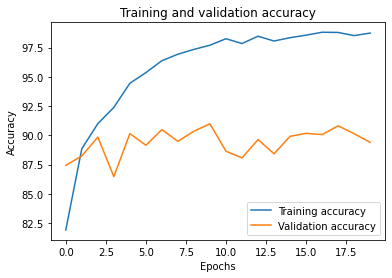

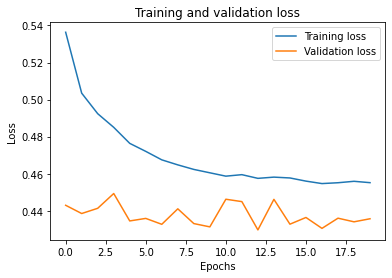

acc %
89.40783986655546
total INCORRECT total examples in val number of correct examples in val
127 1199 1072
Confusion Matrix:
 [[ 7992  1754]
 [ 1325 14112]]
True Positives: 14112
False Positives: 1754
True Negatives: 7992
False Negatives: 1325
Precision: 0.8894
Recall: 0.9142
east
acc %
89.03225806451613
total INCORRECT total examples in val number of correct examples in val
34 310 276
val loss
0.5328758734546296
Confusion Matrix:
 [[ 87  20]
 [ 14 189]]
True Positives: 189
False Positives: 20
True Negatives: 87
False Negatives: 14
Precision: 0.9043
Recall: 0.9310
# of prior shifted examples east 0
central
acc %
91.43835616438356
total INCORRECT total examples in val number of correct examples in val
25 292 267
val loss
0.4817935358988096
Confusion Matrix:
 [[ 72  20]
 [  5 195]]
True Positives: 195
False Positives: 20
True Negatives: 72
False Negatives: 5
Precision: 0.9070
Recall: 0.9750
# of prior shifted examples central 0
west
acc %
88.4472049689441
total INCORRECT total example

TypeError: forward() missing 1 required positional argument: 'tabular_features'

In [58]:
#############
#### TRIMODAL
##############
model = MultiResNet()
model.to(device)
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)
model.train()

###############################
###############################
#########DISTRIBUTION SHIFT TRN FULL
###############################
###############################
#MEAN INTERPOLATION MODEL 
print('training start')
trn_acc_list = []
val_acc_list = []
trn_loss_list = []
val_loss_list = []
all_predictions = []
all_labels = []

criterion = nn.BCEWithLogitsLoss()
# Train the model

# Validate the model
model.eval()
val_loss = 0.0
correct = 0
total = 0
with torch.no_grad():
    for inputs, inputsCHM, s1, labs, paths in val_nosdpt_loader:

        inputs= inputs.to("cuda")
        inputsCHM = inputsCHM.to("cuda")
        labs = torch.Tensor(labs).unsqueeze(1).to("cuda")
        s1 = s1.to(device).float()            #normalized_inputs = normalizer(inputs)

        has_nan = torch.isnan(inputs).any(dim=1)  # Check along batch dimension (assuming dim=0 is batch)
        # Filter inputs to exclude those with NaNs
        has_nan_anywhere = torch.any(torch.any(has_nan, dim=1), dim=1)

        inputs = inputs[~has_nan_anywhere]
        inputsCHM = inputsCHM[~has_nan_anywhere]
        labs = labs[~has_nan_anywhere]
        
        outputs = model(inputsCHM, inputs, s1)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
        correct += (predicted == labs).sum().item()
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    #val_acc_list.append(correct/total * 100)
    #val_loss_list.append(val_loss / len(val_loadere.dataset))
    print(f'Epoch {epoch+1}/{num_epochs}, '
          #f'Train Loss: {train_loss/len(train_loadere.dataset):.4f}, '
          #f'Train Acc: {trn_acc_list[-1]:.4f}, '
          #f'Train Acc: {trn_acc_list[-1])*100:.4f}, '
          f'Val Loss: {val_loss/len(val_nosdpt_loader.dataset):.4f}, '
          f'Val Acc: {(correct/total)*100:.2f}' )


num_epochs = 20
for epoch in range(num_epochs):

    model.train()
    correct = 0
    total = 0
    train_loss = 0.0

    for inputs, inputsCHM, s1, labs, paths in full_trn_loader:
        #print(inputs.shape) #32,4,40,40
        #print(inputs)

        inputs = inputs.to("cuda")
        inputsCHM = inputsCHM.to("cuda")
        labs = torch.Tensor(labs).unsqueeze(1).to("cuda")
        s1 = s1.to(device).float()
        

        # Calculate mean of non-NaN values in each channel
        
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
            #if mask.sum() > 0:
            #    print("Inputs after interpolation:")
            #    print(channel_data)
            # Check for NaNs in inputs
        if torch.isnan(inputs).any():
            raise ValueError("NaNs found in inputs after interpolation")
    
        # Check for NaNs in inputsCHM and labs
        if torch.isnan(inputsCHM).any():
            raise ValueError("NaNs found in inputsCHM")
        if torch.isnan(labs).any():
            raise ValueError("NaNs found in labs")
        
        #inputs = torch.where(torch.isnan(inputs), torch.zeros_like(inputs), inputs)

        optimizer.zero_grad()
        outputs = model(inputsCHM,inputs,s1)
        if torch.isnan(outputs).any():
            print(f"Inputs: {inputs[0][0]}")
            #print(f"InputsCHM: {inputsCHM}")
            print(f"Model outputs: {outputs}")
            raise ValueError("NaNs found in model outputs")

        loss = criterion(outputs, labs.float())
        if torch.isnan(loss).any():
            raise ValueError("NaNs found in loss")

        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)

        optimizer.step()
        train_loss += loss.item() * inputs.size(0)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
        correct += (predicted == labs).sum().item()
    trn_acc_list.append(correct/total * 100)
    trn_loss_list.append(train_loss/len(full_trn_loader.dataset))

    if epoch == 19: 
        torch.save(model.state_dict(), 'resnet-trimodal-FULLtrain.pt')


    # Validate the model
    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    with torch.no_grad():
        
        for inputs, inputsCHM, s1, labs, paths in val_nosdpt_loader:

            inputs= inputs.to("cuda")
            inputsCHM = inputsCHM.to("cuda")
            labs = torch.Tensor(labs).unsqueeze(1).to("cuda")
            s1 = s1.to(device).float()            #normalized_inputs = normalizer(inputs)

            has_nan = torch.isnan(inputs).any(dim=1)  # Check along batch dimension (assuming dim=0 is batch)
            # Filter inputs to exclude those with NaNs
            has_nan_anywhere = torch.any(torch.any(has_nan, dim=1), dim=1)
    
            inputs = inputs[~has_nan_anywhere]
            inputsCHM = inputsCHM[~has_nan_anywhere]
            labs = labs[~has_nan_anywhere]
            
            outputs = model(inputsCHM, inputs, s1)
            loss = criterion(outputs, labs.float())
            val_loss += loss.item() * inputs.size(0)
            predicted = (outputs > 0.5).float()
            total += labs.size(0)
            correct += (predicted == labs).sum().item()
            all_predictions.extend(predicted.cpu().numpy())
            all_labels.extend(labs.cpu().numpy())
        val_acc_list.append(correct/total * 100)
        val_loss_list.append(val_loss / len(val_nosdpt_loader.dataset))

    print(f'Epoch {epoch+1}/{num_epochs}, '
          f'Train Loss: {train_loss/len(full_trn_loader.dataset):.4f}, '
          f'Train Acc: {trn_acc_list[-1]:.4f}, '
          #f'Train Acc: {trn_acc_list[-1])*100:.4f}, '
          f'Val Loss: {val_loss/len(val_nosdpt_loader.dataset):.4f}, '
          f'Val Acc: {(correct/total)*100:.2f}' )

plot_res(trn_acc_list,val_acc_list,trn_loss_list,val_loss_list,all_labels,all_predictions)


p_orch_src = .55
p_for_src = .45

p_orch_e = .34
p_for_e = .66

p_orch_c = .31
p_for_c = .69

p_orch_w = .58
p_for_w = .42

p_orch_sdpt = .58
p_for_sdpt = .42


print('east')
val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
priored = 0
with torch.no_grad():
    for inputs, inputsCHM, s1, labs, paths in val_loadere:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)
        s1 = s1.to(device).float()
        
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputsCHM, inputs,s1)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)
        #p1 = torch.count_nonzero((outputs > 0.5))
        pred1 = (outputs > 0.5).float()
        p1 = (pred1 == labs).sum().item()
        

#        outputs = outputs * (p_for_e / p_for_src) / ( outputs * (p_for_e / p_for_src) + 
#                                                     (1 - outputs) * (p_orch_e / p_orch_src) )
        #p2 = torch.count_nonzero((outputs > 0.5))
        #priored += abs(p1-p2)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        p2 = (predicted == labs).sum().item()
        correct += (predicted == labs).sum().item()
        priored += p1-p2

        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    print('acc %')
    print(correct/total * 100)
    print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
    print(total-correct, total, correct)
    print('val loss')
    print(val_loss / len(val_loaderc.dataset))
    print_cm(all_predictions,all_labels)
    print('# of prior shifted examples east', priored) 

print('central')
val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
priored = 0
with torch.no_grad():
    for inputs, inputsCHM, s1, labs, paths in val_loaderc:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)
        s1 = s1.to(device).float()
        
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputsCHM, inputs,s1)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)

        #p1 = torch.count_nonzero((outputs > 0.5))
        pred1 = (outputs > 0.5).float()
        p1 = (pred1 == labs).sum().item()
        

#        outputs = outputs * (p_for_c / p_for_src) / ( outputs * (p_for_c / p_for_src) + 
#                                                     (1 - outputs) * (p_orch_c / p_orch_src) )
        #p2 = torch.count_nonzero((outputs > 0.5))
        #priored += abs(p1-p2)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        p2 = (predicted == labs).sum().item()
        correct += (predicted == labs).sum().item()
        priored += p1-p2

        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    print('acc %')
    print(correct/total * 100)
    print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
    print(total-correct, total, correct)
    print('val loss')
    print(val_loss / len(val_loaderc.dataset))
    print_cm(all_predictions,all_labels)
    print('# of prior shifted examples central', priored) 
    
print('west')

val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
priored = 0
with torch.no_grad():
    for inputs, inputsCHM, s1, labs, paths in val_loaderw:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)
        s1 = s1.to(device).float()
        
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputsCHM, inputs,s1)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)

        #p1 = torch.count_nonzero((outputs > 0.5))
        pred1 = (outputs > 0.5).float()
        p1 = (pred1 == labs).sum().item()
        

#        outputs = outputs * (p_for_w / p_for_src) / ( outputs * (p_for_w / p_for_src) + 
#                                                     (1 - outputs) * (p_orch_w / p_orch_src) )
        #p2 = torch.count_nonzero((outputs > 0.5))
        #priored += abs(p1-p2)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        p2 = (predicted == labs).sum().item()
        correct += (predicted == labs).sum().item()
        priored += p1-p2


        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    print('acc %')
    print(correct/total * 100)
    print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
    print(total-correct, total, correct)
    print('val loss')
    print(val_loss / len(val_loaderw.dataset))
    print_cm(all_predictions,all_labels)
    print('# of prior shifted examples west', priored) 



In [64]:

print('JUST sdpt')

val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
with torch.no_grad():
    for inputs, inputsCHM, s1, labs, paths in sdpt_loader:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)
        s1 = s1.to(device).float()
        
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputsCHM, inputs,s1)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        correct += (predicted == labs).sum().item()
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    print('acc %')
    print(correct/total * 100)
    print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
    print(total-correct, total, correct)
    print('val loss')
    print(val_loss / len(sdpt_loader.dataset))
    print_cm(all_predictions,all_labels)
   
print('cashew')
val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
with torch.no_grad():
    for inputs, inputsCHM, s1, labs, paths in cashtrain_loader:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)
        s1 = s1.to(device).float()
        
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputsCHM, inputs,s1)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        correct += (predicted == labs).sum().item()
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    print('acc %')
    print(correct/total * 100)
    print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
    print(total-correct, total, correct)
    print('val loss')
    print(val_loss / len(cashtrain_loader.dataset))
    print_cm(all_predictions,all_labels)


print('CIV mango')
val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
with torch.no_grad():
    for inputs, inputsCHM, s1, labs, paths in civtrain_loader:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)
        s1 = s1.to(device).float()
        
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputsCHM, inputs,s1)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        correct += (predicted == labs).sum().item()
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    print('acc %')
    print(correct/total * 100)
    print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
    print(total-correct, total, correct)
    print('val loss')
    print(val_loss / len(civtrain_loader.dataset))
    print_cm(all_predictions,all_labels)
    


JUST sdpt
acc %
39.822024471635146
total INCORRECT total examples in val number of correct examples in val
541 899 358
val loss
nan
Confusion Matrix:
 [[358 541]
 [  0   0]]
True Positives: 0
False Positives: 541
True Negatives: 358
False Negatives: 0
Precision: 0.0000
Recall: nan
cashew


/tmp/ipykernel_32699/2222487850.py:57: RuntimeWarning: invalid value encountered in long_scalars
  recall = tp / (tp + fn)


acc %
57.78036742528106
total INCORRECT total examples in val number of correct examples in val
6159 14588 8429
val loss
nan
Confusion Matrix:
 [[2504 4779]
 [1380 5925]]
True Positives: 5925
False Positives: 4779
True Negatives: 2504
False Negatives: 1380
Precision: 0.5535
Recall: 0.8111
CIV mango
acc %
69.76996527777779
total INCORRECT total examples in val number of correct examples in val
1393 4608 3215
val loss
0.8779171448614862
Confusion Matrix:
 [[3215 1393]
 [   0    0]]
True Positives: 0
False Positives: 1393
True Negatives: 3215
False Negatives: 0
Precision: 0.0000
Recall: nan


/tmp/ipykernel_32699/2222487850.py:57: RuntimeWarning: invalid value encountered in long_scalars
  recall = tp / (tp + fn)


In [70]:

print('Descals Coco')
val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
with torch.no_grad():
    for inputs, inputsCHM, s1, labs, paths in cocotrain_loader:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)
        s1 = s1.to(device).float()
        
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputsCHM, inputs,s1)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        correct += (predicted == labs).sum().item()
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    print('acc %')
    print(correct/total * 100)
    print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
    print(total-correct, total, correct)
    print('val loss')
    print(val_loss / len(cocotrain_loader.dataset))
    print_cm(all_predictions,all_labels)




Descals Coco
acc %
89.63414634146342
total INCORRECT total examples in val number of correct examples in val
136 1312 1176
val loss
0.3736942926558053
Confusion Matrix:
 [[  16   39]
 [  97 1160]]
True Positives: 1160
False Positives: 39
True Negatives: 16
False Negatives: 97
Precision: 0.9675
Recall: 0.9228


In [75]:

print('Descals Oil')
val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
with torch.no_grad():
    for inputs, inputsCHM, s1, labs, paths in oiltrain_loader:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)
        s1 = s1.to(device).float()
        
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputsCHM, inputs,s1)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        correct += (predicted == labs).sum().item()
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    print('acc %')
    print(correct/total * 100)
    print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
    print(total-correct, total, correct)
    print('val loss')
    print(val_loss / len(oiltrain_loader.dataset))
    print_cm(all_predictions,all_labels)




Descals Oil
acc %
84.0674071237074
total INCORRECT total examples in val number of correct examples in val
416 2611 2195
val loss
0.4633016516905733
Confusion Matrix:
 [[ 339  179]
 [ 237 1856]]
True Positives: 1856
False Positives: 179
True Negatives: 339
False Negatives: 237
Precision: 0.9120
Recall: 0.8868


# E/C/W Regional Models

/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/angelats11/anaconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


training start
Epoch 20/20, Val Loss: 0.6663, Val Acc: 30.03
Epoch 1/20, Train Loss: 0.5399, Train Acc: 80.7910, Val Loss: 0.5149, Val Acc: 83.17
Epoch 2/20, Train Loss: 0.4776, Train Acc: 93.3818, Val Loss: 0.5081, Val Acc: 85.48
Epoch 3/20, Train Loss: 0.4634, Train Acc: 96.4487, Val Loss: 0.5074, Val Acc: 86.47
Epoch 4/20, Train Loss: 0.4564, Train Acc: 97.4173, Val Loss: 0.4920, Val Acc: 88.78
Epoch 5/20, Train Loss: 0.4508, Train Acc: 98.5472, Val Loss: 0.5319, Val Acc: 82.84
Epoch 6/20, Train Loss: 0.4503, Train Acc: 98.7086, Val Loss: 0.4964, Val Acc: 88.45
Epoch 7/20, Train Loss: 0.4467, Train Acc: 99.5157, Val Loss: 0.4898, Val Acc: 87.13
Epoch 8/20, Train Loss: 0.4467, Train Acc: 99.3543, Val Loss: 0.4996, Val Acc: 87.13
Epoch 9/20, Train Loss: 0.4467, Train Acc: 99.3543, Val Loss: 0.5015, Val Acc: 87.13
Epoch 10/20, Train Loss: 0.4478, Train Acc: 99.1929, Val Loss: 0.4955, Val Acc: 89.11
Epoch 11/20, Train Loss: 0.4494, Train Acc: 98.3858, Val Loss: 0.5014, Val Acc: 85.81
Ep

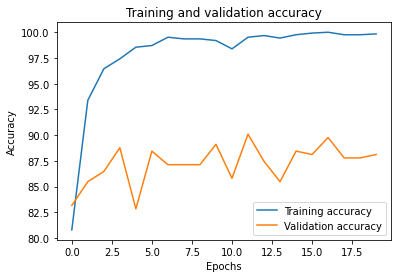

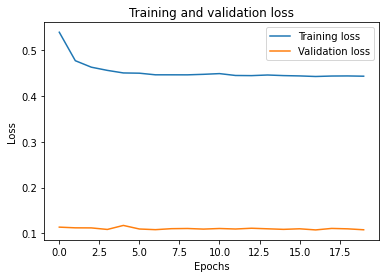

acc %
88.11881188118812
total INCORRECT total examples in val number of correct examples in val
36 303 267
Confusion Matrix:
 [[1729  518]
 [ 468 3648]]
True Positives: 3648
False Positives: 518
True Negatives: 1729
False Negatives: 468
Precision: 0.8757
Recall: 0.8863
east
acc %
88.38709677419355
total INCORRECT total examples in val number of correct examples in val
36 310 274
val loss
0.5265197500790635
Confusion Matrix:
 [[ 94  13]
 [ 23 180]]
True Positives: 180
False Positives: 13
True Negatives: 94
False Negatives: 23
Precision: 0.9326
Recall: 0.8867
# of prior shifted examples east 0
central
acc %
73.97260273972603
total INCORRECT total examples in val number of correct examples in val
76 292 216
val loss
0.5900451761402495
Confusion Matrix:
 [[ 18  74]
 [  2 198]]
True Positives: 198
False Positives: 74
True Negatives: 18
False Negatives: 2
Precision: 0.7279
Recall: 0.9900
# of prior shifted examples central 0
west
acc %
71.80124223602485
total INCORRECT total examples in val 

In [82]:
#############
#### TRIMODAL
##############
model = MultiResNet()
model.to(device)
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)
model.train()

###############################
###############################
#########DISTRIBUTION SHIFT TRN FULL
###############################
###############################
#MEAN INTERPOLATION MODEL 
print('training start')
trn_acc_list = []
val_acc_list = []
trn_loss_list = []
val_loss_list = []
all_predictions = []
all_labels = []

criterion = nn.BCEWithLogitsLoss()
# Train the model

# Validate the model
model.eval()
val_loss = 0.0
correct = 0
total = 0
with torch.no_grad():
    for inputs, inputsCHM, s1, labs, paths in val_loadere:

        inputs= inputs.to("cuda")
        inputsCHM = inputsCHM.to("cuda")
        labs = torch.Tensor(labs).unsqueeze(1).to("cuda")
        s1 = s1.to(device).float()            #normalized_inputs = normalizer(inputs)

        has_nan = torch.isnan(inputs).any(dim=1)  # Check along batch dimension (assuming dim=0 is batch)
        # Filter inputs to exclude those with NaNs
        has_nan_anywhere = torch.any(torch.any(has_nan, dim=1), dim=1)

        inputs = inputs[~has_nan_anywhere]
        inputsCHM = inputsCHM[~has_nan_anywhere]
        labs = labs[~has_nan_anywhere]
        
        outputs = model(inputsCHM, inputs, s1)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
        correct += (predicted == labs).sum().item()
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    #val_acc_list.append(correct/total * 100)
    #val_loss_list.append(val_loss / len(val_loadere.dataset))
    print(f'Epoch {epoch+1}/{num_epochs}, '
          #f'Train Loss: {train_loss/len(train_loadere.dataset):.4f}, '
          #f'Train Acc: {trn_acc_list[-1]:.4f}, '
          #f'Train Acc: {trn_acc_list[-1])*100:.4f}, '
          f'Val Loss: {val_loss/len(val_loadere.dataset):.4f}, '
          f'Val Acc: {(correct/total)*100:.2f}' )


num_epochs = 20
for epoch in range(num_epochs):

    model.train()
    correct = 0
    total = 0
    train_loss = 0.0

    for inputs, inputsCHM, s1, labs, paths in train_loadere:
        #print(inputs.shape) #32,4,40,40
        #print(inputs)

        inputs = inputs.to("cuda")
        inputsCHM = inputsCHM.to("cuda")
        labs = torch.Tensor(labs).unsqueeze(1).to("cuda")
        s1 = s1.to(device).float()
        

        # Calculate mean of non-NaN values in each channel
        
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
            #if mask.sum() > 0:
            #    print("Inputs after interpolation:")
            #    print(channel_data)
            # Check for NaNs in inputs
        if torch.isnan(inputs).any():
            raise ValueError("NaNs found in inputs after interpolation")
    
        # Check for NaNs in inputsCHM and labs
        if torch.isnan(inputsCHM).any():
            raise ValueError("NaNs found in inputsCHM")
        if torch.isnan(labs).any():
            raise ValueError("NaNs found in labs")
        
        #inputs = torch.where(torch.isnan(inputs), torch.zeros_like(inputs), inputs)

        optimizer.zero_grad()
        outputs = model(inputsCHM,inputs,s1)
        if torch.isnan(outputs).any():
            print(f"Inputs: {inputs[0][0]}")
            #print(f"InputsCHM: {inputsCHM}")
            print(f"Model outputs: {outputs}")
            raise ValueError("NaNs found in model outputs")

        loss = criterion(outputs, labs.float())
        if torch.isnan(loss).any():
            raise ValueError("NaNs found in loss")

        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)

        optimizer.step()
        train_loss += loss.item() * inputs.size(0)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
        correct += (predicted == labs).sum().item()
    trn_acc_list.append(correct/total * 100)
    trn_loss_list.append(train_loss/len(train_loadere.dataset))

    if epoch == 19: 
        torch.save(model.state_dict(), 'resnet-trimodal-EASTtrain.pt')


    # Validate the model
    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    with torch.no_grad():
        
        for inputs, inputsCHM, s1, labs, paths in val_loadere:

            inputs= inputs.to("cuda")
            inputsCHM = inputsCHM.to("cuda")
            labs = torch.Tensor(labs).unsqueeze(1).to("cuda")
            s1 = s1.to(device).float()            #normalized_inputs = normalizer(inputs)

            has_nan = torch.isnan(inputs).any(dim=1)  # Check along batch dimension (assuming dim=0 is batch)
            # Filter inputs to exclude those with NaNs
            has_nan_anywhere = torch.any(torch.any(has_nan, dim=1), dim=1)
    
            inputs = inputs[~has_nan_anywhere]
            inputsCHM = inputsCHM[~has_nan_anywhere]
            labs = labs[~has_nan_anywhere]
            
            outputs = model(inputsCHM, inputs, s1)
            loss = criterion(outputs, labs.float())
            val_loss += loss.item() * inputs.size(0)
            predicted = (outputs > 0.5).float()
            total += labs.size(0)
            correct += (predicted == labs).sum().item()
            all_predictions.extend(predicted.cpu().numpy())
            all_labels.extend(labs.cpu().numpy())
        val_acc_list.append(correct/total * 100)
        val_loss_list.append(val_loss / len(val_nosdpt_loader.dataset))

    print(f'Epoch {epoch+1}/{num_epochs}, '
          f'Train Loss: {train_loss/len(train_loadere.dataset):.4f}, '
          f'Train Acc: {trn_acc_list[-1]:.4f}, '
          #f'Train Acc: {trn_acc_list[-1])*100:.4f}, '
          f'Val Loss: {val_loss/len(val_loadere.dataset):.4f}, '
          f'Val Acc: {(correct/total)*100:.2f}' )

plot_res(trn_acc_list,val_acc_list,trn_loss_list,val_loss_list,all_labels,all_predictions)


p_orch_src = .55
p_for_src = .45

p_orch_e = .34
p_for_e = .66

p_orch_c = .31
p_for_c = .69

p_orch_w = .58
p_for_w = .42

p_orch_sdpt = .58
p_for_sdpt = .42


print('east')
val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
priored = 0
with torch.no_grad():
    for inputs, inputsCHM, s1, labs, paths in val_loadere:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)
        s1 = s1.to(device).float()
        
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputsCHM, inputs,s1)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)
        #p1 = torch.count_nonzero((outputs > 0.5))
        pred1 = (outputs > 0.5).float()
        p1 = (pred1 == labs).sum().item()
        

#        outputs = outputs * (p_for_e / p_for_src) / ( outputs * (p_for_e / p_for_src) + 
#                                                     (1 - outputs) * (p_orch_e / p_orch_src) )
        #p2 = torch.count_nonzero((outputs > 0.5))
        #priored += abs(p1-p2)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        p2 = (predicted == labs).sum().item()
        correct += (predicted == labs).sum().item()
        priored += p1-p2

        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    print('acc %')
    print(correct/total * 100)
    print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
    print(total-correct, total, correct)
    print('val loss')
    print(val_loss / len(val_loaderc.dataset))
    print_cm(all_predictions,all_labels)
    print('# of prior shifted examples east', priored) 

print('central')
val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
priored = 0
with torch.no_grad():
    for inputs, inputsCHM, s1, labs, paths in val_loaderc:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)
        s1 = s1.to(device).float()
        
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputsCHM, inputs,s1)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)

        #p1 = torch.count_nonzero((outputs > 0.5))
        pred1 = (outputs > 0.5).float()
        p1 = (pred1 == labs).sum().item()
        

#        outputs = outputs * (p_for_c / p_for_src) / ( outputs * (p_for_c / p_for_src) + 
#                                                     (1 - outputs) * (p_orch_c / p_orch_src) )
        #p2 = torch.count_nonzero((outputs > 0.5))
        #priored += abs(p1-p2)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        p2 = (predicted == labs).sum().item()
        correct += (predicted == labs).sum().item()
        priored += p1-p2

        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    print('acc %')
    print(correct/total * 100)
    print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
    print(total-correct, total, correct)
    print('val loss')
    print(val_loss / len(val_loaderc.dataset))
    print_cm(all_predictions,all_labels)
    print('# of prior shifted examples central', priored) 
    
print('west')

val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
priored = 0
with torch.no_grad():
    for inputs, inputsCHM, s1, labs, paths in val_loaderw:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)
        s1 = s1.to(device).float()
        
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputsCHM, inputs,s1)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)

        #p1 = torch.count_nonzero((outputs > 0.5))
        pred1 = (outputs > 0.5).float()
        p1 = (pred1 == labs).sum().item()
        

#        outputs = outputs * (p_for_w / p_for_src) / ( outputs * (p_for_w / p_for_src) + 
#                                                     (1 - outputs) * (p_orch_w / p_orch_src) )
        #p2 = torch.count_nonzero((outputs > 0.5))
        #priored += abs(p1-p2)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        p2 = (predicted == labs).sum().item()
        correct += (predicted == labs).sum().item()
        priored += p1-p2


        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    print('acc %')
    print(correct/total * 100)
    print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
    print(total-correct, total, correct)
    print('val loss')
    print(val_loss / len(val_loaderw.dataset))
    print_cm(all_predictions,all_labels)
    print('# of prior shifted examples west', priored) 

print('full no sdpt')

val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
priored = 0
with torch.no_grad():
    for inputs, inputsCHM, s1, labs, paths in val_nosdpt_loader:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)
        s1 = s1.to(device).float()
        
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputsCHM, inputs,s1)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)

        #p1 = torch.count_nonzero((outputs > 0.5))
        pred1 = (outputs > 0.5).float()
        p1 = (pred1 == labs).sum().item()
        

#        outputs = outputs * (p_for_w / p_for_src) / ( outputs * (p_for_w / p_for_src) + 
#                                                     (1 - outputs) * (p_orch_w / p_orch_src) )
        #p2 = torch.count_nonzero((outputs > 0.5))
        #priored += abs(p1-p2)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        p2 = (predicted == labs).sum().item()
        correct += (predicted == labs).sum().item()
        priored += p1-p2


        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    print('acc %')
    print(correct/total * 100)
    print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
    print(total-correct, total, correct)
    print('val loss')
    print(val_loss / len(val_nosdpt_loader.dataset))
    print_cm(all_predictions,all_labels)
    print('# of prior shifted examples west', priored) 



training start
Epoch 1/20, Val Loss: 0.5647, Val Acc: 42.62
Epoch 1/20, Train Loss: 0.5475, Train Acc: 80.6341, Val Loss: 0.4433, Val Acc: 83.41
Epoch 2/20, Train Loss: 0.5082, Train Acc: 89.9285, Val Loss: 0.4344, Val Acc: 88.58
Epoch 3/20, Train Loss: 0.4991, Train Acc: 92.6018, Val Loss: 0.4372, Val Acc: 86.00
Epoch 4/20, Train Loss: 0.4872, Train Acc: 94.6845, Val Loss: 0.4295, Val Acc: 89.19
Epoch 5/20, Train Loss: 0.4837, Train Acc: 95.4616, Val Loss: 0.4328, Val Acc: 87.21
Epoch 6/20, Train Loss: 0.4789, Train Acc: 96.5185, Val Loss: 0.4224, Val Acc: 91.63
Epoch 7/20, Train Loss: 0.4753, Train Acc: 96.9537, Val Loss: 0.4310, Val Acc: 90.41
Epoch 8/20, Train Loss: 0.4720, Train Acc: 97.6065, Val Loss: 0.4224, Val Acc: 91.32
Epoch 9/20, Train Loss: 0.4692, Train Acc: 98.2282, Val Loss: 0.4352, Val Acc: 89.80
Epoch 10/20, Train Loss: 0.4675, Train Acc: 98.5390, Val Loss: 0.4228, Val Acc: 91.32
Epoch 11/20, Train Loss: 0.4676, Train Acc: 98.4147, Val Loss: 0.4304, Val Acc: 90.26
Epo

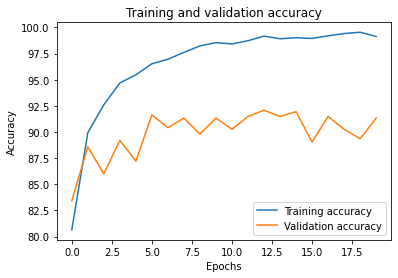

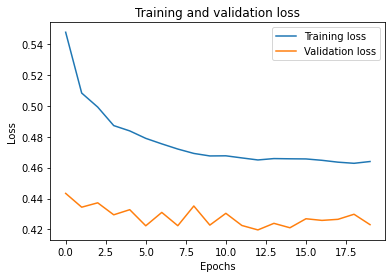

acc %
91.32420091324201
total INCORRECT total examples in val number of correct examples in val
57 657 600
Confusion Matrix:
 [[5279  601]
 [1106 6811]]
True Positives: 6811
False Positives: 601
True Negatives: 5279
False Negatives: 1106
Precision: 0.9189
Recall: 0.8603
east
acc %
76.12903225806451
total INCORRECT total examples in val number of correct examples in val
74 310 236
val loss
0.592711867534951
Confusion Matrix:
 [[ 83  24]
 [ 50 153]]
True Positives: 153
False Positives: 24
True Negatives: 83
False Negatives: 50
Precision: 0.8644
Recall: 0.7537
# of prior shifted examples east 0
central
acc %
86.64383561643835
total INCORRECT total examples in val number of correct examples in val
39 292 253
val loss
0.5082660007150206
Confusion Matrix:
 [[ 61  31]
 [  8 192]]
True Positives: 192
False Positives: 31
True Negatives: 61
False Negatives: 8
Precision: 0.8610
Recall: 0.9600
# of prior shifted examples central 0
west
acc %
90.93167701863354
total INCORRECT total examples in val 

In [81]:
#############
#### TRIMODAL WEST
##############
model = MultiResNet()
model.to(device)
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)
model.train()

###############################
###############################
#########DISTRIBUTION SHIFT TRN FULL
###############################
###############################
#MEAN INTERPOLATION MODEL 
print('training start')
trn_acc_list = []
val_acc_list = []
trn_loss_list = []
val_loss_list = []
all_predictions = []
all_labels = []

criterion = nn.BCEWithLogitsLoss()
# Train the model

# Validate the model
model.eval()
val_loss = 0.0
correct = 0
total = 0
with torch.no_grad():
    for inputs, inputsCHM, s1, labs, paths in val_loaderw:

        inputs= inputs.to("cuda")
        inputsCHM = inputsCHM.to("cuda")
        labs = torch.Tensor(labs).unsqueeze(1).to("cuda")
        s1 = s1.to(device).float()            #normalized_inputs = normalizer(inputs)

        has_nan = torch.isnan(inputs).any(dim=1)  # Check along batch dimension (assuming dim=0 is batch)
        # Filter inputs to exclude those with NaNs
        has_nan_anywhere = torch.any(torch.any(has_nan, dim=1), dim=1)

        inputs = inputs[~has_nan_anywhere]
        inputsCHM = inputsCHM[~has_nan_anywhere]
        labs = labs[~has_nan_anywhere]
        
        outputs = model(inputsCHM, inputs, s1)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
        correct += (predicted == labs).sum().item()
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    #val_acc_list.append(correct/total * 100)
    #val_loss_list.append(val_loss / len(val_loadere.dataset))
    print(f'Epoch {epoch+1}/{num_epochs}, '
          #f'Train Loss: {train_loss/len(train_loadere.dataset):.4f}, '
          #f'Train Acc: {trn_acc_list[-1]:.4f}, '
          #f'Train Acc: {trn_acc_list[-1])*100:.4f}, '
          f'Val Loss: {val_loss/len(val_loaderw.dataset):.4f}, '
          f'Val Acc: {(correct/total)*100:.2f}' )


num_epochs = 20
for epoch in range(num_epochs):

    model.train()
    correct = 0
    total = 0
    train_loss = 0.0

    for inputs, inputsCHM, s1, labs, paths in train_loaderw:
        #print(inputs.shape) #32,4,40,40
        #print(inputs)

        inputs = inputs.to("cuda")
        inputsCHM = inputsCHM.to("cuda")
        labs = torch.Tensor(labs).unsqueeze(1).to("cuda")
        s1 = s1.to(device).float()
        

        # Calculate mean of non-NaN values in each channel
        
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
            #if mask.sum() > 0:
            #    print("Inputs after interpolation:")
            #    print(channel_data)
            # Check for NaNs in inputs
        if torch.isnan(inputs).any():
            raise ValueError("NaNs found in inputs after interpolation")
    
        # Check for NaNs in inputsCHM and labs
        if torch.isnan(inputsCHM).any():
            raise ValueError("NaNs found in inputsCHM")
        if torch.isnan(labs).any():
            raise ValueError("NaNs found in labs")
        
        #inputs = torch.where(torch.isnan(inputs), torch.zeros_like(inputs), inputs)

        optimizer.zero_grad()
        outputs = model(inputsCHM,inputs,s1)
        if torch.isnan(outputs).any():
            print(f"Inputs: {inputs[0][0]}")
            #print(f"InputsCHM: {inputsCHM}")
            print(f"Model outputs: {outputs}")
            raise ValueError("NaNs found in model outputs")

        loss = criterion(outputs, labs.float())
        if torch.isnan(loss).any():
            raise ValueError("NaNs found in loss")

        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)

        optimizer.step()
        train_loss += loss.item() * inputs.size(0)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
        correct += (predicted == labs).sum().item()
    trn_acc_list.append(correct/total * 100)
    trn_loss_list.append(train_loss/len(train_loaderw.dataset))

    if epoch == 19: 
        torch.save(model.state_dict(), 'resnet-trimodal-WESTtrain.pt')


    # Validate the model
    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    with torch.no_grad():
        
        for inputs, inputsCHM, s1, labs, paths in val_loaderw:

            inputs= inputs.to("cuda")
            inputsCHM = inputsCHM.to("cuda")
            labs = torch.Tensor(labs).unsqueeze(1).to("cuda")
            s1 = s1.to(device).float()            #normalized_inputs = normalizer(inputs)

            has_nan = torch.isnan(inputs).any(dim=1)  # Check along batch dimension (assuming dim=0 is batch)
            # Filter inputs to exclude those with NaNs
            has_nan_anywhere = torch.any(torch.any(has_nan, dim=1), dim=1)
    
            inputs = inputs[~has_nan_anywhere]
            inputsCHM = inputsCHM[~has_nan_anywhere]
            labs = labs[~has_nan_anywhere]
            
            outputs = model(inputsCHM, inputs, s1)
            loss = criterion(outputs, labs.float())
            val_loss += loss.item() * inputs.size(0)
            predicted = (outputs > 0.5).float()
            total += labs.size(0)
            correct += (predicted == labs).sum().item()
            all_predictions.extend(predicted.cpu().numpy())
            all_labels.extend(labs.cpu().numpy())
        val_acc_list.append(correct/total * 100)
        val_loss_list.append(val_loss / len(val_loaderw.dataset))

    print(f'Epoch {epoch+1}/{num_epochs}, '
          f'Train Loss: {train_loss/len(train_loaderw.dataset):.4f}, '
          f'Train Acc: {trn_acc_list[-1]:.4f}, '
          #f'Train Acc: {trn_acc_list[-1])*100:.4f}, '
          f'Val Loss: {val_loss/len(val_loaderw.dataset):.4f}, '
          f'Val Acc: {(correct/total)*100:.2f}' )

plot_res(trn_acc_list,val_acc_list,trn_loss_list,val_loss_list,all_labels,all_predictions)


p_orch_src = .55
p_for_src = .45

p_orch_e = .34
p_for_e = .66

p_orch_c = .31
p_for_c = .69

p_orch_w = .58
p_for_w = .42

p_orch_sdpt = .58
p_for_sdpt = .42


print('east')
val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
priored = 0
with torch.no_grad():
    for inputs, inputsCHM, s1, labs, paths in val_loadere:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)
        s1 = s1.to(device).float()
        
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputsCHM, inputs,s1)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)
        #p1 = torch.count_nonzero((outputs > 0.5))
        pred1 = (outputs > 0.5).float()
        p1 = (pred1 == labs).sum().item()
        

#        outputs = outputs * (p_for_e / p_for_src) / ( outputs * (p_for_e / p_for_src) + 
#                                                     (1 - outputs) * (p_orch_e / p_orch_src) )
        #p2 = torch.count_nonzero((outputs > 0.5))
        #priored += abs(p1-p2)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        p2 = (predicted == labs).sum().item()
        correct += (predicted == labs).sum().item()
        priored += p1-p2

        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    print('acc %')
    print(correct/total * 100)
    print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
    print(total-correct, total, correct)
    print('val loss')
    print(val_loss / len(val_loaderc.dataset))
    print_cm(all_predictions,all_labels)
    print('# of prior shifted examples east', priored) 

print('central')
val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
priored = 0
with torch.no_grad():
    for inputs, inputsCHM, s1, labs, paths in val_loaderc:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)
        s1 = s1.to(device).float()
        
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputsCHM, inputs,s1)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)

        #p1 = torch.count_nonzero((outputs > 0.5))
        pred1 = (outputs > 0.5).float()
        p1 = (pred1 == labs).sum().item()
        

#        outputs = outputs * (p_for_c / p_for_src) / ( outputs * (p_for_c / p_for_src) + 
#                                                     (1 - outputs) * (p_orch_c / p_orch_src) )
        #p2 = torch.count_nonzero((outputs > 0.5))
        #priored += abs(p1-p2)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        p2 = (predicted == labs).sum().item()
        correct += (predicted == labs).sum().item()
        priored += p1-p2

        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    print('acc %')
    print(correct/total * 100)
    print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
    print(total-correct, total, correct)
    print('val loss')
    print(val_loss / len(val_loaderc.dataset))
    print_cm(all_predictions,all_labels)
    print('# of prior shifted examples central', priored) 
    
print('west')

val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
priored = 0
with torch.no_grad():
    for inputs, inputsCHM, s1, labs, paths in val_loaderw:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)
        s1 = s1.to(device).float()
        
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputsCHM, inputs,s1)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)

        #p1 = torch.count_nonzero((outputs > 0.5))
        pred1 = (outputs > 0.5).float()
        p1 = (pred1 == labs).sum().item()
        

#        outputs = outputs * (p_for_w / p_for_src) / ( outputs * (p_for_w / p_for_src) + 
#                                                     (1 - outputs) * (p_orch_w / p_orch_src) )
        #p2 = torch.count_nonzero((outputs > 0.5))
        #priored += abs(p1-p2)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        p2 = (predicted == labs).sum().item()
        correct += (predicted == labs).sum().item()
        priored += p1-p2


        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    print('acc %')
    print(correct/total * 100)
    print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
    print(total-correct, total, correct)
    print('val loss')
    print(val_loss / len(val_loaderw.dataset))
    print_cm(all_predictions,all_labels)
    print('# of prior shifted examples west', priored) 

print('full no sdpt')

val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
priored = 0
with torch.no_grad():
    for inputs, inputsCHM, s1, labs, paths in val_nosdpt_loader:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)
        s1 = s1.to(device).float()
        
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputsCHM, inputs,s1)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)

        #p1 = torch.count_nonzero((outputs > 0.5))
        pred1 = (outputs > 0.5).float()
        p1 = (pred1 == labs).sum().item()
        

#        outputs = outputs * (p_for_w / p_for_src) / ( outputs * (p_for_w / p_for_src) + 
#                                                     (1 - outputs) * (p_orch_w / p_orch_src) )
        #p2 = torch.count_nonzero((outputs > 0.5))
        #priored += abs(p1-p2)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        p2 = (predicted == labs).sum().item()
        correct += (predicted == labs).sum().item()
        priored += p1-p2


        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    print('acc %')
    print(correct/total * 100)
    print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
    print(total-correct, total, correct)
    print('val loss')
    print(val_loss / len(val_nosdpt_loader.dataset))
    print_cm(all_predictions,all_labels)
    print('# of prior shifted examples west', priored) 

print('OIL')

val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
priored = 0
with torch.no_grad():
    for inputs, inputsCHM, s1, labs, paths in oiltrain_loader:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)
        s1 = s1.to(device).float()
        
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputsCHM, inputs,s1)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)

        #p1 = torch.count_nonzero((outputs > 0.5))
        pred1 = (outputs > 0.5).float()
        p1 = (pred1 == labs).sum().item()
        

#        outputs = outputs * (p_for_w / p_for_src) / ( outputs * (p_for_w / p_for_src) + 
#                                                     (1 - outputs) * (p_orch_w / p_orch_src) )
        #p2 = torch.count_nonzero((outputs > 0.5))
        #priored += abs(p1-p2)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        p2 = (predicted == labs).sum().item()
        correct += (predicted == labs).sum().item()
        priored += p1-p2


        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    print('acc %')
    print(correct/total * 100)
    print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
    print(total-correct, total, correct)
    print('val loss')
    print(val_loss / len(oiltrain_loader.dataset))
    print_cm(all_predictions,all_labels)
    print('# of prior shifted examples oil', priored) 

print('coconut')

val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
priored = 0
with torch.no_grad():
    for inputs, inputsCHM, s1, labs, paths in cocotrain_loader:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)
        s1 = s1.to(device).float()
        
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputsCHM, inputs,s1)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)

        #p1 = torch.count_nonzero((outputs > 0.5))
        pred1 = (outputs > 0.5).float()
        p1 = (pred1 == labs).sum().item()
        

#        outputs = outputs * (p_for_w / p_for_src) / ( outputs * (p_for_w / p_for_src) + 
#                                                     (1 - outputs) * (p_orch_w / p_orch_src) )
        #p2 = torch.count_nonzero((outputs > 0.5))
        #priored += abs(p1-p2)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        p2 = (predicted == labs).sum().item()
        correct += (predicted == labs).sum().item()
        priored += p1-p2


        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    print('acc %')
    print(correct/total * 100)
    print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
    print(total-correct, total, correct)
    print('val loss')
    print(val_loss / len(cocotrain_loader.dataset))
    print_cm(all_predictions,all_labels)
    print('# of prior shifted examples west', priored) 


training start
Epoch 1/20, Val Loss: 0.6141, Val Acc: 23.22
Epoch 1/20, Train Loss: 0.5113, Train Acc: 82.3479, Val Loss: 0.4658, Val Acc: 85.02
Epoch 2/20, Train Loss: 0.4766, Train Acc: 90.0600, Val Loss: 0.4401, Val Acc: 90.26
Epoch 3/20, Train Loss: 0.4651, Train Acc: 92.8877, Val Loss: 0.4547, Val Acc: 88.01
Epoch 4/20, Train Loss: 0.4576, Train Acc: 95.1157, Val Loss: 0.4496, Val Acc: 89.89
Epoch 5/20, Train Loss: 0.4553, Train Acc: 95.2014, Val Loss: 0.4394, Val Acc: 92.13
Epoch 6/20, Train Loss: 0.4474, Train Acc: 97.2579, Val Loss: 0.4480, Val Acc: 88.39
Epoch 7/20, Train Loss: 0.4482, Train Acc: 97.2579, Val Loss: 0.4668, Val Acc: 85.02
Epoch 8/20, Train Loss: 0.4502, Train Acc: 96.7438, Val Loss: 0.4454, Val Acc: 90.64
Epoch 9/20, Train Loss: 0.4445, Train Acc: 97.4293, Val Loss: 0.4566, Val Acc: 87.64
Epoch 10/20, Train Loss: 0.4411, Train Acc: 98.2005, Val Loss: 0.4434, Val Acc: 91.01
Epoch 11/20, Train Loss: 0.4390, Train Acc: 98.7147, Val Loss: 0.4383, Val Acc: 91.01
Epo

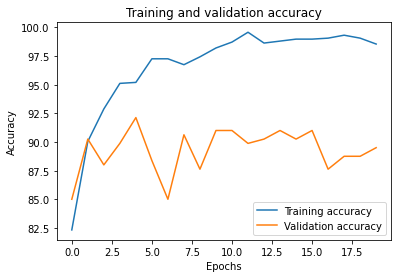

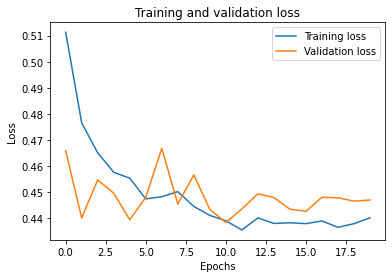

acc %
89.51310861423221
total INCORRECT total examples in val number of correct examples in val
28 267 239
Confusion Matrix:
 [[1535  313]
 [ 463 3296]]
True Positives: 3296
False Positives: 313
True Negatives: 1535
False Negatives: 463
Precision: 0.9133
Recall: 0.8768
east
acc %
74.51612903225806
total INCORRECT total examples in val number of correct examples in val
79 310 231
val loss
0.577654972468337
Confusion Matrix:
 [[ 97  10]
 [ 69 134]]
True Positives: 134
False Positives: 10
True Negatives: 97
False Negatives: 69
Precision: 0.9306
Recall: 0.6601
# of prior shifted examples east 0
central
acc %
90.06849315068493
total INCORRECT total examples in val number of correct examples in val
29 292 263
val loss
0.4832883942617129
Confusion Matrix:
 [[ 77  15]
 [ 14 186]]
True Positives: 186
False Positives: 15
True Negatives: 77
False Negatives: 14
Precision: 0.9254
Recall: 0.9300
# of prior shifted examples central 0
west
acc %
70.31055900621118
total INCORRECT total examples in val 

In [84]:
#############
#### TRIMODAL CENTRAL
##############
model = MultiResNet()
model.to(device)
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)
model.train()

###############################
###############################
#########DISTRIBUTION SHIFT TRN FULL
###############################
###############################
#MEAN INTERPOLATION MODEL 
print('training start')
trn_acc_list = []
val_acc_list = []
trn_loss_list = []
val_loss_list = []
all_predictions = []
all_labels = []

criterion = nn.BCEWithLogitsLoss()
# Train the model

# Validate the model
model.eval()
val_loss = 0.0
correct = 0
total = 0
with torch.no_grad():
    for inputs, inputsCHM, s1, labs, paths in val_loaderc:

        inputs= inputs.to("cuda")
        inputsCHM = inputsCHM.to("cuda")
        labs = torch.Tensor(labs).unsqueeze(1).to("cuda")
        s1 = s1.to(device).float()            #normalized_inputs = normalizer(inputs)

        has_nan = torch.isnan(inputs).any(dim=1)  # Check along batch dimension (assuming dim=0 is batch)
        # Filter inputs to exclude those with NaNs
        has_nan_anywhere = torch.any(torch.any(has_nan, dim=1), dim=1)

        inputs = inputs[~has_nan_anywhere]
        inputsCHM = inputsCHM[~has_nan_anywhere]
        labs = labs[~has_nan_anywhere]
        
        outputs = model(inputsCHM, inputs, s1)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
        correct += (predicted == labs).sum().item()
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    #val_acc_list.append(correct/total * 100)
    #val_loss_list.append(val_loss / len(val_loadere.dataset))
    print(f'Epoch {epoch+1}/{num_epochs}, '
          #f'Train Loss: {train_loss/len(train_loadere.dataset):.4f}, '
          #f'Train Acc: {trn_acc_list[-1]:.4f}, '
          #f'Train Acc: {trn_acc_list[-1])*100:.4f}, '
          f'Val Loss: {val_loss/len(val_loaderc.dataset):.4f}, '
          f'Val Acc: {(correct/total)*100:.2f}' )


num_epochs = 20
for epoch in range(num_epochs):

    model.train()
    correct = 0
    total = 0
    train_loss = 0.0

    for inputs, inputsCHM, s1, labs, paths in train_loaderc:
        #print(inputs.shape) #32,4,40,40
        #print(inputs)

        inputs = inputs.to("cuda")
        inputsCHM = inputsCHM.to("cuda")
        labs = torch.Tensor(labs).unsqueeze(1).to("cuda")
        s1 = s1.to(device).float()
        

        # Calculate mean of non-NaN values in each channel
        
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
            #if mask.sum() > 0:
            #    print("Inputs after interpolation:")
            #    print(channel_data)
            # Check for NaNs in inputs
        if torch.isnan(inputs).any():
            raise ValueError("NaNs found in inputs after interpolation")
    
        # Check for NaNs in inputsCHM and labs
        if torch.isnan(inputsCHM).any():
            raise ValueError("NaNs found in inputsCHM")
        if torch.isnan(labs).any():
            raise ValueError("NaNs found in labs")
        
        #inputs = torch.where(torch.isnan(inputs), torch.zeros_like(inputs), inputs)

        optimizer.zero_grad()
        outputs = model(inputsCHM,inputs,s1)
        if torch.isnan(outputs).any():
            print(f"Inputs: {inputs[0][0]}")
            #print(f"InputsCHM: {inputsCHM}")
            print(f"Model outputs: {outputs}")
            raise ValueError("NaNs found in model outputs")

        loss = criterion(outputs, labs.float())
        if torch.isnan(loss).any():
            raise ValueError("NaNs found in loss")

        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)

        optimizer.step()
        train_loss += loss.item() * inputs.size(0)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
        correct += (predicted == labs).sum().item()
    trn_acc_list.append(correct/total * 100)
    trn_loss_list.append(train_loss/len(train_loaderc.dataset))

    if epoch == 19: 
        torch.save(model.state_dict(), 'resnet-trimodal-CENTRALtrain.pt')


    # Validate the model
    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    with torch.no_grad():
        
        for inputs, inputsCHM, s1, labs, paths in val_loaderc:

            inputs= inputs.to("cuda")
            inputsCHM = inputsCHM.to("cuda")
            labs = torch.Tensor(labs).unsqueeze(1).to("cuda")
            s1 = s1.to(device).float()            #normalized_inputs = normalizer(inputs)

            has_nan = torch.isnan(inputs).any(dim=1)  # Check along batch dimension (assuming dim=0 is batch)
            # Filter inputs to exclude those with NaNs
            has_nan_anywhere = torch.any(torch.any(has_nan, dim=1), dim=1)
    
            inputs = inputs[~has_nan_anywhere]
            inputsCHM = inputsCHM[~has_nan_anywhere]
            labs = labs[~has_nan_anywhere]
            
            outputs = model(inputsCHM, inputs, s1)
            loss = criterion(outputs, labs.float())
            val_loss += loss.item() * inputs.size(0)
            predicted = (outputs > 0.5).float()
            total += labs.size(0)
            correct += (predicted == labs).sum().item()
            all_predictions.extend(predicted.cpu().numpy())
            all_labels.extend(labs.cpu().numpy())
        val_acc_list.append(correct/total * 100)
        val_loss_list.append(val_loss / len(val_loaderc.dataset))

    print(f'Epoch {epoch+1}/{num_epochs}, '
          f'Train Loss: {train_loss/len(train_loaderc.dataset):.4f}, '
          f'Train Acc: {trn_acc_list[-1]:.4f}, '
          #f'Train Acc: {trn_acc_list[-1])*100:.4f}, '
          f'Val Loss: {val_loss/len(val_loaderc.dataset):.4f}, '
          f'Val Acc: {(correct/total)*100:.2f}' )

plot_res(trn_acc_list,val_acc_list,trn_loss_list,val_loss_list,all_labels,all_predictions)


p_orch_src = .55
p_for_src = .45

p_orch_e = .34
p_for_e = .66

p_orch_c = .31
p_for_c = .69

p_orch_w = .58
p_for_w = .42

p_orch_sdpt = .58
p_for_sdpt = .42


print('east')
val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
priored = 0
with torch.no_grad():
    for inputs, inputsCHM, s1, labs, paths in val_loadere:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)
        s1 = s1.to(device).float()
        
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputsCHM, inputs,s1)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)
        #p1 = torch.count_nonzero((outputs > 0.5))
        pred1 = (outputs > 0.5).float()
        p1 = (pred1 == labs).sum().item()
        

#        outputs = outputs * (p_for_e / p_for_src) / ( outputs * (p_for_e / p_for_src) + 
#                                                     (1 - outputs) * (p_orch_e / p_orch_src) )
        #p2 = torch.count_nonzero((outputs > 0.5))
        #priored += abs(p1-p2)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        p2 = (predicted == labs).sum().item()
        correct += (predicted == labs).sum().item()
        priored += p1-p2

        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    print('acc %')
    print(correct/total * 100)
    print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
    print(total-correct, total, correct)
    print('val loss')
    print(val_loss / len(val_loaderc.dataset))
    print_cm(all_predictions,all_labels)
    print('# of prior shifted examples east', priored) 

print('central')
val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
priored = 0
with torch.no_grad():
    for inputs, inputsCHM, s1, labs, paths in val_loaderc:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)
        s1 = s1.to(device).float()
        
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputsCHM, inputs,s1)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)

        #p1 = torch.count_nonzero((outputs > 0.5))
        pred1 = (outputs > 0.5).float()
        p1 = (pred1 == labs).sum().item()
        

#        outputs = outputs * (p_for_c / p_for_src) / ( outputs * (p_for_c / p_for_src) + 
#                                                     (1 - outputs) * (p_orch_c / p_orch_src) )
        #p2 = torch.count_nonzero((outputs > 0.5))
        #priored += abs(p1-p2)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        p2 = (predicted == labs).sum().item()
        correct += (predicted == labs).sum().item()
        priored += p1-p2

        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    print('acc %')
    print(correct/total * 100)
    print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
    print(total-correct, total, correct)
    print('val loss')
    print(val_loss / len(val_loaderc.dataset))
    print_cm(all_predictions,all_labels)
    print('# of prior shifted examples central', priored) 
    
print('west')

val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
priored = 0
with torch.no_grad():
    for inputs, inputsCHM, s1, labs, paths in val_loaderw:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)
        s1 = s1.to(device).float()
        
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputsCHM, inputs,s1)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)

        #p1 = torch.count_nonzero((outputs > 0.5))
        pred1 = (outputs > 0.5).float()
        p1 = (pred1 == labs).sum().item()
        

#        outputs = outputs * (p_for_w / p_for_src) / ( outputs * (p_for_w / p_for_src) + 
#                                                     (1 - outputs) * (p_orch_w / p_orch_src) )
        #p2 = torch.count_nonzero((outputs > 0.5))
        #priored += abs(p1-p2)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        p2 = (predicted == labs).sum().item()
        correct += (predicted == labs).sum().item()
        priored += p1-p2


        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    print('acc %')
    print(correct/total * 100)
    print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
    print(total-correct, total, correct)
    print('val loss')
    print(val_loss / len(val_loaderw.dataset))
    print_cm(all_predictions,all_labels)
    print('# of prior shifted examples west', priored) 

print('full no sdpt')

val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
priored = 0
with torch.no_grad():
    for inputs, inputsCHM, s1, labs, paths in val_nosdpt_loader:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)
        s1 = s1.to(device).float()
        
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputsCHM, inputs,s1)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)

        #p1 = torch.count_nonzero((outputs > 0.5))
        pred1 = (outputs > 0.5).float()
        p1 = (pred1 == labs).sum().item()
        

#        outputs = outputs * (p_for_w / p_for_src) / ( outputs * (p_for_w / p_for_src) + 
#                                                     (1 - outputs) * (p_orch_w / p_orch_src) )
        #p2 = torch.count_nonzero((outputs > 0.5))
        #priored += abs(p1-p2)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        p2 = (predicted == labs).sum().item()
        correct += (predicted == labs).sum().item()
        priored += p1-p2


        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    print('acc %')
    print(correct/total * 100)
    print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
    print(total-correct, total, correct)
    print('val loss')
    print(val_loss / len(val_nosdpt_loader.dataset))
    print_cm(all_predictions,all_labels)
    print('# of prior shifted examples west', priored) 



# IDK

training start
Epoch 1/20, Train Loss: 0.5364, Train Acc: 81.5174, Val Loss: 0.5214, Val Acc: 84.49
Epoch 2/20, Train Loss: 0.4808, Train Acc: 92.8168, Val Loss: 0.4912, Val Acc: 89.44
Epoch 3/20, Train Loss: 0.4617, Train Acc: 96.5295, Val Loss: 0.5023, Val Acc: 87.79
Epoch 4/20, Train Loss: 0.4579, Train Acc: 97.0944, Val Loss: 0.4980, Val Acc: 86.80
Epoch 5/20, Train Loss: 0.4551, Train Acc: 97.7401, Val Loss: 0.4939, Val Acc: 87.13
Epoch 6/20, Train Loss: 0.4534, Train Acc: 98.3051, Val Loss: 0.4916, Val Acc: 88.78
Epoch 7/20, Train Loss: 0.4493, Train Acc: 98.7893, Val Loss: 0.4834, Val Acc: 89.77
Epoch 8/20, Train Loss: 0.4474, Train Acc: 99.2736, Val Loss: 0.4932, Val Acc: 88.78
Epoch 9/20, Train Loss: 0.4469, Train Acc: 99.4350, Val Loss: 0.4894, Val Acc: 89.44
Epoch 10/20, Train Loss: 0.4468, Train Acc: 99.3543, Val Loss: 0.5023, Val Acc: 87.13
Epoch 11/20, Train Loss: 0.4495, Train Acc: 98.7086, Val Loss: 0.4959, Val Acc: 87.79
Epoch 12/20, Train Loss: 0.4491, Train Acc: 98.5

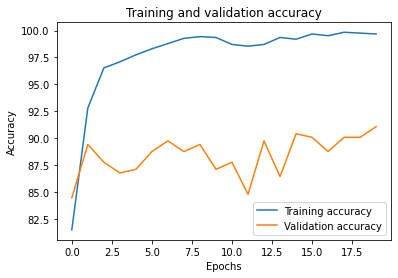

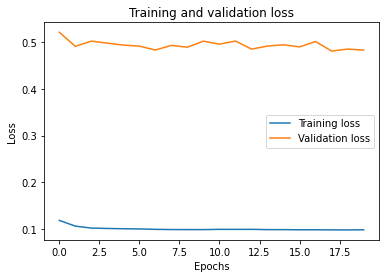

acc %
91.0891089108911
total INCORRECT total examples in val number of correct examples in val
27 303 276
Confusion Matrix:
 [[1779  361]
 [ 339 3581]]
True Positives: 3581
False Positives: 361
True Negatives: 1779
False Negatives: 339
Precision: 0.9084
Recall: 0.9135
east
acc %
91.29032258064517
total INCORRECT total examples in val number of correct examples in val
27 310 283
val loss
0.5204580111862862
Confusion Matrix:
 [[ 95  12]
 [ 15 188]]
True Positives: 188
False Positives: 12
True Negatives: 95
False Negatives: 15
Precision: 0.9400
Recall: 0.9261
# of prior shifted examples east 0
central
acc %
73.63013698630137
total INCORRECT total examples in val number of correct examples in val
77 292 215
val loss
0.5947201962340368
Confusion Matrix:
 [[ 17  75]
 [  2 198]]
True Positives: 198
False Positives: 75
True Negatives: 17
False Negatives: 2
Precision: 0.7253
Recall: 0.9900
# of prior shifted examples central 0
west
acc %
72.91925465838509
total INCORRECT total examples in val n

/tmp/ipykernel_32699/2222487850.py:57: RuntimeWarning: invalid value encountered in long_scalars
  recall = tp / (tp + fn)


acc %
77.18023255813954
total INCORRECT total examples in val number of correct examples in val
314 1376 1062
val loss
0.5713003235839323
Confusion Matrix:
 [[325 205]
 [109 737]]
True Positives: 737
False Positives: 205
True Negatives: 325
False Negatives: 109
Precision: 0.7824
Recall: 0.8712


In [53]:

model = MultiResNet()
model.to(device)
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)

#model = MultiResNet()
#model.to(device)
#model.load_state_dict(torch.load('resnet-multimodal-FULLtrain.pt'))
#model.eval()

###############################
###############################
#########DISTRIBUTION SHIFT TRN FULL
###############################
###############################
#MEAN INTERPOLATION MODEL 
print('training start')
trn_acc_list = []
val_acc_list = []
trn_loss_list = []
val_loss_list = []
all_predictions = []
all_labels = []

criterion = nn.BCEWithLogitsLoss()
# Train the model

num_epochs = 20
for epoch in range(num_epochs):
    model.train()
    correct = 0
    total = 0
    train_loss = 0.0

    for inputs, inputsCHM, s1, labs, paths in train_loadere:
        #print(inputs.shape) #32,4,40,40
        #print(inputs)

        inputs = inputs.to("cuda")
        inputsCHM = inputsCHM.to("cuda")
        labs = torch.Tensor(labs).unsqueeze(1).to("cuda")
        s1 = s1.to(device).float()
        

        # Calculate mean of non-NaN values in each channel
        
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
            #if mask.sum() > 0:
            #    print("Inputs after interpolation:")
            #    print(channel_data)
            # Check for NaNs in inputs
        if torch.isnan(inputs).any():
            raise ValueError("NaNs found in inputs after interpolation")
    
        # Check for NaNs in inputsCHM and labs
        if torch.isnan(inputsCHM).any():
            raise ValueError("NaNs found in inputsCHM")
        if torch.isnan(labs).any():
            raise ValueError("NaNs found in labs")
        
        #inputs = torch.where(torch.isnan(inputs), torch.zeros_like(inputs), inputs)

        optimizer.zero_grad()
        outputs = model(inputsCHM,inputs)
        if torch.isnan(outputs).any():
            print(f"Inputs: {inputs[0][0]}")
            #print(f"InputsCHM: {inputsCHM}")
            print(f"Model outputs: {outputs}")
            raise ValueError("NaNs found in model outputs")

        loss = criterion(outputs, labs.float())
        if torch.isnan(loss).any():
            raise ValueError("NaNs found in loss")

        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)

        optimizer.step()
        train_loss += loss.item() * inputs.size(0)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
        correct += (predicted == labs).sum().item()
    trn_acc_list.append(correct/total * 100)
    trn_loss_list.append(train_loss/len(train_loadere.dataset))
    

    if epoch == 19: 
        torch.save(model.state_dict(), 'resnet-trimodal-FULLtrain.pt')


    # Validate the model
    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    with torch.no_grad():
        
        for inputs, inputsCHM, s1, labs, paths in val_loadere:

            inputs= inputs.to("cuda")
            inputsCHM = inputsCHM.to("cuda")
            labs = torch.Tensor(labs).unsqueeze(1).to("cuda")
            s1 = s1.to(device).float()            #normalized_inputs = normalizer(inputs)

            has_nan = torch.isnan(inputs).any(dim=1)  # Check along batch dimension (assuming dim=0 is batch)
            # Filter inputs to exclude those with NaNs
            has_nan_anywhere = torch.any(torch.any(has_nan, dim=1), dim=1)
    
            inputs = inputs[~has_nan_anywhere]
            inputsCHM = inputsCHM[~has_nan_anywhere]
            labs = labs[~has_nan_anywhere]
            
            outputs = model(inputsCHM, inputs)
            loss = criterion(outputs, labs.float())
            val_loss += loss.item() * inputs.size(0)
            predicted = (outputs > 0.5).float()
            total += labs.size(0)
            correct += (predicted == labs).sum().item()
            all_predictions.extend(predicted.cpu().numpy())
            all_labels.extend(labs.cpu().numpy())
        val_acc_list.append(correct/total * 100)
        val_loss_list.append(val_loss / len(val_loadere.dataset))

    print(f'Epoch {epoch+1}/{num_epochs}, '
          f'Train Loss: {train_loss/len(train_loadere.dataset):.4f}, '
          f'Train Acc: {trn_acc_list[-1]:.4f}, '
          #f'Train Acc: {trn_acc_list[-1])*100:.4f}, '
          f'Val Loss: {val_loss/len(val_loadere.dataset):.4f}, '
          f'Val Acc: {(correct/total)*100:.2f}' )

plot_res(trn_acc_list,val_acc_list,trn_loss_list,val_loss_list,all_labels,all_predictions)


p_orch_src = .55
p_for_src = .45

p_orch_e = .34
p_for_e = .66

p_orch_c = .31
p_for_c = .69

p_orch_w = .58
p_for_w = .42

p_orch_sdpt = .58
p_for_sdpt = .42


print('east')
val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
priored = 0
with torch.no_grad():
    for inputs, inputsCHM, s1, labs, paths in val_loadere:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)
        s1 = s1.to(device).float()
        
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputsCHM, inputs)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)
        #p1 = torch.count_nonzero((outputs > 0.5))
        pred1 = (outputs > 0.5).float()
        p1 = (pred1 == labs).sum().item()
        

#        outputs = outputs * (p_for_e / p_for_src) / ( outputs * (p_for_e / p_for_src) + 
#                                                     (1 - outputs) * (p_orch_e / p_orch_src) )
        #p2 = torch.count_nonzero((outputs > 0.5))
        #priored += abs(p1-p2)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        p2 = (predicted == labs).sum().item()
        correct += (predicted == labs).sum().item()
        priored += p1-p2

        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    print('acc %')
    print(correct/total * 100)
    print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
    print(total-correct, total, correct)
    print('val loss')
    print(val_loss / len(val_loaderc.dataset))
    print_cm(all_predictions,all_labels)
    print('# of prior shifted examples east', priored) 

print('central')
val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
priored = 0
with torch.no_grad():
    for inputs, inputsCHM, s1, labs, paths in val_loaderc:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)
        s1 = s1.to(device).float()
        
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputsCHM, inputs)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)

        #p1 = torch.count_nonzero((outputs > 0.5))
        pred1 = (outputs > 0.5).float()
        p1 = (pred1 == labs).sum().item()
        

#        outputs = outputs * (p_for_c / p_for_src) / ( outputs * (p_for_c / p_for_src) + 
#                                                     (1 - outputs) * (p_orch_c / p_orch_src) )
        #p2 = torch.count_nonzero((outputs > 0.5))
        #priored += abs(p1-p2)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        p2 = (predicted == labs).sum().item()
        correct += (predicted == labs).sum().item()
        priored += p1-p2

        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    print('acc %')
    print(correct/total * 100)
    print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
    print(total-correct, total, correct)
    print('val loss')
    print(val_loss / len(val_loaderc.dataset))
    print_cm(all_predictions,all_labels)
    print('# of prior shifted examples central', priored) 
    
print('west')

val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
priored = 0
with torch.no_grad():
    for inputs, inputsCHM, s1, labs, paths in val_loaderw:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)
        s1 = s1.to(device).float()
        
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputsCHM, inputs)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)

        #p1 = torch.count_nonzero((outputs > 0.5))
        pred1 = (outputs > 0.5).float()
        p1 = (pred1 == labs).sum().item()
        

#        outputs = outputs * (p_for_w / p_for_src) / ( outputs * (p_for_w / p_for_src) + 
#                                                     (1 - outputs) * (p_orch_w / p_orch_src) )
        #p2 = torch.count_nonzero((outputs > 0.5))
        #priored += abs(p1-p2)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        p2 = (predicted == labs).sum().item()
        correct += (predicted == labs).sum().item()
        priored += p1-p2


        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    print('acc %')
    print(correct/total * 100)
    print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
    print(total-correct, total, correct)
    print('val loss')
    print(val_loss / len(val_loaderw.dataset))
    print_cm(all_predictions,all_labels)
    print('# of prior shifted examples west', priored) 


print('JUST sdpt')

val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
with torch.no_grad():
    for inputs, inputsCHM, s1, labs, paths in sdpt_loader:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)
        s1 = s1.to(device).float()
        
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputsCHM, inputs)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        correct += (predicted == labs).sum().item()
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    print('acc %')
    print(correct/total * 100)
    print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
    print(total-correct, total, correct)
    print('val loss')
    print(val_loss / len(sdpt_loader.dataset))
    print_cm(all_predictions,all_labels)
   
print('val-nosdpt')
val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
with torch.no_grad():
    for inputs, inputsCHM, s1, labs, paths in val_nosdpt_loader:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)
        s1 = s1.to(device).float()
        
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputsCHM, inputs)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        correct += (predicted == labs).sum().item()
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    print('acc %')
    print(correct/total * 100)
    print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
    print(total-correct, total, correct)
    print('val loss')
    print(val_loss / len(val_nosdpt_loader.dataset))
    print_cm(all_predictions,all_labels)
    


In [47]:

model = MultiResNet()
model.to(device)
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)

model = MultiResNet()
model.to(device)
model.load_state_dict(torch.load('resnet-multimodal-FULLtrain.pt'))
model.eval()

###############################
###############################
#########DISTRIBUTION SHIFT TRN FULL
###############################
###############################
#MEAN INTERPOLATION MODEL 
print('training start')
trn_acc_list = []
val_acc_list = []
trn_loss_list = []
val_loss_list = []
all_predictions = []
all_labels = []

criterion = nn.BCEWithLogitsLoss()
# Train the model

num_epochs = 20
for epoch in range(num_epochs):
    model.train()
    correct = 0
    total = 0
    train_loss = 0.0
        # Validate the model
    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    with torch.no_grad():
        for inputs, inputsCHM, s1, labs, paths in val_loadere:

            inputs= inputs.to("cuda")
            inputsCHM = inputsCHM.to("cuda")
            labs = torch.Tensor(labs).unsqueeze(1).to("cuda")
            s1 = s1.to(device).float()            #normalized_inputs = normalizer(inputs)

            has_nan = torch.isnan(inputs).any(dim=1)  # Check along batch dimension (assuming dim=0 is batch)
            # Filter inputs to exclude those with NaNs
            has_nan_anywhere = torch.any(torch.any(has_nan, dim=1), dim=1)
    
            inputs = inputs[~has_nan_anywhere]
            inputsCHM = inputsCHM[~has_nan_anywhere]
            labs = labs[~has_nan_anywhere]
            
            outputs = model(inputsCHM, inputs, s1)
            loss = criterion(outputs, labs.float())
            val_loss += loss.item() * inputs.size(0)
            predicted = (outputs > 0.5).float()
            total += labs.size(0)
            correct += (predicted == labs).sum().item()
            all_predictions.extend(predicted.cpu().numpy())
            all_labels.extend(labs.cpu().numpy())
        val_acc_list.append(correct/total * 100)
        val_loss_list.append(val_loss / len(val_loadere.dataset))

        print(f'Epoch {epoch+1}/{num_epochs}, '
              #f'Train Loss: {train_loss/len(train_loadere.dataset):.4f}, '
              #f'Train Acc: {trn_acc_list[-1]:.4f}, '
              #f'Train Acc: {trn_acc_list[-1])*100:.4f}, '
              f'Val Loss: {val_loss/len(val_loadere.dataset):.4f}, '
              f'Val Acc: {(correct/total)*100:.2f}' )

    for inputs, inputsCHM, s1, labs, paths in train_loadere:
        #print(inputs.shape) #32,4,40,40
        #print(inputs)

        inputs = inputs.to("cuda")
        inputsCHM = inputsCHM.to("cuda")
        labs = torch.Tensor(labs).unsqueeze(1).to("cuda")
        s1 = s1.to(device).float()
        

        # Calculate mean of non-NaN values in each channel
        
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
            #if mask.sum() > 0:
            #    print("Inputs after interpolation:")
            #    print(channel_data)
            # Check for NaNs in inputs
        if torch.isnan(inputs).any():
            raise ValueError("NaNs found in inputs after interpolation")
    
        # Check for NaNs in inputsCHM and labs
        if torch.isnan(inputsCHM).any():
            raise ValueError("NaNs found in inputsCHM")
        if torch.isnan(labs).any():
            raise ValueError("NaNs found in labs")
        
        #inputs = torch.where(torch.isnan(inputs), torch.zeros_like(inputs), inputs)

        optimizer.zero_grad()
        outputs = model(inputsCHM,inputs,s1)
        if torch.isnan(outputs).any():
            print(f"Inputs: {inputs[0][0]}")
            #print(f"InputsCHM: {inputsCHM}")
            print(f"Model outputs: {outputs}")
            raise ValueError("NaNs found in model outputs")

        loss = criterion(outputs, labs.float())
        if torch.isnan(loss).any():
            raise ValueError("NaNs found in loss")

        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)

        optimizer.step()
        train_loss += loss.item() * inputs.size(0)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
        correct += (predicted == labs).sum().item()
    trn_acc_list.append(correct/total * 100)
    trn_loss_list.append(train_loss/len(full_trn_loader.dataset))
    

    if epoch == 19: 
        torch.save(model.state_dict(), 'resnet-trimodal-FULLtrain.pt')


    # Validate the model
    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    with torch.no_grad():
        
        for inputs, inputsCHM, s1, labs, paths in val_loadere:

            inputs= inputs.to("cuda")
            inputsCHM = inputsCHM.to("cuda")
            labs = torch.Tensor(labs).unsqueeze(1).to("cuda")
            s1 = s1.to(device).float()            #normalized_inputs = normalizer(inputs)

            has_nan = torch.isnan(inputs).any(dim=1)  # Check along batch dimension (assuming dim=0 is batch)
            # Filter inputs to exclude those with NaNs
            has_nan_anywhere = torch.any(torch.any(has_nan, dim=1), dim=1)
    
            inputs = inputs[~has_nan_anywhere]
            inputsCHM = inputsCHM[~has_nan_anywhere]
            labs = labs[~has_nan_anywhere]
            
            outputs = model(inputsCHM, inputs, s1)
            loss = criterion(outputs, labs.float())
            val_loss += loss.item() * inputs.size(0)
            predicted = (outputs > 0.5).float()
            total += labs.size(0)
            correct += (predicted == labs).sum().item()
            all_predictions.extend(predicted.cpu().numpy())
            all_labels.extend(labs.cpu().numpy())
        val_acc_list.append(correct/total * 100)
        val_loss_list.append(val_loss / len(val_loadere.dataset))

    print(f'Epoch {epoch+1}/{num_epochs}, '
          f'Train Loss: {train_loss/len(train_loadere.dataset):.4f}, '
          f'Train Acc: {trn_acc_list[-1]:.4f}, '
          #f'Train Acc: {trn_acc_list[-1])*100:.4f}, '
          f'Val Loss: {val_loss/len(val_loadere.dataset):.4f}, '
          f'Val Acc: {(correct/total)*100:.2f}' )

plot_res(trn_acc_list,val_acc_list,trn_loss_list,val_loss_list,all_labels,all_predictions)


p_orch_src = .55
p_for_src = .45

p_orch_e = .34
p_for_e = .66

p_orch_c = .31
p_for_c = .69

p_orch_w = .58
p_for_w = .42

p_orch_sdpt = .58
p_for_sdpt = .42


print('east')
val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
priored = 0
with torch.no_grad():
    for inputs, inputsCHM, s1, labs, paths in val_loadere:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)
        s1 = s1.to(device).float()
        
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputsCHM, inputs,s1)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)
        #p1 = torch.count_nonzero((outputs > 0.5))
        pred1 = (outputs > 0.5).float()
        p1 = (pred1 == labs).sum().item()
        

#        outputs = outputs * (p_for_e / p_for_src) / ( outputs * (p_for_e / p_for_src) + 
#                                                     (1 - outputs) * (p_orch_e / p_orch_src) )
        #p2 = torch.count_nonzero((outputs > 0.5))
        #priored += abs(p1-p2)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        p2 = (predicted == labs).sum().item()
        correct += (predicted == labs).sum().item()
        priored += p1-p2

        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    print('acc %')
    print(correct/total * 100)
    print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
    print(total-correct, total, correct)
    print('val loss')
    print(val_loss / len(val_loaderc.dataset))
    print_cm(all_predictions,all_labels)
    print('# of prior shifted examples east', priored) 

print('central')
val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
priored = 0
with torch.no_grad():
    for inputs, inputsCHM, s1, labs, paths in val_loaderc:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)
        s1 = s1.to(device).float()
        
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputsCHM, inputs,s1)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)

        #p1 = torch.count_nonzero((outputs > 0.5))
        pred1 = (outputs > 0.5).float()
        p1 = (pred1 == labs).sum().item()
        

#        outputs = outputs * (p_for_c / p_for_src) / ( outputs * (p_for_c / p_for_src) + 
#                                                     (1 - outputs) * (p_orch_c / p_orch_src) )
        #p2 = torch.count_nonzero((outputs > 0.5))
        #priored += abs(p1-p2)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        p2 = (predicted == labs).sum().item()
        correct += (predicted == labs).sum().item()
        priored += p1-p2

        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    print('acc %')
    print(correct/total * 100)
    print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
    print(total-correct, total, correct)
    print('val loss')
    print(val_loss / len(val_loaderc.dataset))
    print_cm(all_predictions,all_labels)
    print('# of prior shifted examples central', priored) 
    
print('west')

val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
priored = 0
with torch.no_grad():
    for inputs, inputsCHM, s1, labs, paths in val_loaderw:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)
        s1 = s1.to(device).float()
        
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputsCHM, inputs,s1)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)

        #p1 = torch.count_nonzero((outputs > 0.5))
        pred1 = (outputs > 0.5).float()
        p1 = (pred1 == labs).sum().item()
        

#        outputs = outputs * (p_for_w / p_for_src) / ( outputs * (p_for_w / p_for_src) + 
#                                                     (1 - outputs) * (p_orch_w / p_orch_src) )
        #p2 = torch.count_nonzero((outputs > 0.5))
        #priored += abs(p1-p2)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        p2 = (predicted == labs).sum().item()
        correct += (predicted == labs).sum().item()
        priored += p1-p2


        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    print('acc %')
    print(correct/total * 100)
    print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
    print(total-correct, total, correct)
    print('val loss')
    print(val_loss / len(val_loaderw.dataset))
    print_cm(all_predictions,all_labels)
    print('# of prior shifted examples west', priored) 


print('JUST sdpt')

val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
with torch.no_grad():
    for inputs, inputsCHM, s1, labs, paths in sdpt_loader:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)
        s1 = s1.to(device).float()
        
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputsCHM, inputs)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        correct += (predicted == labs).sum().item()
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    print('acc %')
    print(correct/total * 100)
    print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
    print(total-correct, total, correct)
    print('val loss')
    print(val_loss / len(sdpt_loader.dataset))
    print_cm(all_predictions,all_labels)
   
print('val-nosdpt')
val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
with torch.no_grad():
    for inputs, inputsCHM, s1, labs, paths in val_nosdpt_loader:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)
        s1 = s1.to(device).float()
        
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputsCHM, inputs,s1)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        correct += (predicted == labs).sum().item()
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    print('acc %')
    print(correct/total * 100)
    print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
    print(total-correct, total, correct)
    print('val loss')
    print(val_loss / len(val_nosdpt_loader.dataset))
    print_cm(all_predictions,all_labels)
    


/tmp/ipykernel_32699/3854714951.py:8: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('resnet-multimodal-FULLtrain.pt'))


training start
Epoch 1/20, Val Loss: 0.4905, Val Acc: 87.79
Epoch 1/20, Train Loss: 0.4430, Train Acc: 97.5357, Val Loss: 0.4905, Val Acc: 87.79
Epoch 2/20, Val Loss: 0.4905, Val Acc: 87.79
Epoch 2/20, Train Loss: 0.4430, Train Acc: 97.5357, Val Loss: 0.4905, Val Acc: 87.79
Epoch 3/20, Val Loss: 0.4905, Val Acc: 87.79
Epoch 3/20, Train Loss: 0.4430, Train Acc: 97.5357, Val Loss: 0.4905, Val Acc: 87.79
Epoch 4/20, Val Loss: 0.4905, Val Acc: 87.79


KeyboardInterrupt: 

/home/angelats11/.local/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/angelats11/.local/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_5.468838631568481_Lon_-3.2480613503066436.tif


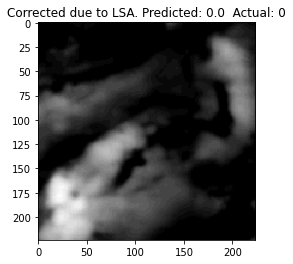

mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_5.4002529791624445_Lon_6.879903171787338.tif


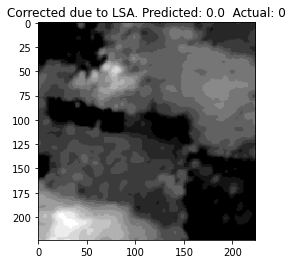

mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_4.149944926850577_Lon_9.465731167939119.tif


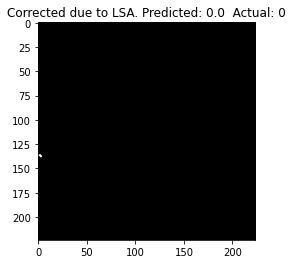

acc %
62.5139043381535
total INCORRECT total examples in val number of correct examples in val
337 899 562
val loss
1.0247144762745688
Confusion Matrix:
 [[562   0]
 [337   0]]
True Positives: 0
False Positives: 0
True Negatives: 562
False Negatives: 337
Precision: nan
Recall: 0.0000
priored -144
[array([1.], dtype=float32), array([0.], dtype=float32), array([0.], dtype=float32), array([0.], dtype=float32), array([0.], dtype=float32), array([0.], dtype=float32), array([1.], dtype=float32), array([0.], dtype=float32), array([1.], dtype=float32), array([1.], dtype=float32), array([1.], dtype=float32), array([0.], dtype=float32), array([1.], dtype=float32), array([1.], dtype=float32), array([0.], dtype=float32), array([1.], dtype=float32), array([1.], dtype=float32), array([0.], dtype=float32), array([0.], dtype=float32), array([0.], dtype=float32), array([0.], dtype=float32), array([0.], dtype=float32), array([0.], dtype=float32), array([0.], dtype=float32), array([1.], dtype=float32), a

/tmp/ipykernel_1132/1518844836.py:56: RuntimeWarning: invalid value encountered in long_scalars
  precision = tp / (tp + fp)


In [28]:
model = MultiResNet()
model.to(device)
model.load_state_dict(torch.load('resnet-multimodal-FULLtrain.pt',map_location=torch.device('cpu')))
model.eval()


val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
incorrect_paths = []
priored = 0

p_orch_src = .55
p_for_src = .45

p_orch_plt = .99
p_for_plt = .01

corrected = []

with torch.no_grad():
    for inputs, inputsCHM, labs, paths in sdpt_loader:
        #print(paths)
        #print(type(paths))
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)
        
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputsCHM, inputs)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)
        
        pred1 = (outputs > 0.5).float()
        p1 = (pred1 == labs).sum().item()
        outputs = outputs * (p_for_plt / p_for_src) / ( outputs * (p_for_plt / p_for_src) + 
                                                     (1 - outputs) * (p_orch_plt / p_orch_src) )
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
        p2 = (predicted == labs).sum().item()
        change_indices = torch.where(pred1 != predicted)[0]
        corrected += [paths[i] for i in change_indices]
        correct += (predicted == labs).sum().item()
        priored += p1-p2
        '''
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
        correct += (predicted == labs).sum().item()
        '''
        incorrect_paths += [paths[i] for i in range(len(paths)) if predicted[i] != labs[i]]
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
        #print(change_indices)
        for chg_ind in change_indices:
            if chg_ind % 100 == 0:
                print(paths[chg_ind])
                chg_image = inputsCHM[chg_ind].cpu().squeeze()  # Get misclassified image
                chg_image = chg_image.numpy()
                
                plt.imshow(chg_image,cmap='gray')
                plt.title(f"Corrected due to LSA. Predicted: {predicted[chg_ind].item()}  Actual: {labels[chg_ind].item()}")
                plt.show()  

        
    print('acc %')
    print(correct/total * 100)
    print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
    print(total-correct, total, correct)
    print('val loss')
    print(val_loss / len(sdpt_loader.dataset))
    print_cm(all_predictions,all_labels)
    print('priored', priored)
    print(all_predictions)
    print(all_labels)
    print('incorrectos: ', len(incorrect_paths))
    print(incorrect_paths)


mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_3.473872533223952_Lon_11.273036581081229.tif


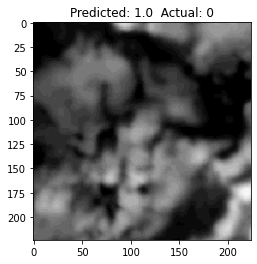

mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_-4.386856878121397_Lon_20.28506652474721.tif


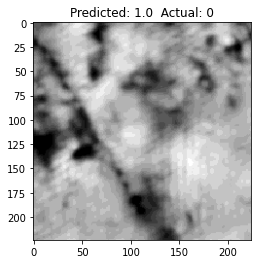

mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_4.146136388350317_Lon_9.477059989505225.tif


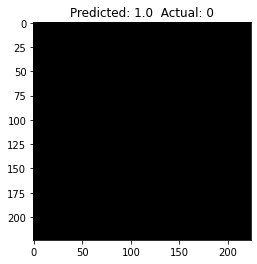

mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_4.657072312325623_Lon_9.003367112390686.tif


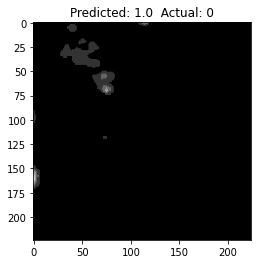

mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_3.6209131292295322_Lon_11.3920708787055.tif


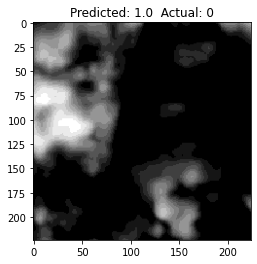

mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_3.62528985016692_Lon_11.358871441510097.tif


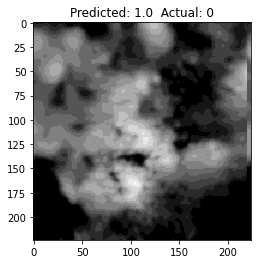

mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_5.339098455428523_Lon_6.7452833570040776.tif


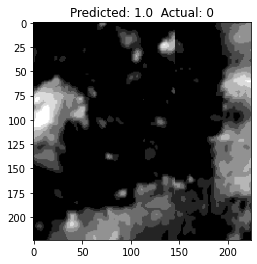

mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_4.146459224063214_Lon_9.468424387623605.tif


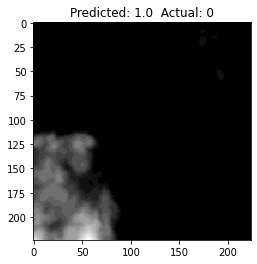

mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_4.156611532683147_Lon_9.433323901644158.tif


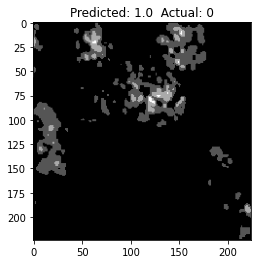

mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_4.158672888499073_Lon_9.467952028843952.tif


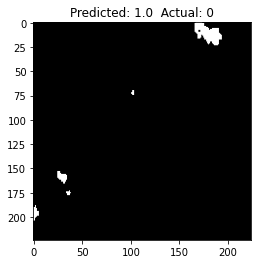

mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_3.5186233842245374_Lon_11.279471572022592.tif


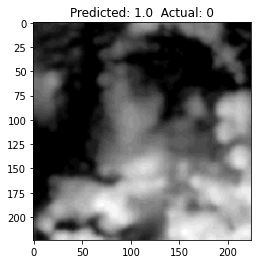

mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_4.12582491447379_Lon_9.517716737042923.tif


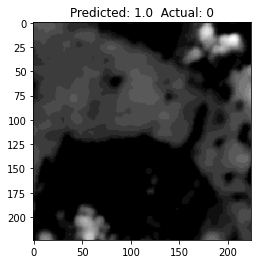

mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_4.13196046955014_Lon_9.510407161722517.tif


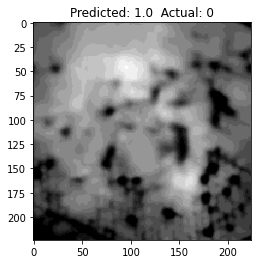

mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_4.235975159039996_Lon_9.672333983179083.tif


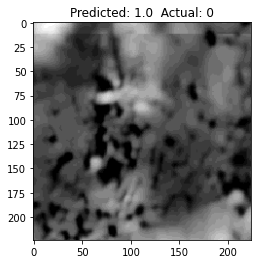

In [21]:
val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
incorrect_paths = []
with torch.no_grad():
    for inputs, inputsCHM, labs, paths in sdpt_loader:
        #print(paths)
        #print(type(paths))
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)
        
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputsCHM, inputs)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        correct += (predicted == labs).sum().item()
        incorrect_paths += [paths[i] for i in range(len(paths)) if predicted[i] != labs[i]]
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
        misclassified_inds = (predicted != labs).nonzero(as_tuple=True)[0]
        for misclassified_ind in misclassified_inds:
            if misclassified_ind % 500 == 0:
                print(paths[misclassified_ind])
                misclassified_image = inputsCHM[misclassified_ind].cpu().squeeze()  # Get misclassified image
                misclassified_image = misclassified_image.numpy()
                
                plt.imshow(misclassified_image,cmap='gray')
                plt.title(f"Predicted: {predicted[misclassified_ind].item()}  Actual: {labels[misclassified_ind].item()}")
                plt.show()  # Display the misclassified image


mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_0.9743826539330793_Lon_20.21021878794314.tif


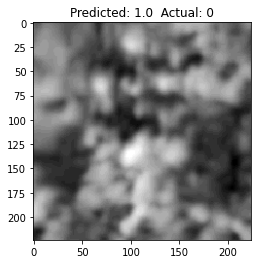

mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_4.657072312325623_Lon_9.003367112390686.tif


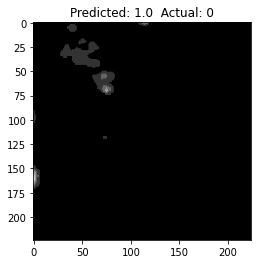

mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_5.39685495292954_Lon_6.8654352079926.tif


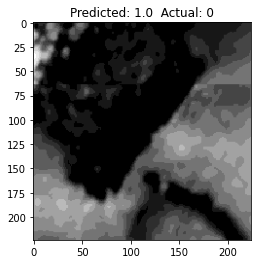

mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_1.1874341954406493_Lon_23.458462141179425.tif


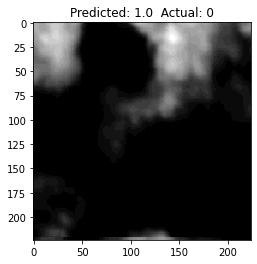

mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_5.45361903953452_Lon_-3.267800145560628.tif


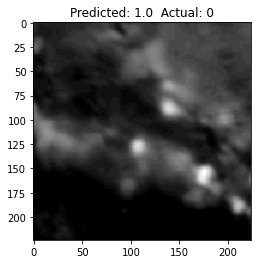

mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_0.5148592272608128_Lon_29.480528226487714.tif


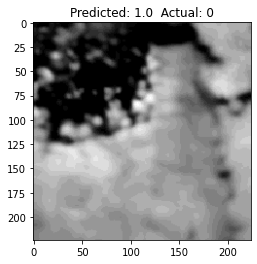

mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_3.601638079231032_Lon_11.38980585167864.tif


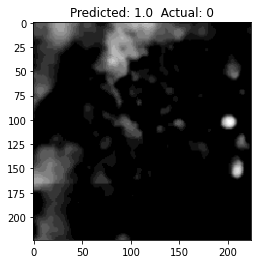

mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_6.303325794231966_Lon_5.558059982480356.tif


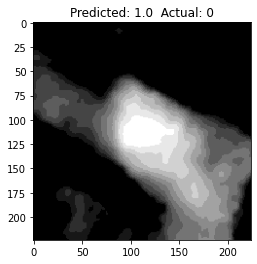

mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_5.335608830249333_Lon_6.772561053196106.tif


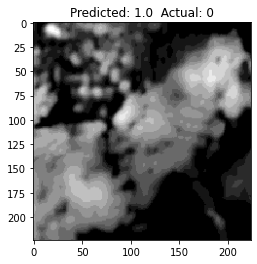

mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_4.356542306040937_Lon_9.595294494633812.tif


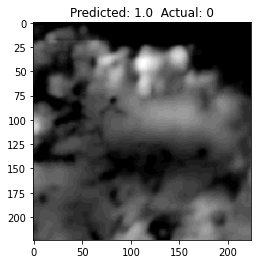

mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_3.761158380809062_Lon_11.2165756378395.tif


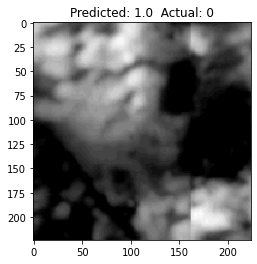

mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_4.224756262212433_Lon_9.630205838663391.tif


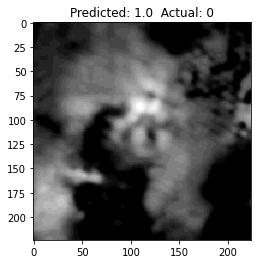

mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_1.2663216521019416_Lon_20.14001319721545.tif


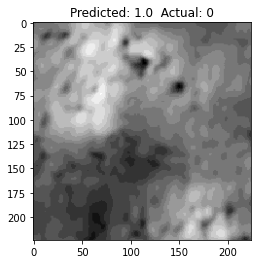

mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_2.4087984052687665_Lon_21.088050098011394.tif


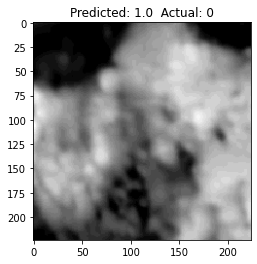

mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_4.186080694681385_Lon_9.47847589754171.tif


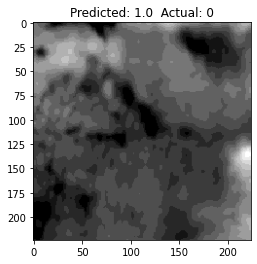

mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_4.721070108034613_Lon_11.215125294062183.tif


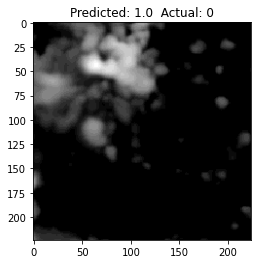

mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_4.168266843521292_Lon_9.423375934452997.tif


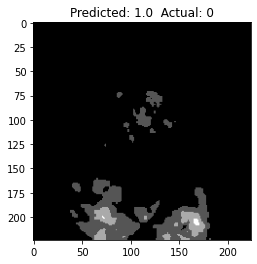

mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_-0.6542735419294469_Lon_18.281444731490677.tif


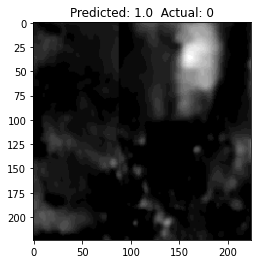

mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_3.5796679871595245_Lon_11.286623258081741.tif


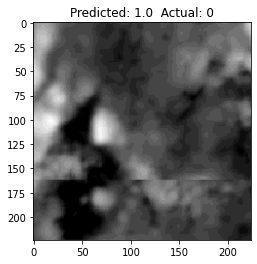

mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_4.7410680790908435_Lon_11.191904991971667.tif


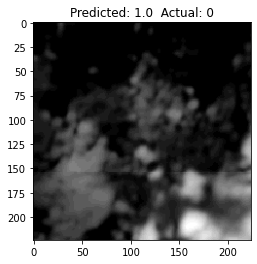

In [51]:
val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
incorrect_paths = []
with torch.no_grad():
    for inputs, inputsCHM, labs, paths in sdpt_loader:
        #print(paths)
        #print(type(paths))
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)
        
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputsCHM, inputs)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        correct += (predicted == labs).sum().item()
        incorrect_paths += [paths[i] for i in range(len(paths)) if predicted[i] != labs[i]]
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
        misclassified_inds = (predicted != labs).nonzero(as_tuple=True)[0]
        for misclassified_ind in misclassified_inds:
            if misclassified_ind % 500 == 0:
                print(paths[misclassified_ind])
                misclassified_image = inputsCHM[misclassified_ind].cpu().squeeze()  # Get misclassified image
                misclassified_image = misclassified_image.numpy()
                
                plt.imshow(misclassified_image,cmap='gray')
                plt.title(f"Predicted: {predicted[misclassified_ind].item()}  Actual: {labels[misclassified_ind].item()}")
                plt.show()  # Display the misclassified image


In [ ]:
BELOW::: UNADJUSTED SDPT TEST

mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_3.801690856003761_Lon_11.339750182570347.tif


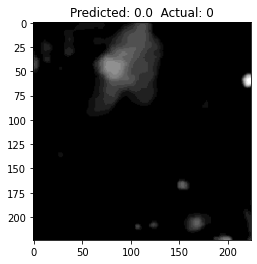

mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_3.579622806214381_Lon_11.312072225978136.tif


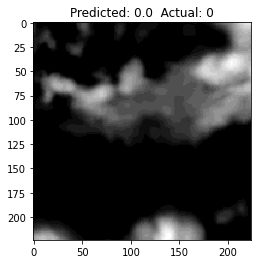

mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_2.99015008723987_Lon_20.824767443666172.tif


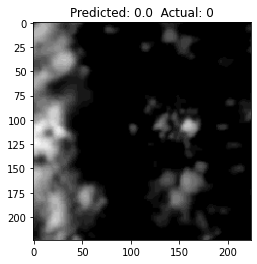

mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_3.5863984790390155_Lon_11.286894794146304.tif


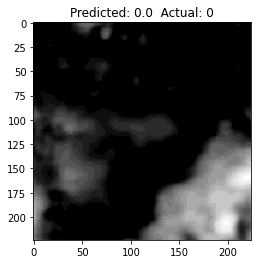

mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_3.624944545266106_Lon_11.297356282512933.tif


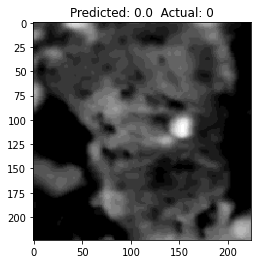

mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_3.771442512911249_Lon_11.3936209714776.tif


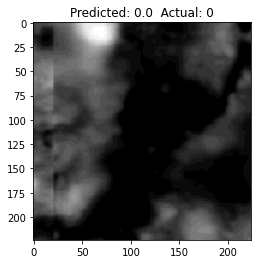

mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_4.727630771725286_Lon_11.2131885902642.tif


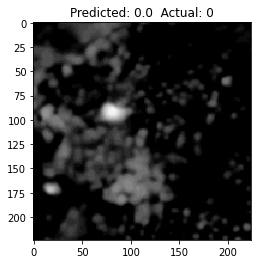

mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_4.147514889878298_Lon_9.487401939949697.tif


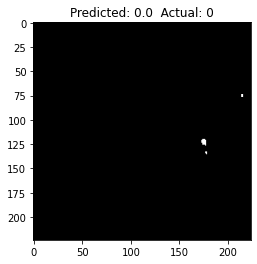

mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_0.5165251752783283_Lon_29.483243465662323.tif


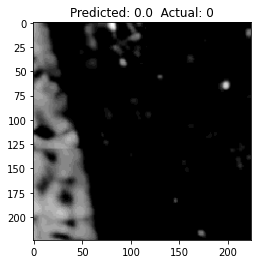

mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_3.67840142102155_Lon_11.363968221039046.tif


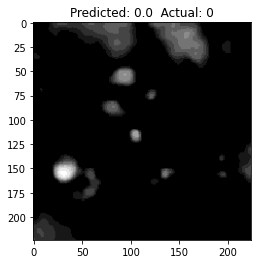

mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_6.426752775693965_Lon_5.770182625000781.tif


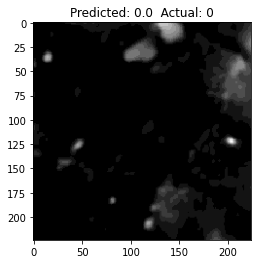

In [22]:
val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
incorrect_paths = []
with torch.no_grad():
    for inputs, inputsCHM, labs, paths in sdpt_loader:
        #print(paths)
        #print(type(paths))
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)
        
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputsCHM, inputs)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        correct += (predicted == labs).sum().item()
        incorrect_paths += [paths[i] for i in range(len(paths)) if predicted[i] != labs[i]]
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
        misclassified_inds = (predicted == labs).nonzero(as_tuple=True)[0]
        for misclassified_ind in misclassified_inds:
            if misclassified_ind % 200 == 0:
                print(paths[misclassified_ind])
                misclassified_image = inputsCHM[misclassified_ind].cpu().squeeze()  # Get misclassified image
                misclassified_image = misclassified_image.numpy()
                
                plt.imshow(misclassified_image,cmap='gray')
                plt.title(f"Predicted: {predicted[misclassified_ind].item()}  Actual: {labels[misclassified_ind].item()}")
                plt.show()  # Display the misclassified image


In [ ]:
######BELOW: UNADJUSTED SDPT TEST

mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_0.4966512244676842_Lon_24.09204278003994.tif


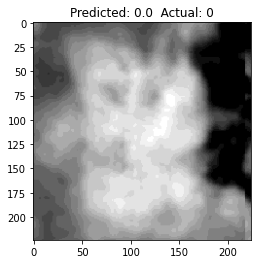

mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_0.753292619137749_Lon_23.924628334878555.tif


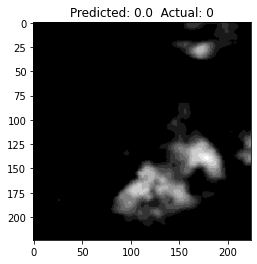

mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_1.0767176848291562_Lon_23.58040592481817.tif


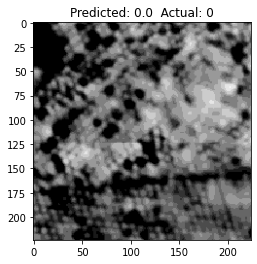

mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_4.159352056552896_Lon_9.415971713197147.tif


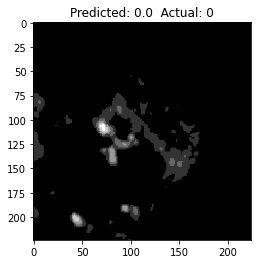

mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_5.378470010466592_Lon_6.922945715530732.tif


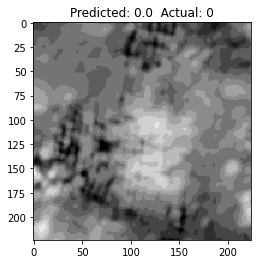

mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_3.7918922310081227_Lon_11.292997709093484.tif


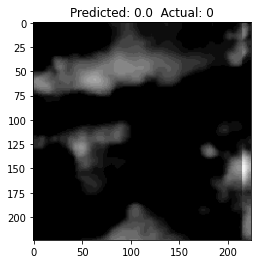

mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_0.5024035767337979_Lon_29.41522662788737.tif


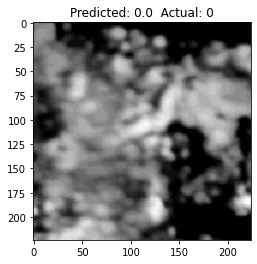

mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_5.411362704692665_Lon_6.800138620581458.tif


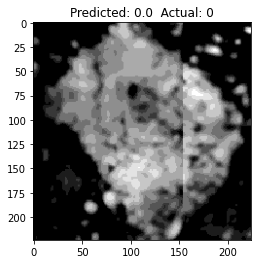

mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_1.1325784871061448_Lon_23.60172765660456.tif


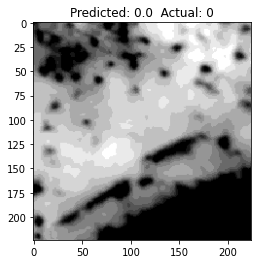

mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_3.67840142102155_Lon_11.363968221039046.tif


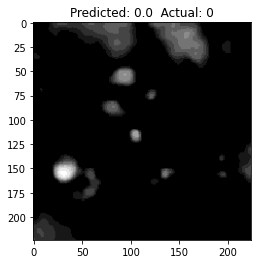

mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_6.279152741968358_Lon_-0.919331689070167.tif


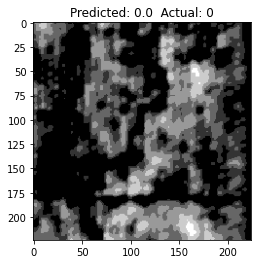

mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_5.489964205685368_Lon_-3.588623895150537.tif


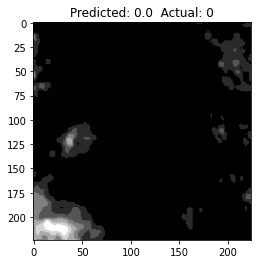

mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_4.111219693231344_Lon_9.39582234242795.tif


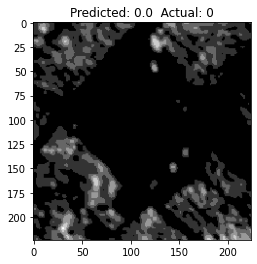

mountdata/s2NDVItsorchard-400m/sdptmanual-v2/Image_Lat_4.134041782738858_Lon_9.469946647660073.tif


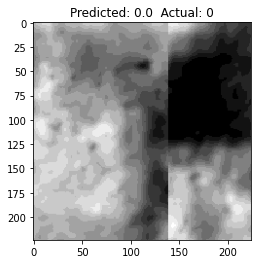

In [53]:
val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
incorrect_paths = []
with torch.no_grad():
    for inputs, inputsCHM, labs, paths in sdpt_loader:
        #print(paths)
        #print(type(paths))
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)
        
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputsCHM, inputs)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        correct += (predicted == labs).sum().item()
        incorrect_paths += [paths[i] for i in range(len(paths)) if predicted[i] != labs[i]]
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
        misclassified_inds = (predicted == labs).nonzero(as_tuple=True)[0]
        for misclassified_ind in misclassified_inds:
            if misclassified_ind % 200 == 0:
                print(paths[misclassified_ind])
                misclassified_image = inputsCHM[misclassified_ind].cpu().squeeze()  # Get misclassified image
                misclassified_image = misclassified_image.numpy()
                
                plt.imshow(misclassified_image,cmap='gray')
                plt.title(f"Predicted: {predicted[misclassified_ind].item()}  Actual: {labels[misclassified_ind].item()}")
                plt.show()  # Display the misclassified image


In [18]:

model = MultiResNet()
model.to(device)
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)

model = MultiResNet()
model.to(device)
model.load_state_dict(torch.load('resnet-multimodal-FULLtrain.pt'))
model.eval()

###############################
###############################
#########DISTRIBUTION SHIFT TRN FULL
###############################
###############################
#MEAN INTERPOLATION MODEL 
print('training start')
trn_acc_list = []
val_acc_list = []
trn_loss_list = []
val_loss_list = []
all_predictions = []
all_labels = []

criterion = nn.BCEWithLogitsLoss()
# Train the model
'''
num_epochs = 20
for epoch in range(num_epochs):
    model.train()
    correct = 0
    total = 0
    train_loss = 0.0

    for inputs, inputsCHM, labs in full_trn_loader:
        #print(inputs.shape) #32,4,40,40
        #print(inputs)

        inputs = inputs.to("cuda")
        inputsCHM = inputsCHM.to("cuda")
        labs = torch.Tensor(labs).unsqueeze(1).to("cuda")
        

        # Calculate mean of non-NaN values in each channel
        
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
            #if mask.sum() > 0:
            #    print("Inputs after interpolation:")
            #    print(channel_data)
            # Check for NaNs in inputs
        if torch.isnan(inputs).any():
            raise ValueError("NaNs found in inputs after interpolation")
    
        # Check for NaNs in inputsCHM and labs
        if torch.isnan(inputsCHM).any():
            raise ValueError("NaNs found in inputsCHM")
        if torch.isnan(labs).any():
            raise ValueError("NaNs found in labs")
        
        #inputs = torch.where(torch.isnan(inputs), torch.zeros_like(inputs), inputs)

        optimizer.zero_grad()
        outputs = model(inputsCHM,inputs)
        if torch.isnan(outputs).any():
            print(f"Inputs: {inputs[0][0]}")
            #print(f"InputsCHM: {inputsCHM}")
            print(f"Model outputs: {outputs}")
            raise ValueError("NaNs found in model outputs")

        loss = criterion(outputs, labs.float())
        if torch.isnan(loss).any():
            raise ValueError("NaNs found in loss")

        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)

        optimizer.step()
        train_loss += loss.item() * inputs.size(0)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
        correct += (predicted == labs).sum().item()
    trn_acc_list.append(correct/total * 100)
    trn_loss_list.append(train_loss/len(full_trn_loader.dataset))
    

    if epoch == 19: 
        torch.save(model.state_dict(), 'resnet-multimodal-FULLtrain.pt')


    # Validate the model
    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    with torch.no_grad():
        
        for inputs, inputsCHM, labs in full_val_loader:

            inputs= inputs.to("cuda")
            inputsCHM = inputsCHM.to("cuda")
            labs = torch.Tensor(labs).unsqueeze(1).to("cuda")
            #normalized_inputs = normalizer(inputs)

            has_nan = torch.isnan(inputs).any(dim=1)  # Check along batch dimension (assuming dim=0 is batch)
            # Filter inputs to exclude those with NaNs
            has_nan_anywhere = torch.any(torch.any(has_nan, dim=1), dim=1)
    
            inputs = inputs[~has_nan_anywhere]
            inputsCHM = inputsCHM[~has_nan_anywhere]
            labs = labs[~has_nan_anywhere]
            
            outputs = model(inputsCHM, inputs)
            loss = criterion(outputs, labs.float())
            val_loss += loss.item() * inputs.size(0)
            predicted = (outputs > 0.5).float()
            total += labs.size(0)
            correct += (predicted == labs).sum().item()
            all_predictions.extend(predicted.cpu().numpy())
            all_labels.extend(labs.cpu().numpy())
        val_acc_list.append(correct/total * 100)
        val_loss_list.append(val_loss / len(val_loadere.dataset))

    print(f'Epoch {epoch+1}/{num_epochs}, '
          f'Train Loss: {train_loss/len(train_loadere.dataset):.4f}, '
          f'Train Acc: {trn_acc_list[-1]:.4f}, '
          #f'Train Acc: {trn_acc_list[-1])*100:.4f}, '
          f'Val Loss: {val_loss/len(val_loadere.dataset):.4f}, '
          f'Val Acc: {(correct/total)*100:.2f}' )

plot_res(trn_acc_list,val_acc_list,trn_loss_list,val_loss_list,all_labels,all_predictions)
'''

p_orch_src = .55
p_for_src = .45

p_orch_e = .34
p_for_e = .66

p_orch_c = .31
p_for_c = .69

p_orch_w = .58
p_for_w = .42

p_orch_sdpt = .58
p_for_sdpt = .42


print('east')
val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
priored = 0
with torch.no_grad():
    for inputs, inputsCHM, labs, paths in val_loadere:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)

        
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputsCHM, inputs)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)
        #p1 = torch.count_nonzero((outputs > 0.5))
        pred1 = (outputs > 0.5).float()
        p1 = (pred1 == labs).sum().item()
        

        outputs = outputs * (p_for_e / p_for_src) / ( outputs * (p_for_e / p_for_src) + 
                                                     (1 - outputs) * (p_orch_e / p_orch_src) )
        #p2 = torch.count_nonzero((outputs > 0.5))
        #priored += abs(p1-p2)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        p2 = (predicted == labs).sum().item()
        correct += (predicted == labs).sum().item()
        priored += p1-p2

        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    print('acc %')
    print(correct/total * 100)
    print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
    print(total-correct, total, correct)
    print('val loss')
    print(val_loss / len(val_loaderc.dataset))
    print_cm(all_predictions,all_labels)
    print('# of prior shifted examples east', priored) 

print('central')
val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
priored = 0
with torch.no_grad():
    for inputs, inputsCHM, labs, paths in val_loaderc:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)

        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputsCHM, inputs)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)

        #p1 = torch.count_nonzero((outputs > 0.5))
        pred1 = (outputs > 0.5).float()
        p1 = (pred1 == labs).sum().item()
        

        outputs = outputs * (p_for_c / p_for_src) / ( outputs * (p_for_c / p_for_src) + 
                                                     (1 - outputs) * (p_orch_c / p_orch_src) )
        #p2 = torch.count_nonzero((outputs > 0.5))
        #priored += abs(p1-p2)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        p2 = (predicted == labs).sum().item()
        correct += (predicted == labs).sum().item()
        priored += p1-p2

        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    print('acc %')
    print(correct/total * 100)
    print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
    print(total-correct, total, correct)
    print('val loss')
    print(val_loss / len(val_loaderc.dataset))
    print_cm(all_predictions,all_labels)
    print('# of prior shifted examples central', priored) 
    
print('west')

val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
priored = 0
with torch.no_grad():
    for inputs, inputsCHM, labs, paths in val_loaderw:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)

        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputsCHM, inputs)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)

        #p1 = torch.count_nonzero((outputs > 0.5))
        pred1 = (outputs > 0.5).float()
        p1 = (pred1 == labs).sum().item()
        

        outputs = outputs * (p_for_w / p_for_src) / ( outputs * (p_for_w / p_for_src) + 
                                                     (1 - outputs) * (p_orch_w / p_orch_src) )
        #p2 = torch.count_nonzero((outputs > 0.5))
        #priored += abs(p1-p2)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        p2 = (predicted == labs).sum().item()
        correct += (predicted == labs).sum().item()
        priored += p1-p2


        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    print('acc %')
    print(correct/total * 100)
    print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
    print(total-correct, total, correct)
    print('val loss')
    print(val_loss / len(val_loaderw.dataset))
    print_cm(all_predictions,all_labels)
    print('# of prior shifted examples west', priored) 


print('JUST sdpt')

val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
with torch.no_grad():
    for inputs, inputsCHM, labs, paths in sdpt_loader:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)
        
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputsCHM, inputs)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        correct += (predicted == labs).sum().item()
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    print('acc %')
    print(correct/total * 100)
    print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
    print(total-correct, total, correct)
    print('val loss')
    print(val_loss / len(sdpt_loader.dataset))
    print_cm(all_predictions,all_labels)
   
print('val-nosdpt')
val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
with torch.no_grad():
    for inputs, inputsCHM, labs, paths in val_nosdpt_loader:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)
        '''
        has_nan = torch.isnan(inputs).any(dim=1) 
        has_nan_anywhere = torch.any(torch.any(has_nan, dim=1), dim=1)
        inputs = inputs[~has_nan_anywhere]
        inputsCHM = inputsCHM[~has_nan_anywhere]
        labs = labs[~has_nan_anywhere]
        '''
        
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputsCHM, inputs)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        correct += (predicted == labs).sum().item()
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    print('acc %')
    print(correct/total * 100)
    print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
    print(total-correct, total, correct)
    print('val loss')
    print(val_loss / len(val_nosdpt_loader.dataset))
    print_cm(all_predictions,all_labels)
    

print('fullvalloader')

val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
priored = 0
with torch.no_grad():
    for inputs, inputsCHM, labs, paths in full_val_loader:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)
        
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputsCHM, inputs)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)

        #p1 = torch.count_nonzero((outputs > 0.5))
        pred1 = (outputs > 0.5).float()
        p1 = (pred1 == labs).sum().item()
        

        outputs = outputs * (p_for_sdpt / p_for_src) / ( outputs * (p_for_sdpt / p_for_src) + 
                                                     (1 - outputs) * (p_orch_sdpt / p_orch_src) )
        #p2 = torch.count_nonzero((outputs > 0.5))
        #priored += abs(p1-p2)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        p2 = (predicted == labs).sum().item()
        correct += (predicted == labs).sum().item()
        priored += p1-p2

        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    print('acc %')
    print(correct/total * 100)
    print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
    print(total-correct, total, correct)
    print('val loss')
    print(val_loss / len(full_val_loader.dataset))
    print_cm(all_predictions,all_labels)
    print('# of prior shifted examples full', priored) 

/home/angelats11/.local/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/angelats11/.local/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


training start
east
acc %
90.69767441860465
total INCORRECT total examples in val number of correct examples in val
56 602 546
val loss
0.9975018738067314
Confusion Matrix:
 [[168  25]
 [ 31 378]]
True Positives: 378
False Positives: 25
True Negatives: 168
False Negatives: 31
Precision: 0.9380
Recall: 0.9242
# of prior shifted examples 2
central
acc %
92.8082191780822
total INCORRECT total examples in val number of correct examples in val
21 292 271
val loss
0.46922668038982235
Confusion Matrix:
 [[ 75   4]
 [ 17 196]]
True Positives: 196
False Positives: 4
True Negatives: 75
False Negatives: 17
Precision: 0.9800
Recall: 0.9202
# of prior shifted examples 4
west
acc %
63.738156761412576
total INCORRECT total examples in val number of correct examples in val
1684 4644 2960
val loss
0.7002967135029349
Confusion Matrix:
 [[2098 1079]
 [ 605  862]]
True Positives: 862
False Positives: 1079
True Negatives: 2098
False Negatives: 605
Precision: 0.4441
Recall: 0.5876
# of prior shifted example

In [26]:
model = MultiResNet()
model.to(device)
model.load_state_dict(torch.load('resnet-multimodal-EASTtrain.pt'))
model.eval()
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)

###############################
###############################
#########DISTRIBUTION SHIFT TRN EAST
###############################
###############################
#MEAN INTERPOLATION MODEL 
print('training start')
trn_acc_list = []
val_acc_list = []
trn_loss_list = []
val_loss_list = []
all_predictions = []
all_labels = []

'''
criterion = nn.BCEWithLogitsLoss()
# Train the model
num_epochs = 20
for epoch in range(num_epochs):
    model.train()
    correct = 0
    total = 0
    train_loss = 0.0

    for inputs, inputsCHM, labs in train_loadere:
        #print(inputs.shape) #32,4,40,40
        #print(inputs)

        inputs = inputs.to("cuda")
        inputsCHM = inputsCHM.to("cuda")
        labs = torch.Tensor(labs).unsqueeze(1).to("cuda")
        

        # Calculate mean of non-NaN values in each channel
        
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
            #if mask.sum() > 0:
            #    print("Inputs after interpolation:")
            #    print(channel_data)
            # Check for NaNs in inputs
        if torch.isnan(inputs).any():
            raise ValueError("NaNs found in inputs after interpolation")
    
        # Check for NaNs in inputsCHM and labs
        if torch.isnan(inputsCHM).any():
            raise ValueError("NaNs found in inputsCHM")
        if torch.isnan(labs).any():
            raise ValueError("NaNs found in labs")
        
        #inputs = torch.where(torch.isnan(inputs), torch.zeros_like(inputs), inputs)

        optimizer.zero_grad()
        outputs = model(inputsCHM,inputs)
        if torch.isnan(outputs).any():
            print(f"Inputs: {inputs[0][0]}")
            #print(f"InputsCHM: {inputsCHM}")
            print(f"Model outputs: {outputs}")
            raise ValueError("NaNs found in model outputs")

        loss = criterion(outputs, labs.float())
        if torch.isnan(loss).any():
            raise ValueError("NaNs found in loss")

        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)

        optimizer.step()
        train_loss += loss.item() * inputs.size(0)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
        correct += (predicted == labs).sum().item()
    trn_acc_list.append(correct/total * 100)
    trn_loss_list.append(train_loss/len(train_loadere.dataset))
    

    if epoch == 19: 
        torch.save(model.state_dict(), 'resnet-multimodal-EASTtrain.pt')


    # Validate the model
    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    with torch.no_grad():
        
        for inputs, inputsCHM, labs in val_loadere:

            inputs= inputs.to("cuda")
            inputsCHM = inputsCHM.to("cuda")
            labs = torch.Tensor(labs).unsqueeze(1).to("cuda")
            #normalized_inputs = normalizer(inputs)

            has_nan = torch.isnan(inputs).any(dim=1)  # Check along batch dimension (assuming dim=0 is batch)
            # Filter inputs to exclude those with NaNs
            has_nan_anywhere = torch.any(torch.any(has_nan, dim=1), dim=1)
    
            inputs = inputs[~has_nan_anywhere]
            inputsCHM = inputsCHM[~has_nan_anywhere]
            labs = labs[~has_nan_anywhere]
            
            outputs = model(inputsCHM, inputs)
            loss = criterion(outputs, labs.float())
            val_loss += loss.item() * inputs.size(0)
            predicted = (outputs > 0.5).float()
            total += labs.size(0)
            correct += (predicted == labs).sum().item()
            all_predictions.extend(predicted.cpu().numpy())
            all_labels.extend(labs.cpu().numpy())
        val_acc_list.append(correct/total * 100)
        val_loss_list.append(val_loss / len(val_loadere.dataset))

    print(f'Epoch {epoch+1}/{num_epochs}, '
          f'Train Loss: {train_loss/len(train_loadere.dataset):.4f}, '
          f'Train Acc: {trn_acc_list[-1]:.4f}, '
          #f'Train Acc: {trn_acc_list[-1])*100:.4f}, '
          f'Val Loss: {val_loss/len(val_loadere.dataset):.4f}, '
          f'Val Acc: {(correct/total)*100:.2f}' )

plot_res(trn_acc_list,val_acc_list,trn_loss_list,val_loss_list,all_labels,all_predictions)
'''


val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
priored = 0
with torch.no_grad():
    for inputs, inputsCHM, labs,paths in val_loaderc:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)

        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputsCHM, inputs)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)

        #p1 = torch.count_nonzero((outputs > 0.5))
        pred1 = (outputs > 0.5).float()
        p1 = (pred1 == labs).sum().item()
        

        outputs = outputs * (p_for_c / p_for_e) / ( outputs * (p_for_c / p_for_e) + 
                                                     (1 - outputs) * (p_orch_c / p_orch_e) )
        #p2 = torch.count_nonzero((outputs > 0.5))
        #priored += abs(p1-p2)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        p2 = (predicted == labs).sum().item()
        correct += (predicted == labs).sum().item()
        priored += p1-p2

        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    print('acc %')
    print(correct/total * 100)
    print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
    print(total-correct, total, correct)
    print('val loss')
    print(val_loss / len(val_loaderc.dataset))
    print_cm(all_predictions,all_labels)
    print('priored central', priored)



val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
priored = 0
with torch.no_grad():
    for inputs, inputsCHM, labs,paths in val_loaderw:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)

        
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputsCHM, inputs)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)

        #p1 = torch.count_nonzero((outputs > 0.5))
        pred1 = (outputs > 0.5).float()
        p1 = (pred1 == labs).sum().item()
        

        outputs = outputs * (p_for_w / p_for_e) / ( outputs * (p_for_w / p_for_e) + 
                                                     (1 - outputs) * (p_orch_w / p_orch_e) )
        #p2 = torch.count_nonzero((outputs > 0.5))
        #priored += abs(p1-p2)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        p2 = (predicted == labs).sum().item()
        correct += (predicted == labs).sum().item()
        priored += p1-p2
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    print('acc %')
    print(correct/total * 100)
    print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
    print(total-correct, total, correct)
    print('val loss')
    print(val_loss / len(val_loaderw.dataset))
    print_cm(all_predictions,all_labels)
    print('priored west', priored)



val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
with torch.no_grad():
    for inputs, inputsCHM, labs,paths in val_nosdpt_loader:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)
        
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputsCHM, inputs)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        correct += (predicted == labs).sum().item()
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    print('acc %')
    print(correct/total * 100)
    print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
    print(total-correct, total, correct)
    print('val loss')
    print(val_loss / len(val_nosdpt_loader.dataset))
    print_cm(all_predictions,all_labels)


val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
priored = 0
with torch.no_grad():
    for inputs, inputsCHM, labs,paths in full_val_loader:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)
        '''
        has_nan = torch.isnan(inputs).any(dim=1) 
        has_nan_anywhere = torch.any(torch.any(has_nan, dim=1), dim=1)
        inputs = inputs[~has_nan_anywhere]
        inputsCHM = inputsCHM[~has_nan_anywhere]
        labs = labs[~has_nan_anywhere]
        '''
        
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputsCHM, inputs)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)

        #p1 = torch.count_nonzero((outputs > 0.5))
        pred1 = (outputs > 0.5).float()
        p1 = (pred1 == labs).sum().item()
        

        outputs = outputs * (p_for_sdpt / p_for_e) / ( outputs * (p_for_sdpt / p_for_e) + 
                                                     (1 - outputs) * (p_orch_sdpt / p_orch_e) )
        #p2 = torch.count_nonzero((outputs > 0.5))
        #priored += abs(p1-p2)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        p2 = (predicted == labs).sum().item()
        correct += (predicted == labs).sum().item()
        priored += p1-p2
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    print('acc %')
    print(correct/total * 100)
    print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
    print(total-correct, total, correct)
    print('val loss')
    print(val_loss / len(full_val_loader.dataset))
    print_cm(all_predictions,all_labels)
    print('priored full',priored)


/home/angelats11/.local/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/angelats11/.local/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


training start
acc %
91.78082191780823
total INCORRECT total examples in val number of correct examples in val
24 292 268
val loss
0.47602030267454176
Confusion Matrix:
 [[ 80  12]
 [ 12 188]]
True Positives: 188
False Positives: 12
True Negatives: 80
False Negatives: 12
Precision: 0.9400
Recall: 0.9400
priored central 0
acc %
60.63738156761412
total INCORRECT total examples in val number of correct examples in val
1828 4644 2816
val loss
0.701190568679987
Confusion Matrix:
 [[2348 1473]
 [ 355  468]]
True Positives: 468
False Positives: 1473
True Negatives: 2348
False Negatives: 355
Precision: 0.2411
Recall: 0.5687
priored west 22
acc %
88.53820598006644
total INCORRECT total examples in val number of correct examples in val
69 602 533
val loss
0.49001272839565213
Confusion Matrix:
 [[179  49]
 [ 20 354]]
True Positives: 354
False Positives: 49
True Negatives: 179
False Negatives: 20
Precision: 0.8784
Recall: 0.9465
acc %
65.99496221662469
total INCORRECT total examples in val number 

In [27]:

model = MultiResNet()
model.to(device)
model.load_state_dict(torch.load('resnet-multimodal-centraltrain.pt'))
model.eval()
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)
'''
###############################
###############################
#########DISTRIBUTION SHIFT TRN CENTRAL
###############################
###############################
#MEAN INTERPOLATION MODEL 
print('training start')
trn_acc_list = []
val_acc_list = []
trn_loss_list = []
val_loss_list = []
all_predictions = []
all_labels = []

criterion = nn.BCEWithLogitsLoss()
# Train the model
num_epochs = 20
for epoch in range(num_epochs):
    model.train()
    correct = 0
    total = 0
    train_loss = 0.0

    for inputs, inputsCHM, labs in train_loaderc:
        #print(inputs.shape) #32,4,40,40
        #print(inputs)

        inputs = inputs.to("cuda")
        inputsCHM = inputsCHM.to("cuda")
        labs = torch.Tensor(labs).unsqueeze(1).to("cuda")
        

        # Calculate mean of non-NaN values in each channel
        
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
            #if mask.sum() > 0:
            #    print("Inputs after interpolation:")
            #    print(channel_data)
            # Check for NaNs in inputs
        if torch.isnan(inputs).any():
            raise ValueError("NaNs found in inputs after interpolation")
    
        # Check for NaNs in inputsCHM and labs
        if torch.isnan(inputsCHM).any():
            raise ValueError("NaNs found in inputsCHM")
        if torch.isnan(labs).any():
            raise ValueError("NaNs found in labs")
        
        #inputs = torch.where(torch.isnan(inputs), torch.zeros_like(inputs), inputs)

        optimizer.zero_grad()
        outputs = model(inputsCHM,inputs)
        if torch.isnan(outputs).any():
            print(f"Inputs: {inputs[0][0]}")
            #print(f"InputsCHM: {inputsCHM}")
            print(f"Model outputs: {outputs}")
            raise ValueError("NaNs found in model outputs")

        loss = criterion(outputs, labs.float())
        if torch.isnan(loss).any():
            raise ValueError("NaNs found in loss")

        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)

        optimizer.step()
        train_loss += loss.item() * inputs.size(0)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
        correct += (predicted == labs).sum().item()
    trn_acc_list.append(correct/total * 100)
    trn_loss_list.append(train_loss/len(train_loaderc.dataset))
    

    if epoch == 19: 
        torch.save(model.state_dict(), 'resnet-multimodal-centraltrain.pt')


    # Validate the model
    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    with torch.no_grad():
        
        for inputs, inputsCHM, labs in val_loaderc:

            inputs= inputs.to("cuda")
            inputsCHM = inputsCHM.to("cuda")
            labs = torch.Tensor(labs).unsqueeze(1).to("cuda")
            #normalized_inputs = normalizer(inputs)

            has_nan = torch.isnan(inputs).any(dim=1)  # Check along batch dimension (assuming dim=0 is batch)
            # Filter inputs to exclude those with NaNs
            has_nan_anywhere = torch.any(torch.any(has_nan, dim=1), dim=1)
    
            inputs = inputs[~has_nan_anywhere]
            inputsCHM = inputsCHM[~has_nan_anywhere]
            labs = labs[~has_nan_anywhere]
            
            outputs = model(inputsCHM, inputs)
            loss = criterion(outputs, labs.float())
            val_loss += loss.item() * inputs.size(0)
            predicted = (outputs > 0.5).float()
            total += labs.size(0)
            correct += (predicted == labs).sum().item()
            all_predictions.extend(predicted.cpu().numpy())
            all_labels.extend(labs.cpu().numpy())
        val_acc_list.append(correct/total * 100)
        val_loss_list.append(val_loss / len(val_loaderc.dataset))

    print(f'Epoch {epoch+1}/{num_epochs}, '
          f'Train Loss: {train_loss/len(train_loaderc.dataset):.4f}, '
          f'Train Acc: {trn_acc_list[-1]:.4f}, '
          #f'Train Acc: {trn_acc_list[-1])*100:.4f}, '
          f'Val Loss: {val_loss/len(val_loaderc.dataset):.4f}, '
          f'Val Acc: {(correct/total)*100:.2f}' )

plot_res(trn_acc_list,val_acc_list,trn_loss_list,val_loss_list,all_labels,all_predictions)
'''


val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
priored =0
with torch.no_grad():
    for inputs, inputsCHM, labs,paths in val_loadere:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)

        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputsCHM, inputs)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)

        #p1 = torch.count_nonzero((outputs > 0.5))
        pred1 = (outputs > 0.5).float()
        p1 = (pred1 == labs).sum().item()
        

        outputs = outputs * (p_for_e / p_for_c) / ( outputs * (p_for_e / p_for_c) + 
                                                     (1 - outputs) * (p_orch_e / p_orch_c) )
        #p2 = torch.count_nonzero((outputs > 0.5))
        #priored += abs(p1-p2)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        p2 = (predicted == labs).sum().item()
        correct += (predicted == labs).sum().item()
        priored += p1-p2        #all_predictions.extend(predicted.cpu().numpy())
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    print('acc %')
    print(correct/total * 100)
    print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
    print(total-correct, total, correct)
    print('val loss')
    print(val_loss / len(val_loadere.dataset))
    print_cm(all_predictions,all_labels)
    print('priored east',priored)



val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
priored =0
with torch.no_grad():
    for inputs, inputsCHM, labs,paths in val_loaderw:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)
       
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputsCHM, inputs)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)

        #p1 = torch.count_nonzero((outputs > 0.5))
        pred1 = (outputs > 0.5).float()
        p1 = (pred1 == labs).sum().item()
        

        outputs = outputs * (p_for_w / p_for_c) / ( outputs * (p_for_w / p_for_c) + 
                                                     (1 - outputs) * (p_orch_w / p_orch_c) )
        #p2 = torch.count_nonzero((outputs > 0.5))
        #priored += abs(p1-p2)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        p2 = (predicted == labs).sum().item()
        correct += (predicted == labs).sum().item()
        priored += p1-p2      
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    print('acc %')
    print(correct/total * 100)
    print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
    print(total-correct, total, correct)
    print('val loss')
    print(val_loss / len(val_loaderw.dataset))
    print_cm(all_predictions,all_labels)
    print('priored west',priored)


val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
with torch.no_grad():
    for inputs, inputsCHM, labs,paths in val_nosdpt_loader:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)

        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputsCHM, inputs)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        correct += (predicted == labs).sum().item()
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    print('acc %')
    print(correct/total * 100)
    print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
    print(total-correct, total, correct)
    print('val loss')
    print(val_loss / len(val_nosdpt_loader.dataset))
    print_cm(all_predictions,all_labels)


val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
priored =0
with torch.no_grad():
    for inputs, inputsCHM, labs,paths in full_val_loader:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)

        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputsCHM, inputs)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)

        #p1 = torch.count_nonzero((outputs > 0.5))
        pred1 = (outputs > 0.5).float()
        p1 = (pred1 == labs).sum().item()
        

        outputs = outputs * (p_for_sdpt / p_for_c) / ( outputs * (p_for_sdpt / p_for_c) + 
                                                     (1 - outputs) * (p_orch_sdpt / p_orch_c) )
        #p2 = torch.count_nonzero((outputs > 0.5))
        #priored += abs(p1-p2)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        p2 = (predicted == labs).sum().item()
        correct += (predicted == labs).sum().item()
        priored += p1-p2        
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    print('acc %')
    print(correct/total * 100)
    print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
    print(total-correct, total, correct)
    print('val loss')
    print(val_loss / len(full_val_loader.dataset))
    print_cm(all_predictions,all_labels)
    print('priored full',priored)

/home/angelats11/.local/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/angelats11/.local/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


acc %
77.40863787375415
total INCORRECT total examples in val number of correct examples in val
136 602 466
val loss
0.5467741851790799
Confusion Matrix:
 [[136  73]
 [ 63 330]]
True Positives: 330
False Positives: 73
True Negatives: 136
False Negatives: 63
Precision: 0.8189
Recall: 0.8397
priored east 0
acc %
59.9483204134367
total INCORRECT total examples in val number of correct examples in val
1860 4644 2784
val loss
0.7412390729972353
Confusion Matrix:
 [[1782  939]
 [ 921 1002]]
True Positives: 1002
False Positives: 939
True Negatives: 1782
False Negatives: 921
Precision: 0.5162
Recall: 0.5211
priored west -27
acc %
77.57475083056478
total INCORRECT total examples in val number of correct examples in val
135 602 467
val loss
0.5458124582949667
Confusion Matrix:
 [[137  73]
 [ 62 330]]
True Positives: 330
False Positives: 73
True Negatives: 137
False Negatives: 62
Precision: 0.8189
Recall: 0.8418
acc %
54.40806045340051
total INCORRECT total examples in val number of correct examp

In [28]:
model = MultiResNet()
model.to(device)
model.load_state_dict(torch.load('resnet-multimodal-westtrain.pt'))
model.eval()
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)
'''
###############################
###############################
#########DISTRIBUTION SHIFT TRN WEST
###############################
###############################
#MEAN INTERPOLATION MODEL 
print('training start')
trn_acc_list = []
val_acc_list = []
trn_loss_list = []
val_loss_list = []
all_predictions = []
all_labels = []

criterion = nn.BCEWithLogitsLoss()
# Train the model
num_epochs = 20
for epoch in range(num_epochs):
    model.train()
    correct = 0
    total = 0
    train_loss = 0.0

    for inputs, inputsCHM, labs in train_loaderw:
        #print(inputs.shape) #32,4,40,40
        #print(inputs)

        inputs = inputs.to("cuda")
        inputsCHM = inputsCHM.to("cuda")
        labs = torch.Tensor(labs).unsqueeze(1).to("cuda")
        

        # Calculate mean of non-NaN values in each channel
        
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
            #if mask.sum() > 0:
            #    print("Inputs after interpolation:")
            #    print(channel_data)
            # Check for NaNs in inputs
        if torch.isnan(inputs).any():
            raise ValueError("NaNs found in inputs after interpolation")
    
        # Check for NaNs in inputsCHM and labs
        if torch.isnan(inputsCHM).any():
            raise ValueError("NaNs found in inputsCHM")
        if torch.isnan(labs).any():
            raise ValueError("NaNs found in labs")
        
        #inputs = torch.where(torch.isnan(inputs), torch.zeros_like(inputs), inputs)

        optimizer.zero_grad()
        outputs = model(inputsCHM,inputs)
        if torch.isnan(outputs).any():
            print(f"Inputs: {inputs[0][0]}")
            #print(f"InputsCHM: {inputsCHM}")
            print(f"Model outputs: {outputs}")
            raise ValueError("NaNs found in model outputs")

        loss = criterion(outputs, labs.float())
        if torch.isnan(loss).any():
            raise ValueError("NaNs found in loss")

        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)

        optimizer.step()
        train_loss += loss.item() * inputs.size(0)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
        correct += (predicted == labs).sum().item()
    trn_acc_list.append(correct/total * 100)
    trn_loss_list.append(train_loss/len(train_loaderw.dataset))
    

    if epoch == 19: 
        torch.save(model.state_dict(), 'resnet-multimodal-westtrain.pt')


    # Validate the model
    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    with torch.no_grad():
        
        for inputs, inputsCHM, labs in val_loaderw:

            inputs= inputs.to("cuda")
            inputsCHM = inputsCHM.to("cuda")
            labs = torch.Tensor(labs).unsqueeze(1).to("cuda")
            #normalized_inputs = normalizer(inputs)

            has_nan = torch.isnan(inputs).any(dim=1)  # Check along batch dimension (assuming dim=0 is batch)
            # Filter inputs to exclude those with NaNs
            has_nan_anywhere = torch.any(torch.any(has_nan, dim=1), dim=1)
    
            inputs = inputs[~has_nan_anywhere]
            inputsCHM = inputsCHM[~has_nan_anywhere]
            labs = labs[~has_nan_anywhere]
            
            outputs = model(inputsCHM, inputs)
            loss = criterion(outputs, labs.float())
            val_loss += loss.item() * inputs.size(0)
            predicted = (outputs > 0.5).float()
            total += labs.size(0)
            correct += (predicted == labs).sum().item()
            all_predictions.extend(predicted.cpu().numpy())
            all_labels.extend(labs.cpu().numpy())
        val_acc_list.append(correct/total * 100)
        val_loss_list.append(val_loss / len(val_loaderw.dataset))

    print(f'Epoch {epoch+1}/{num_epochs}, '
          f'Train Loss: {train_loss/len(train_loaderw.dataset):.4f}, '
          f'Train Acc: {trn_acc_list[-1]:.4f}, '
          #f'Train Acc: {trn_acc_list[-1])*100:.4f}, '
          f'Val Loss: {val_loss/len(val_loaderw.dataset):.4f}, '
          f'Val Acc: {(correct/total)*100:.2f}' )

plot_res(trn_acc_list,val_acc_list,trn_loss_list,val_loss_list,all_labels,all_predictions)
'''

priored = 0
val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
with torch.no_grad():
    for inputs, inputsCHM, labs,paths in val_loadere:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)

        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputsCHM, inputs)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)

        #p1 = torch.count_nonzero((outputs > 0.5))
        pred1 = (outputs > 0.5).float()
        p1 = (pred1 == labs).sum().item()
        

        outputs = outputs * (p_for_e / p_for_w) / ( outputs * (p_for_e / p_for_w) + 
                                                     (1 - outputs) * (p_orch_e / p_orch_w) )
        #p2 = torch.count_nonzero((outputs > 0.5))
        #priored += abs(p1-p2)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        p2 = (predicted == labs).sum().item()
        correct += (predicted == labs).sum().item()
        priored += p1-p2    
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    print('acc %')
    print(correct/total * 100)
    print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
    print(total-correct, total, correct)
    print('val loss')
    print(val_loss / len(val_loadere.dataset))
    print_cm(all_predictions,all_labels)
    print('priored east', priored)

priored = 0
val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
with torch.no_grad():
    for inputs, inputsCHM, labs,paths in val_loaderc:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)
       
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputsCHM, inputs)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)

        #p1 = torch.count_nonzero((outputs > 0.5))
        pred1 = (outputs > 0.5).float()
        p1 = (pred1 == labs).sum().item()
        

        outputs = outputs * (p_for_c / p_for_w) / ( outputs * (p_for_c / p_for_w) + 
                                                     (1 - outputs) * (p_orch_c / p_orch_w) )
        #p2 = torch.count_nonzero((outputs > 0.5))
        #priored += abs(p1-p2)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        p2 = (predicted == labs).sum().item()
        correct += (predicted == labs).sum().item()
        priored += p1-p2    
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    print('acc %')
    print(correct/total * 100)
    print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
    print(total-correct, total, correct)
    print('val loss')
    print(val_loss / len(val_loaderc.dataset))
    print_cm(all_predictions,all_labels)
    print('priored central', priored)

priored = 0
val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
with torch.no_grad():
    for inputs, inputsCHM, labs,paths in val_nosdpt_loader:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)
        '''
        has_nan = torch.isnan(inputs).any(dim=1) 
        has_nan_anywhere = torch.any(torch.any(has_nan, dim=1), dim=1)
        inputs = inputs[~has_nan_anywhere]
        inputsCHM = inputsCHM[~has_nan_anywhere]
        labs = labs[~has_nan_anywhere]
        '''
        
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputsCHM, inputs)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        correct += (predicted == labs).sum().item()
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    print('acc %')
    print(correct/total * 100)
    print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
    print(total-correct, total, correct)
    print('val loss')
    print(val_loss / len(val_nosdpt_loader.dataset))
    print_cm(all_predictions,all_labels)

priored = 0
val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
with torch.no_grad():
    for inputs, inputsCHM, labs,paths in full_val_loader:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)

        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputsCHM, inputs)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)

        #p1 = torch.count_nonzero((outputs > 0.5))
        pred1 = (outputs > 0.5).float()
        p1 = (pred1 == labs).sum().item()
        
        outputs = outputs * (p_for_sdpt / p_for_w) / ( outputs * (p_for_sdpt / p_for_w) + 
                                                     (1 - outputs) * (p_orch_sdpt / p_orch_w) )
        #p2 = torch.count_nonzero((outputs > 0.5))
        #priored += abs(p1-p2)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        p2 = (predicted == labs).sum().item()
        correct += (predicted == labs).sum().item()
        priored += p1-p2    
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    print('acc %')
    print(correct/total * 100)
    print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
    print(total-correct, total, correct)
    print('val loss')
    print(val_loss / len(full_val_loader.dataset))
    print_cm(all_predictions,all_labels)
    print('priored full',priored)

/home/angelats11/.local/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/angelats11/.local/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


acc %
75.24916943521595
total INCORRECT total examples in val number of correct examples in val
149 602 453
val loss
0.5468006709287333
Confusion Matrix:
 [[160 110]
 [ 39 293]]
True Positives: 293
False Positives: 110
True Negatives: 160
False Negatives: 39
Precision: 0.7270
Recall: 0.8825
priored east -2
acc %
83.21917808219177
total INCORRECT total examples in val number of correct examples in val
49 292 243
val loss
0.512511769386187
Confusion Matrix:
 [[ 62  19]
 [ 30 181]]
True Positives: 181
False Positives: 19
True Negatives: 62
False Negatives: 30
Precision: 0.9050
Recall: 0.8578
priored central 3
acc %
74.91694352159467
total INCORRECT total examples in val number of correct examples in val
151 602 451
val loss
0.5469145620384089
Confusion Matrix:
 [[165 117]
 [ 34 286]]
True Positives: 286
False Positives: 117
True Negatives: 165
False Negatives: 34
Precision: 0.7097
Recall: 0.8938
acc %
47.103274559193956
total INCORRECT total examples in val number of correct examples in v

In [ ]:
##^^WEST DIST SHIFT TEST

In [6]:
import torch
import torch.nn as nn
import torchvision.models as models
from torch.utils.data import Dataset
from torchvision import transforms


augment = False


#optimizer.to(device)
imgs = np.concatenate((images,images2))
imgsCHM = np.concatenate((imagesCHM,imagesCHM2))
labs = np.concatenate((labels,labels2))
pths = np.concatenate((paths,paths2))
#imgs = images
#imgsCHM = imagesCHM
#labs = labels
#pths = paths


max_val = 3000
# Split the data into train and validation sets (80-20 split)
#train_images, val_images, train_labels, val_labels, train_paths, val_paths = train_test_split(imgs, labs, pths, test_size=0.2, random_state=42)
train_images, val_images, train_imagesCHM, val_imagesCHM, train_labels, val_labels = train_test_split(imgs, imgsCHM, labs, test_size=0.2, random_state=42)

print(train_images.shape)
print(train_images[0].shape)
#print(train_images[0])
# Convert numpy arrays to PyTorch tensors
#train_images_tensor = torch.tensor(train_images).byte().unsqueeze(1)  # Add a channel dimension
train_images_tensor = torch.tensor(train_images.astype('float32')).permute(0, 3, 1, 2)
#train_images.reshape(len(train_images), 40, 40, 24)
#train_images_tensors = [torch.tensor(img) for img in train_images]
#train_images_tensor = torch.stack(train_images_tensors).permute(0, 3, 1, 2)

#train_images_tensor = torch.stack(train_images).permute(0, 3, 1, 2)
#print(train_images_tensor.shape)
#max_val, _ = torch.max(train_images_tensor.view(train_images_tensor.size(0), -1), dim=1)
#max_val, _ = torch.max(train_images_tensor.reshape(train_images_tensor.size(0), -1), dim=1)
#max_val = max_val.view(-1, 1, 1, 1)  # Reshape to broadcast correctly
#print(train_images_tensor.shape)
#print(max_val.shape)
channel_indices = [5, 11, 17, 23]

# Extract channels along dimension 1 (which is the channel dimension after permutation)
train_images_tensor = train_images_tensor[:, channel_indices, :, :]
# Normalize each image by dividing by the maximum value in the dataset
#train_images_tensor = train_images_tensor / max_val
print(train_images_tensor.shape)
'''
for i in range(train_images_tensor.size(0)):
    img = train_images_tensor[i]
    max_val, _ = torch.max(img.view(-1), dim=0)  # Calculate max value across all pixels
    train_images_tensor[i] = img / max_val  # Normalize the image by dividing by max value
'''

#val_images.reshape(len(val_images), 40, 40, 24)
#val_images_tensors = [torch.tensor(img) for img in val_images]
#val_images_tensor = torch.stack(val_images_tensors).permute(0, 3, 1, 2)


#.unsqueeze(1)  # Add a channel dimension
train_labels_tensor = torch.tensor(train_labels)
#val_images_tensor = torch.tensor(val_images.astype('float32')).permute(0, 3, 1, 2) #.unsqueeze(1)  # Add a channel dimension
val_images_tensor = torch.tensor(val_images).permute(0, 3, 1, 2) #.unsqueeze(1)  # Add a channel dimension
val_images_tensor = val_images_tensor[:, channel_indices, :, :]

print(val_images_tensor.shape)
print(max_val)
#val_images_tensor = val_images_tensor / max_val
val_labels_tensor = torch.tensor(val_labels)

'''
for i in range(val_images_tensor.size(0)):
    img = val_images_tensor[i]
    max_val, _ = torch.max(img.view(-1), dim=0)  # Calculate max value across all pixels
    val_images_tensor[i] = img / max_val  # Normalize the image by dividing by max value
'''
# Example usage:
print(train_images_tensor.shape) 

train_imagesCHM_tensor = torch.tensor(train_imagesCHM,dtype=torch.float32).unsqueeze(1).float()#.permute(2, 0, 1)#.unsqueeze(1)  # Add a channel dimension
val_imagesCHM_tensor = torch.tensor(val_imagesCHM,dtype=torch.float32).unsqueeze(1).float()#.permute(2, 0, 1)#.unsqueeze(1)  # Add a channel dimension

#train_paths_tensor = torch.tensor(train_paths)
#val_paths_tensor = torch.tensor(val_paths)

# Create DataLoader for training and validation sets
#train_dataset = TensorDataset(train_images_tensor, train_labels_tensor)#, train_paths_tensor)
#val_dataset = TensorDataset(val_images_tensor, val_labels_tensor)#, val_paths_tensor)


class PairedImageDataset(Dataset):
    def __init__(self, grayscale_images, band24_images, labels):
        self.grayscale_images = grayscale_images
        self.band24_images = band24_images
        self.labels = labels

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        grayscale_image = self.grayscale_images[idx]
        band24_image = self.band24_images[idx]

        '''
        # Ensure grayscale images have a single channel dimension
        if grayscale_image.ndim == 3:
            grayscale_image = grayscale_image.unsqueeze(0)

        # Ensure 24-band images have the correct channel dimension
        if band24_image.ndim == 3:
            band24_image = band24_image.permute(2, 0, 1)  # Change shape from (H, W, C) to (C, H, W)
        '''
        label = self.labels[idx]
        return grayscale_image, band24_image, label


normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])

        
# Use the custom dataset class
train_dataset = PairedImageDataset(train_images_tensor, train_imagesCHM_tensor, train_labels)
val_dataset = PairedImageDataset(val_images_tensor, val_imagesCHM_tensor, val_labels)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32)



# Instantiate the model, loss function, and optimizer
#model = SimpleCNN(num_classes)
#criterion = nn.CrossEntropyLoss()
#optimizer = optim.Adam(model.parameters(), lr=0.001)


(19748, 40, 40, 24)
(40, 40, 24)
torch.Size([19748, 4, 40, 40])
torch.Size([4937, 4, 40, 40])
3000
torch.Size([19748, 4, 40, 40])


In [75]:
'''
print(train_images.shape)         # Should be (N, H, W, C) where N is the number of samples
print(train_imagesCHM.shape)      # Should be (N, H, W) where N is the number of samples
print(train_labels.shape)         # Should be (N,)
print(train_images_tensor.shape)         # Should be (N, H, W, C) where N is the number of samples
print(train_imagesCHM_tensor.shape)      # Should be (N, H, W) where N is the number of samples
print(train_labels_tensor.shape)         # Should be (N,)
'''

'\nprint(train_images.shape)         # Should be (N, H, W, C) where N is the number of samples\nprint(train_imagesCHM.shape)      # Should be (N, H, W) where N is the number of samples\nprint(train_labels.shape)         # Should be (N,)\nprint(train_images_tensor.shape)         # Should be (N, H, W, C) where N is the number of samples\nprint(train_imagesCHM_tensor.shape)      # Should be (N, H, W) where N is the number of samples\nprint(train_labels_tensor.shape)         # Should be (N,)\n'

In [7]:
print(len(val_labels))
print(val_labels)
print(val_labels.sum())

4937
[0 1 1 ... 1 0 0]
1833


In [32]:
imgs.dtype

dtype('O')

In [33]:
train_images.dtype

dtype('O')

In [ ]:
'''
#imgs = np.ndarray(images)
#imgsCHM = np.ndarray(imagesCHM)
#labs = labels
#pths = paths
print(imgs.shape)
#print(imgs[0])
print(imgs[0].shape)
train_images, val_images, train_imagesCHM, val_imagesCHM, train_labels, val_labels = train_test_split(imgs, imgsCHM, labs, test_size=0.2, random_state=42)
print(train_images.shape)
train_images_tensor = torch.tensor(train_images.astype(np.float32)).permute(0, 3, 1, 2) 
print(train_images_tensor.shape)
channel_indices = [5, 11, 17, 23]

# Extract channels along dimension 1 (which is the channel dimension after permutation)
#train_images_tensor = train_images[:,channel_indices,:,:]

#train_images_tensor[:, channel_indices, :, :]
# Normalize each image by dividing by the maximum value in the dataset
#train_images_tensor = train_images_tensor / max_val
#print(train_images_tensor.shape)

#train_labels_tensor = torch.tensor(train_labels)
#val_images_tensor = torch.tensor(val_images.astype('float32')).permute(0, 3, 1, 2) #.unsqueeze(1)  # Add a channel dimension
#val_images_tensor = val_images_tensor[:, channel_indices, :, :]

#print(val_images_tensor.shape)
#print(max_val)
#val_labels_tensor = torch.tensor(val_labels)


#train_imagesCHM_tensor = torch.tensor(train_imagesCHM,dtype=torch.float32).unsqueeze(1).float()#.permute(2, 0, 1)#.unsqueeze(1)  # Add a channel dimension
#val_imagesCHM_tensor = torch.tensor(val_imagesCHM,dtype=torch.float32).unsqueeze(1).float()#.permute(2, 0, 1)#.unsqueeze(1)  # Add a channel dimension

'''

In [76]:
print(type(train_images))
print(train_images_tensor.dtype)

<class 'numpy.ndarray'>
torch.float32


In [ ]:
print(len(train_dataset))
print(len(val_dataset))

#AUGMENTED SIZE
#73465
#3674

In [59]:
mean = torch.mean(train_images_tensor, dim=(0, 2, 3), keepdim=True).to(device)  # Keep dim for broadcasting
std = torch.std(train_images_tensor, dim=(0, 2, 3), keepdim=True).to(device)    # Keep dim for broadcasting

# Normalize images
def normalizer(tens):
    return (tens - mean) / (std + 1e-7)  # Adding epsilon for numerical stability


In [40]:
import torch.nn.init as init
class MultiResNet(nn.Module):
    def __init__(self):
        super(MultiResNet, self).__init__()
        
        # First ResNet for grayscale images
        self.resnet_gray = models.resnet18(pretrained=True)
        self.resnet_gray.conv1 = nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3, bias=False)
        
        # Second ResNet for 24-band images
        self.resnet_24band = models.resnet18(pretrained=True)
        self.resnet_24band.conv1 = nn.Conv2d(4, 64, kernel_size=7, stride=2, padding=3, bias=False)
        
        # Get the number of features in the final layer
        num_features = self.resnet_gray.fc.in_features
        num_features24 = self.resnet_24band.fc.in_features
        
        # Concatenate the features from both streams
        self.fc = nn.Linear(num_features + num_features24, 1)  # Adjust the output size as needed
        self.sigmoid = nn.Sigmoid()  # Sigmoid activation function for binary classification

        #self._initialize_weights()


    def _initialize_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
            elif isinstance(m, nn.BatchNorm2d):
                init.constant_(m.weight, 1)
                init.constant_(m.bias, 0)
            elif isinstance(m, nn.Linear):
                init.normal_(m.weight, 0, 0.01)
                init.constant_(m.bias, 0)
        
    def forward(self, x_gray, x_24band):
        
        # Forward pass through the grayscale ResNet
        x_gray = self.resnet_gray.conv1(x_gray)
        x_gray = self.resnet_gray.bn1(x_gray)
        x_gray = self.resnet_gray.relu(x_gray)
        x_gray = self.resnet_gray.maxpool(x_gray)
        #print('x_gray after maxpool')
        #print(x_gray)
        x_gray = self.resnet_gray.layer1(x_gray)
        x_gray = self.resnet_gray.layer2(x_gray)
        x_gray = self.resnet_gray.layer3(x_gray)
        x_gray = self.resnet_gray.layer4(x_gray)
        #print('x_gray after layers')
        #print(x_gray)
        x_gray = self.resnet_gray.avgpool(x_gray)
        x_gray = torch.flatten(x_gray, 1)
        #print('grayscale CHM at flatten')
        #print(x_gray)

        #print('before forward pass: ')
        #print(x_24band)
        # Forward pass through the 24-band ResNet
        x_24band = self.resnet_24band.conv1(x_24band)
        #print('after conv1 forward pass: ')
        #print(x_24band[0])
        x_24band = self.resnet_24band.bn1(x_24band)
        #print('after bn')
        #print(x_24band[0])
        x_24band = self.resnet_24band.relu(x_24band)
        #print('after relu')
        #print(x_24band[0])
        x_24band = self.resnet_24band.maxpool(x_24band)
        #print('x_24 after maxpool')
        #print(x_24band[0])
        x_24band = self.resnet_24band.layer1(x_24band)
        x_24band = self.resnet_24band.layer2(x_24band)
        x_24band = self.resnet_24band.layer3(x_24band)
        x_24band = self.resnet_24band.layer4(x_24band)
        #print('x_24 after layers')
        #print(x_24band[0])
        x_24band = self.resnet_24band.avgpool(x_24band)
        x_24band = torch.flatten(x_24band, 1)
        #print('sentinel2 at flatten')
        #print(x_24band[0])
        
        # Concatenate the features from both streams
        x = torch.cat((x_gray, x_24band), dim=1)
        #print('x before clf')
        #print(x)
        # Classification head
        x = self.fc(x)
        #print('x after fc')
        #print(x)
        
        x = self.sigmoid(x)
        #print('x after clf head: ')
        #print(x)
        #print('after forward pass: ')
        #print(model.parameters())        
        return x

# Example usage
model = MultiResNet()
model.to(device)
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)

training start
Epoch 1/20, Train Loss: 0.6562, Train Acc: 75.5114, Val Loss: 0.4192, Val Acc: 83.71
Epoch 2/20, Train Loss: 0.6361, Train Acc: 80.8740, Val Loss: 0.4205, Val Acc: 81.87
Epoch 3/20, Train Loss: 0.6248, Train Acc: 83.4768, Val Loss: 0.4101, Val Acc: 86.38
Epoch 4/20, Train Loss: 0.6207, Train Acc: 84.2718, Val Loss: 0.4071, Val Acc: 87.28
Epoch 5/20, Train Loss: 0.6159, Train Acc: 85.3099, Val Loss: 0.4167, Val Acc: 85.16
Epoch 6/20, Train Loss: 0.6111, Train Acc: 86.5151, Val Loss: 0.4105, Val Acc: 86.19
Epoch 7/20, Train Loss: 0.6082, Train Acc: 87.1278, Val Loss: 0.4146, Val Acc: 85.91
Epoch 8/20, Train Loss: 0.6033, Train Acc: 88.2722, Val Loss: 0.4019, Val Acc: 89.23
Epoch 9/20, Train Loss: 0.5997, Train Acc: 89.2090, Val Loss: 0.4047, Val Acc: 88.04
Epoch 10/20, Train Loss: 0.5977, Train Acc: 89.4166, Val Loss: 0.4061, Val Acc: 87.19
Epoch 11/20, Train Loss: 0.5926, Train Acc: 90.6320, Val Loss: 0.4027, Val Acc: 89.32
Epoch 12/20, Train Loss: 0.5888, Train Acc: 91.3

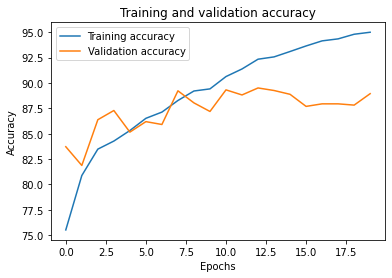

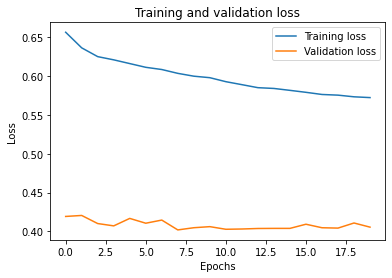

In [42]:
#MEAN INTERPOLATION MODEL 
print('training start')
trn_acc_list = []
val_acc_list = []
trn_loss_list = []
val_loss_list = []

criterion = nn.BCEWithLogitsLoss()
# Train the model
num_epochs = 20
for epoch in range(num_epochs):
    model.train()
    correct = 0
    total = 0
    train_loss = 0.0

    for inputs, inputsCHM, labs in train_loader:
        #print(inputs.shape) #32,4,40,40
        #print(inputs)

        inputs = inputs.to("cuda")
        inputsCHM = inputsCHM.to("cuda")
        labs = torch.Tensor(labs).unsqueeze(1).to("cuda")
        

        # Calculate mean of non-NaN values in each channel
        
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
            #if mask.sum() > 0:
            #    print("Inputs after interpolation:")
            #    print(channel_data)
            # Check for NaNs in inputs
        if torch.isnan(inputs).any():
            raise ValueError("NaNs found in inputs after interpolation")
    
        # Check for NaNs in inputsCHM and labs
        if torch.isnan(inputsCHM).any():
            raise ValueError("NaNs found in inputsCHM")
        if torch.isnan(labs).any():
            raise ValueError("NaNs found in labs")
        
        #inputs = torch.where(torch.isnan(inputs), torch.zeros_like(inputs), inputs)

        optimizer.zero_grad()
        outputs = model(inputsCHM,inputs)
        if torch.isnan(outputs).any():
            print(f"Inputs: {inputs[0][0]}")
            #print(f"InputsCHM: {inputsCHM}")
            print(f"Model outputs: {outputs}")
            raise ValueError("NaNs found in model outputs")

        loss = criterion(outputs, labs.float())
        if torch.isnan(loss).any():
            raise ValueError("NaNs found in loss")

        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)

        optimizer.step()
        train_loss += loss.item() * inputs.size(0)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
        correct += (predicted == labs).sum().item()
    trn_acc_list.append(correct/total * 100)
    trn_loss_list.append(train_loss/len(train_loader.dataset))
    

    if epoch == 19: 
        torch.save(model.state_dict(), 'resnet-multimodal-v2-meanfill.pt')


    # Validate the model
    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    with torch.no_grad():
        
        for inputs, inputsCHM, labs in val_loader:

            inputs= inputs.to("cuda")
            inputsCHM = inputsCHM.to("cuda")
            labs = torch.Tensor(labs).unsqueeze(1).to("cuda")
            #normalized_inputs = normalizer(inputs)

            has_nan = torch.isnan(inputs).any(dim=1)  # Check along batch dimension (assuming dim=0 is batch)
            # Filter inputs to exclude those with NaNs
            has_nan_anywhere = torch.any(torch.any(has_nan, dim=1), dim=1)
    
            inputs = inputs[~has_nan_anywhere]
            inputsCHM = inputsCHM[~has_nan_anywhere]
            labs = labs[~has_nan_anywhere]
            
            outputs = model(inputsCHM, inputs)
            loss = criterion(outputs, labs.float())
            val_loss += loss.item() * inputs.size(0)
            predicted = (outputs > 0.5).float()
            total += labs.size(0)
            correct += (predicted == labs).sum().item()
        val_acc_list.append(correct/total * 100)
        val_loss_list.append(val_loss / len(val_loader.dataset))

    print(f'Epoch {epoch+1}/{num_epochs}, '
          f'Train Loss: {train_loss/len(train_loader.dataset):.4f}, '
          f'Train Acc: {trn_acc_list[-1]:.4f}, '
          #f'Train Acc: {trn_acc_list[-1])*100:.4f}, '
          f'Val Loss: {val_loss/len(val_loader.dataset):.4f}, '
          f'Val Acc: {(correct/total)*100:.2f}' )


# Extract the training and validation accuracy from the model history
train_accuracy = trn_acc_list
val_accuracy = val_acc_list

# Get the number of epochs
epochs = range(len(train_accuracy))

# Create the plot
plt.plot(epochs, train_accuracy, label='Training accuracy')
plt.plot(epochs, val_accuracy, label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.show()

# Extract the training and validation accuracy from the model history
train_losses = trn_loss_list
val_losses = val_loss_list

# Get the number of epochs
epochs = range(len(train_accuracy))

# Create the plot
plt.plot(epochs, train_losses, label='Training loss')
plt.plot(epochs, val_losses, label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

#previously: leak-free resulted in overfitting by epoch 3 with a peak val acc ~80%. 

training start
Epoch 1/40, Train Loss: 0.4396, Train Acc: 70.2748, Val Loss: 0.4406, Val Acc: 71.09
Epoch 2/40, Train Loss: 0.4363, Train Acc: 71.1007, Val Loss: 0.4445, Val Acc: 69.25
Epoch 3/40, Train Loss: 0.4361, Train Acc: 71.4342, Val Loss: 0.4406, Val Acc: 71.44
Epoch 4/40, Train Loss: 0.4357, Train Acc: 71.5454, Val Loss: 0.4439, Val Acc: 69.06
Epoch 5/40, Train Loss: 0.4357, Train Acc: 71.7201, Val Loss: 0.4434, Val Acc: 69.75
Epoch 6/40, Train Loss: 0.4404, Train Acc: 68.7579, Val Loss: 0.4483, Val Acc: 67.77
Epoch 7/40, Train Loss: 0.4365, Train Acc: 70.8148, Val Loss: 0.4457, Val Acc: 69.84
Epoch 8/40, Train Loss: 0.4335, Train Acc: 72.4508, Val Loss: 0.4368, Val Acc: 73.10
Epoch 9/40, Train Loss: 0.4340, Train Acc: 71.8710, Val Loss: 0.4390, Val Acc: 72.38
Epoch 10/40, Train Loss: 0.4327, Train Acc: 72.6731, Val Loss: 0.4428, Val Acc: 71.41
Epoch 11/40, Train Loss: 0.4320, Train Acc: 73.3402, Val Loss: 0.4437, Val Acc: 71.69
Epoch 12/40, Train Loss: 0.4330, Train Acc: 72.7

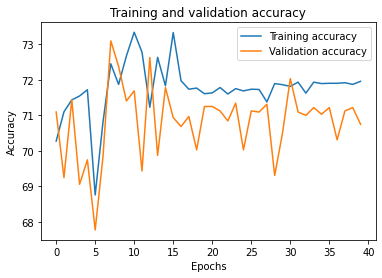

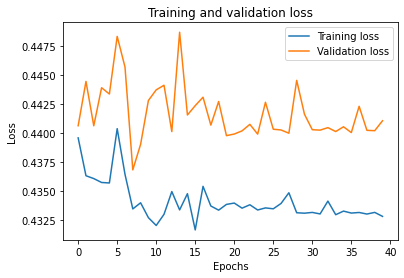

In [18]:
'''
print('training start')
trn_acc_list = []
val_acc_list = []
trn_loss_list = []
val_loss_list = []

criterion = nn.BCEWithLogitsLoss()
# Train the model
num_epochs = 40
for epoch in range(num_epochs):
    model.train()
    correct = 0
    total = 0
    train_loss = 0.0
    for inputs, inputsCHM, labs in train_loader:
        inputs= inputs.to("cuda")
        inputsCHM = inputsCHM.to("cuda")
        labs = torch.Tensor(labs).unsqueeze(1).to("cuda")


        has_nan = torch.isnan(inputs).any(dim=1)  # Check along batch dimension (assuming dim=0 is batch)
        # Filter inputs to exclude those with NaNs
        has_nan_anywhere = torch.any(torch.any(has_nan, dim=1), dim=1)
        inputs = inputs[~has_nan_anywhere]
        inputsCHM = inputsCHM[~has_nan_anywhere]
        labs = labs[~has_nan_anywhere]
        
        #print('inputs details:')
        #print(type(inputs))
        #print(inputs.shape)
        #print(inputs)
        #normalized_inputs = normalizer(inputs)
        #print(normalized_inputs)
        optimizer.zero_grad()
        outputs = model(inputsCHM,inputs)
        loss = criterion(outputs, labs.float())
        #print(loss.item())
        #print(outputs)
        #print(labs.float())
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)

        optimizer.step()
        train_loss += loss.item() * inputs.size(0)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
        correct += (predicted == labs).sum().item()
    trn_acc_list.append(correct/total * 100)
    trn_loss_list.append(train_loss/len(train_loader.dataset))
    

    if epoch == 39: 
        torch.save(model.state_dict(), 'resnet-multimodal-v2-lr.005.pt')


    # Validate the model
    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    with torch.no_grad():
        for inputs, inputsCHM, labs in val_loader:

            inputs= inputs.to("cuda")
            inputsCHM = inputsCHM.to("cuda")
            labs = torch.Tensor(labs).unsqueeze(1).to("cuda")
            #normalized_inputs = normalizer(inputs)

            has_nan = torch.isnan(inputs).any(dim=1)  # Check along batch dimension (assuming dim=0 is batch)
            # Filter inputs to exclude those with NaNs
            has_nan_anywhere = torch.any(torch.any(has_nan, dim=1), dim=1)
    
            inputs = inputs[~has_nan_anywhere]
            inputsCHM = inputsCHM[~has_nan_anywhere]
            labs = labs[~has_nan_anywhere]
            
            outputs = model(inputsCHM, inputs)
            loss = criterion(outputs, labs.float())
            val_loss += loss.item() * inputs.size(0)
            predicted = (outputs > 0.5).float()
            total += labs.size(0)
            correct += (predicted == labs).sum().item()
        val_acc_list.append(correct/total * 100)
        val_loss_list.append(val_loss / len(val_loader.dataset))

    print(f'Epoch {epoch+1}/{num_epochs}, '
          f'Train Loss: {train_loss/len(train_loader.dataset):.4f}, '
          f'Train Acc: {trn_acc_list[-1]:.4f}, '
          #f'Train Acc: {trn_acc_list[-1])*100:.4f}, '
          f'Val Loss: {val_loss/len(val_loader.dataset):.4f}, '
          f'Val Acc: {(correct/total)*100:.2f}' )


# Extract the training and validation accuracy from the model history
train_accuracy = trn_acc_list
val_accuracy = val_acc_list

# Get the number of epochs
epochs = range(len(train_accuracy))

# Create the plot
plt.plot(epochs, train_accuracy, label='Training accuracy')
plt.plot(epochs, val_accuracy, label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.show()

# Extract the training and validation accuracy from the model history
train_losses = trn_loss_list
val_losses = val_loss_list

# Get the number of epochs
epochs = range(len(train_accuracy))

# Create the plot
plt.plot(epochs, train_losses, label='Training loss')
plt.plot(epochs, val_losses, label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

#previously: leak-free resulted in overfitting by epoch 3 with a peak val acc ~80%. 

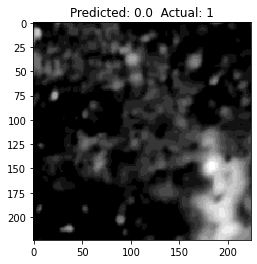

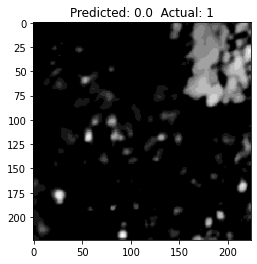

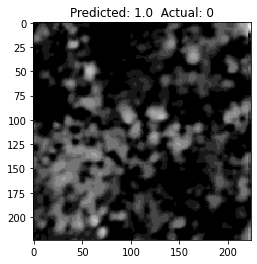

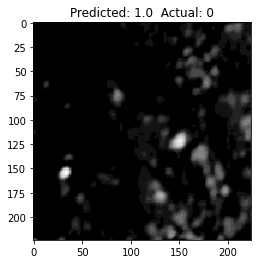

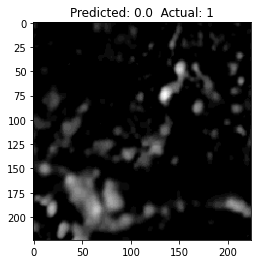

...

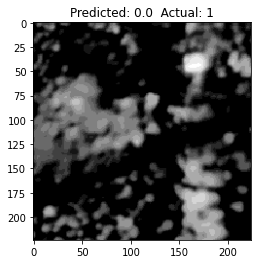

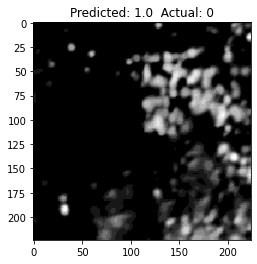

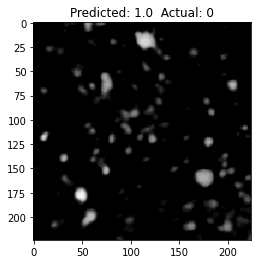

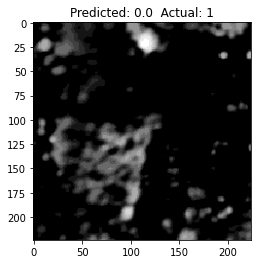

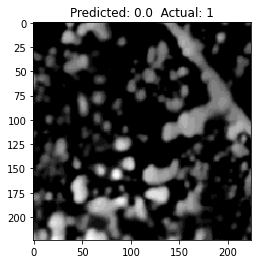

In [43]:
from sklearn.metrics import confusion_matrix

val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []

with torch.no_grad():
    for inputs, inputsCHM, labs in val_loader:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)
        '''
        has_nan = torch.isnan(inputs).any(dim=1) 
        has_nan_anywhere = torch.any(torch.any(has_nan, dim=1), dim=1)
        inputs = inputs[~has_nan_anywhere]
        inputsCHM = inputsCHM[~has_nan_anywhere]
        labs = labs[~has_nan_anywhere]
        '''
        
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputsCHM, inputs)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        correct += (predicted == labs).sum().item()

        # Append predictions and labels for confusion matrix calculation
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
        misclassified_inds = (predicted != labs).nonzero(as_tuple=True)[0]
        for misclassified_ind in misclassified_inds:
            if misclassified_ind % 500 == 0:
                misclassified_image = inputsCHM[misclassified_ind].cpu().squeeze()  # Get misclassified image
                misclassified_image = misclassified_image.numpy()
                
                plt.imshow(misclassified_image,cmap='gray')
                plt.title(f"Predicted: {predicted[misclassified_ind].item()}  Actual: {labs[misclassified_ind].item()}")
                plt.show()  # Display the misclassified image


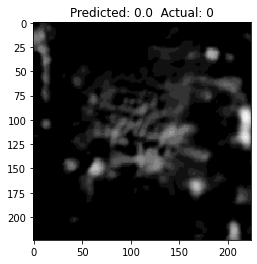

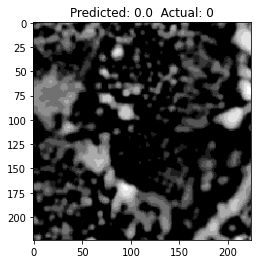

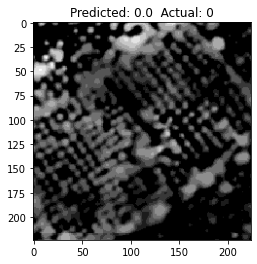

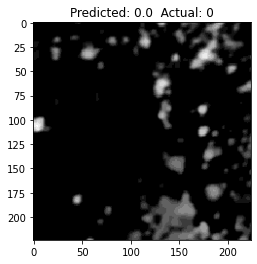

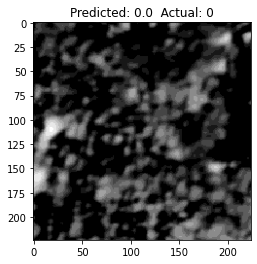

...

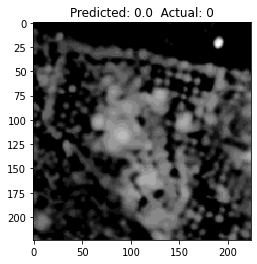

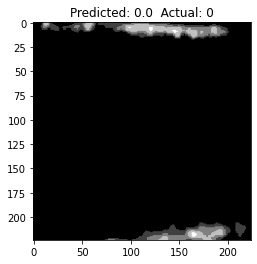

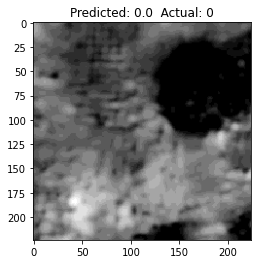

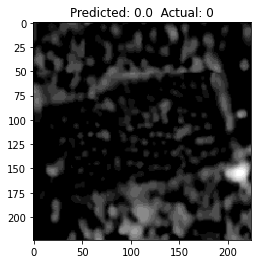

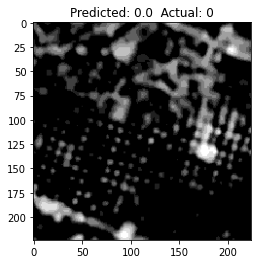

In [20]:
from sklearn.metrics import confusion_matrix

val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []

with torch.no_grad():
    for inputs, inputsCHM, labs in val_loader:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)
        
        has_nan = torch.isnan(inputs).any(dim=1) 
        has_nan_anywhere = torch.any(torch.any(has_nan, dim=1), dim=1)
        inputs = inputs[~has_nan_anywhere]
        inputsCHM = inputsCHM[~has_nan_anywhere]
        labs = labs[~has_nan_anywhere]
        
        outputs = model(inputsCHM, inputs)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        correct += (predicted == labs).sum().item()

        # Append predictions and labels for confusion matrix calculation
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
        misclassified_inds = (predicted == labs).nonzero(as_tuple=True)[0]
        for misclassified_ind in misclassified_inds:
            if misclassified_ind % 2000 == 0:
                misclassified_image = inputsCHM[misclassified_ind].cpu().squeeze()  # Get misclassified image
                misclassified_image = misclassified_image.numpy()
                
                plt.imshow(misclassified_image,cmap='gray')
                plt.title(f"Predicted: {predicted[misclassified_ind].item()}  Actual: {labs[misclassified_ind].item()}")
                plt.show()  # Display the misclassified image


In [44]:
from sklearn.metrics import confusion_matrix
# Calculate confusion matrix
cm = confusion_matrix(all_labels, all_predictions)

# Extract true positives, negatives, false positives, and negatives
tn, fp, fn, tp = cm.ravel()

# Calculate Precision, Recall
precision = tp / (tp + fp)
recall = tp / (tp + fn)

# Print results (you can modify this for your needs)
print(f"Confusion Matrix:\n {cm}")
print(f"True Positives: {tp}")
print(f"False Positives: {fp}")
print(f"True Negatives: {tn}")
print(f"False Negatives: {fn}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print('acc %')
print(correct/total * 100)
print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
print(total-correct, total, correct)
print('val loss')
print(val_loss / len(val_loader.dataset))

Confusion Matrix:
 [[2784  320]
 [ 297 1536]]
True Positives: 1536
False Positives: 320
True Negatives: 2784
False Negatives: 297
Precision: 0.8276
Recall: 0.8380
acc %
87.50253190196476
total INCORRECT total examples in val number of correct examples in val
617 4937 4320
val loss
0.6141558901631496


In [ ]:
Confusion Matrix:
 [[2163    1]
 [ 933   96]]
True Positives: 96
False Positives: 1
True Negatives: 2163
False Negatives: 933
Precision: 0.9897
Recall: 0.0933
acc %
70.74851237081114
total INCORRECT total examples in val number of correct examples in val
934 3193 2259
val loss
0.4410644568652307

In [ ]:
count0 = 0
count1 = 0
with torch.no_grad():
    for inputs, inputsCHM, labs in train_loader:
        has_nan = torch.isnan(inputs).any(dim=1) 
        has_nan_anywhere = torch.any(torch.any(has_nan, dim=1), dim=1)
        inputs = inputs[~has_nan_anywhere]
        inputsCHM = inputsCHM[~has_nan_anywhere]
        labs = labs[~has_nan_anywhere]
        print(labs)
        count1 += torch.count_nonzero(labs)
        


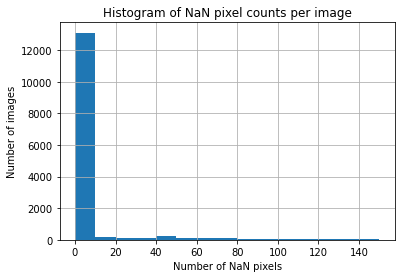

In [22]:
nan_counts_per_image = []

# Iterate through the batches
with torch.no_grad():
    for inputs, inputsCHM, labs in train_loader:
        has_nan = torch.isnan(inputs).any(dim=1)
        nan_counts = torch.sum(has_nan.view(inputs.size(0), -1), dim=1)  # Counts NaN values per image
        nan_counts_per_image.extend(nan_counts.cpu().tolist())

# Plotting histogram of NaN counts per image
plt.hist(nan_counts_per_image, bins=range(0, 160, 10))  # Adjust bins as per your data distribution
plt.xlabel('Number of NaN pixels')
plt.ylabel('Number of images')
plt.title('Histogram of NaN pixel counts per image')
plt.grid(True)
plt.show()

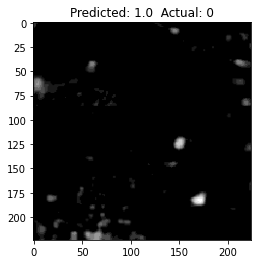

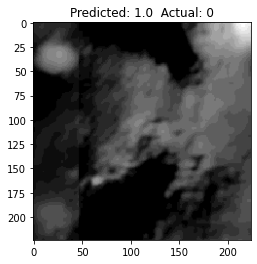

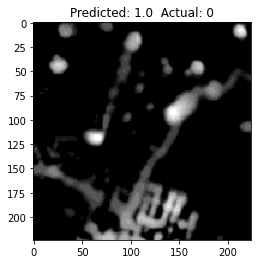

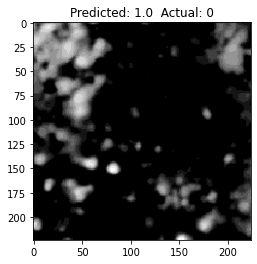

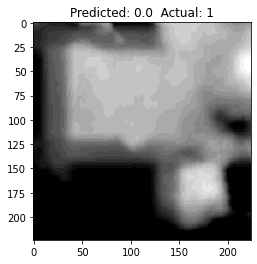

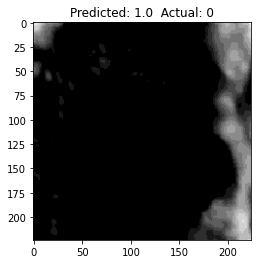

Confusion Matrix:
 [[1247  102]
 [   6  363]]
True Positives: 363
False Positives: 102
True Negatives: 1247
False Negatives: 6
Precision: 0.7806
Recall: 0.9837
acc %
93.71362048894063
total INCORRECT total examples in val number of correct examples in val
108 1718 1610
val loss
0.6057327209607415


In [15]:
from sklearn.metrics import confusion_matrix

model2 = MultiResNet()
#model2.to(device)
model2.load_state_dict(torch.load('resnet-multimodal.pt',map_location=torch.device('cpu')))
model2.eval()
val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []

import matplotlib.pyplot as plt  # Import for image display

with torch.no_grad():
    for inputs, inputsCHM, labs in val_loader:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)
        
        has_nan = torch.isnan(inputs).any(dim=1) 
        has_nan_anywhere = torch.any(torch.any(has_nan, dim=1), dim=1)
        inputs = inputs[~has_nan_anywhere]
        inputsCHM = inputsCHM[~has_nan_anywhere]
        labs = labs[~has_nan_anywhere]
        
        outputs = model2(inputsCHM, inputs)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        correct += (predicted == labs).sum().item()

        # Append predictions and labels for confusion matrix calculation
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
        misclassified_inds = (predicted != labs).nonzero(as_tuple=True)[0]
        for misclassified_ind in misclassified_inds:
            if misclassified_ind % 500 == 0:
                misclassified_image = inputsCHM[misclassified_ind].cpu().squeeze()  # Get misclassified image
                misclassified_image = misclassified_image.numpy()
                
                plt.imshow(misclassified_image,cmap='gray')
                plt.title(f"Predicted: {predicted[misclassified_ind].item()}  Actual: {labs[misclassified_ind].item()}")
                plt.show()  # Display the misclassified image


# Calculate confusion matrix
cm = confusion_matrix(all_labels, all_predictions)

# Extract true positives, negatives, false positives, and negatives
tn, fp, fn, tp = cm.ravel()

# Calculate Precision, Recall
precision = tp / (tp + fp)
recall = tp / (tp + fn)

# Print results (you can modify this for your needs)
print(f"Confusion Matrix:\n {cm}")
print(f"True Positives: {tp}")
print(f"False Positives: {fp}")
print(f"True Negatives: {tn}")
print(f"False Negatives: {fn}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print('acc %')
print(correct/total * 100)
print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
print(total-correct, total, correct)
print('val loss')
print(val_loss / len(val_loader.dataset))

In [112]:
print(len(images))

print(len(images2))

2568
2022


In [55]:
import torch.nn.init as init

class S2ResNet(nn.Module):
    def __init__(self):
        super(S2ResNet, self).__init__()
                
        self.resnet_24band = models.resnet18(pretrained=True)
        self.resnet_24band.conv1 = nn.Conv2d(4, 64, kernel_size=7, stride=2, padding=3, bias=False)
        
        num_features24 = self.resnet_24band.fc.in_features
        
        self.fc = nn.Linear(num_features24, 1)  # Adjust the output size as needed
        self.sigmoid = nn.Sigmoid()  # Sigmoid activation function for binary classification

        #self._initialize_weights()


    def _initialize_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
            elif isinstance(m, nn.BatchNorm2d):
                init.constant_(m.weight, 1)
                init.constant_(m.bias, 0)
            elif isinstance(m, nn.Linear):
                init.normal_(m.weight, 0, 0.01)
                init.constant_(m.bias, 0)
        
    def forward(self, x_24band):
        

        #print('before forward pass: ')
        #print(x_24band)
        # Forward pass through the 24-band ResNet
        x_24band = self.resnet_24band.conv1(x_24band)
        #print('after conv1 forward pass: ')
        #print(x_24band[0])
        x_24band = self.resnet_24band.bn1(x_24band)
        #print('after bn')
        #print(x_24band[0])
        x_24band = self.resnet_24band.relu(x_24band)
        #print('after relu')
        #print(x_24band[0])
        x_24band = self.resnet_24band.maxpool(x_24band)
        #print('x_24 after maxpool')
        #print(x_24band[0])
        x_24band = self.resnet_24band.layer1(x_24band)
        x_24band = self.resnet_24band.layer2(x_24band)
        x_24band = self.resnet_24band.layer3(x_24band)
        x_24band = self.resnet_24band.layer4(x_24band)
        #print('x_24 after layers')
        #print(x_24band[0])
        x_24band = self.resnet_24band.avgpool(x_24band)
        x_24band = torch.flatten(x_24band, 1)
        #print('sentinel2 at flatten')
        #print(x_24band[0])
        

        x_24band = self.fc(x_24band)
        x = self.sigmoid(x_24band)
        #print('x after clf head: ')
        #print(x)
        #print('after forward pass: ')
        #print(model.parameters())        
        return x

# Example usage
model = S2ResNet()
model.to(device)
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)



/home/angelats11/.local/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/angelats11/.local/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [58]:
print('training start')
trn_acc_list = []
val_acc_list = []
trn_loss_list = []
val_loss_list = []
all_labels = []
all_predictions = []

model = S2ResNet()
model.to(device)
model.load_state_dict((torch.load('resnet-s2-v2.pt')))
model.eval()
criterion = nn.BCEWithLogitsLoss()
'''
# Train the model
num_epochs = 20
for epoch in range(num_epochs):
    model.train()
    correct = 0
    total = 0
    train_loss = 0.0
    for inputs, _, labs in full_trn_loader:
        inputs= inputs.to("cuda")
        labs = torch.Tensor(labs).unsqueeze(1).to("cuda")

        has_nan = torch.isnan(inputs).any(dim=1)  # Check along batch dimension (assuming dim=0 is batch)
        # Filter inputs to exclude those with NaNs
        has_nan_anywhere = torch.any(torch.any(has_nan, dim=1), dim=1)

        inputs = inputs[~has_nan_anywhere]
        labs = labs[~has_nan_anywhere]
        
        #print('inputs details:')
        #print(type(inputs))
        #print(inputs.shape)
        #print(inputs)
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labs.float())
        #print(loss.item())
        #print(outputs)
        #print(labs.float())
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)

        optimizer.step()
        train_loss += loss.item() * inputs.size(0)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
        correct += (predicted == labs).sum().item()
    trn_acc_list.append(correct/total * 100)
    trn_loss_list.append(train_loss/len(full_trn_loader.dataset))
    

    if epoch % 9 == 0: 
        torch.save(model.state_dict(), 'resnet-s2-v2.pt')


    # Validate the model
    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    with torch.no_grad():
        for inputs, _, labs in full_val_loader:

            inputs= inputs.to("cuda")
            labs = torch.Tensor(labs).unsqueeze(1).to("cuda")
            
            has_nan = torch.isnan(inputs).any(dim=1)  # Check along batch dimension (assuming dim=0 is batch)
            # Filter inputs to exclude those with NaNs
            has_nan_anywhere = torch.any(torch.any(has_nan, dim=1), dim=1)
    
            inputs = inputs[~has_nan_anywhere]
            labs = labs[~has_nan_anywhere]
            
            outputs = model(inputs)
            loss = criterion(outputs, labs.float())
            val_loss += loss.item() * inputs.size(0)
            predicted = (outputs > 0.5).float()
            total += labs.size(0)
            correct += (predicted == labs).sum().item()
            all_predictions.extend(predicted.cpu().numpy())
            all_labels.extend(labs.cpu().numpy())
        val_acc_list.append(correct/total * 100)
        val_loss_list.append(val_loss / len(full_val_loader.dataset))

    print(f'Epoch {epoch+1}/{num_epochs}, '
          f'Train Loss: {train_loss/len(full_trn_loader.dataset):.4f}, '
          f'Train Acc: {trn_acc_list[-1]:.4f}, '
          #f'Train Acc: {trn_acc_list[-1])*100:.4f}, '
          f'Val Loss: {val_loss/len(full_val_loader.dataset):.4f}, '
          f'Val Acc: {(correct/total)*100:.2f}' )

    #previously: leak-free resulted in overfitting by epoch 3 with a peak val acc ~80%. 
    
plot_res(trn_acc_list,val_acc_list,trn_loss_list,val_loss_list,all_labels,all_predictions)
    
'''


val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
priored = 0
with torch.no_grad():
    for inputs, inputsCHM, labs,paths in val_loadere:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)
        
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputs)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)
        
        #p1 = torch.count_nonzero((outputs > 0.5))
        pred1 = (outputs > 0.5).float()
        p1 = (pred1 == labs).sum().item()
        

        outputs = outputs * (p_for_e / p_for_src) / ( outputs * (p_for_e / p_for_src) + 
                                                     (1 - outputs) * (p_orch_e / p_orch_src) )
        #p2 = torch.count_nonzero((outputs > 0.5))
        #priored += abs(p1-p2)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        p2 = (predicted == labs).sum().item()
        correct += (predicted == labs).sum().item()
        priored += p1-p2    
        
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    print('acc %')
    print(correct/total * 100)
    print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
    print(total-correct, total, correct)
    print('val loss')
    print(val_loss / len(val_loadere.dataset))
    print_cm(all_predictions,all_labels)
    print('priored east', priored)

priored = 0
val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
with torch.no_grad():
    for inputs, inputsCHM, labs,paths in val_loaderc:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)

        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputs)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)
        
        #p1 = torch.count_nonzero((outputs > 0.5))
        pred1 = (outputs > 0.5).float()
        p1 = (pred1 == labs).sum().item()
        

        outputs = outputs * (p_for_c / p_for_src) / ( outputs * (p_for_c / p_for_src) + 
                                                     (1 - outputs) * (p_orch_c / p_orch_src) )
        #p2 = torch.count_nonzero((outputs > 0.5))
        #priored += abs(p1-p2)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        p2 = (predicted == labs).sum().item()
        correct += (predicted == labs).sum().item()
        priored += p1-p2    
        
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    print('acc %')
    print(correct/total * 100)
    print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
    print(total-correct, total, correct)
    print('val loss')
    print(val_loss / len(val_loaderc.dataset))
    print_cm(all_predictions,all_labels)
    print('priored central', priored)



priored = 0
val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
with torch.no_grad():
    for inputs, inputsCHM, labs,paths in val_loaderw:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)

        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputs)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)
        
        #p1 = torch.count_nonzero((outputs > 0.5))
        pred1 = (outputs > 0.5).float()
        p1 = (pred1 == labs).sum().item()
        

        outputs = outputs * (p_for_w / p_for_src) / ( outputs * (p_for_w / p_for_src) + 
                                                     (1 - outputs) * (p_orch_w / p_orch_src) )
        #p2 = torch.count_nonzero((outputs > 0.5))
        #priored += abs(p1-p2)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        p2 = (predicted == labs).sum().item()
        correct += (predicted == labs).sum().item()
        priored += p1-p2    
        
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    print('acc %')
    print(correct/total * 100)
    print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
    print(total-correct, total, correct)
    print('val loss')
    print(val_loss / len(val_loaderw.dataset))
    print_cm(all_predictions,all_labels)
    print('priored west', priored)


val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
with torch.no_grad():
    for inputs, inputsCHM, labs,paths in val_nosdpt_loader:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)
        '''
        has_nan = torch.isnan(inputs).any(dim=1) 
        has_nan_anywhere = torch.any(torch.any(has_nan, dim=1), dim=1)
        inputs = inputs[~has_nan_anywhere]
        inputsCHM = inputsCHM[~has_nan_anywhere]
        labs = labs[~has_nan_anywhere]
        '''
        
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputs)
        loss = criterion(outputs, labs.float())
        val_loss += loss.item() * inputs.size(0)
        predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        correct += (predicted == labs).sum().item()
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    print('acc %')
    print(correct/total * 100)
    print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
    print(total-correct, total, correct)
    print('val loss')
    print(val_loss / len(val_nosdpt_loader.dataset))
    print_cm(all_predictions,all_labels)


training start
acc %
74.91694352159467
total INCORRECT total examples in val number of correct examples in val
151 602 451
val loss
0.558721457505939
Confusion Matrix:
 [[127  79]
 [ 72 324]]
True Positives: 324
False Positives: 79
True Negatives: 127
False Negatives: 72
Precision: 0.8040
Recall: 0.8182
priored east 2
acc %
79.1095890410959
total INCORRECT total examples in val number of correct examples in val
61 292 231
val loss
0.5463870727036098
Confusion Matrix:
 [[ 47  16]
 [ 45 184]]
True Positives: 184
False Positives: 16
True Negatives: 47
False Negatives: 45
Precision: 0.9200
Recall: 0.8035
priored central 0
acc %
54.02670111972437
total INCORRECT total examples in val number of correct examples in val
2135 4644 2509
val loss
0.8074141285934908
Confusion Matrix:
 [[ 762  194]
 [1941 1747]]
True Positives: 1747
False Positives: 194
True Negatives: 762
False Negatives: 1941
Precision: 0.9001
Recall: 0.4737
priored west -1
acc %
75.24916943521595
total INCORRECT total examples i

In [59]:
###########################################
#RESNETCHM ONLY
###########################################
class CustomResNet(nn.Module):
    def __init__(self):
        super(CustomResNet, self).__init__()
        self.resnet = models.resnet18(pretrained=True)
        # Modify the first convolution layer to accept single-channel input
        self.resnet.conv1 = nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3, bias=False)
        # If you're using a different model, adjust the input layer accordingly

    def forward(self, x):
        return self.resnet(x)


# Create an instance of the custom ResNet model
model = CustomResNet()
model.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)

print('training start')
trn_acc_list = []
val_acc_list = []
trn_loss_list = []
val_loss_list = []
all_predictions = []
all_labels = []

# Train the model
num_epochs = 20
for epoch in range(num_epochs):
    model.train()
    correct = 0
    total = 0
    train_loss = 0.0
    for _, inputs,labs, paths in full_trn_loader:
        inputs= inputs.to("cuda")
        labs = torch.Tensor(labs).to("cuda")
        
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labs)
        loss.backward()
        optimizer.step()
        train_loss += loss.item() * inputs.size(0)
        _, predicted = torch.max(outputs, 1)
        total += labs.size(0)
        correct += (predicted == labs).sum().item()
    trn_acc_list.append(correct/total * 100)
    trn_loss_list.append(train_loss/len(full_trn_loader.dataset))

    # Validate the model
    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    with torch.no_grad():
        for _,inputs, labs, paths in full_val_loader:
            inputs= inputs.to("cuda")
            labs = torch.Tensor(labs).to("cuda")
        
            outputs = model(inputs)
            loss = criterion(outputs, labs)
            val_loss += loss.item() * inputs.size(0)
            _, predicted = torch.max(outputs, 1)
            total += labs.size(0)
            correct += (predicted == labs).sum().item()
            all_predictions.extend(predicted.cpu().numpy())
            all_labels.extend(labs.cpu().numpy())

        val_acc_list.append(correct/total * 100)
        val_loss_list.append(val_loss / len(full_val_loader.dataset))

    print(f'Epoch {epoch+1}/{num_epochs}, '
          f'Train Loss: {train_loss/len(full_trn_loader.dataset):.4f}, '
          f'Train Acc: {trn_acc_list[-1]:.4f}, '
          #f'Train Acc: {trn_acc_list[-1])*100:.4f}, '
          f'Val Loss: {val_loss/len(full_val_loader.dataset):.4f}, '
          f'Val Acc: {(correct/total)*100:.2f}' )

#plot_res(trn_acc_list,val_acc_list,trn_loss_list,val_loss_list,all_labels,all_predictions)

val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
with torch.no_grad():
    for inputs, inputsCHM, labs, paths in val_loadere:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).to(device)

        outputs = model(inputsCHM)
        loss = criterion(outputs, labs)
        val_loss += loss.item() * inputs.size(0)
        #predicted = (outputs > 0.5).float()
        _, predicted = torch.max(outputs, 1)
        total += labs.size(0)
#        print(predicted)
        correct += (predicted == labs).sum().item()
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    print('acc %')
    print(correct/total * 100)
    print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
    print(total-correct, total, correct)
    print('val loss')
    print(val_loss / len(val_loadere.dataset))
    print_cm(all_predictions,all_labels)


val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
with torch.no_grad():
    for inputs, inputsCHM, labs,paths in val_loaderc:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).to(device)

        
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputsCHM)
        loss = criterion(outputs, labs)
        val_loss += loss.item() * inputs.size(0)
        _, predicted = torch.max(outputs, 1)#predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        correct += (predicted == labs).sum().item()
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    print('acc %')
    print(correct/total * 100)
    print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
    print(total-correct, total, correct)
    print('val loss')
    print(val_loss / len(val_loaderc.dataset))
    print_cm(all_predictions,all_labels)



val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
with torch.no_grad():
    for inputs, inputsCHM, labs,paths in val_loaderw:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).to(device)
        '''
        has_nan = torch.isnan(inputs).any(dim=1) 
        has_nan_anywhere = torch.any(torch.any(has_nan, dim=1), dim=1)
        inputs = inputs[~has_nan_anywhere]
        inputsCHM = inputsCHM[~has_nan_anywhere]
        labs = labs[~has_nan_anywhere]
        '''
        
        for c in range(inputs.size(1)):  # Assuming the channel dimension is 1
            channel_data = inputs[:, c, :, :]
            mask = torch.isnan(channel_data)
            #if mask.sum() > 0:
            #    print("Inputs before interpolation:")
            #    print(channel_data)            
            mean_val = torch.nanmean(channel_data, dim=0, keepdim=True)
            
            channel_data[mask] = mean_val.expand_as(channel_data)[mask]
            inputs[:, c, :, :] = channel_data
        
        outputs = model(inputsCHM)
        loss = criterion(outputs, labs)
        val_loss += loss.item() * inputs.size(0)
        _, predicted = torch.max(outputs, 1) #       predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        correct += (predicted == labs).sum().item()
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    print('acc %')
    print(correct/total * 100)
    print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
    print(total-correct, total, correct)
    print('val loss')
    print(val_loss / len(val_loaderw.dataset))
    print_cm(all_predictions,all_labels)



val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
with torch.no_grad():
    for inputs, inputsCHM, labs,paths in val_nosdpt_loader:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).unsqueeze(1).to(device)
        
        outputs = model(inputsCHM)
        loss = criterion(outputs, labs)
        val_loss += loss.item() * inputs.size(0)
        _, predicted = torch.max(outputs, 1) #predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        correct += (predicted == labs).sum().item()
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    print('acc %')
    print(correct/total * 100)
    print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
    print(total-correct, total, correct)
    print('val loss')
    print(val_loss / len(val_nosdpt_loader.dataset))
    print_cm(all_predictions,all_labels)

/home/angelats11/.local/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/angelats11/.local/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


training start


ValueError: too many values to unpack (expected 3)

In [18]:

val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
with torch.no_grad():
    for inputs, inputsCHM, labs in val_nosdpt_loader:
    
        inputs= inputs.to(device)
        inputsCHM = inputsCHM.to(device)
        labs = torch.Tensor(labs).to(device)
        
        outputs = model(inputsCHM)
        loss = criterion(outputs, labs)
        val_loss += loss.item() * inputs.size(0)
        _, predicted = torch.max(outputs, 1) #predicted = (outputs > 0.5).float()
        total += labs.size(0)
#        print(predicted)
        correct += (predicted == labs).sum().item()
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labs.cpu().numpy())
    print('acc %')
    print(correct/total * 100)
    print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
    print(total-correct, total, correct)
    print('val loss')
    print(val_loss / len(val_nosdpt_loader.dataset))
    print_cm(all_predictions,all_labels)

acc %
86.57718120805369
total INCORRECT total examples in val number of correct examples in val
120 894 774
val loss
0.6696782780173641
Confusion Matrix:
 [[213  42]
 [ 78 561]]
True Positives: 561
False Positives: 42
True Negatives: 213
False Negatives: 78
Precision: 0.9303
Recall: 0.8779


In [40]:
class SimpleCNN(nn.Module):
    def __init__(self):
        super(SimpleCNN, self).__init__()
        self.conv1 = nn.Conv2d(1, 32, kernel_size=3, stride=1, padding=1)  # Input channel = 1, Output channels = 32
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)  # Downsample
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1)  # Output channels = 64
        self.fc1 = nn.Linear(64 * 56 * 56, 128)  # Flatten and connect to fully-connected layer
        self.fc2 = nn.Linear(128, 1)  # Output layer with 1 neuron for binary classification

    def forward(self, x):
        x = self.pool(torch.relu(self.conv1(x)))  # Apply ReLU activation and pooling
        x = self.pool(torch.relu(self.conv2(x)))  # Apply ReLU activation and pooling again
        x = torch.flatten(x, 1)  # Flatten
        x = torch.relu(self.fc1(x))  # Apply ReLU activation
        x = torch.sigmoid(self.fc2(x))  # Apply sigmoid activation for binary output
        return x

# Create an instance of the CNN
model = SimpleCNN()
model.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)


print('training start')
trn_acc_list = []
val_acc_list = []
trn_loss_list = []
val_loss_list = []

# Train the model
num_epochs = 20
for epoch in range(num_epochs):
    model.train()
    correct = 0
    total = 0
    train_loss = 0.0
    for _,inputs, labs in full_trn_loader:
        inputs= inputs.to("cuda")
        labs = torch.Tensor(labs).to("cuda")
        
#        print('inputs type')
#        print(inputs.dtype)
        #inputs.byte()
#        print(inputs.dtype)
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labs)
        loss.backward()
        optimizer.step()
        train_loss += loss.item() * inputs.size(0)
        _, predicted = torch.max(outputs, 1)
        total += labs.size(0)
        correct += (predicted == labs).sum().item()
    trn_acc_list.append(correct/total * 100)
    trn_loss_list.append(train_loss/len(full_trn_loader.dataset))

    if epoch % 9 == 0: 
        torch.save(model.state_dict(), 'cnn-FULL-chmonly.pt')


    # Validate the model
    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    with torch.no_grad():
        for _,inputs, labs in full_val_loader:
            inputs= inputs.to("cuda")
            labs = torch.Tensor(labs).to("cuda")
        
            outputs = model(inputs)
            loss = criterion(outputs, labs)
            val_loss += loss.item() * inputs.size(0)
            _, predicted = torch.max(outputs, 1)
            total += labs.size(0)
            correct += (predicted == labs).sum().item()
            all_predictions.extend(predicted.cpu().numpy())
            all_labels.extend(labs.cpu().numpy())           
        val_acc_list.append(correct/total * 100)
        val_loss_list.append(val_loss / len(full_val_loader.dataset))

    print(f'Epoch {epoch+1}/{num_epochs}, '
          f'Train Loss: {train_loss/len(full_trn_loader.dataset):.4f}, '
          f'Train Acc: {trn_acc_list[-1]:.4f}, '
          #f'Train Acc: {trn_acc_list[-1])*100:.4f}, '
          f'Val Loss: {val_loss/len(full_val_loader.dataset):.4f}, '
          f'Val Acc: {(correct/total)*100:.2f}' )


plot_res(trn_acc_list,val_acc_list,trn_loss_list,val_loss_list,all_labels,all_predictions)


training start


../aten/src/ATen/native/cuda/Loss.cu:250: nll_loss_forward_reduce_cuda_kernel_2d: block: [0,0,0], thread: [1,0,0] Assertion `t >= 0 && t < n_classes` failed.
../aten/src/ATen/native/cuda/Loss.cu:250: nll_loss_forward_reduce_cuda_kernel_2d: block: [0,0,0], thread: [6,0,0] Assertion `t >= 0 && t < n_classes` failed.
../aten/src/ATen/native/cuda/Loss.cu:250: nll_loss_forward_reduce_cuda_kernel_2d: block: [0,0,0], thread: [7,0,0] Assertion `t >= 0 && t < n_classes` failed.
../aten/src/ATen/native/cuda/Loss.cu:250: nll_loss_forward_reduce_cuda_kernel_2d: block: [0,0,0], thread: [8,0,0] Assertion `t >= 0 && t < n_classes` failed.
../aten/src/ATen/native/cuda/Loss.cu:250: nll_loss_forward_reduce_cuda_kernel_2d: block: [0,0,0], thread: [11,0,0] Assertion `t >= 0 && t < n_classes` failed.
../aten/src/ATen/native/cuda/Loss.cu:250: nll_loss_forward_reduce_cuda_kernel_2d: block: [0,0,0], thread: [13,0,0] Assertion `t >= 0 && t < n_classes` failed.
../aten/src/ATen/native/cuda/Loss.cu:250: nll_loss

RuntimeError: CUDA error: device-side assert triggered
CUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1.
Compile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.


In [46]:
from functools import partial
import timm.models.vision_transformer
from pos_embed import get_2d_sincos_pos_embed


class VisionTransformer(timm.models.vision_transformer.VisionTransformer):
    """ Vision Transformer with support for global average pooling
    """
    def __init__(self, global_pool=False, **kwargs):
        super(VisionTransformer, self).__init__(**kwargs)

        # Added by Samar, need default pos embedding
        pos_embed = get_2d_sincos_pos_embed(self.pos_embed.shape[-1], int(self.patch_embed.num_patches ** .5),
                                            cls_token=True)
        self.pos_embed.data.copy_(torch.from_numpy(pos_embed).float().unsqueeze(0))

        self.global_pool = global_pool
        if self.global_pool:
            norm_layer = kwargs['norm_layer']
            embed_dim = kwargs['embed_dim']
            self.fc_norm = norm_layer(embed_dim)

            del self.norm  # remove the original norm

    def forward_features(self, x):
        B = x.shape[0]
        x = self.patch_embed(x)

        cls_tokens = self.cls_token.expand(B, -1, -1)  # stole cls_tokens impl from Phil Wang, thanks
        x = torch.cat((cls_tokens, x), dim=1)
        x = x + self.pos_embed
        x = self.pos_drop(x)

        for blk in self.blocks:
            x = blk(x)

        if self.global_pool:
            x = x[:, 1:, :].mean(dim=1)  # global pool without cls token
            outcome = self.fc_norm(x)
        else:
            x = self.norm(x)
            outcome = x[:, 0]

        return outcome


def vit_base_patch16(**kwargs):
    model = VisionTransformer(
        embed_dim=768, depth=12, num_heads=12, mlp_ratio=4, qkv_bias=True,
        norm_layer=partial(nn.LayerNorm, eps=1e-6), **kwargs)
    return model


def vit_large_patch16(**kwargs):
    model = VisionTransformer(
        embed_dim=1024, depth=24, num_heads=16, mlp_ratio=4, qkv_bias=True,
        norm_layer=partial(nn.LayerNorm, eps=1e-6), **kwargs)
    return model


def vit_huge_patch14(**kwargs):
    model = VisionTransformer(
        embed_dim=1280, depth=32, num_heads=16, mlp_ratio=4, qkv_bias=True,
        norm_layer=partial(nn.LayerNorm, eps=1e-6), **kwargs)
    return model

In [ ]:
device = torch.device('cuda')

model = VisionTransformer()
model.to(device)
model.load_state_dict(torch.load('pretrain-vit-base-e199.pth'), strict=False)
#model.load_pretrained('pretrain-vit-base-e199.pth')
#model = create_model('vit_base_patch16', pretrained=True)


criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

trn_acc_list = []
val_acc_list = []
trn_loss_list = []
val_loss_list = []

def triplicate_channel(data):
  """
  Triplicates the channel dimension of a PyTorch tensor batch.

  Args:
    batch: A dictionary or tuple containing the data loaded by a DataLoader.
      Usually, the key 'data' holds the actual tensor batch.

  Returns:
    A dictionary or tuple with the same structure as the input, but with the 
    data tensor having its channel dimension triplicated.
  """
  # Assuming the data is in the key 'data' within the batch
  #data = batch['data']
  if len(data.shape) == 3:
    # Add a new dimension of size 1 for the missing channel
    data = data.unsqueeze(1)
    # Repeat the channel 3 times
    repeated_channel = data.repeat(1, 3, 1, 1)
  elif len(data.shape) == 4 and data.shape[1] == 1:
    # Existing single channel, repeat it 3 times
    repeated_channel = data.repeat(1, 3, 1, 1)
  else:
    # Already has 3 or more channels, no change needed
    repeated_channel = data
  #return {key: value for key, value in batch.items() if key != 'data'} | {'data': repeated_channel}
  return repeated_channel


# Train the model
num_epochs = 20
all_predictions = []
all_labels = []
for epoch in range(num_epochs):
    model.train()
    correct = 0
    total = 0
    train_loss = 0.0
    for _, inputs,labels in train_loader:
        inputs = triplicate_channel(inputs).to(device)
        labels = torch.Tensor(labels).to(device)
        
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        train_loss += loss.item() * inputs.size(0)
        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
    trn_acc_list.append(correct/total * 100)
    trn_loss_list.append(train_loss/len(train_loader.dataset))

    
    if epoch % 9 == 0: 
        torch.save(model.state_dict(), 'vit-multimodal-v2.pt')


    # Validate the model
    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    with torch.no_grad():
        for _, inputs, labels in val_loader:
            inputs = triplicate_channel(inputs).to(device)
            labels = torch.Tensor(labels).to(device)
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            val_loss += loss.item() * inputs.size(0)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            all_predictions.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
        val_acc_list.append(correct/total * 100)
        val_loss_list.append(val_loss / len(val_loader.dataset))

    print(f'Epoch {epoch+1}/{num_epochs}, '
          f'Train Loss: {train_loss/len(train_loader.dataset):.4f}, '
          f'Val Loss: {val_loss/len(val_loader.dataset):.4f}, '
          f'Val Acc: {(correct/total)*100:.2f}%')

#history = model.history()


import matplotlib.pyplot as plt

# Extract the training and validation accuracy from the model history
train_accuracy = trn_acc_list
val_accuracy = val_acc_list

# Get the number of epochs
epochs = range(len(train_accuracy))

# Create the plot
plt.plot(epochs, train_accuracy, label='Training accuracy')
plt.plot(epochs, val_accuracy, label='Validation accuracy')
plt.title('SatMAE Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.show()

# Extract the training and validation accuracy from the model history
train_losses = trn_loss_list
val_losses = val_loss_list

# Get the number of epochs
epochs = range(len(train_accuracy))

# Create the plot
plt.plot(epochs, train_losses, label='Training loss')
plt.plot(epochs, val_losses, label='Validation loss')
plt.title('SatMAE Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()


# Calculate confusion matrix
cm = confusion_matrix(all_labels, all_predictions)

# Extract true positives, negatives, false positives, and negatives
tn, fp, fn, tp = cm.ravel()

# Calculate Precision, Recall
precision = tp / (tp + fp)
recall = tp / (tp + fn)

# Print results (you can modify this for your needs)
print(f"Confusion Matrix:\n {cm}")
print(f"True Positives: {tp}")
print(f"False Positives: {fp}")
print(f"True Negatives: {tn}")
print(f"False Negatives: {fn}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print('acc %')
print(correct/total * 100)
print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
print(total-correct, total, correct)
print('val loss')
print(val_loss / len(val_loader.dataset))

Epoch 1/20, Train Loss: 0.7185, Val Loss: 0.7229, Val Acc: 37.69%
Epoch 2/20, Train Loss: 0.6835, Val Loss: 0.6701, Val Acc: 61.41%
Epoch 3/20, Train Loss: 0.6678, Val Loss: 0.6519, Val Acc: 63.97%
Epoch 4/20, Train Loss: 0.6588, Val Loss: 0.6514, Val Acc: 64.43%
Epoch 5/20, Train Loss: 0.6520, Val Loss: 0.6573, Val Acc: 62.87%
Epoch 6/20, Train Loss: 0.6500, Val Loss: 0.6418, Val Acc: 65.16%


In [12]:
print(len(images))
print(len(images2))

8209
4402


In [13]:

print(trn_acc_list)
print(val_acc_list)
print(trn_loss_list)
print(val_loss_list)

[80.0039651070579, 80.91593973037273, 81.65344964314036, 82.54758128469469, 83.49524187153054, 84.55987311657415, 86.02894528152261, 88.12053925455987, 90.43021411578113, 92.753766851705, 94.01665344964314, 95.21015067406819, 95.39056304520223, 96.5107057890563, 96.80610626486916, 95.92188739095955, 97.48810467882633, 97.5832672482157, 97.67644726407613, 97.78350515463917]
[73.880301228696, 75.18826793499802, 79.74633372968688, 80.02378121284185, 79.90487514863258, 80.42013476020611, 78.16091954022988, 77.60602457391994, 80.49940546967895, 80.93539437177962, 77.72493063812921, 79.23107411811336, 81.45065398335315, 81.0543004359889, 77.09076496234641, 81.45065398335315, 79.98414585810542, 79.23107411811336, 81.64883075703527, 80.42013476020611]
[0.4141066891441829, 0.3968534010256405, 0.38294556673134633, 0.3706312950975265, 0.35370013413922735, 0.3327956120047089, 0.3063672176057814, 0.2670450063190415, 0.2200828414578744, 0.17205400632356105, 0.14277900928819018, 0.11473462218972637, 

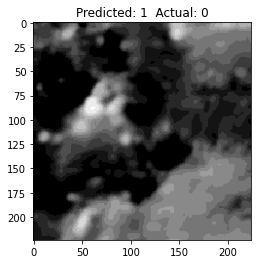

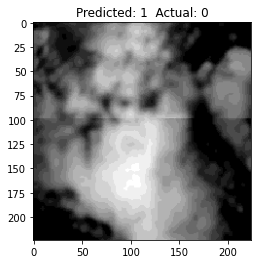

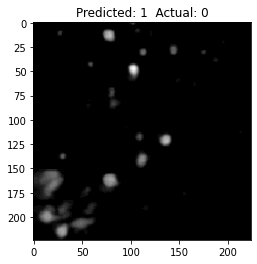

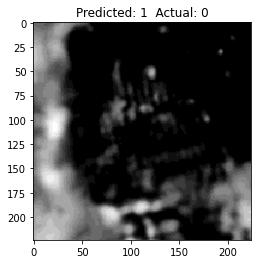

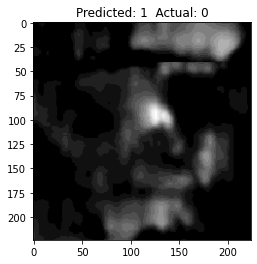

...

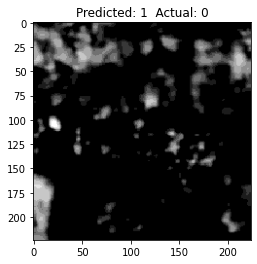

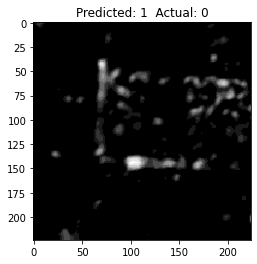

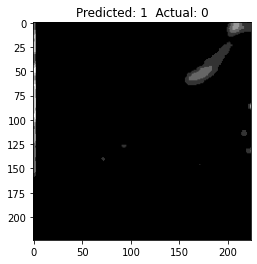

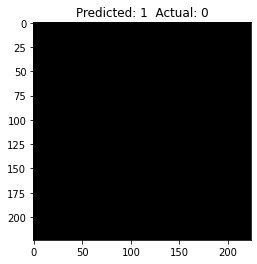

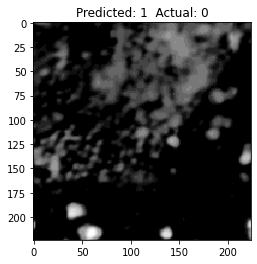

Confusion Matrix:
 [[1432  652]
 [ 230 1360]]
True Positives: 1360
False Positives: 652
True Negatives: 1432
False Negatives: 230
Precision: 0.6759
Recall: 0.8553
acc %
75.99346761023408
total INCORRECT total examples in val number of correct examples in val
882 3674 2792
val loss
0.9718233233051061


In [6]:
model.eval()
val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt  # Import for image display

with torch.no_grad():
    for inputs, labels in val_loader:
        inputs= inputs.to("cuda")
        labels = torch.Tensor(labels).to("cuda")
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        val_loss += loss.item() * inputs.size(0)
        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

        # Append predictions and labels for confusion matrix calculation
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())
        misclassified_inds = (predicted != labels).nonzero(as_tuple=True)[0]
        for misclassified_ind in misclassified_inds:
            if misclassified_ind % 300 == 0:
                misclassified_image = inputs[misclassified_ind].cpu().squeeze()  # Get misclassified image
                misclassified_image = misclassified_image.numpy()
                
                plt.imshow(misclassified_image,cmap='gray')
                plt.title(f"Predicted: {predicted[misclassified_ind].item()}  Actual: {labels[misclassified_ind].item()}")
                plt.show()  # Display the misclassified image


# Calculate confusion matrix
cm = confusion_matrix(all_labels, all_predictions)

# Extract true positives, negatives, false positives, and negatives
tn, fp, fn, tp = cm.ravel()

# Calculate Precision, Recall
precision = tp / (tp + fp)
recall = tp / (tp + fn)

# Print results (you can modify this for your needs)
print(f"Confusion Matrix:\n {cm}")
print(f"True Positives: {tp}")
print(f"False Positives: {fp}")
print(f"True Negatives: {tn}")
print(f"False Negatives: {fn}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print('acc %')
print(correct/total * 100)
print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
print(total-correct, total, correct)
print('val loss')
print(val_loss / len(val_loader.dataset))

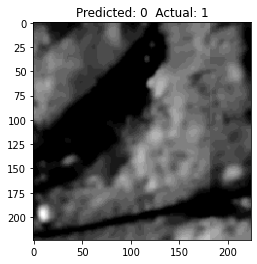

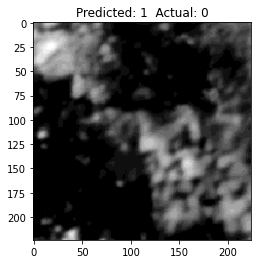

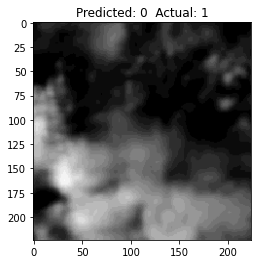

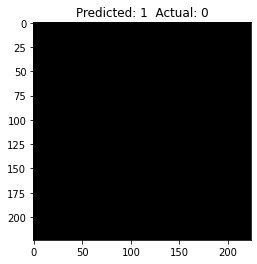

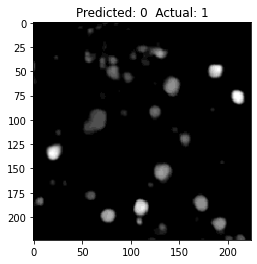

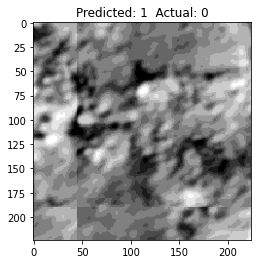

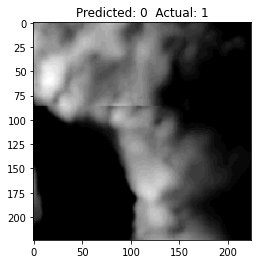

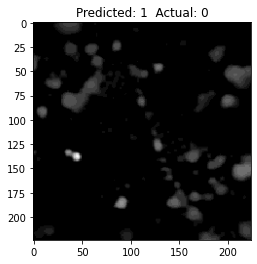

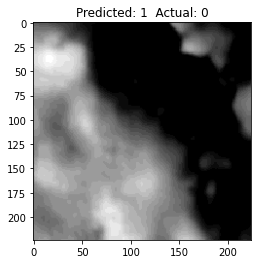

Confusion Matrix:
 [[566 265]
 [170 533]]
True Positives: 533
False Positives: 265
True Negatives: 566
False Negatives: 170
Precision: 0.6679
Recall: 0.7582
acc %
71.64276401564538
total INCORRECT total examples in val number of correct examples in val
435 1534 1099
val loss
1.0162414313139785


In [20]:
from sklearn.metrics import confusion_matrix

model2 = CustomResNet()
model2.load_state_dict(torch.load('resnet-unaugmented.pt'))
model2.eval()
val_loss = 0.0
correct = 0
total = 0
all_predictions = []
all_labels = []

import matplotlib.pyplot as plt  # Import for image display

with torch.no_grad():
    for inputs, labels in val_loader:
        outputs = model2(inputs)
        loss = criterion(outputs, labels)
        val_loss += loss.item() * inputs.size(0)
        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

        # Append predictions and labels for confusion matrix calculation
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())
        misclassified_inds = (predicted != labels).nonzero(as_tuple=True)[0]
        for misclassified_ind in misclassified_inds:
            if misclassified_ind % 500 == 0:
                misclassified_image = inputs[misclassified_ind].cpu().squeeze()  # Get misclassified image
                misclassified_image = misclassified_image.numpy()
                
                plt.imshow(misclassified_image,cmap='gray')
                plt.title(f"Predicted: {predicted[misclassified_ind].item()}  Actual: {labels[misclassified_ind].item()}")
                plt.show()  # Display the misclassified image


# Calculate confusion matrix
cm = confusion_matrix(all_labels, all_predictions)

# Extract true positives, negatives, false positives, and negatives
tn, fp, fn, tp = cm.ravel()

# Calculate Precision, Recall
precision = tp / (tp + fp)
recall = tp / (tp + fn)

# Print results (you can modify this for your needs)
print(f"Confusion Matrix:\n {cm}")
print(f"True Positives: {tp}")
print(f"False Positives: {fp}")
print(f"True Negatives: {tn}")
print(f"False Negatives: {fn}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print('acc %')
print(correct/total * 100)
print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
print(total-correct, total, correct)
print('val loss')
print(val_loss / len(val_loader.dataset))

training start


/home/angelats11/.local/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/angelats11/.local/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Epoch 1/20, Train Loss: 0.6898, Train Acc: 66.7393, Val Loss: 0.6161, Val Acc: 66.79
Epoch 2/20, Train Loss: 0.5753, Train Acc: 69.1214, Val Loss: 0.5942, Val Acc: 69.46
Epoch 3/20, Train Loss: 0.5425, Train Acc: 71.7280, Val Loss: 0.7236, Val Acc: 56.91
Epoch 4/20, Train Loss: 0.5212, Train Acc: 73.2662, Val Loss: 0.5364, Val Acc: 71.72
Epoch 5/20, Train Loss: 0.5086, Train Acc: 74.1169, Val Loss: 0.4878, Val Acc: 75.83
Epoch 6/20, Train Loss: 0.4937, Train Acc: 74.8452, Val Loss: 0.5335, Val Acc: 73.65
Epoch 7/20, Train Loss: 0.4734, Train Acc: 76.2880, Val Loss: 1.3373, Val Acc: 40.61
Epoch 8/20, Train Loss: 0.4717, Train Acc: 76.5603, Val Loss: 0.5260, Val Acc: 73.95
Epoch 9/20, Train Loss: 0.4630, Train Acc: 77.1388, Val Loss: 0.5301, Val Acc: 74.44
Epoch 10/20, Train Loss: 0.4583, Train Acc: 77.3498, Val Loss: 0.4953, Val Acc: 76.02
Epoch 11/20, Train Loss: 0.4499, Train Acc: 78.4387, Val Loss: 0.4625, Val Acc: 76.57
Epoch 12/20, Train Loss: 0.4365, Train Acc: 78.8471, Val Loss: 

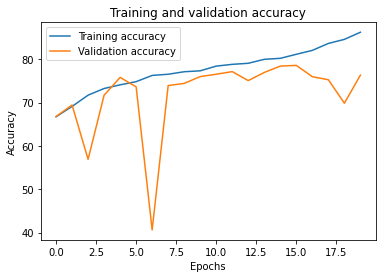

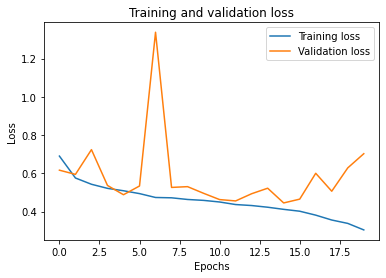

In [7]:
###########################################
########NO FINE-TUNE-- train from scratch
###########################################
class CustomResNet(nn.Module):
    def __init__(self):
        super(CustomResNet, self).__init__()
        self.resnet = models.resnet18(pretrained=False)
        # Modify the first convolution layer to accept single-channel input
        self.resnet.conv1 = nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3, bias=False)
        # If you're using a different model, adjust the input layer accordingly

    def forward(self, x):
        return self.resnet(x)

# Create an instance of the custom ResNet model
model = CustomResNet()
model.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)


print('training start')
trn_acc_list = []
val_acc_list = []
trn_loss_list = []
val_loss_list = []

# Train the model
num_epochs = 20
for epoch in range(num_epochs):
    model.train()
    correct = 0
    total = 0
    train_loss = 0.0
    for inputs, labs in train_loader:
        inputs= inputs.to("cuda")
        labs = torch.Tensor(labs).to("cuda")
        
#        print('inputs type')
#        print(inputs.dtype)
        #inputs.byte()
#        print(inputs.dtype)
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labs)
        loss.backward()
        optimizer.step()
        train_loss += loss.item() * inputs.size(0)
        _, predicted = torch.max(outputs, 1)
        total += labs.size(0)
        correct += (predicted == labs).sum().item()
    trn_acc_list.append(correct/total * 100)
    trn_loss_list.append(train_loss/len(train_loader.dataset))

    if epoch % 9 == 0: 
        torch.save(model.state_dict(), 'resnet-continental-unaugmented-scratch.pt')


    # Validate the model
    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    with torch.no_grad():
        for inputs, labs in val_loader:
            inputs= inputs.to("cuda")
            labs = torch.Tensor(labs).to("cuda")
        
            outputs = model(inputs)
            loss = criterion(outputs, labs)
            val_loss += loss.item() * inputs.size(0)
            _, predicted = torch.max(outputs, 1)
            total += labs.size(0)
            correct += (predicted == labs).sum().item()
        val_acc_list.append(correct/total * 100)
        val_loss_list.append(val_loss / len(val_loader.dataset))

    print(f'Epoch {epoch+1}/{num_epochs}, '
          f'Train Loss: {train_loss/len(train_loader.dataset):.4f}, '
          f'Train Acc: {trn_acc_list[-1]:.4f}, '
          #f'Train Acc: {trn_acc_list[-1])*100:.4f}, '
          f'Val Loss: {val_loss/len(val_loader.dataset):.4f}, '
          f'Val Acc: {(correct/total)*100:.2f}' )


# Extract the training and validation accuracy from the model history
train_accuracy = trn_acc_list
val_accuracy = val_acc_list

# Get the number of epochs
epochs = range(len(train_accuracy))

# Create the plot
plt.plot(epochs, train_accuracy, label='Training accuracy')
plt.plot(epochs, val_accuracy, label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.show()

# Extract the training and validation accuracy from the model history
train_losses = trn_loss_list
val_losses = val_loss_list

# Get the number of epochs
epochs = range(len(train_accuracy))

# Create the plot
plt.plot(epochs, train_losses, label='Training loss')
plt.plot(epochs, val_losses, label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()


In [10]:
class SimpleCNN(nn.Module):
    def __init__(self):
        super(SimpleCNN, self).__init__()
        self.conv1 = nn.Conv2d(1, 32, kernel_size=3, stride=1, padding=1)  # Input channel = 1, Output channels = 32
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)  # Downsample
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1)  # Output channels = 64
        self.fc1 = nn.Linear(64 * 56 * 56, 128)  # Flatten and connect to fully-connected layer
        self.fc2 = nn.Linear(128, 1)  # Output layer with 1 neuron for binary classification

    def forward(self, x):
        x = self.pool(torch.relu(self.conv1(x)))  # Apply ReLU activation and pooling
        x = self.pool(torch.relu(self.conv2(x)))  # Apply ReLU activation and pooling again
        x = torch.flatten(x, 1)  # Flatten
        x = torch.relu(self.fc1(x))  # Apply ReLU activation
        x = torch.sigmoid(self.fc2(x))  # Apply sigmoid activation for binary output
        return x

# Create an instance of the CNN
model = SimpleCNN()
model.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)


print('training start')
trn_acc_list = []
val_acc_list = []
trn_loss_list = []
val_loss_list = []

# Train the model
num_epochs = 20
for epoch in range(num_epochs):
    model.train()
    correct = 0
    total = 0
    train_loss = 0.0
    for inputs, labs in train_loader:
        inputs= inputs.to("cuda")
        labs = torch.Tensor(labs).to("cuda")
        
#        print('inputs type')
#        print(inputs.dtype)
        #inputs.byte()
#        print(inputs.dtype)
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labs)
        loss.backward()
        optimizer.step()
        train_loss += loss.item() * inputs.size(0)
        _, predicted = torch.max(outputs, 1)
        total += labs.size(0)
        correct += (predicted == labs).sum().item()
    trn_acc_list.append(correct/total * 100)
    trn_loss_list.append(train_loss/len(train_loader.dataset))

    if epoch % 9 == 0: 
        torch.save(model.state_dict(), 'cnn-continental-augmented.pt')


    # Validate the model
    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    with torch.no_grad():
        for inputs, labs in val_loader:
            inputs= inputs.to("cuda")
            labs = torch.Tensor(labs).to("cuda")
        
            outputs = model(inputs)
            loss = criterion(outputs, labs)
            val_loss += loss.item() * inputs.size(0)
            _, predicted = torch.max(outputs, 1)
            total += labs.size(0)
            correct += (predicted == labs).sum().item()
        val_acc_list.append(correct/total * 100)
        val_loss_list.append(val_loss / len(val_loader.dataset))

    print(f'Epoch {epoch+1}/{num_epochs}, '
          f'Train Loss: {train_loss/len(train_loader.dataset):.4f}, '
          f'Train Acc: {trn_acc_list[-1]:.4f}, '
          #f'Train Acc: {trn_acc_list[-1])*100:.4f}, '
          f'Val Loss: {val_loss/len(val_loader.dataset):.4f}, '
          f'Val Acc: {(correct/total)*100:.2f}' )


# Extract the training and validation accuracy from the model history
train_accuracy = trn_acc_list
val_accuracy = val_acc_list

# Get the number of epochs
epochs = range(len(train_accuracy))

# Create the plot
plt.plot(epochs, train_accuracy, label='Training accuracy')
plt.plot(epochs, val_accuracy, label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.show()

# Extract the training and validation accuracy from the model history
train_losses = trn_loss_list
val_losses = val_loss_list

# Get the number of epochs
epochs = range(len(train_accuracy))

# Create the plot
plt.plot(epochs, train_losses, label='Training loss')
plt.plot(epochs, val_losses, label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()


training start


../aten/src/ATen/native/cuda/Loss.cu:250: nll_loss_forward_reduce_cuda_kernel_2d: block: [0,0,0], thread: [1,0,0] Assertion `t >= 0 && t < n_classes` failed.
../aten/src/ATen/native/cuda/Loss.cu:250: nll_loss_forward_reduce_cuda_kernel_2d: block: [0,0,0], thread: [4,0,0] Assertion `t >= 0 && t < n_classes` failed.
../aten/src/ATen/native/cuda/Loss.cu:250: nll_loss_forward_reduce_cuda_kernel_2d: block: [0,0,0], thread: [8,0,0] Assertion `t >= 0 && t < n_classes` failed.
../aten/src/ATen/native/cuda/Loss.cu:250: nll_loss_forward_reduce_cuda_kernel_2d: block: [0,0,0], thread: [9,0,0] Assertion `t >= 0 && t < n_classes` failed.
../aten/src/ATen/native/cuda/Loss.cu:250: nll_loss_forward_reduce_cuda_kernel_2d: block: [0,0,0], thread: [12,0,0] Assertion `t >= 0 && t < n_classes` failed.
../aten/src/ATen/native/cuda/Loss.cu:250: nll_loss_forward_reduce_cuda_kernel_2d: block: [0,0,0], thread: [13,0,0] Assertion `t >= 0 && t < n_classes` failed.
../aten/src/ATen/native/cuda/Loss.cu:250: nll_loss

RuntimeError: CUDA error: device-side assert triggered
CUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1.
Compile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.


In [8]:

from functools import partial

import torch
import torch.nn as nn

import timm.models.vision_transformer
from pos_embed import get_2d_sincos_pos_embed


class VisionTransformer(timm.models.vision_transformer.VisionTransformer):
    """ Vision Transformer with support for global average pooling
    """
    def __init__(self, global_pool=False, **kwargs):
        super(VisionTransformer, self).__init__(**kwargs)

        # Added by Samar, need default pos embedding
        pos_embed = get_2d_sincos_pos_embed(self.pos_embed.shape[-1], int(self.patch_embed.num_patches ** .5),
                                            cls_token=True)
        self.pos_embed.data.copy_(torch.from_numpy(pos_embed).float().unsqueeze(0))

        self.global_pool = global_pool
        if self.global_pool:
            norm_layer = kwargs['norm_layer']
            embed_dim = kwargs['embed_dim']
            self.fc_norm = norm_layer(embed_dim)

            del self.norm  # remove the original norm

    def forward_features(self, x):
        B = x.shape[0]
        x = self.patch_embed(x)

        cls_tokens = self.cls_token.expand(B, -1, -1)  # stole cls_tokens impl from Phil Wang, thanks
        x = torch.cat((cls_tokens, x), dim=1)
        x = x + self.pos_embed
        x = self.pos_drop(x)

        for blk in self.blocks:
            x = blk(x)

        if self.global_pool:
            x = x[:, 1:, :].mean(dim=1)  # global pool without cls token
            outcome = self.fc_norm(x)
        else:
            x = self.norm(x)
            outcome = x[:, 0]

        return outcome


def vit_base_patch16(**kwargs):
    model = VisionTransformer(
        embed_dim=768, depth=12, num_heads=12, mlp_ratio=4, qkv_bias=True,
        norm_layer=partial(nn.LayerNorm, eps=1e-6), **kwargs)
    return model


def vit_large_patch16(**kwargs):
    model = VisionTransformer(
        embed_dim=1024, depth=24, num_heads=16, mlp_ratio=4, qkv_bias=True,
        norm_layer=partial(nn.LayerNorm, eps=1e-6), **kwargs)
    return model


def vit_huge_patch14(**kwargs):
    model = VisionTransformer(
        embed_dim=1280, depth=32, num_heads=16, mlp_ratio=4, qkv_bias=True,
        norm_layer=partial(nn.LayerNorm, eps=1e-6), **kwargs)
    return model

Epoch 1/20, Train Loss: 0.7391, Val Loss: 0.6966, Val Acc: 54.44%
Epoch 2/20, Train Loss: 0.6591, Val Loss: 0.6423, Val Acc: 63.47%
Epoch 3/20, Train Loss: 0.6466, Val Loss: 0.6477, Val Acc: 64.02%
Epoch 4/20, Train Loss: 0.6386, Val Loss: 0.6556, Val Acc: 62.71%
Epoch 5/20, Train Loss: 0.6435, Val Loss: 0.6520, Val Acc: 63.09%
Epoch 6/20, Train Loss: 0.6551, Val Loss: 0.6301, Val Acc: 65.19%
Epoch 7/20, Train Loss: 0.6402, Val Loss: 0.6361, Val Acc: 64.73%
Epoch 8/20, Train Loss: 0.6367, Val Loss: 0.6291, Val Acc: 64.37%
Epoch 9/20, Train Loss: 0.6275, Val Loss: 0.6405, Val Acc: 63.66%
Epoch 10/20, Train Loss: 0.6291, Val Loss: 0.6215, Val Acc: 64.94%
Epoch 11/20, Train Loss: 0.6229, Val Loss: 0.6271, Val Acc: 64.53%
Epoch 12/20, Train Loss: 0.6221, Val Loss: 0.6209, Val Acc: 64.43%
Epoch 13/20, Train Loss: 0.6242, Val Loss: 0.6323, Val Acc: 64.56%
Epoch 14/20, Train Loss: 0.6175, Val Loss: 0.6243, Val Acc: 65.02%
Epoch 15/20, Train Loss: 0.6190, Val Loss: 0.6332, Val Acc: 63.66%
Epoc

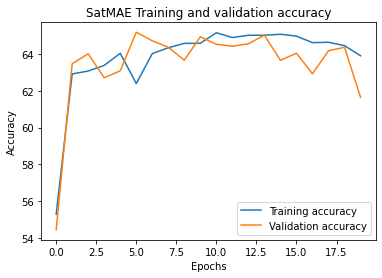

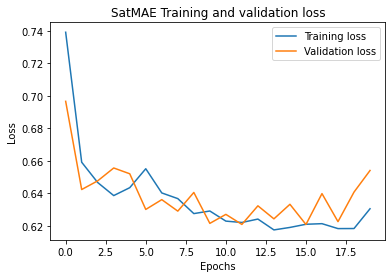

In [9]:
device = torch.device('cuda')

model = VisionTransformer()
model.to(device)
model.load_state_dict(torch.load('pretrain-vit-base-e199.pth'), strict=False)
#model.load_pretrained('pretrain-vit-base-e199.pth')
#model = create_model('vit_base_patch16', pretrained=True)


criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

trn_acc_list = []
val_acc_list = []
trn_loss_list = []
val_loss_list = []

def triplicate_channel(data):
  """
  Triplicates the channel dimension of a PyTorch tensor batch.

  Args:
    batch: A dictionary or tuple containing the data loaded by a DataLoader.
      Usually, the key 'data' holds the actual tensor batch.

  Returns:
    A dictionary or tuple with the same structure as the input, but with the 
    data tensor having its channel dimension triplicated.
  """
  # Assuming the data is in the key 'data' within the batch
  #data = batch['data']
  if len(data.shape) == 3:
    # Add a new dimension of size 1 for the missing channel
    data = data.unsqueeze(1)
    # Repeat the channel 3 times
    repeated_channel = data.repeat(1, 3, 1, 1)
  elif len(data.shape) == 4 and data.shape[1] == 1:
    # Existing single channel, repeat it 3 times
    repeated_channel = data.repeat(1, 3, 1, 1)
  else:
    # Already has 3 or more channels, no change needed
    repeated_channel = data
  #return {key: value for key, value in batch.items() if key != 'data'} | {'data': repeated_channel}
  return repeated_channel


# Train the model
num_epochs = 20
for epoch in range(num_epochs):
    model.train()
    correct = 0
    total = 0
    train_loss = 0.0
    for inputs, labels in train_loader:
        inputs = triplicate_channel(inputs).to(device)
        labels = torch.Tensor(labels).to(device)
        
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        train_loss += loss.item() * inputs.size(0)
        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
    trn_acc_list.append(correct/total * 100)
    trn_loss_list.append(train_loss/len(train_loader.dataset))

    
    if epoch % 9 == 0: 
        torch.save(model.state_dict(), 'vit-unaugmented-pretrain.pt')


    # Validate the model
    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs = triplicate_channel(inputs).to(device)
            labels = torch.Tensor(labels).to(device)
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            val_loss += loss.item() * inputs.size(0)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
        val_acc_list.append(correct/total * 100)
        val_loss_list.append(val_loss / len(val_loader.dataset))

    print(f'Epoch {epoch+1}/{num_epochs}, '
          f'Train Loss: {train_loss/len(train_loader.dataset):.4f}, '
          f'Val Loss: {val_loss/len(val_loader.dataset):.4f}, '
          f'Val Acc: {(correct/total)*100:.2f}%')

#history = model.history()


import matplotlib.pyplot as plt

# Extract the training and validation accuracy from the model history
train_accuracy = trn_acc_list
val_accuracy = val_acc_list

# Get the number of epochs
epochs = range(len(train_accuracy))

# Create the plot
plt.plot(epochs, train_accuracy, label='Training accuracy')
plt.plot(epochs, val_accuracy, label='Validation accuracy')
plt.title('SatMAE Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.show()

# Extract the training and validation accuracy from the model history
train_losses = trn_loss_list
val_losses = val_loss_list

# Get the number of epochs
epochs = range(len(train_accuracy))

# Create the plot
plt.plot(epochs, train_losses, label='Training loss')
plt.plot(epochs, val_losses, label='Validation loss')
plt.title('SatMAE Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()


True

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 16769  100 16769    0     0   121k      0 --:--:-- --:--:-- --:--:--  121k


In [40]:
!sudo nvidia-smi


sudo: nvidia-smi: command not found


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  linux-compiler-gcc-10-x86 linux-headers-5.10.0-29-common linux-kbuild-5.10
The following NEW packages will be installed:
  linux-compiler-gcc-10-x86 linux-headers-5.10.0-29-cloud-amd64
  linux-headers-5.10.0-29-common linux-kbuild-5.10
0 upgraded, 4 newly installed, 0 to remove and 7 not upgraded.
Need to get 11.8 MB of archives.
After this operation, 59.4 MB of additional disk space will be used.
Do you want to continue? [Y/n] ^C
sudo: add-apt-repository: command not found
OK
/bin/bash: line 1: distro: No such file or directory


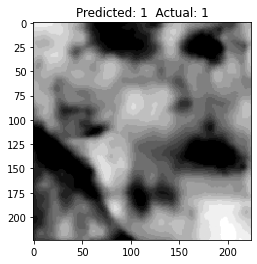

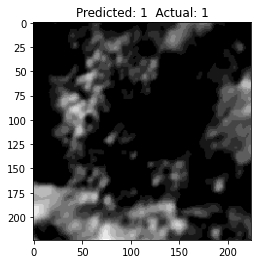

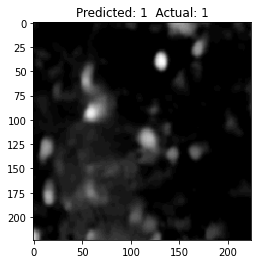

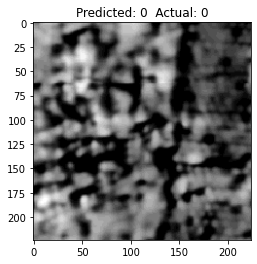

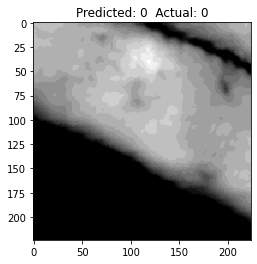

...

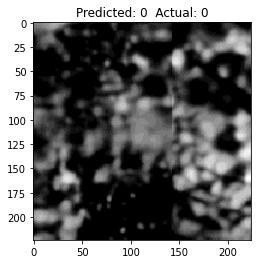

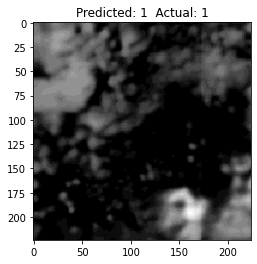

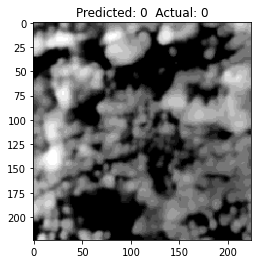

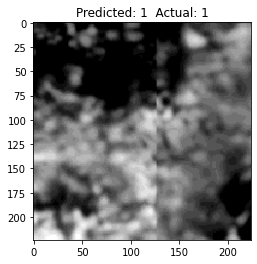

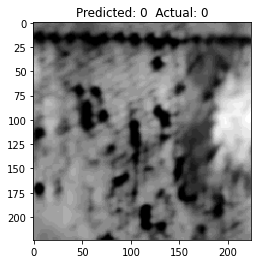

In [21]:
with torch.no_grad():
    for inputs, labels in val_loader:
        outputs = model2(inputs)
        loss = criterion(outputs, labels)
        val_loss += loss.item() * inputs.size(0)
        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

        # Append predictions and labels for confusion matrix calculation
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())
        # Check for misclassified examples and display them
        good_inds = (predicted == labels).nonzero(as_tuple=True)[0]
        for ind in good_inds:
            if ind % 10000 == 0:
                good_image = inputs[ind].cpu().squeeze()  # Get misclassified image
                good_image = good_image.numpy()
                
                plt.imshow(good_image,cmap='gray')
                plt.title(f"Predicted: {predicted[ind].item()}  Actual: {labels[ind].item()}")
                plt.show()  # Display the misclassified image


In [5]:
print(imgs.shape)
print(labs.shape)

(38330, 224, 224)
torch.Size([50])


In [8]:

print(trn_acc_list)
print(val_acc_list)
print(trn_loss_list)
print(val_loss_list)

[66.92538481607096, 74.13253326376207, 77.28606835376989, 80.67766762327159, 84.12796764936081, 88.38051134881295, 91.39381685363944, 93.3178972084529, 94.92238455517871, 95.38220714844769, 96.46490999217323, 96.38338116357944, 96.94429950430472, 97.28672058439865, 97.4726063135925, 97.33889903469867, 97.62261935820507, 97.3845551787112, 97.93242890686147, 98.00091312288025]
[71.6018784242108, 64.53169840855728, 69.17558048525959, 76.83276806678842, 81.69840855726585, 78.35898773806417, 70.33655100443517, 79.54604748238977, 87.47717192799374, 88.5729193842943, 86.49882598486825, 87.17714583876858, 88.12940255674407, 88.46856248369423, 88.78163318549439, 88.58596399686928, 83.86381424471693, 89.6034437777198, 89.0164362118445, 87.50326115314375]
[0.6689982627596955, 0.513952702672619, 0.46859226682744076, 0.4180887083790491, 0.3548772579271365, 0.271550207436007, 0.20288633151058114, 0.15943125092482524, 0.12373136685655287, 0.10976934381326947, 0.08696019707819577, 0.08868607978980457,

In [20]:
20280 / (20280 + 18050)


0.5290894860422646

In [7]:
print(len(images))
print(len(images2))

20280
18050


/home/angelats11/.local/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/angelats11/.local/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


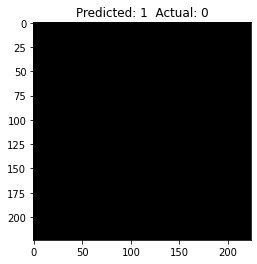

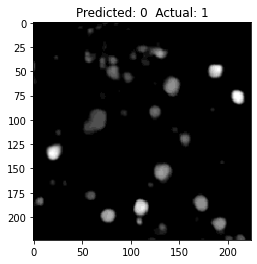

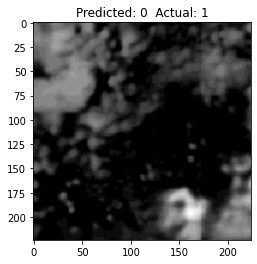

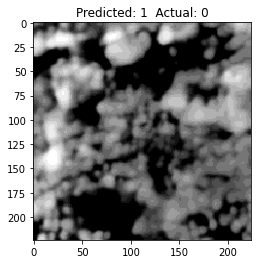

Confusion Matrix:
 [[1132  530]
 [ 340 1066]]
True Positives: 1066
False Positives: 530
True Negatives: 1132
False Negatives: 340
Precision: 0.6679
Recall: 0.7582
acc %
93.28552803129074
total INCORRECT total examples in val number of correct examples in val
103 1534 1431
val loss
0.2754122032996418
acc %
93.28552803129074
total INCORRECT total examples in val number of correct examples in val
103 1534 1431
val loss
0.2754122032996418


In [22]:
model2 = CustomResNet()
model2.load_state_dict(torch.load('resnet.pt'))
model2.eval()
val_loss = 0.0
correct = 0
total = 0
import matplotlib.pyplot as plt  # Import for image display

with torch.no_grad():
  for inputs, labels in val_loader:
    outputs = model2(inputs)
    loss = criterion(outputs, labels)
    val_loss += loss.item() * inputs.size(0)
    _, predicted = torch.max(outputs, 1)
    total += labels.size(0)
    correct += (predicted == labels).sum().item()

    # Check for misclassified examples and display them
    misclassified_inds = (predicted != labels).nonzero(as_tuple=True)[0]
    for misclassified_ind in misclassified_inds:
        if misclassified_ind % 1000 == 0:
            misclassified_image = inputs[misclassified_ind].cpu().squeeze()  # Get misclassified image
            
            # Normalize and convert to numpy format for plotting (if applicable)
            #misclassified_image = misclassified_image.permute(1, 2, 0)  # Permute for channels-first format
            # ... normalization steps specific to your data (if needed)
            misclassified_image = misclassified_image.numpy()
            
            plt.imshow(misclassified_image,cmap='gray')
            plt.title(f"Predicted: {predicted[misclassified_ind].item()}  Actual: {labels[misclassified_ind].item()}")
            plt.show()  # Display the misclassified image

  # Rest of the code (printing accuracy and loss)
# Calculate confusion matrix
cm = confusion_matrix(all_labels, all_predictions)

# Extract true positives, negatives, false positives, and negatives
tn, fp, fn, tp = cm.ravel()

# Calculate Precision, Recall
precision = tp / (tp + fp)
recall = tp / (tp + fn)

# Print results (you can modify this for your needs)
print(f"Confusion Matrix:\n {cm}")
print(f"True Positives: {tp}")
print(f"False Positives: {fp}")
print(f"True Negatives: {tn}")
print(f"False Negatives: {fn}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print('acc %')
print(correct/total * 100)
print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
print(total-correct, total, correct)
print('val loss')
print(val_loss / len(val_loader.dataset))

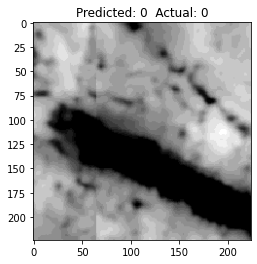

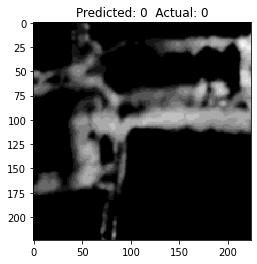

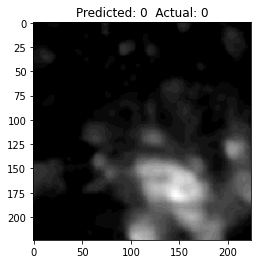

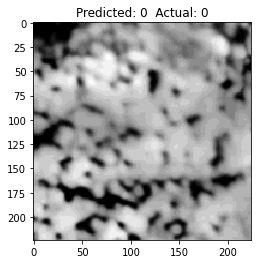

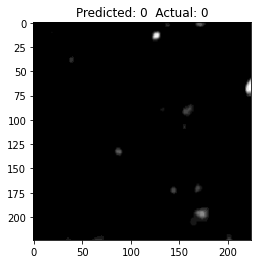

...

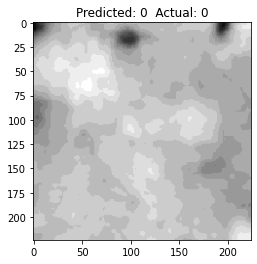

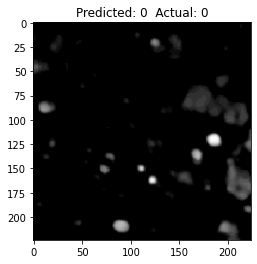

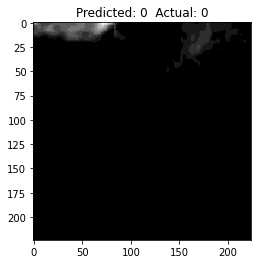

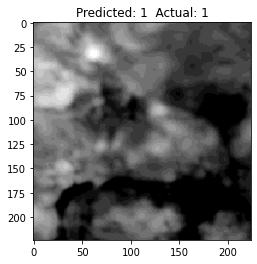

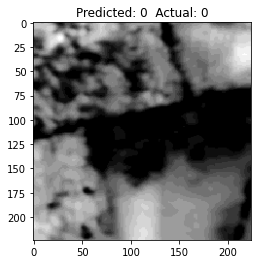

KeyboardInterrupt: 

In [18]:
model2 = CustomResNet()
model2.load_state_dict(torch.load('resnet.pt'))
model2.eval()
val_loss = 0.0
correct = 0
total = 0
import matplotlib.pyplot as plt  # Import for image display

with torch.no_grad():
  for inputs, labels in val_loader:
    outputs = model2(inputs)
    loss = criterion(outputs, labels)
    val_loss += loss.item() * inputs.size(0)
    _, predicted = torch.max(outputs, 1)
    total += labels.size(0)
    correct += (predicted == labels).sum().item()

    # Check for misclassified examples and display them
    good_inds = (predicted == labels).nonzero(as_tuple=True)[0]
    for ind in good_inds:
      if ind % 10000 == 0:
          good_image = inputs[ind].cpu().squeeze()  # Get misclassified image
          good_image = good_image.numpy()
    
          plt.imshow(good_image,cmap='gray')
          plt.title(f"Predicted: {predicted[ind].item()}  Actual: {labels[ind].item()}")
          plt.show()  # Display the misclassified image

  # Rest of the code (printing accuracy and loss)

print('acc %')
print(correct/total * 100)
print('total INCORRECT', 'total examples in val', 'number of correct examples in val')
print(total-correct, total, correct)
print('val loss')
print(val_loss / len(val_loader.dataset))

In [47]:

def get_feature_maps(model, images):
  """
  Extracts feature maps from the last convolutional layer for a batch of images.
  """
  features = []
  def hook(module, input, output):
    features.append(output.detach())
  handle = model.resnet.layer4[1].register_forward_hook(hook)
  _ = model(images)
  handle.remove()
  return features

def calculate_cam_batch(feature_maps, weights):
  """
  Calculates Class Activation Maps for a batch of images.
  """
#  cams = torch.zeros(feature_maps[0].size(0), feature_maps[0].size()[1:])
  batch_size, channel, height, width = feature_maps[0].size()
  cams = torch.zeros(batch_size, channel, height, width)
  #for i, weight in enumerate(weights):
  #  cams += weight * feature_maps[0][i, :, :]
  return cams

def visualize_cam_batch(model, val_loader, target_class, device):
  """
  Visualizes Class Activation Maps overlaid on validation images (batch-wise).
  """
  # Get model on device (if using GPU)
  model.to(device)

  # Iterate over validation loader
  for images, labels in val_loader:
    images = images.to(device)  # Send images to device

    # Get feature maps
    feature_maps = get_feature_maps(model.eval(), images)

    # Get weights for the target class
    params = list(model.resnet.fc.parameters())  # Assuming classifier at the end
    target_layer = params[-1]  # Last layer is the linear layer
    #weights = target_layer[target_class, :]  # Weights for target class
    weights = target_layer[target_class]
    
    # Calculate CAMs
    cams = calculate_cam_batch(feature_maps, weights)

    # Normalize and resize CAMs to image size (assuming all images same size)
    for i in range(len(cams)):
      cam = cams[i]
      cam = cam - torch.min(cam)  # Normalize between 0-1
      cam = cam / torch.max(cam)
      cam = torch.nn.functional.interpolate(cam.unsqueeze(0), size=(images.size(2), images.size(3)), mode='bilinear')

      # Convert to numpy and visualize (you can modify this loop for each image)
      cam = cam.squeeze().cpu().numpy()
      # Apply the CAM to the grayscale image (adjust alpha for visualization)
      heatmap = (images.squeeze(0).cpu().numpy()[i] * 0.5 + cam * 0.5)
      # You can use OpenCV or Matplotlib for visualization here
      # ...

# Example usage
model = CustomResNet()
model.load_state_dict(torch.load('resnet.pt'))  # Load weights
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Assuming your validation data loader is called val_loader
visualize_cam_batch(model, val_loader, target_class=0, device=device)

KeyboardInterrupt: 

In [38]:

from pytorch_grad_cam import GradCAM
class FeatureExtractor(nn.Module):
  def __init__(self, model):
    super(FeatureExtractor, self).__init__()
    self.model = model
    self.features = None

  def forward(self, x):
    # Forward pass through the original model layers
    for name, module in self.model._modules.items():
      if name == 'last_conv_layer_name':  # Replace with actual layer name
        self.features = module(x)  # Capture features before GAP
      x = module(x)
    return x

model = CustomResNet()
model.load_state_dict(torch.load('resnet.pt'), strict=False)  # Set strict=False to ignore unexpected keys
model.eval()
model = FeatureExtractor(model)
target_layers = model.features

cam = GradCAM(model=model, target_layers=target_layers)
for inputs, labels in val_loader:
    grayscale_cam = cam(input_tensor=inputs, targets=targets)

grayscale_cam = grayscale_cam[0, :]
visualization = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=False)

AttributeError: 'FeatureExtractor' object has no attribute 'layer4'

In [36]:

'''
from gradcam import models as gcmodels  # Import the ResNet class

class FeatureExtractor(nn.Module):
  def __init__(self, model):
    super(FeatureExtractor, self).__init__()
    self.model = model
    self.features = None

  def forward(self, x):
    # Forward pass through the original model layers
    for name, module in self.model._modules.items():
      if name == 'last_conv_layer_name':  # Replace with actual layer name
        self.features = module(x)  # Capture features before GAP
      x = module(x)
    return x

def calculate_CAM(model, features, target_label):
  grad_cam = gcmodels.ResNet(model = model.resnet)  # Wrap model for Grad-CAM
  target_layers = [model.resnet.layer4[1]]  # Replace with desired layer(s) for CAM (last conv layer of block 4 here)
  grayscale_cam = grad_cam(target_layers=target_layers, inputs=features, targets=target_label)
  grayscale_cam = grayscale_cam[0, 0]  # Extract channel and single batch data

  # Normalize and convert to RGB (assuming 3 channels for your image)
  cam = grayscale_cam.unsqueeze(0)  # Add channel dimension
  cam = F.relu(cam)  # Apply ReLU activation
  cam = cam / torch.max(cam)  # Normalize
  cam = cam.repeat(3, 1, 1)  # Repeat for RGB channels (if applicable)
  return cam

# Wrap your model with the feature extractor
model = CustomResNet()
model.load_state_dict(torch.load('resnet.pt'), strict=False)  # Set strict=False to ignore unexpected keys
model.eval()

# Wrap the model with FeatureExtractor (optional)
#model = FeatureExtractor(model)
# Assuming feature maps are stored in 'features'
for inputs, labels in val_loader:
  # ... rest of your code
  outputs = model(inputs)
  # Access feature maps from the model (using hook or model modification)
  #features = model.features  # Example for hook approach

  features = model.resnet.layer4[1]
  target_label = torch.tensor(0)
  # Calculate CAM using your preferred method (refer to libraries below)
  cam = calculate_CAM(model, features, target_label)
  # Visualize or analyze the CAM (refer to libraries below)

'''

ModuleNotFoundError: No module named 'gradcam'

In [34]:
!pip show grad-cam

Name: grad-cam
Version: 1.5.0
Summary: Many Class Activation Map methods implemented in Pytorch for classification, segmentation, object detection and more
Home-page: https://github.com/jacobgil/pytorch-grad-cam
Author: Jacob Gildenblat
Author-email: jacob.gildenblat@gmail.com
License: 
Location: /home/angelats11/anaconda3/lib/python3.9/site-packages
Requires: torch, ttach, numpy, scikit-learn, matplotlib, torchvision, Pillow, tqdm, opencv-python
Required-by: 


In [ ]:
import torch
from torch import nn

num_classes = 2
'''
# Define the model
class SimpleCNN(nn.Module):
  def __init__(self, num_classes):
    super(SimpleCNN, self).__init__()
    self.conv1 = nn.Conv2d(1, 32, kernel_size=3, padding=1)  # Input channels=1 (grayscale)
    self.pool = nn.MaxPool2d(2, 2)
    self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
    self.fc1 = nn.Linear(112 * 112 * 64, 64)  # Assuming input image is normalized
    self.fc2 = nn.Linear(64, num_classes)

  def forward(self, x):
    x = self.pool(nn.functional.relu(self.conv1(x)))
    x = self.pool(nn.functional.relu(self.conv2(x)))
    x = torch.flatten(x, start_dim=0, end_dim=1)  # Flatten after pooling
    x = nn.functional.relu(self.fc1(x))
    x = self.fc2(x)
    return x

# Create an instance of the model
model = SimpleCNN(num_classes)
'''

import torch
import torch.nn as nn

class CNN(nn.Module):
    def __init__(self):
        super(CNN, self).__init__()
        self.conv1 = nn.Conv2d(1, 32, kernel_size=3, stride=1, padding=1)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2, padding=0)
        self.fc1 = nn.Linear(128 * 56 * 56, 128)
        self.fc2 = nn.Linear(128, 2)  

    def forward(self, x):
        x = torch.relu(self.conv1(x))
        x = self.pool(x)
        x = torch.relu(self.conv2(x))
        x = self.pool(x)
        x = torch.relu(self.conv3(x))
        x = self.pool(x)
        x = x.view(-1, 128 * 56 * 56)
        x = torch.relu(self.fc1(x))
        x = self.fc2(x)
        return x

# Instantiate the model
model = CNN()


In [34]:
dropout_prob = .3
class SimpleCNN(nn.Module):
    def __init__(self, num_classes=2):
        super(SimpleCNN, self).__init__()
        self.conv1 = nn.Conv2d(3, 16, kernel_size=3, stride=1, padding=1)
        self.relu1 = nn.ReLU()
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.conv2 = nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=1)
        self.relu2 = nn.ReLU()
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.fc1 = nn.Linear(32 * 39 * 39, 64)  # Adjusted for 156x156 input
        self.relu3 = nn.ReLU()
        self.fc2 = nn.Linear(64, num_classes)

    def forward(self, x):
        x = self.conv1(x)
        x = self.relu1(x)
        x = self.pool1(x)
        x = self.conv2(x)
        x = self.relu2(x)
        x = self.pool2(x)
        x = x.view(x.size(0), -1)
        x = self.fc1(x)
        x = self.relu3(x)
        x = self.fc2(x)
        return x

class ComplexCNN(nn.Module):
    def __init__(self, num_classes=2, dropout_prob=0.5):
        super(ComplexCNN, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, stride=1, padding=1)
        self.relu1 = nn.ReLU()
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1)
        self.relu2 = nn.ReLU()
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1)
        self.relu3 = nn.ReLU()
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.fc1 = nn.Linear(128 * 19 * 19, 512)  # Adjusted for 156x156 input
        self.relu4 = nn.ReLU()
        self.dropout = nn.Dropout(dropout_prob)
        self.fc2 = nn.Linear(512, num_classes)

    def forward(self, x):
        x = self.conv1(x)
        x = self.relu1(x)
        x = self.pool1(x)

        x = self.conv2(x)
        x = self.relu2(x)
        x = self.pool2(x)

        x = self.conv3(x)
        x = self.relu3(x)
        x = self.pool3(x)

        x = x.view(x.size(0), -1)
        x = self.fc1(x)
        x = self.relu4(x)
        x = self.dropout(x)
        x = self.fc2(x)
        return x


class LSTMCNN(nn.Module):
    def __init__(self, num_classes=2):
        super(LSTMCNN, self).__init__()
        
        # Convolutional layers
        self.conv1 = nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1)
        self.conv2 = nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1)
        self.conv3 = nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1)
        
        # Recurrent layers
        self.lstm = nn.LSTM(128 * 50 * 50, 256, batch_first=True)
        
        # Fully connected layers
        self.fc1 = nn.Linear(256, 128)
        self.fc2 = nn.Linear(128, num_classes)

    def forward(self, x):
        # Convolutional layers
        x = F.relu(self.conv1(x))
        x = F.relu(self.conv2(x))
        x = F.relu(self.conv3(x))
        
        # Reshape for recurrent layer
        x = x.view(-1, 128 * 50 * 50)
        
        # Recurrent layer
        x, _ = self.lstm(x.unsqueeze(1))  # Add a temporal dimension
        
        # Global average pooling
        x = x.mean(dim=1)
        
        # Fully connected layers
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        
        return x

import torchvision.models as models

class SmallComplexModel(nn.Module):
    def __init__(self, num_classes=2):
        super(SmallComplexModel, self).__init__()
        
        # Load the pre-trained MobileNetV2 model
        mobilenet_v2 = models.mobilenet_v2(pretrained=True)
        
        # Remove the classification head of MobileNetV2
        self.features = mobilenet_v2.features
        
        # Add custom layers for your task
        self.avgpool = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Sequential(
            nn.Dropout(0.2),
            nn.Linear(1280, num_classes)
        )

    def forward(self, x):
        # Feature extraction with MobileNetV2
        x = self.features(x)
        
        # Global average pooling
        x = self.avgpool(x)
        
        # Reshape for fully connected layer
        x = x.view(x.size(0), -1)
        
        # Fully connected layers
        x = self.fc(x)
        
        return x

# Create an instance of the model
#model = SmallComplexModel().to(device)

class ResModel(nn.Module):
    def __init__(self, num_classes=2):
        super(ResModel, self).__init__()
        
        # Load the pre-trained MobileNetV2 model
        resnet18 = models.resnet18(pretrained=True)
        
       # Remove the classification head of ResNet18
        self.features = nn.Sequential(*list(resnet18.children())[:-1])

        # Add custom layers for your task
#        self.fc = nn.Sequential(
#            nn.Flatten(),
#            nn.Linear(512, num_classes)
#        )
        self.fc = nn.Sequential(
            nn.Flatten(),
            nn.Linear(512, 512),  # You can adjust the output size of the linear layer
            nn.ReLU(),           # Add activation function
            nn.Dropout(p=dropout_prob),  # Dropout layer
            nn.Linear(512, num_classes)
        )


    def forward(self, x):
        # Feature extraction with ResNet18
        x = self.features(x)

        # Fully connected layers
        x = self.fc(x)

        return x

model = ResModel().to(device)
        

# Print the model architecture
#print(model)
# Instantiate the model
#complex_model = ComplexCNN().to(device)
#model = ComplexCNN().to(device)
# Instantiate the model
#complex_model = ComplexCNN().to(device)
#model = ComplexCNN().to(device)

/home/angelats11/.local/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/angelats11/.local/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


(4464, 224, 224)
[0 0 0 ... 1 1 1]
(4464,)


RuntimeError: Given groups=1, weight of size [16, 3, 3, 3], expected input[64, 1, 224, 224] to have 3 channels, but got 1 channels instead

In [5]:
shape = (160,160,3)

from torch.utils.data.sampler import SubsetRandomSampler

class CustomDataset(Dataset):
    def __init__(self, data_dir, transform=None):
        self.data_dir = data_dir
        self.transform = transform
        self.file_list = os.listdir(data_dir)

    def __len__(self):
        return len(self.file_list)

    def __getitem__(self, idx):
        img_name = os.path.join(self.data_dir, self.file_list[idx])
        if img_name in anoms:
          #return torch.zeros(50,50,3), -1
          return torch.zeros(160,160,3)
        image = np.squeeze(np.load(img_name, allow_pickle=True))
        #image = np.squeeze(np.load(img_name))[:,53:103,53:103]#.unsqueeze(0).unsqueeze(0)
        #print(image)
        #print(image.shape)
        #print(image)
        #if self.transform:
        #    image = self.transform(image)
        label = 0 if "orchard" in self.data_dir else 1  # Assuming "orchard" is class 0 and "forest" is class 1
        return image, label, img_name

# Data augmentation and normalization
transform = transforms.Compose([transforms.ToTensor()])#, transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])#, transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

# Create data loaders for training and validation
#orchard_dataset = CustomDataset(orchard_path, transform)
#forest_dataset = CustomDataset(forest_path, transform)
dataset = CustomDataset(orchard_path, transform) + CustomDataset(forest_path, transform)
split_ratio = 0.8
num_data = len(dataset)
split = int(np.floor(split_ratio * num_data))
indices = list(range(num_data))

indices = [idx for idx in indices if dataset[idx][1] != -1]

np.random.shuffle(indices)


# Create data samplers for training and testing sets
train_indices, test_indices = indices[:split], indices[split:]
train_sampler = SubsetRandomSampler(train_indices)
test_sampler = SubsetRandomSampler(test_indices)

# Create data loaders for training and testing
train_loader = DataLoader(dataset, batch_size=batch_size, sampler=train_sampler)
test_loader = DataLoader(dataset, batch_size=batch_size, sampler=test_sampler)
# Use DataLoader to handle batching and shuffling
#orchard_loader = DataLoader(orchard_dataset, batch_size=batch_size, shuffle=True)
#forest_loader = DataLoader(forest_dataset, batch_size=batch_size, shuffle=True)

In [22]:
'''
import torch.nn as nn

class rgb50CNN(nn.Module):
    def __init__(self, num_classes=2):
        super(rgb50CNN, self).__init__()
        # Define your model layers
        self.conv1 = nn.Conv2d(3, 16, kernel_size=3, stride=1, padding=1)
        self.relu1 = nn.ReLU()
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.conv2 = nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=1)
        self.relu2 = nn.ReLU()
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.fc1 = nn.Linear(32 * 12 * 12, 64)  # Adjusted for 50x50 input
        self.relu3 = nn.ReLU()
        self.fc2 = nn.Linear(64, num_classes)

    def forward(self, x):
        x = self.conv1(x)
        x = self.relu1(x)
        x = self.pool1(x)
        x = self.conv2(x)
        x = self.relu2(x)
        x = self.pool2(x)
        x = x.view(x.size(0), -1)  # Ensure correct flattening
        x = self.fc1(x)
        x = self.relu3(x)
        x = self.fc2(x)
        return x

# Create an instance of the modified model
model = rgb50CNN().to(device)
'''

In [6]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)


In [9]:
import torch.nn.functional as F
num_epochs = 30

def train(model, train_loader, optimizer, criterion):
    model.train()
    total_loss = 0
    correct = 0
    total = 0
    for batch, (images, labels, img_name) in enumerate(train_loader):
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        _, predicted = outputs.max(1)
        total += labels.size(0)
        correct += predicted.eq(labels).sum().item()

    train_accuracy = 100 * correct / total
    return total_loss / (batch + 1), train_accuracy

def validate(model, val_loader, criterion):
    model.eval()
    total_loss = 0
    correct = 0
    total = 0
    misclassified_paths = []
    with torch.no_grad():
        for batch, (images, labels, img_name) in enumerate(val_loader):
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            loss = criterion(outputs, labels)

            total_loss += loss.item()
            _, predicted = outputs.max(1)
            total += labels.size(0)
            correct += predicted.eq(labels).sum().item()
            incorrect_indices = (predicted != labels).nonzero()
            misclassified_paths.extend([img_name[i] for i in incorrect_indices])


    val_accuracy = 100 * correct / total
    return total_loss / (batch + 1), val_accuracy, misclassified_paths


In [ ]:

# ... (optimizer and criterion)

# Training loop with validation
trnl = []
vall = []
trna=[]
vala=[]
epochs = [x for x in range(num_epochs)]
mistakes = []
for epoch in range(num_epochs):
    train_loss, train_accuracy = train(model, train_loader, optimizer, criterion)
    val_loss, val_accuracy, misclf = validate(model, test_loader, criterion)
    trnl.append(train_loss)
    vall.append(val_loss)
    trna.append(train_accuracy)
    vala.append(val_accuracy)
    print(f"Epoch [{epoch + 1}/{num_epochs}] - Train Loss: {train_loss:.4f}, Train Acc: {train_accuracy:.2f}%, Val Loss: {val_loss:.4f}, Val Acc: {val_accuracy:.2f}%")
    if epoch == 20:
        print('epoch 20 erros')
    if epoch == num_epochs-1:
        print('last epoch errors')
        print(misclf)
        mistakes = misclf
        
print("Training complete.")
import matplotlib.pyplot as plt
plt.plot(epochs,trnl,label='train loss')
plt.plot(epochs,vall,label='val loss')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend()
plt.show()

plt.plot(epochs,trna,label='train acc')
plt.plot(epochs,vala,label='val acc')
plt.xlabel('epoch')
plt.ylabel('accuracy')
plt.legend()
plt.show()

Epoch [1/30] - Train Loss: 0.4069, Train Acc: 82.00%, Val Loss: 0.4287, Val Acc: 84.25%
Epoch [2/30] - Train Loss: 0.4379, Train Acc: 82.00%, Val Loss: 0.4699, Val Acc: 79.50%
Epoch [3/30] - Train Loss: 0.3767, Train Acc: 85.00%, Val Loss: 0.4481, Val Acc: 84.50%
Epoch [4/30] - Train Loss: 0.3571, Train Acc: 85.31%, Val Loss: 0.3518, Val Acc: 85.50%
Epoch [5/30] - Train Loss: 0.3640, Train Acc: 86.25%, Val Loss: 0.4041, Val Acc: 82.75%
Epoch [6/30] - Train Loss: 0.3536, Train Acc: 86.31%, Val Loss: 0.3646, Val Acc: 85.00%
Epoch [7/30] - Train Loss: 0.3276, Train Acc: 86.38%, Val Loss: 0.3249, Val Acc: 85.75%


In [ ]:
#model.train(train_loader)

ValueError: ignored

NEXT: THE PART WHERE WE TRAIN ON SENTINEL-2 ALONE AS A BENCHMARK (BOTTOM TIE PERFOMANCE TO BEAT)


In [ ]:
#orchard_path = "mountdata/euroorchards2-50m"
#forest_path = "mountdata/euroforests2-50m"

orchard_path = 'mountdata/zaforchards2-50m'
forest_path = 'mountdata/zafforests2-50m'

In [ ]:
#import tifffile
from PIL import Image
import rasterio as rio

#import cv2
#import gdal
from torch.utils.data.sampler import SubsetRandomSampler
#import imagecodecs
from skimage import io

anomalies = []
class CustomDatasetS2(Dataset):
    def __init__(self, data_dir, transform=None, num_channel=12):
        self.data_dir = data_dir
        self.transform = transform
        self.file_list = os.listdir(data_dir)
        self.num_channel = num_channel

    def __len__(self):
        return len(self.file_list)

    def __getitem__(self, idx):
        img_name = os.path.join(self.data_dir, self.file_list[idx])
        if img_name.endswith('.tif'):
            if img_name in anomalies:
                pass
            with rio.open(img_name) as img :
                image= img.read()
                image = image.astype('float32')
    
                image = image[:self.num_channel,2:52,2:52]
                image = np.transpose(image,(1,2,0))
                #print
                if image.shape != (50,50,self.num_channel):
                    print('anomaly')
                    anomalies.append(img_name)
                    return torch.zeros(50, 50,self.num_channel), -1
                    #return torch.zeros(10, 10,12), -1
                
                if self.transform:
                    image = self.transform(image)
            label = 0 if "orchard" in self.data_dir else 1  # Assuming "orchard" is class 0 and "forest" is class 1
            return image, label

transform = transforms.Compose([transforms.ToTensor()])
bicubtransform = transforms.Compose([transforms.ToPILImage(), transforms.Resize((160, 160), interpolation=Image.BICUBIC), transforms.ToTensor()])

datasets2 = CustomDatasetS2(orchard_path, transform, 3) + CustomDatasetS2(forest_path, transform, 3)
#split_ratio = 0.8
#num_data = len(datasets2)
#split = int(np.floor(split_ratio * num_data))
#indices = list(range(num_data))
#indices = [idx for idx in indices if datasets2[idx][1] != -1]
#np.random.shuffle(indices)


# Create data samplers for training and testing sets
train_indices, test_indices = indices[:split], indices[split:]
train_sampler = SubsetRandomSampler(train_indices)
test_sampler = SubsetRandomSampler(test_indices)

# Create data loaders for training and testing
train_loader = DataLoader(datasets2, batch_size=batch_size, sampler=train_sampler)
test_loader = DataLoader(datasets2, batch_size=batch_size, sampler=test_sampler)

print(anomalies)

In [ ]:
#input_size = (3, 50, 50)  # Assuming 3 channels, 160x160 size
#dummy_input = torch.randn(1, *input_size).to(device)  # Create a dummy input
#output = model(dummy_input)

In [ ]:
import rasterio as rio
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)
# Training loop with validation
trnl = []
vall = []
trna=[]
vala=[]
epochs = [x for x in range(num_epochs)]
mistakes_s2 = []
for epoch in range(num_epochs):
    train_loss, train_accuracy = train(model, train_loader, optimizer, criterion)
    val_loss, val_accuracy, misclf = validate(model, test_loader, criterion)
    trnl.append(train_loss)
    vall.append(val_loss)
    trna.append(train_accuracy)
    vala.append(val_accuracy)
    print(f"Epoch [{epoch + 1}/{num_epochs}] - Train Loss: {train_loss:.4f}, Train Acc: {train_accuracy:.2f}%, Val Loss: {val_loss:.4f}, Val Acc: {val_accuracy:.2f}%")
    if epoch == 20:
        print('epoch 20 erros')
    if epoch == num_epochs-1:
        print('last epoch errors')
        print(misclf)
        mistakes_s2 = misclf
        
print("Training complete.")
import matplotlib.pyplot as plt
plt.plot(epochs,trnl,label='train loss')
plt.plot(epochs,vall,label='val loss')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend()
plt.show()

plt.plot(epochs,trna,label='train acc')
plt.plot(epochs,vala,label='val acc')
plt.xlabel('epoch')
plt.ylabel('accuracy')
plt.legend()
plt.show()

Training complete.


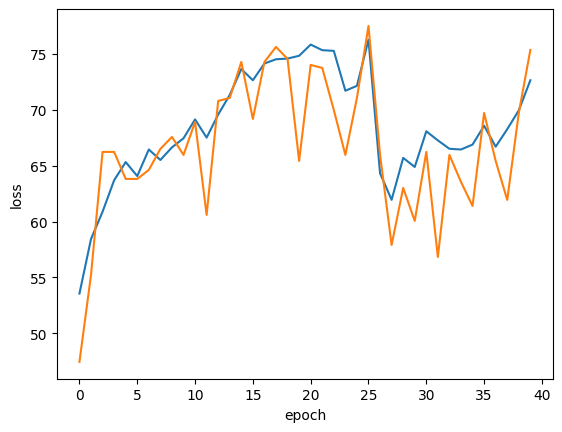

In [14]:
print("Training complete.")
import matplotlib.pyplot as plt
plt.plot(epochs,trna,label='train loss')
plt.plot(epochs,vala,label='val loss')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.show()

Training complete.


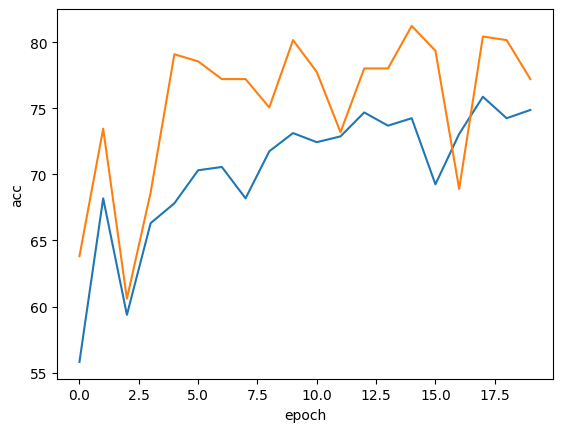

In [ ]:
print("Training complete.")
import matplotlib.pyplot as plt
plt.plot([x for x in range(20)],trna,label='train loss')
plt.plot([x for x in range(20)],vala,label='val loss')
plt.xlabel('epoch')
plt.ylabel('acc')
plt.show()

In [ ]:
# Convert the NumPy array to a NumPy array with data type 'uint8'

class CustomDatasetS2(Dataset):
    def __init__(self, data_dir, transform=None, num_channel=12):
        self.data_dir = data_dir
        self.transform = transform
        self.file_list = os.listdir(data_dir)
        self.num_channel = num_channel

    def __len__(self):
        return len(self.file_list)

    def __getitem__(self, idx):
        img_name = os.path.join(self.data_dir, self.file_list[idx])
        if img_name.endswith('.tif'):
            if img_name in anomalies:
                pass
            with rio.open(img_name) as img :
                image= img.read()
                image = image.astype('float32')
                image = (image * 255).astype('uint8')
                image = image[:self.num_channel,2:52,2:52]
                image = np.transpose(image,(1,2,0))
                #print
                if image.shape != (50,50,self.num_channel):
                    print('anomaly')
                    anomalies.append(img_name)
                    return torch.zeros(50, 50,self.num_channel), -1
                    #return torch.zeros(10, 10,12), -1
                
                if self.transform:
                    image = self.transform(image)
            label = 0 if "orchard" in self.data_dir else 1  # Assuming "orchard" is class 0 and "forest" is class 1
            return image, label


In [ ]:
num_epochs = 40
datasets2bicub = CustomDatasetS2(orchard_path, bicubtransform, 3) + CustomDatasetS2(forest_path, bicubtransform, 3)

# Create data loaders for training and testing
train_loader = DataLoader(datasets2bicub, batch_size=batch_size, sampler=train_sampler)
test_loader = DataLoader(datasets2bicub, batch_size=batch_size, sampler=test_sampler)

model = ResModel().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)
# Training loop with validation
trnl = []
vall = []
trna=[]
vala=[]
epochs = [x for x in range(num_epochs)]
mistakes_bicub = []
for epoch in range(num_epochs):
    train_loss, train_accuracy = train(model, train_loader, optimizer, criterion)
    val_loss, val_accuracy, misclf = validate(model, test_loader, criterion)
    trnl.append(train_loss)
    vall.append(val_loss)
    trna.append(train_accuracy)
    vala.append(val_accuracy)
    print(f"Epoch [{epoch + 1}/{num_epochs}] - Train Loss: {train_loss:.4f}, Train Acc: {train_accuracy:.2f}%, Val Loss: {val_loss:.4f}, Val Acc: {val_accuracy:.2f}%")
    if epoch == 20:
        print('epoch 20 erros')
    if epoch == num_epochs-1:
        print('last epoch errors')
        print(misclf)
        mistakes_bicub = misclf
        
print("Training complete.")
import matplotlib.pyplot as plt
plt.plot(epochs,trnl,label='train loss')
plt.plot(epochs,vall,label='val loss')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend()
plt.show()

plt.plot(epochs,trna,label='train acc')
plt.plot(epochs,vala,label='val acc')
plt.xlabel('epoch')
plt.ylabel('accuracy')
plt.legend()
plt.show()